In [1]:
# Importing dependencies
import glob
import pickle
import numpy as np
import numpy
from matplotlib import pyplot as plt
from music21 import converter, instrument, note, chord, stream
import pathlib
import os
# http://pytorch.org/
from os.path import exists, join
# from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
# platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())
# cuda_output = !ldconfig -p|grep cudart.so|sed -e 's/.*\.\([0-9]*\)\.\([0-9]*\)$/cu\1\2/'
# accelerator = cuda_output[0] if exists('/dev/nvidia0') else 'cpu'

# !pip install -q http://download.pytorch.org/whl/{accelerator}/torch-1.0.0-{platform}-linux_x86_64.whl torchvision
device = 'cuda'
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [2]:
HOME = "./Data"
MUSICIAN = 'chopin'

#file = join(HOME, "chopin/chpn_op25_e1_format0.mid")
#midi = converter.parse(file)
#notes_to_parse = midi.flat.notes
#for element in notes_to_parse[:10]:
 # print(element, element.offset)

In [3]:
notes = []

notes_file_path = os.path.join(HOME, MUSICIAN, 'notes.pickle')
if os.path.exists(notes_file_path):
    with open(notes_file_path , 'rb') as f:
        notes = pickle.load(f)
else:
    for i ,file in enumerate(glob.glob(os.path.join(HOME, MUSICIAN,"*.mid"))):
      midi_p = pathlib.Path(file)
      midi_file_name = midi_p.stem
    #   if os.path.exists(os.path.join(HOME, MUSICIAN, '{}_notes.pickle'.format(midi_file_name))):
    #       with open(os.path.join(HOME, MUSICIAN, '{}_notes.pickle'.format(midi_file_name)), 'rb') as filepath:
    #         notes_ = pickle.load(filepath)
    #       notes += (notes_)
    #       continue
      midi = converter.parse(file)
      print('\r', 'Parsing file ', i, " ",file, end='')
      notes_to_parse = None
      #   try: # file has instrument parts
    #   s2 = instrument.partitionByInstrument(midi)
    #   notes_to_parse = s2.parts[0].recurse() 
      #   except: # file has notes in a flat structure
      notes_to_parse = midi.flat.notes
      for element in notes_to_parse:
        if isinstance(element, note.Note):
          notes.append(str(element.pitch))
        elif isinstance(element, chord.Chord):
          notes.append('.'.join(str(n) for n in element.normalOrder))
    with open(join(HOME, MUSICIAN, 'notes.pickle'), 'wb') as filepath:
      pickle.dump(notes, filepath)     

In [4]:
#We obtain the number of different notes in our dataset, because this will be the number of possible output classes of our model.
# Count different possible outputs
n_vocab = (len(set(notes)))

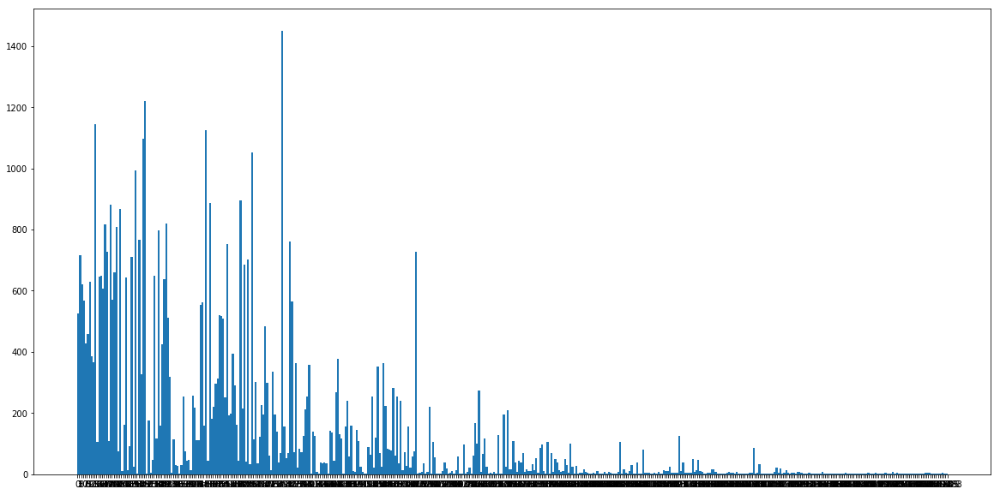

In [5]:
%matplotlib inline
plt.figure(figsize=(20,10))
plt.hist(notes, bins=n_vocab, )
plt.show()

In [6]:
def to_categorical(y, num_classes=None, dtype='float32'):
    """Converts a class vector (integers) to binary class matrix.
    E.g. for use with categorical_crossentropy.
    # Arguments
        y: class vector to be converted into a matrix
            (integers from 0 to num_classes).
        num_classes: total number of classes.
        dtype: The data type expected by the input, as a string
            (`float32`, `float64`, `int32`...)
    # Returns
        A binary matrix representation of the input. The classes axis
        is placed last.
    # Example
    ```python
    # Consider an array of 5 labels out of a set of 3 classes {0, 1, 2}:
    > labels
    array([0, 2, 1, 2, 0])
    # `to_categorical` converts this into a matrix with as many
    # columns as there are classes. The number of rows
    # stays the same.
    > to_categorical(labels)
    array([[ 1.,  0.,  0.],
           [ 0.,  0.,  1.],
           [ 0.,  1.,  0.],
           [ 0.,  0.,  1.],
           [ 1.,  0.,  0.]], dtype=float32)
    ```
    """

    y = np.array(y, dtype='int')
    input_shape = y.shape
    if input_shape and input_shape[-1] == 1 and len(input_shape) > 1:
        input_shape = tuple(input_shape[:-1])
    y = y.ravel()
    if not num_classes:
        num_classes = np.max(y) + 1
    n = y.shape[0]
    categorical = np.zeros((n, num_classes), dtype=dtype)
    categorical[np.arange(n), y] = 1
    output_shape = input_shape + (num_classes,)
    categorical = np.reshape(categorical, output_shape)
    return categorical

In [7]:
sequence_length = 100
# get all pitch names
pitchnames = sorted(set(item for item in notes))
# create a dictionary to map pitches to integers
note_to_int = dict((note, number) for number, note in enumerate(pitchnames))
network_input = []
network_output = []
for i in range(0, len(notes) - sequence_length, 1):
  sequence_in = notes[i:i + sequence_length] # Size sequence_length
  sequence_out = notes[i + sequence_length]  # Size 1
  # Map pitches of sequence_in to integers
  network_input.append([note_to_int[char] for char in sequence_in])
  # Map integer of sequence_out to an integer
  network_output.append(note_to_int[sequence_out]) 
n_patterns = len(network_input)
# reshape the input into a format compatible with LSTM layers
network_input = numpy.reshape(network_input, (n_patterns, sequence_length, 1))
# normalize input
network_input = network_input / float(n_vocab)
network_output = np.array(network_output)

In [8]:
class LSTMGenerator(nn.Module):
  def __init__(self, input_dim, hidden_dim, vocab_size, batch_size=1):
    super(LSTMGenerator, self).__init__()
    self.batch_size = batch_size
    self.hidden_dim = hidden_dim
    self.lstm_layer = nn.LSTM(input_dim , hidden_dim)
    self.lstm_layer1 = nn.LSTM(hidden_dim , hidden_dim)
    self.first_hidden_layer = self.init_hidden()
    self.second_hidden_layer = self.init_hidden()
    self.from_hidden_to_linear = nn.Linear(hidden_dim, 256)
    self.from_hidden_to_vocab = nn.Linear(256, n_vocab)
    self.log_softmax = nn.LogSoftmax(dim =1)
      
      
      
  def init_hidden(self):
    # Before we've done anything, we dont have any hidden state.
    # Refer to the Pytorch documentation to see exactly
    # why they have this dimensionality.
    # The axes semantics are (num_layers, minibatch_size, hidden_dim)
#     if device == "cuda":
#         return (torch.zeros(1, self.batch_size, self.hidden_dim).cuda(),
#               torch.zeros(1, self.batch_size, self.hidden_dim).cuda())
#hidden and cell state init
    return (torch.zeros(1, self.batch_size, self.hidden_dim).to(device),
      torch.zeros(1, self.batch_size, self.hidden_dim).to(device))
  
  def forward(self, seq):
    lstm_out, self.first_hidden_layer = self.lstm_layer(seq, self.first_hidden_layer)
    lstm_out = F.dropout(lstm_out ,0.3)
    #lstm1 ,self.second_hidden_layer = self.lstm_layer1(lstm_out, self.second_hidden_layer)
    lstm1 ,self.second_hidden_layer = self.lstm_layer1(lstm_out, self.first_hidden_layer)
    lstm1 = F.dropout(lstm1, 0.3)
    linear_layer = self.from_hidden_to_linear(lstm1)
    linear_layer1 = self.from_hidden_to_vocab(linear_layer)
    scores = self.log_softmax(linear_layer1)
    return scores
    

  

In [9]:
network_input.shape

(55535, 100, 1)

In [10]:
network_output.shape

(55535,)

In [11]:
from random import sample, seed, shuffle

In [12]:

seed(0)
def split_train_val_test(input_, gt, train_f=1., val_f=0.0, test_f=0.0):
  assert len(gt) == len(input_)
  inds = list(range(input_.shape[0]))
  inds_train = sample(inds, int(input_.shape[0] * train_f))
  inds_val_test = list(set(inds) - set(inds_train))
  inds_val = sample(inds, int(len(inds_val_test) * val_f))
  inds_test = list(set(inds_val_test) - set(inds_val))
  
  datasets = {
              "train": [input_[inds_train, ...], gt[inds_train]],
              "val": [input_[inds_val, ...], gt[inds_val]],
              "test": [input_[inds_test, ...], gt[inds_test]]
              }
  return datasets

In [13]:
datasets1 = split_train_val_test(network_input, network_output)

In [14]:

print(len(datasets1["train"][0]))
print(len(datasets1["val"][0]))
print(len(datasets1["test"][0]))

55535
0
0


In [48]:

print(datasets1["train"][0][0])

[[0.91885965]
 [0.9495614 ]
 [0.89035088]
 [0.07675439]
 [0.9495614 ]
 [0.91885965]
 [0.12938596]
 [0.97587719]
 [0.91885965]
 [0.96491228]
 [0.875     ]
 [0.87719298]
 [0.98245614]
 [0.96710526]
 [0.87938596]
 [0.85307018]
 [0.69298246]
 [0.97368421]
 [0.97587719]
 [0.91885965]
 [0.95175439]
 [0.89035088]
 [0.89254386]
 [0.98245614]
 [0.95394737]
 [0.89473684]
 [0.98464912]
 [0.12938596]
 [0.87061404]
 [0.97587719]
 [0.9627193 ]
 [0.96491228]
 [0.875     ]
 [0.87719298]
 [0.98245614]
 [0.96710526]
 [0.87938596]
 [0.85307018]
 [0.69298246]
 [0.97368421]
 [0.97587719]
 [0.91885965]
 [0.95175439]
 [0.89035088]
 [0.89254386]
 [0.98245614]
 [0.95394737]
 [0.89473684]
 [0.98464912]
 [0.87938596]
 [0.88157895]
 [0.75438596]
 [0.86622807]
 [0.35087719]
 [0.83991228]
 [0.94078947]
 [0.42982456]
 [0.87938596]
 [0.86403509]
 [0.42982456]
 [0.8377193 ]
 [0.93859649]
 [0.87719298]
 [0.86184211]
 [0.83552632]
 [0.93640351]
 [0.875     ]
 [0.85964912]
 [0.91666667]
 [0.83333333]
 [0.42982456]
 [0.56

In [16]:
train_in, train_gt = datasets1["train"]
val_in, val_gt = datasets1["val"]
test_in, test_gt = datasets1["test"]


In [17]:

def seqs_t_batch(data, batch_size, is_shuffle=False):
  data_in = data[0]
  data_gt = data[1]
  if is_shuffle:
    shuffle_indxs = list(range(len(data_in)))
    shuffle(shuffle_indxs)
    data_in = [data_in[idx] for idx in shuffle_indxs]
    data_gt = [data_gt[idx] for idx in shuffle_indxs]
  
  for batch_ind in range(batch_size, len(data_in), batch_size):
    if device == "cuda":
        yield torch.tensor(data_in[batch_ind - batch_size:batch_ind]).cuda(), torch.tensor(data_gt[batch_ind - batch_size:batch_ind]).cuda()
    else:
        yield torch.tensor(data_in[batch_ind - batch_size:batch_ind]), torch.tensor(data_gt[batch_ind - batch_size:batch_ind])


In [18]:
from torch.nn import init
def init_weights(layer):
  if hasattr(layer, "weight"):
    init.xavier_normal(layer.weight)
    layer.bias.data.fill_(0.01)

In [19]:
# !export PATH=$PATH:/usr/local/cuda/bin
# !export CUDADIR=/usr/local/cuda
# !export LD_LIBRARY_PATH=$LD_LIBRARY_PATH:/usr/local/cuda/lib64
# !export  DYLD_LIBRARY_PATH=/usr/local/cuda/lib:$DYLD_LIBRARY_PATH

/home/shirel/.local/share/virtualenvs/liat-YzECUMJM/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: nn.init.xavier_normal is now deprecated in favor of nn.init.xavier_normal_.
  after removing the cwd from sys.path.


0
Epoch: 0, Iteration: 100, Loss: 4.009768962860107
Epoch: 0, Iteration: 200, Loss: 4.027806758880615
Epoch: 0, Iteration: 300, Loss: 3.8735620975494385
Epoch: 0, Iteration: 400, Loss: 3.874697685241699
Epoch: 0, Iteration: 500, Loss: 3.9698212146759033
Epoch: 0, Iteration: 600, Loss: 4.015341758728027
Epoch: 0, Iteration: 700, Loss: 3.915064811706543
Epoch: 0, Iteration: 800, Loss: 3.948042869567871


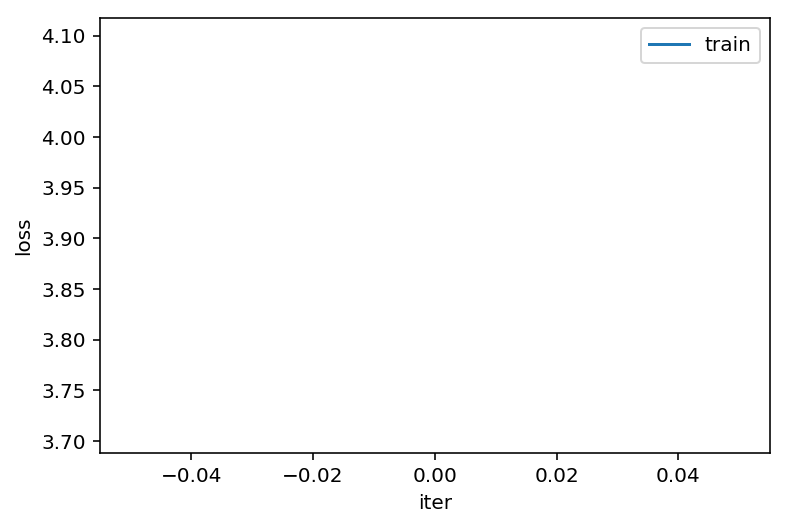

1
Epoch: 1, Iteration: 50, Loss: 3.9511520862579346
Epoch: 1, Iteration: 100, Loss: 3.8677754402160645
Epoch: 1, Iteration: 150, Loss: 3.7898752689361572
Epoch: 1, Iteration: 200, Loss: 3.951021671295166
Epoch: 1, Iteration: 250, Loss: 3.8767616748809814
Epoch: 1, Iteration: 300, Loss: 4.060272693634033
Epoch: 1, Iteration: 350, Loss: 3.906501531600952
Epoch: 1, Iteration: 400, Loss: 3.9458584785461426
Epoch: 1, Iteration: 450, Loss: 3.989480972290039
Epoch: 1, Iteration: 500, Loss: 3.96541690826416
Epoch: 1, Iteration: 550, Loss: 3.8950839042663574
Epoch: 1, Iteration: 600, Loss: 4.001323699951172
Epoch: 1, Iteration: 650, Loss: 4.064329147338867
Epoch: 1, Iteration: 700, Loss: 3.995375394821167
Epoch: 1, Iteration: 750, Loss: 3.9064924716949463
Epoch: 1, Iteration: 800, Loss: 3.9276325702667236
Epoch: 1, Iteration: 850, Loss: 3.920734167098999


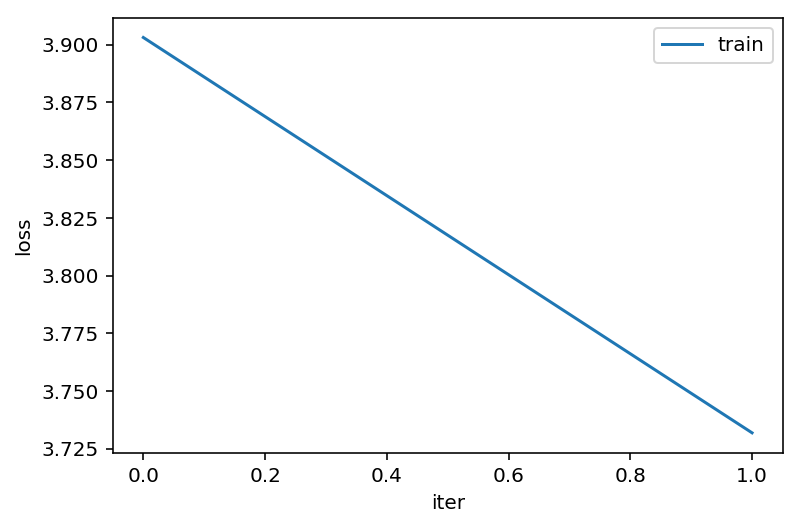

2
Epoch: 2, Iteration: 100, Loss: 3.7939531803131104
Epoch: 2, Iteration: 200, Loss: 3.8327159881591797
Epoch: 2, Iteration: 300, Loss: 3.9371702671051025
Epoch: 2, Iteration: 400, Loss: 3.6417489051818848
Epoch: 2, Iteration: 500, Loss: 3.982823133468628
Epoch: 2, Iteration: 600, Loss: 3.826364517211914
Epoch: 2, Iteration: 700, Loss: 3.591709613800049
Epoch: 2, Iteration: 800, Loss: 3.8591811656951904


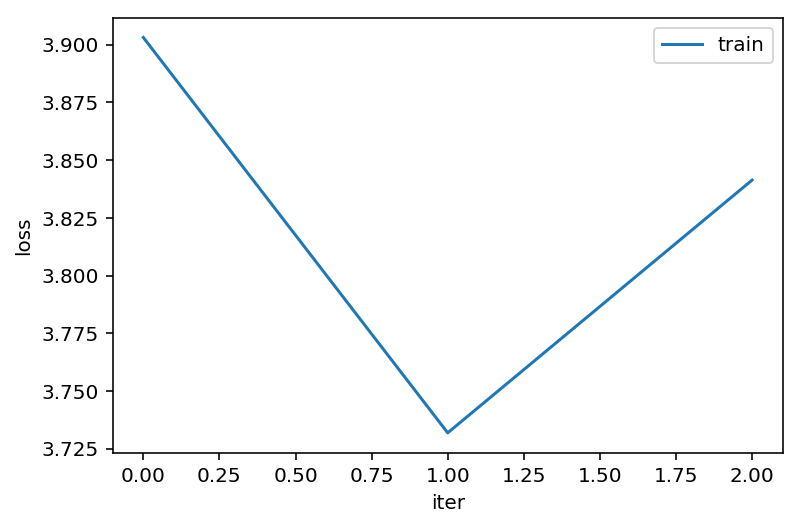

3
Epoch: 3, Iteration: 25, Loss: 3.702208995819092
Epoch: 3, Iteration: 50, Loss: 3.814448356628418
Epoch: 3, Iteration: 75, Loss: 3.5578932762145996
Epoch: 3, Iteration: 100, Loss: 3.702754259109497
Epoch: 3, Iteration: 125, Loss: 3.8915247917175293
Epoch: 3, Iteration: 150, Loss: 3.8487393856048584
Epoch: 3, Iteration: 175, Loss: 3.8839659690856934
Epoch: 3, Iteration: 200, Loss: 3.6517019271850586
Epoch: 3, Iteration: 225, Loss: 3.720646381378174
Epoch: 3, Iteration: 250, Loss: 3.8381123542785645
Epoch: 3, Iteration: 275, Loss: 3.7965781688690186
Epoch: 3, Iteration: 300, Loss: 3.6854913234710693
Epoch: 3, Iteration: 325, Loss: 3.8017613887786865
Epoch: 3, Iteration: 350, Loss: 3.70048451423645
Epoch: 3, Iteration: 375, Loss: 3.725409507751465
Epoch: 3, Iteration: 400, Loss: 3.8619062900543213
Epoch: 3, Iteration: 425, Loss: 3.7315163612365723
Epoch: 3, Iteration: 450, Loss: 3.6981663703918457
Epoch: 3, Iteration: 475, Loss: 3.8245058059692383
Epoch: 3, Iteration: 500, Loss: 3.94007

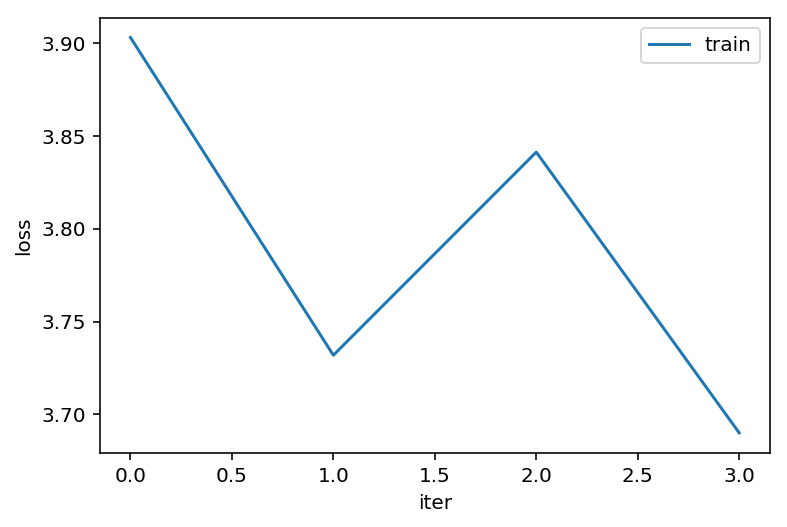

4
Epoch: 4, Iteration: 20, Loss: 3.7877798080444336
Epoch: 4, Iteration: 40, Loss: 3.546935796737671
Epoch: 4, Iteration: 60, Loss: 3.719860553741455
Epoch: 4, Iteration: 80, Loss: 3.6595518589019775
Epoch: 4, Iteration: 100, Loss: 3.9256086349487305
Epoch: 4, Iteration: 120, Loss: 3.818995475769043
Epoch: 4, Iteration: 140, Loss: 3.7060399055480957
Epoch: 4, Iteration: 160, Loss: 3.8813090324401855
Epoch: 4, Iteration: 180, Loss: 3.7461042404174805
Epoch: 4, Iteration: 200, Loss: 3.7806456089019775
Epoch: 4, Iteration: 220, Loss: 3.8060712814331055
Epoch: 4, Iteration: 240, Loss: 3.6694133281707764
Epoch: 4, Iteration: 260, Loss: 3.8213114738464355
Epoch: 4, Iteration: 280, Loss: 3.8132522106170654
Epoch: 4, Iteration: 300, Loss: 3.6671741008758545
Epoch: 4, Iteration: 320, Loss: 3.68530535697937
Epoch: 4, Iteration: 340, Loss: 3.854498863220215
Epoch: 4, Iteration: 360, Loss: 3.5284531116485596
Epoch: 4, Iteration: 380, Loss: 3.652691602706909
Epoch: 4, Iteration: 400, Loss: 3.687657

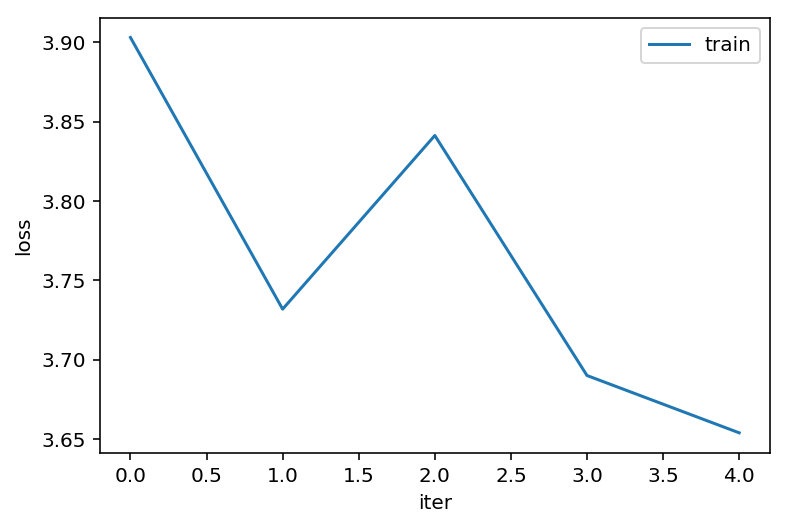

5
Epoch: 5, Iteration: 50, Loss: 3.746258020401001
Epoch: 5, Iteration: 100, Loss: 3.7008721828460693
Epoch: 5, Iteration: 150, Loss: 3.283109188079834
Epoch: 5, Iteration: 200, Loss: 3.8032286167144775
Epoch: 5, Iteration: 250, Loss: 3.567293167114258
Epoch: 5, Iteration: 300, Loss: 3.67284893989563
Epoch: 5, Iteration: 350, Loss: 3.7199769020080566
Epoch: 5, Iteration: 400, Loss: 3.775078058242798
Epoch: 5, Iteration: 450, Loss: 3.652148485183716
Epoch: 5, Iteration: 500, Loss: 3.777148962020874
Epoch: 5, Iteration: 550, Loss: 3.511568546295166
Epoch: 5, Iteration: 600, Loss: 3.8015613555908203
Epoch: 5, Iteration: 650, Loss: 3.474385976791382
Epoch: 5, Iteration: 700, Loss: 3.7607550621032715
Epoch: 5, Iteration: 750, Loss: 3.622335195541382
Epoch: 5, Iteration: 800, Loss: 3.656921625137329
Epoch: 5, Iteration: 850, Loss: 3.796109199523926


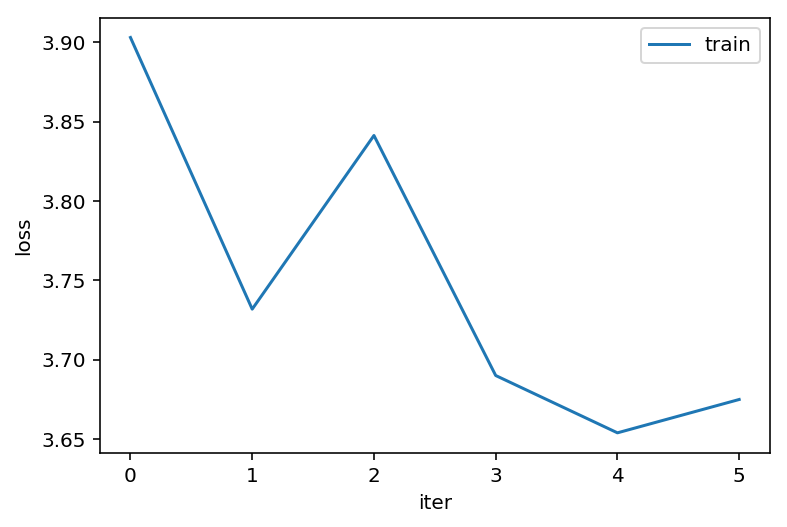

6
Epoch: 6, Iteration: 100, Loss: 3.444632053375244
Epoch: 6, Iteration: 200, Loss: 3.749511480331421
Epoch: 6, Iteration: 300, Loss: 3.9188365936279297
Epoch: 6, Iteration: 400, Loss: 3.4073634147644043
Epoch: 6, Iteration: 500, Loss: 3.6119673252105713
Epoch: 6, Iteration: 600, Loss: 3.6705191135406494
Epoch: 6, Iteration: 700, Loss: 3.4405694007873535
Epoch: 6, Iteration: 800, Loss: 3.6244475841522217


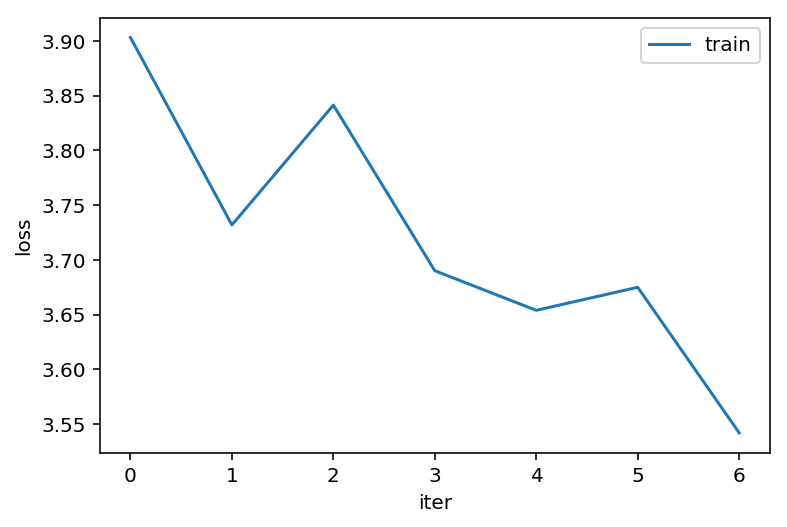

7
Epoch: 7, Iteration: 25, Loss: 3.580996036529541
Epoch: 7, Iteration: 50, Loss: 3.4394235610961914
Epoch: 7, Iteration: 75, Loss: 3.406876802444458
Epoch: 7, Iteration: 100, Loss: 3.3898463249206543
Epoch: 7, Iteration: 125, Loss: 3.412464141845703
Epoch: 7, Iteration: 150, Loss: 3.2183711528778076
Epoch: 7, Iteration: 175, Loss: 3.5595498085021973
Epoch: 7, Iteration: 200, Loss: 3.547250986099243
Epoch: 7, Iteration: 225, Loss: 3.286588668823242
Epoch: 7, Iteration: 250, Loss: 3.7175705432891846
Epoch: 7, Iteration: 275, Loss: 3.4989898204803467
Epoch: 7, Iteration: 300, Loss: 3.5105068683624268
Epoch: 7, Iteration: 325, Loss: 3.7243223190307617
Epoch: 7, Iteration: 350, Loss: 3.5560874938964844
Epoch: 7, Iteration: 375, Loss: 3.585120677947998
Epoch: 7, Iteration: 400, Loss: 3.6576430797576904
Epoch: 7, Iteration: 425, Loss: 3.213460922241211
Epoch: 7, Iteration: 450, Loss: 3.499342441558838
Epoch: 7, Iteration: 475, Loss: 3.597808599472046
Epoch: 7, Iteration: 500, Loss: 3.5463705

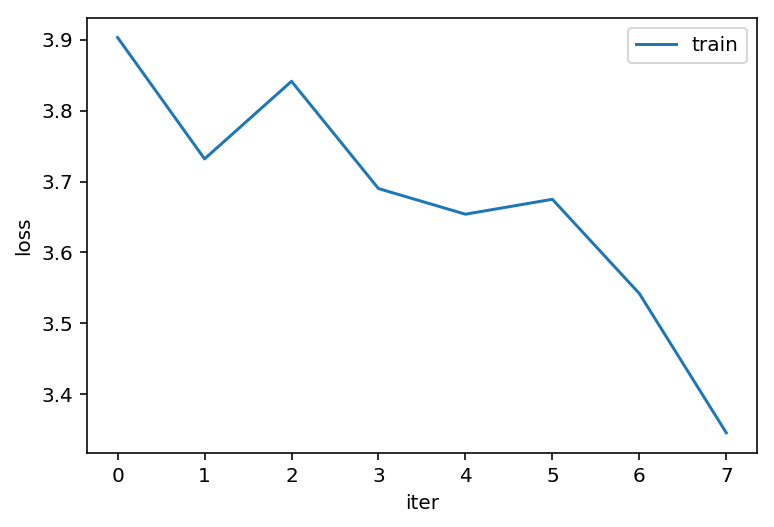

8
Epoch: 8, Iteration: 100, Loss: 3.420753002166748
Epoch: 8, Iteration: 200, Loss: 3.516906261444092
Epoch: 8, Iteration: 300, Loss: 3.5054545402526855
Epoch: 8, Iteration: 400, Loss: 3.406802177429199
Epoch: 8, Iteration: 500, Loss: 3.2629876136779785
Epoch: 8, Iteration: 600, Loss: 3.3163206577301025
Epoch: 8, Iteration: 700, Loss: 3.526048183441162
Epoch: 8, Iteration: 800, Loss: 3.470651149749756


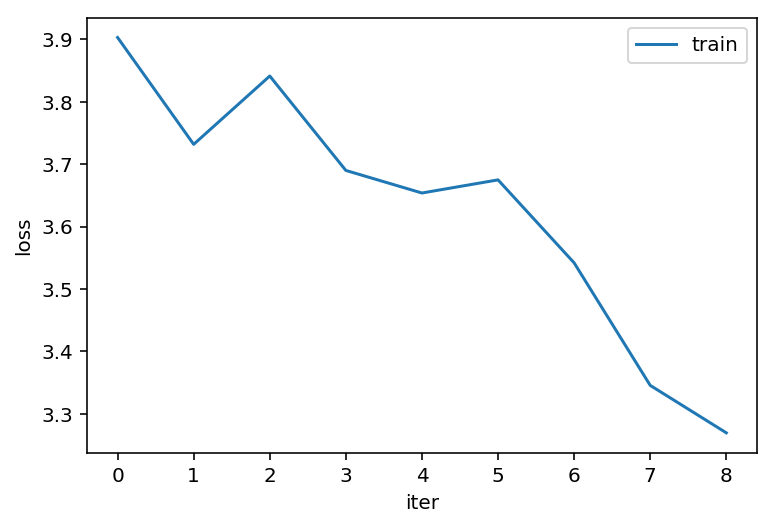

9
Epoch: 9, Iteration: 10, Loss: 3.0549776554107666
Epoch: 9, Iteration: 20, Loss: 3.406327962875366
Epoch: 9, Iteration: 30, Loss: 3.0902445316314697
Epoch: 9, Iteration: 40, Loss: 3.285202980041504
Epoch: 9, Iteration: 50, Loss: 3.3038525581359863
Epoch: 9, Iteration: 60, Loss: 3.557281255722046
Epoch: 9, Iteration: 70, Loss: 3.45119047164917
Epoch: 9, Iteration: 80, Loss: 3.4769060611724854
Epoch: 9, Iteration: 90, Loss: 3.45188570022583
Epoch: 9, Iteration: 100, Loss: 3.43239688873291
Epoch: 9, Iteration: 110, Loss: 3.239898443222046
Epoch: 9, Iteration: 120, Loss: 3.2955963611602783
Epoch: 9, Iteration: 130, Loss: 3.578547716140747
Epoch: 9, Iteration: 140, Loss: 3.2236430644989014
Epoch: 9, Iteration: 150, Loss: 3.131105899810791
Epoch: 9, Iteration: 160, Loss: 3.255054235458374
Epoch: 9, Iteration: 170, Loss: 3.0794572830200195
Epoch: 9, Iteration: 180, Loss: 3.296581745147705
Epoch: 9, Iteration: 190, Loss: 3.136780261993408
Epoch: 9, Iteration: 200, Loss: 3.4977967739105225
Ep

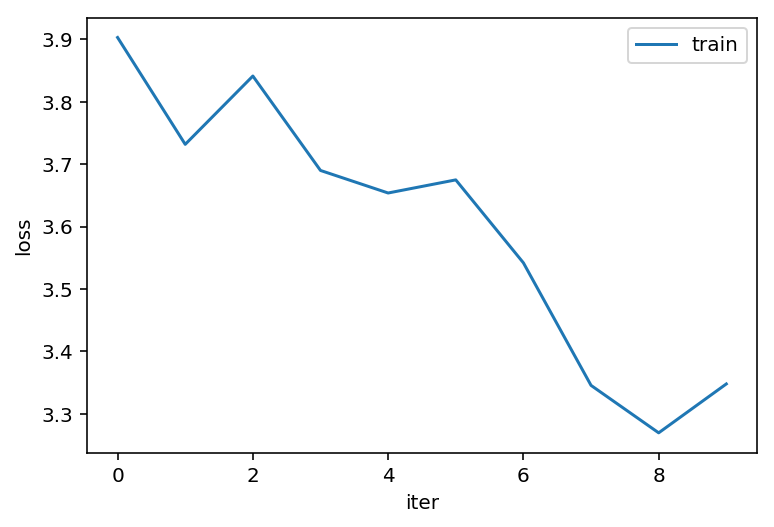

10
Epoch: 10, Iteration: 100, Loss: 3.2757041454315186
Epoch: 10, Iteration: 200, Loss: 3.3435966968536377
Epoch: 10, Iteration: 300, Loss: 3.621037721633911
Epoch: 10, Iteration: 400, Loss: 3.268890857696533
Epoch: 10, Iteration: 500, Loss: 3.663605213165283
Epoch: 10, Iteration: 600, Loss: 3.2611448764801025
Epoch: 10, Iteration: 700, Loss: 3.168638229370117
Epoch: 10, Iteration: 800, Loss: 3.275667428970337


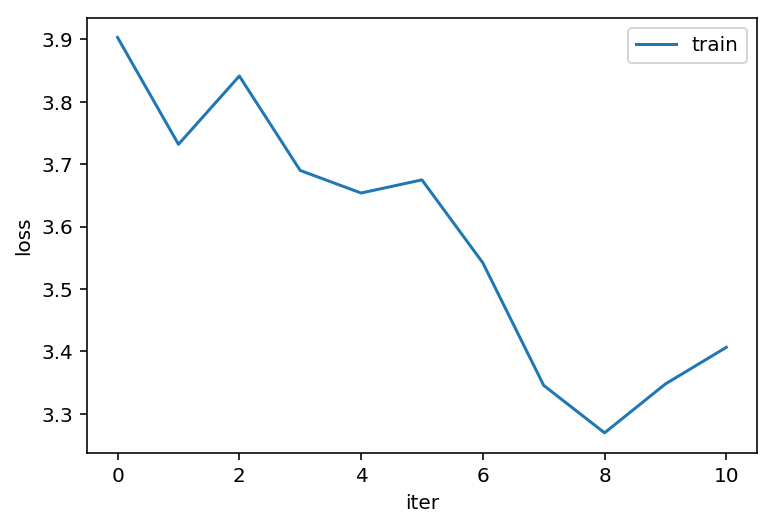

11
Epoch: 11, Iteration: 25, Loss: 3.0984389781951904
Epoch: 11, Iteration: 50, Loss: 3.36024808883667
Epoch: 11, Iteration: 75, Loss: 3.04817795753479
Epoch: 11, Iteration: 100, Loss: 3.0754268169403076
Epoch: 11, Iteration: 125, Loss: 3.319328546524048
Epoch: 11, Iteration: 150, Loss: 3.1878838539123535
Epoch: 11, Iteration: 175, Loss: 3.144366979598999
Epoch: 11, Iteration: 200, Loss: 3.3942525386810303
Epoch: 11, Iteration: 225, Loss: 3.2682044506073
Epoch: 11, Iteration: 250, Loss: 3.243819236755371
Epoch: 11, Iteration: 275, Loss: 3.1899983882904053
Epoch: 11, Iteration: 300, Loss: 3.2390434741973877
Epoch: 11, Iteration: 325, Loss: 3.445297956466675
Epoch: 11, Iteration: 350, Loss: 3.5099036693573
Epoch: 11, Iteration: 375, Loss: 2.9878525733947754
Epoch: 11, Iteration: 400, Loss: 3.1884002685546875
Epoch: 11, Iteration: 425, Loss: 3.1450753211975098
Epoch: 11, Iteration: 450, Loss: 3.1795105934143066
Epoch: 11, Iteration: 475, Loss: 3.322993040084839
Epoch: 11, Iteration: 500, 

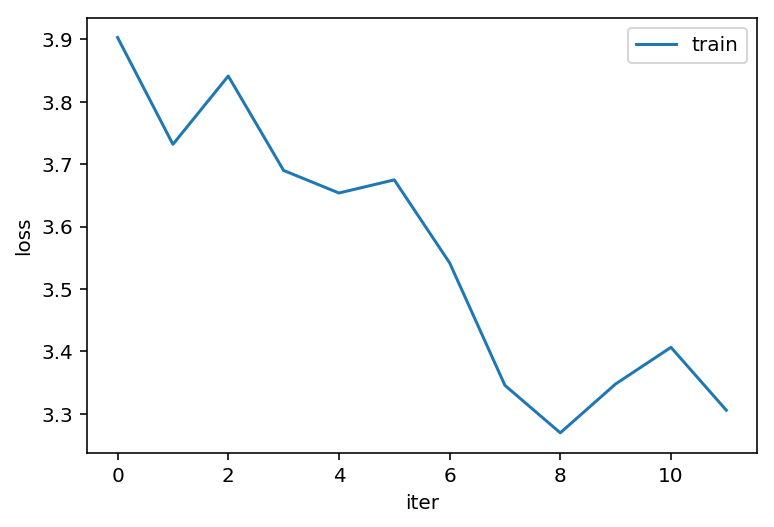

12
Epoch: 12, Iteration: 100, Loss: 3.2137842178344727
Epoch: 12, Iteration: 200, Loss: 3.0171291828155518
Epoch: 12, Iteration: 300, Loss: 3.2789509296417236
Epoch: 12, Iteration: 400, Loss: 3.4155211448669434
Epoch: 12, Iteration: 500, Loss: 3.3672292232513428
Epoch: 12, Iteration: 600, Loss: 3.3330283164978027
Epoch: 12, Iteration: 700, Loss: 3.1759700775146484
Epoch: 12, Iteration: 800, Loss: 3.2284562587738037


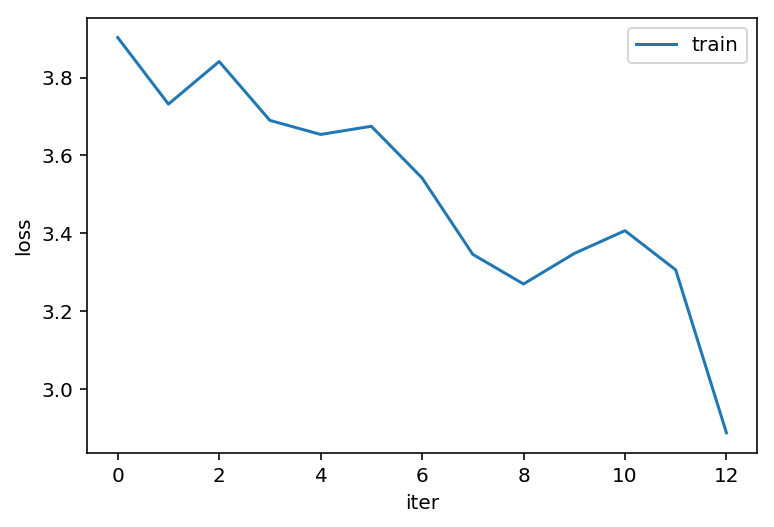

13
Epoch: 13, Iteration: 50, Loss: 2.8580949306488037
Epoch: 13, Iteration: 100, Loss: 2.7808098793029785
Epoch: 13, Iteration: 150, Loss: 3.261653184890747
Epoch: 13, Iteration: 200, Loss: 2.8634860515594482
Epoch: 13, Iteration: 250, Loss: 3.2199134826660156
Epoch: 13, Iteration: 300, Loss: 2.8112738132476807
Epoch: 13, Iteration: 350, Loss: 2.943708658218384
Epoch: 13, Iteration: 400, Loss: 3.230560541152954
Epoch: 13, Iteration: 450, Loss: 3.0813095569610596
Epoch: 13, Iteration: 500, Loss: 3.1559619903564453
Epoch: 13, Iteration: 550, Loss: 3.0657408237457275
Epoch: 13, Iteration: 600, Loss: 3.3676648139953613
Epoch: 13, Iteration: 650, Loss: 3.062037229537964
Epoch: 13, Iteration: 700, Loss: 3.057638645172119
Epoch: 13, Iteration: 750, Loss: 3.047145128250122
Epoch: 13, Iteration: 800, Loss: 2.962189197540283
Epoch: 13, Iteration: 850, Loss: 2.9315404891967773


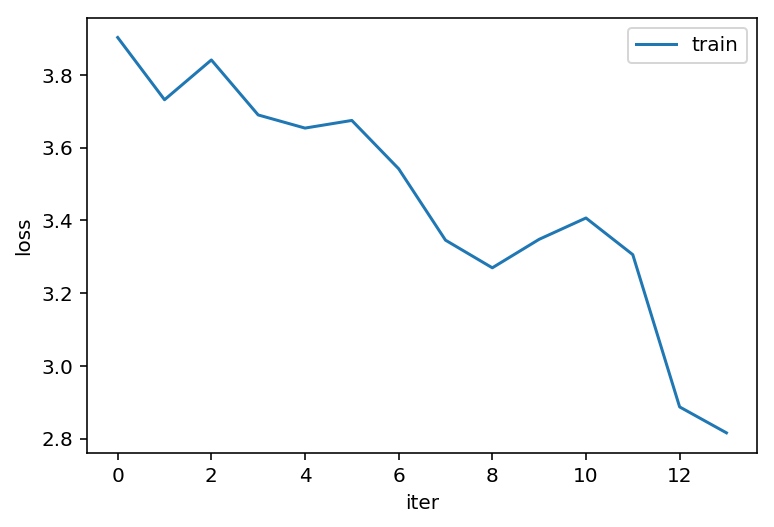

14
Epoch: 14, Iteration: 20, Loss: 3.0069501399993896
Epoch: 14, Iteration: 40, Loss: 3.080073356628418
Epoch: 14, Iteration: 60, Loss: 2.7949626445770264
Epoch: 14, Iteration: 80, Loss: 2.8326964378356934
Epoch: 14, Iteration: 100, Loss: 2.88250994682312
Epoch: 14, Iteration: 120, Loss: 3.2687184810638428
Epoch: 14, Iteration: 140, Loss: 3.3099420070648193
Epoch: 14, Iteration: 160, Loss: 3.126725435256958
Epoch: 14, Iteration: 180, Loss: 3.0125303268432617
Epoch: 14, Iteration: 200, Loss: 2.8843188285827637
Epoch: 14, Iteration: 220, Loss: 3.0471463203430176
Epoch: 14, Iteration: 240, Loss: 2.910290002822876
Epoch: 14, Iteration: 260, Loss: 3.2182767391204834
Epoch: 14, Iteration: 280, Loss: 3.1449968814849854
Epoch: 14, Iteration: 300, Loss: 2.8405511379241943
Epoch: 14, Iteration: 320, Loss: 3.015455484390259
Epoch: 14, Iteration: 340, Loss: 2.8210299015045166
Epoch: 14, Iteration: 360, Loss: 3.1385068893432617
Epoch: 14, Iteration: 380, Loss: 3.200188398361206
Epoch: 14, Iteration

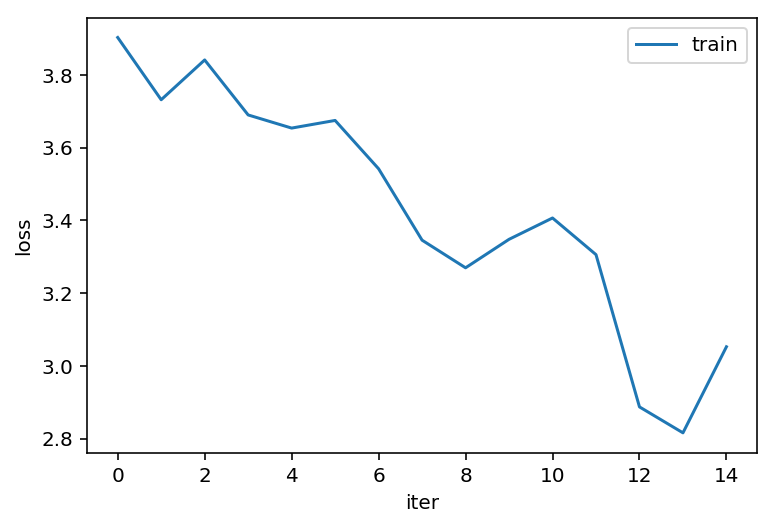

15
Epoch: 15, Iteration: 25, Loss: 2.6619887351989746
Epoch: 15, Iteration: 50, Loss: 2.8044378757476807
Epoch: 15, Iteration: 75, Loss: 3.0847785472869873
Epoch: 15, Iteration: 100, Loss: 2.7031514644622803
Epoch: 15, Iteration: 125, Loss: 2.760140895843506
Epoch: 15, Iteration: 150, Loss: 3.0871565341949463
Epoch: 15, Iteration: 175, Loss: 2.6190731525421143
Epoch: 15, Iteration: 200, Loss: 3.167207956314087
Epoch: 15, Iteration: 225, Loss: 3.0553877353668213
Epoch: 15, Iteration: 250, Loss: 2.582174777984619
Epoch: 15, Iteration: 275, Loss: 2.8061306476593018
Epoch: 15, Iteration: 300, Loss: 2.82033109664917
Epoch: 15, Iteration: 325, Loss: 2.927907705307007
Epoch: 15, Iteration: 350, Loss: 2.8854587078094482
Epoch: 15, Iteration: 375, Loss: 2.9453461170196533
Epoch: 15, Iteration: 400, Loss: 3.128622055053711
Epoch: 15, Iteration: 425, Loss: 3.0355470180511475
Epoch: 15, Iteration: 450, Loss: 3.2589902877807617
Epoch: 15, Iteration: 475, Loss: 2.5883913040161133
Epoch: 15, Iteratio

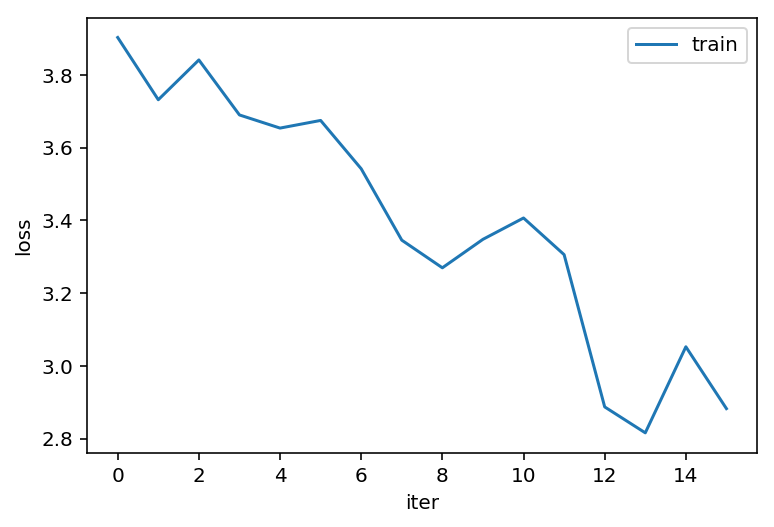

16
Epoch: 16, Iteration: 100, Loss: 2.538299560546875
Epoch: 16, Iteration: 200, Loss: 2.8816781044006348
Epoch: 16, Iteration: 300, Loss: 2.6852402687072754
Epoch: 16, Iteration: 400, Loss: 2.7493820190429688
Epoch: 16, Iteration: 500, Loss: 2.8527252674102783
Epoch: 16, Iteration: 600, Loss: 2.5470829010009766
Epoch: 16, Iteration: 700, Loss: 2.9218287467956543
Epoch: 16, Iteration: 800, Loss: 3.2761118412017822


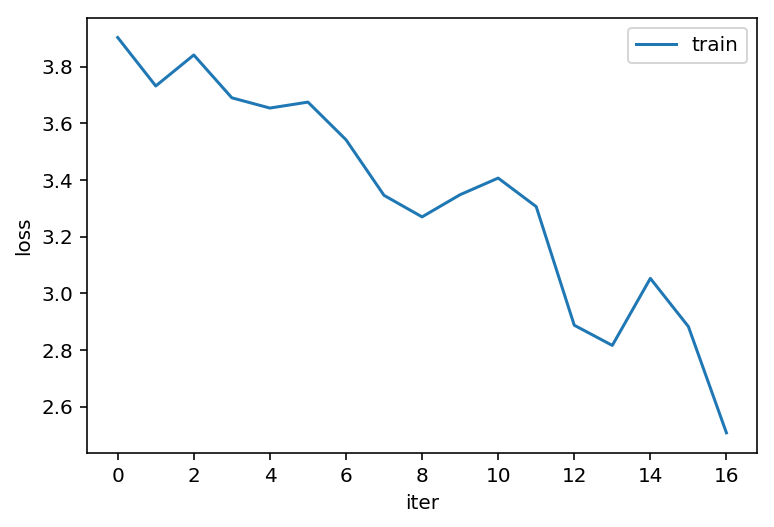

17
Epoch: 17, Iteration: 50, Loss: 3.0405986309051514
Epoch: 17, Iteration: 100, Loss: 2.7035346031188965
Epoch: 17, Iteration: 150, Loss: 2.9327359199523926
Epoch: 17, Iteration: 200, Loss: 2.988542079925537
Epoch: 17, Iteration: 250, Loss: 2.6579525470733643
Epoch: 17, Iteration: 300, Loss: 2.163520574569702
Epoch: 17, Iteration: 350, Loss: 3.0791568756103516
Epoch: 17, Iteration: 400, Loss: 2.750638484954834
Epoch: 17, Iteration: 450, Loss: 3.0072333812713623
Epoch: 17, Iteration: 500, Loss: 2.7297236919403076
Epoch: 17, Iteration: 550, Loss: 2.4355530738830566
Epoch: 17, Iteration: 600, Loss: 2.7294247150421143
Epoch: 17, Iteration: 650, Loss: 2.708980083465576
Epoch: 17, Iteration: 700, Loss: 2.7015087604522705
Epoch: 17, Iteration: 750, Loss: 2.5953516960144043
Epoch: 17, Iteration: 800, Loss: 2.627060890197754
Epoch: 17, Iteration: 850, Loss: 2.7880873680114746


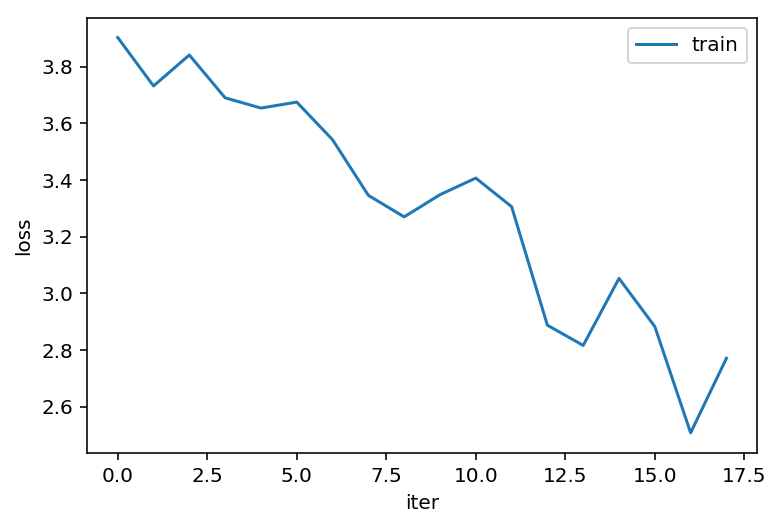

18
Epoch: 18, Iteration: 100, Loss: 2.5765221118927
Epoch: 18, Iteration: 200, Loss: 2.388550043106079
Epoch: 18, Iteration: 300, Loss: 2.884575128555298
Epoch: 18, Iteration: 400, Loss: 2.6540045738220215
Epoch: 18, Iteration: 500, Loss: 2.8516993522644043
Epoch: 18, Iteration: 600, Loss: 2.6073241233825684
Epoch: 18, Iteration: 700, Loss: 2.754829168319702
Epoch: 18, Iteration: 800, Loss: 3.175861358642578


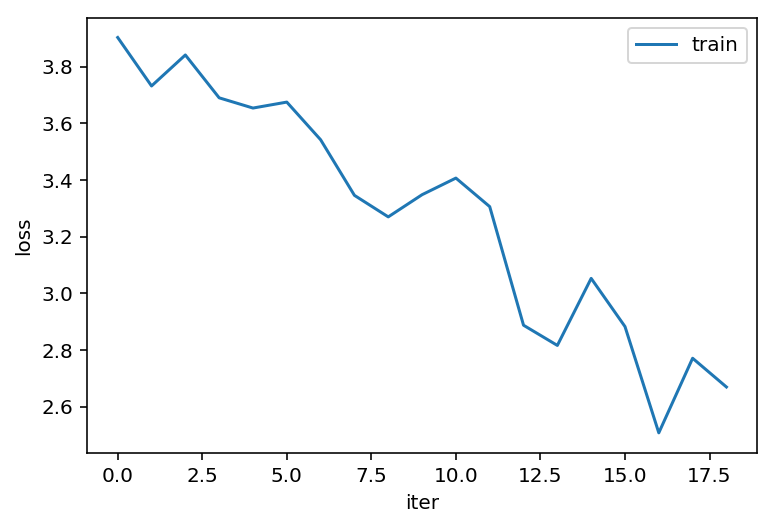

19
Epoch: 19, Iteration: 5, Loss: 2.283437490463257
Epoch: 19, Iteration: 10, Loss: 2.721428871154785
Epoch: 19, Iteration: 15, Loss: 2.485686779022217
Epoch: 19, Iteration: 20, Loss: 2.6834053993225098
Epoch: 19, Iteration: 25, Loss: 2.406118154525757
Epoch: 19, Iteration: 30, Loss: 2.5162975788116455
Epoch: 19, Iteration: 35, Loss: 2.492786407470703
Epoch: 19, Iteration: 40, Loss: 2.670685052871704
Epoch: 19, Iteration: 45, Loss: 2.5918657779693604
Epoch: 19, Iteration: 50, Loss: 2.512266159057617
Epoch: 19, Iteration: 55, Loss: 2.341611623764038
Epoch: 19, Iteration: 60, Loss: 2.5495927333831787
Epoch: 19, Iteration: 65, Loss: 2.5250394344329834
Epoch: 19, Iteration: 70, Loss: 2.3699324131011963
Epoch: 19, Iteration: 75, Loss: 2.5031466484069824
Epoch: 19, Iteration: 80, Loss: 2.7737629413604736
Epoch: 19, Iteration: 85, Loss: 2.5672173500061035
Epoch: 19, Iteration: 90, Loss: 2.510803699493408
Epoch: 19, Iteration: 95, Loss: 2.5904381275177
Epoch: 19, Iteration: 100, Loss: 2.736334

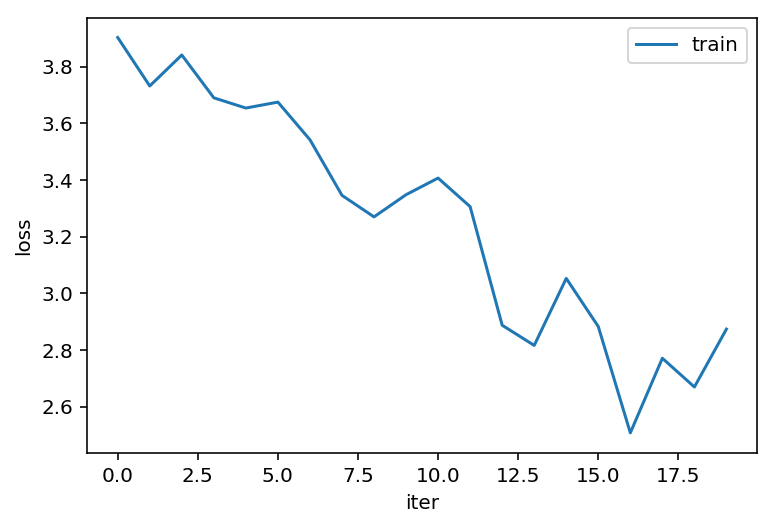

20
Epoch: 20, Iteration: 100, Loss: 2.3679802417755127
Epoch: 20, Iteration: 200, Loss: 2.6981825828552246
Epoch: 20, Iteration: 300, Loss: 2.6845667362213135
Epoch: 20, Iteration: 400, Loss: 2.466017961502075
Epoch: 20, Iteration: 500, Loss: 2.544466733932495
Epoch: 20, Iteration: 600, Loss: 2.6005282402038574
Epoch: 20, Iteration: 700, Loss: 2.562326431274414
Epoch: 20, Iteration: 800, Loss: 2.548792600631714


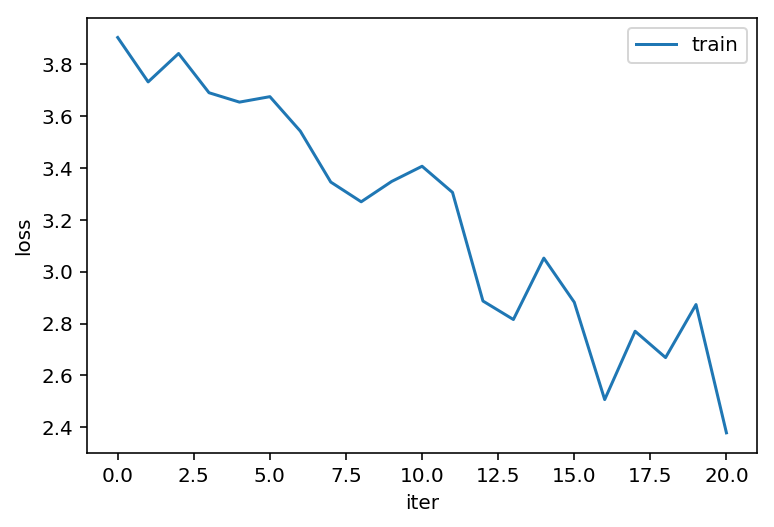

21
Epoch: 21, Iteration: 50, Loss: 2.1780567169189453
Epoch: 21, Iteration: 100, Loss: 2.6951451301574707
Epoch: 21, Iteration: 150, Loss: 2.409386157989502
Epoch: 21, Iteration: 200, Loss: 2.4612321853637695
Epoch: 21, Iteration: 250, Loss: 2.0137248039245605
Epoch: 21, Iteration: 300, Loss: 2.3609306812286377
Epoch: 21, Iteration: 350, Loss: 2.838360548019409
Epoch: 21, Iteration: 400, Loss: 2.533989667892456
Epoch: 21, Iteration: 450, Loss: 2.882176160812378
Epoch: 21, Iteration: 500, Loss: 2.382054328918457
Epoch: 21, Iteration: 550, Loss: 2.3677053451538086
Epoch: 21, Iteration: 600, Loss: 2.6241159439086914
Epoch: 21, Iteration: 650, Loss: 3.0205588340759277
Epoch: 21, Iteration: 700, Loss: 2.9875638484954834
Epoch: 21, Iteration: 750, Loss: 2.169525146484375
Epoch: 21, Iteration: 800, Loss: 2.586397647857666
Epoch: 21, Iteration: 850, Loss: 2.8977560997009277


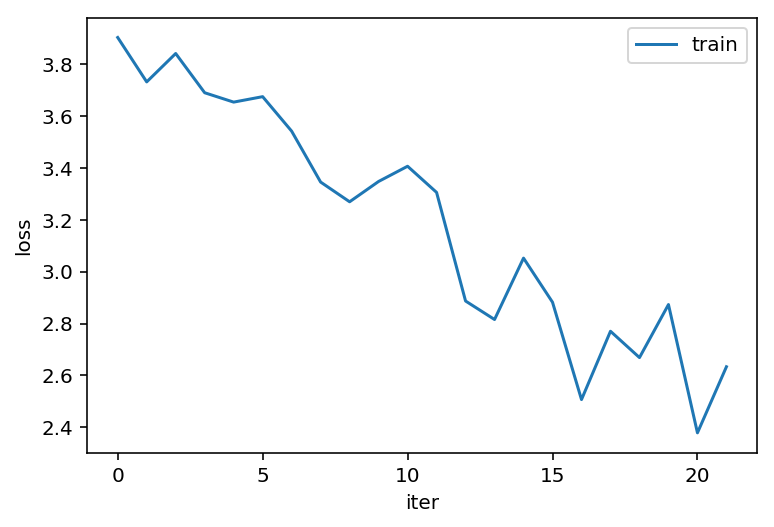

22
Epoch: 22, Iteration: 100, Loss: 1.8104817867279053
Epoch: 22, Iteration: 200, Loss: 2.7107410430908203
Epoch: 22, Iteration: 300, Loss: 2.1706178188323975
Epoch: 22, Iteration: 400, Loss: 2.427755117416382
Epoch: 22, Iteration: 500, Loss: 2.5577738285064697
Epoch: 22, Iteration: 600, Loss: 2.306763172149658
Epoch: 22, Iteration: 700, Loss: 2.335205316543579
Epoch: 22, Iteration: 800, Loss: 2.5469810962677


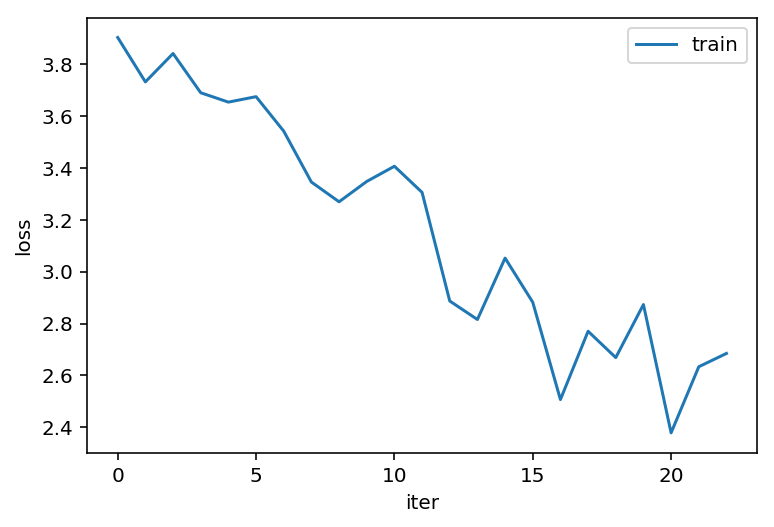

23
Epoch: 23, Iteration: 25, Loss: 2.4829623699188232
Epoch: 23, Iteration: 50, Loss: 2.527729034423828
Epoch: 23, Iteration: 75, Loss: 2.4829537868499756
Epoch: 23, Iteration: 100, Loss: 2.295111656188965
Epoch: 23, Iteration: 125, Loss: 2.442152500152588
Epoch: 23, Iteration: 150, Loss: 2.397343635559082
Epoch: 23, Iteration: 175, Loss: 2.0688729286193848
Epoch: 23, Iteration: 200, Loss: 2.153261184692383
Epoch: 23, Iteration: 225, Loss: 2.3728020191192627
Epoch: 23, Iteration: 250, Loss: 2.2711446285247803
Epoch: 23, Iteration: 275, Loss: 2.4464101791381836
Epoch: 23, Iteration: 300, Loss: 2.586552619934082
Epoch: 23, Iteration: 325, Loss: 2.6481549739837646
Epoch: 23, Iteration: 350, Loss: 2.5890486240386963
Epoch: 23, Iteration: 375, Loss: 2.202817916870117
Epoch: 23, Iteration: 400, Loss: 2.5261590480804443
Epoch: 23, Iteration: 425, Loss: 2.392594575881958
Epoch: 23, Iteration: 450, Loss: 2.3701865673065186
Epoch: 23, Iteration: 475, Loss: 2.3552589416503906
Epoch: 23, Iteration

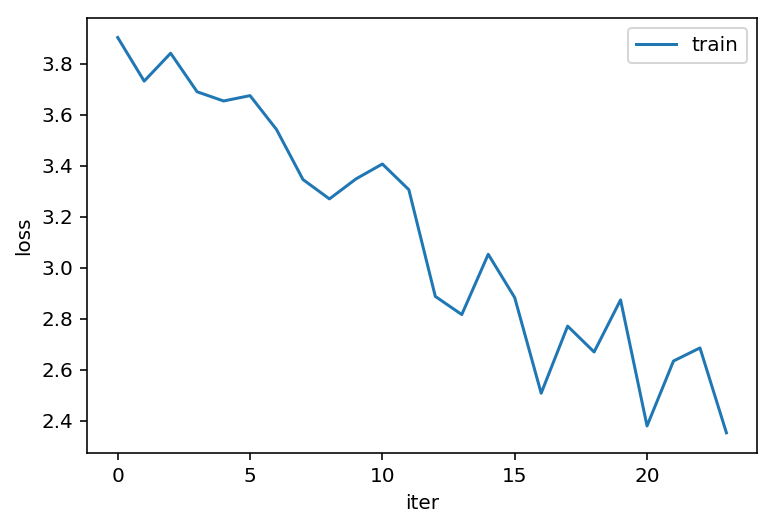

24
Epoch: 24, Iteration: 4, Loss: 2.125757932662964
Epoch: 24, Iteration: 8, Loss: 2.380608558654785
Epoch: 24, Iteration: 12, Loss: 2.068366289138794
Epoch: 24, Iteration: 16, Loss: 2.522193431854248
Epoch: 24, Iteration: 20, Loss: 2.138627529144287
Epoch: 24, Iteration: 24, Loss: 2.3120205402374268
Epoch: 24, Iteration: 28, Loss: 2.395413637161255
Epoch: 24, Iteration: 32, Loss: 2.0290517807006836
Epoch: 24, Iteration: 36, Loss: 2.2026331424713135
Epoch: 24, Iteration: 40, Loss: 2.392976999282837
Epoch: 24, Iteration: 44, Loss: 2.04944109916687
Epoch: 24, Iteration: 48, Loss: 2.1408004760742188
Epoch: 24, Iteration: 52, Loss: 2.7176809310913086
Epoch: 24, Iteration: 56, Loss: 2.090715169906616
Epoch: 24, Iteration: 60, Loss: 2.621995210647583
Epoch: 24, Iteration: 64, Loss: 2.3928894996643066
Epoch: 24, Iteration: 68, Loss: 2.0445737838745117
Epoch: 24, Iteration: 72, Loss: 2.267721176147461
Epoch: 24, Iteration: 76, Loss: 2.199509620666504
Epoch: 24, Iteration: 80, Loss: 2.472213506

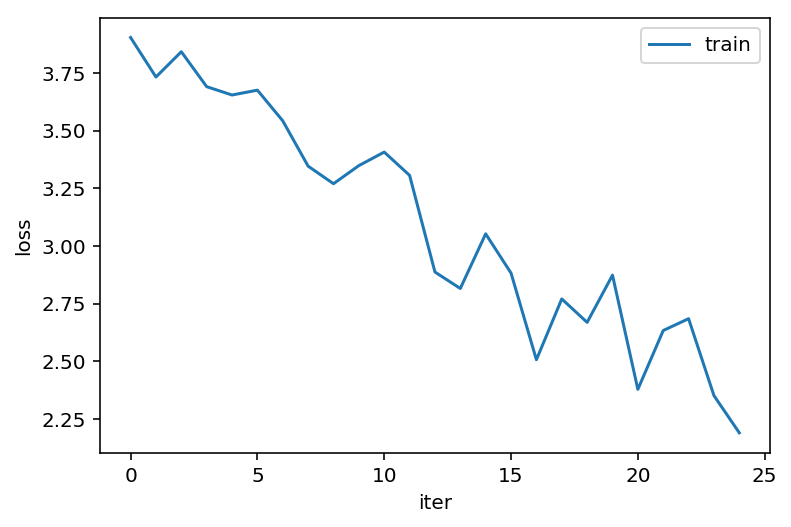

25
Epoch: 25, Iteration: 50, Loss: 2.176828145980835
Epoch: 25, Iteration: 100, Loss: 2.3601150512695312
Epoch: 25, Iteration: 150, Loss: 2.219012498855591
Epoch: 25, Iteration: 200, Loss: 2.385152578353882
Epoch: 25, Iteration: 250, Loss: 1.8827719688415527
Epoch: 25, Iteration: 300, Loss: 2.055774450302124
Epoch: 25, Iteration: 350, Loss: 2.618175506591797
Epoch: 25, Iteration: 400, Loss: 2.2608530521392822
Epoch: 25, Iteration: 450, Loss: 2.5347824096679688
Epoch: 25, Iteration: 500, Loss: 2.2029528617858887
Epoch: 25, Iteration: 550, Loss: 2.4410717487335205
Epoch: 25, Iteration: 600, Loss: 2.1402359008789062
Epoch: 25, Iteration: 650, Loss: 2.443443775177002
Epoch: 25, Iteration: 700, Loss: 2.3610165119171143
Epoch: 25, Iteration: 750, Loss: 2.432748794555664
Epoch: 25, Iteration: 800, Loss: 2.006783962249756
Epoch: 25, Iteration: 850, Loss: 2.3452630043029785


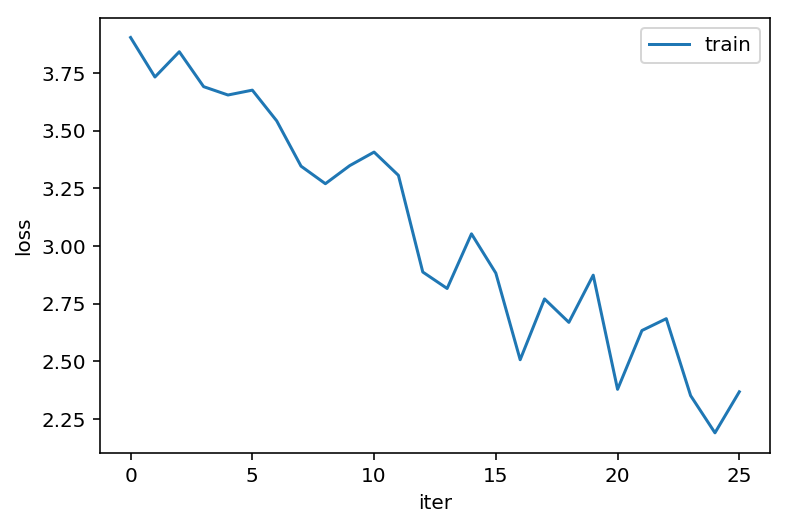

26
Epoch: 26, Iteration: 100, Loss: 1.7888102531433105
Epoch: 26, Iteration: 200, Loss: 2.347973585128784
Epoch: 26, Iteration: 300, Loss: 2.318586587905884
Epoch: 26, Iteration: 400, Loss: 2.142329692840576
Epoch: 26, Iteration: 500, Loss: 2.3222434520721436
Epoch: 26, Iteration: 600, Loss: 2.2965247631073
Epoch: 26, Iteration: 700, Loss: 2.197730541229248
Epoch: 26, Iteration: 800, Loss: 2.0820162296295166


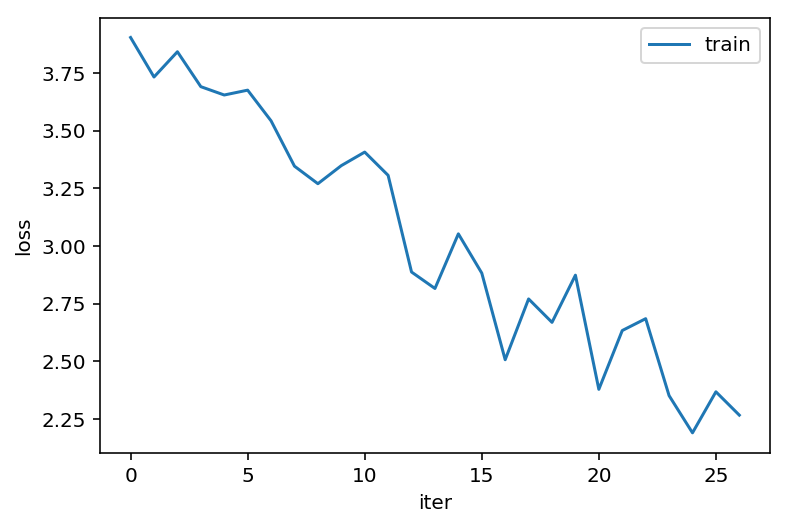

27
Epoch: 27, Iteration: 25, Loss: 1.8699532747268677
Epoch: 27, Iteration: 50, Loss: 2.4251773357391357
Epoch: 27, Iteration: 75, Loss: 2.311743974685669
Epoch: 27, Iteration: 100, Loss: 2.230217218399048
Epoch: 27, Iteration: 125, Loss: 2.2674012184143066
Epoch: 27, Iteration: 150, Loss: 1.8336870670318604
Epoch: 27, Iteration: 175, Loss: 1.955027461051941
Epoch: 27, Iteration: 200, Loss: 2.0990095138549805
Epoch: 27, Iteration: 225, Loss: 2.126549005508423
Epoch: 27, Iteration: 250, Loss: 2.4786131381988525
Epoch: 27, Iteration: 275, Loss: 1.9122748374938965
Epoch: 27, Iteration: 300, Loss: 2.055227279663086
Epoch: 27, Iteration: 325, Loss: 2.4730746746063232
Epoch: 27, Iteration: 350, Loss: 2.291504144668579
Epoch: 27, Iteration: 375, Loss: 2.2060420513153076
Epoch: 27, Iteration: 400, Loss: 2.07012677192688
Epoch: 27, Iteration: 425, Loss: 2.2420504093170166
Epoch: 27, Iteration: 450, Loss: 2.4282472133636475
Epoch: 27, Iteration: 475, Loss: 2.482895851135254
Epoch: 27, Iteration:

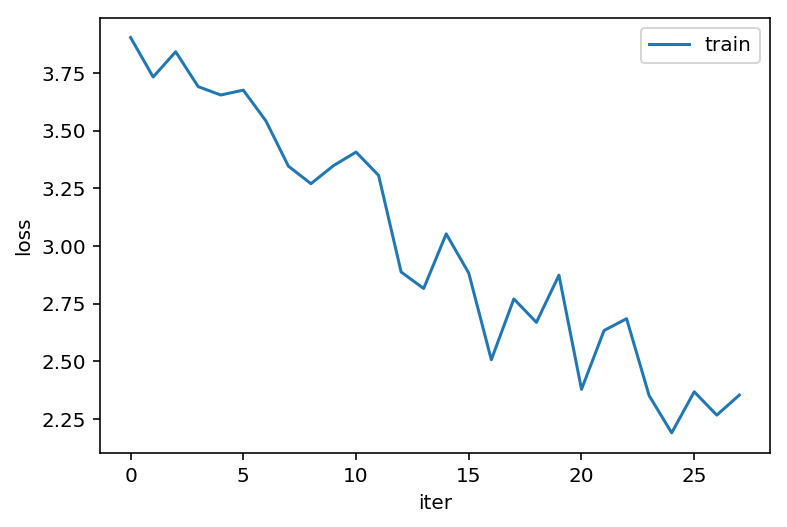

28
Epoch: 28, Iteration: 100, Loss: 1.8288425207138062
Epoch: 28, Iteration: 200, Loss: 1.9910577535629272
Epoch: 28, Iteration: 300, Loss: 2.118408203125
Epoch: 28, Iteration: 400, Loss: 2.269763946533203
Epoch: 28, Iteration: 500, Loss: 2.318054676055908
Epoch: 28, Iteration: 600, Loss: 2.2873945236206055
Epoch: 28, Iteration: 700, Loss: 2.0005433559417725
Epoch: 28, Iteration: 800, Loss: 2.2866287231445312


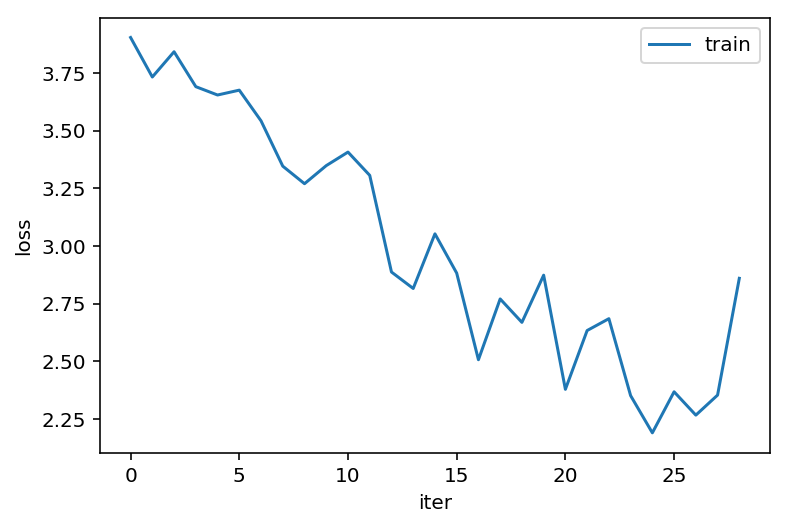

29
Epoch: 29, Iteration: 10, Loss: 1.6664235591888428
Epoch: 29, Iteration: 20, Loss: 2.2053136825561523
Epoch: 29, Iteration: 30, Loss: 1.987306833267212
Epoch: 29, Iteration: 40, Loss: 2.195690393447876
Epoch: 29, Iteration: 50, Loss: 2.09325909614563
Epoch: 29, Iteration: 60, Loss: 2.0015780925750732
Epoch: 29, Iteration: 70, Loss: 2.2972419261932373
Epoch: 29, Iteration: 80, Loss: 1.972867488861084
Epoch: 29, Iteration: 90, Loss: 1.719316840171814
Epoch: 29, Iteration: 100, Loss: 2.087989091873169
Epoch: 29, Iteration: 110, Loss: 2.5973544120788574
Epoch: 29, Iteration: 120, Loss: 2.3134164810180664
Epoch: 29, Iteration: 130, Loss: 1.9689861536026
Epoch: 29, Iteration: 140, Loss: 2.1245524883270264
Epoch: 29, Iteration: 150, Loss: 2.261357545852661
Epoch: 29, Iteration: 160, Loss: 2.1597537994384766
Epoch: 29, Iteration: 170, Loss: 2.2934188842773438
Epoch: 29, Iteration: 180, Loss: 2.424004316329956
Epoch: 29, Iteration: 190, Loss: 2.2380406856536865
Epoch: 29, Iteration: 200, Los

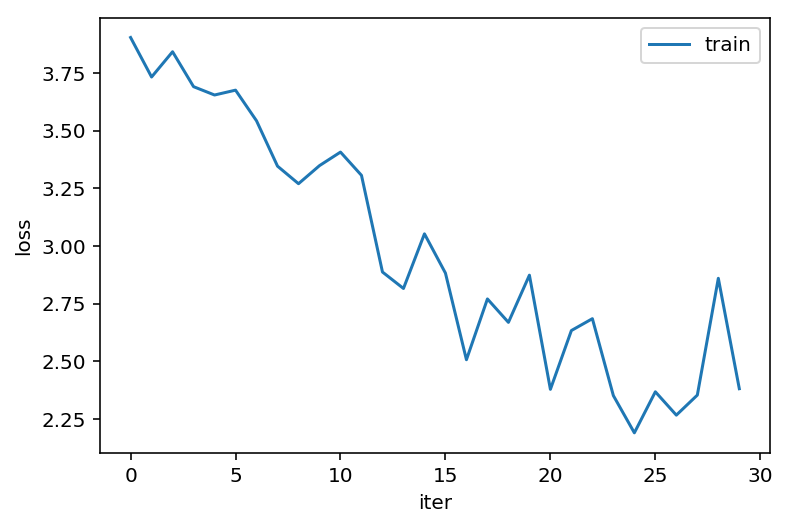

30
Epoch: 30, Iteration: 100, Loss: 2.2936766147613525
Epoch: 30, Iteration: 200, Loss: 1.9333328008651733
Epoch: 30, Iteration: 300, Loss: 2.1217498779296875
Epoch: 30, Iteration: 400, Loss: 1.864384651184082
Epoch: 30, Iteration: 500, Loss: 2.3312418460845947
Epoch: 30, Iteration: 600, Loss: 2.1380774974823
Epoch: 30, Iteration: 700, Loss: 2.540144920349121
Epoch: 30, Iteration: 800, Loss: 2.486785411834717


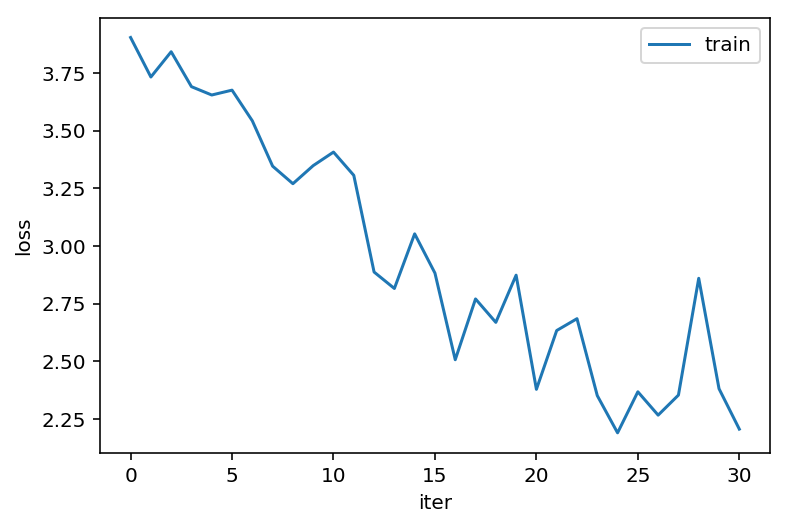

31
Epoch: 31, Iteration: 25, Loss: 2.121278762817383
Epoch: 31, Iteration: 50, Loss: 2.4545328617095947
Epoch: 31, Iteration: 75, Loss: 1.9804661273956299
Epoch: 31, Iteration: 100, Loss: 1.7619259357452393
Epoch: 31, Iteration: 125, Loss: 2.0297317504882812
Epoch: 31, Iteration: 150, Loss: 2.3794760704040527
Epoch: 31, Iteration: 175, Loss: 2.210749626159668
Epoch: 31, Iteration: 200, Loss: 1.7994848489761353
Epoch: 31, Iteration: 225, Loss: 1.99191415309906
Epoch: 31, Iteration: 250, Loss: 2.07613205909729
Epoch: 31, Iteration: 275, Loss: 2.2864890098571777
Epoch: 31, Iteration: 300, Loss: 2.1357083320617676
Epoch: 31, Iteration: 325, Loss: 2.158588409423828
Epoch: 31, Iteration: 350, Loss: 2.1102631092071533
Epoch: 31, Iteration: 375, Loss: 2.1187357902526855
Epoch: 31, Iteration: 400, Loss: 2.4696872234344482
Epoch: 31, Iteration: 425, Loss: 2.1898229122161865
Epoch: 31, Iteration: 450, Loss: 1.8606165647506714
Epoch: 31, Iteration: 475, Loss: 1.9391545057296753
Epoch: 31, Iteratio

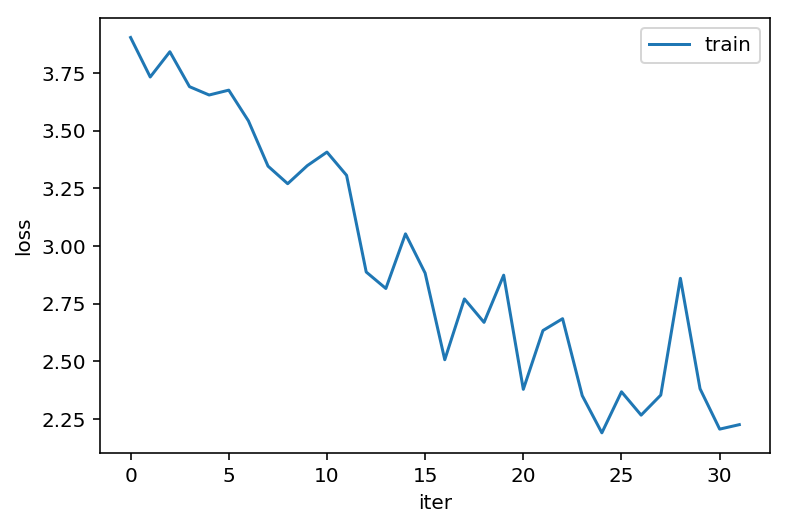

32
Epoch: 32, Iteration: 100, Loss: 1.9110716581344604
Epoch: 32, Iteration: 200, Loss: 1.9458585977554321
Epoch: 32, Iteration: 300, Loss: 2.1831398010253906
Epoch: 32, Iteration: 400, Loss: 2.20940899848938
Epoch: 32, Iteration: 500, Loss: 2.5522191524505615
Epoch: 32, Iteration: 600, Loss: 2.1380960941314697
Epoch: 32, Iteration: 700, Loss: 1.967729926109314
Epoch: 32, Iteration: 800, Loss: 2.7285470962524414


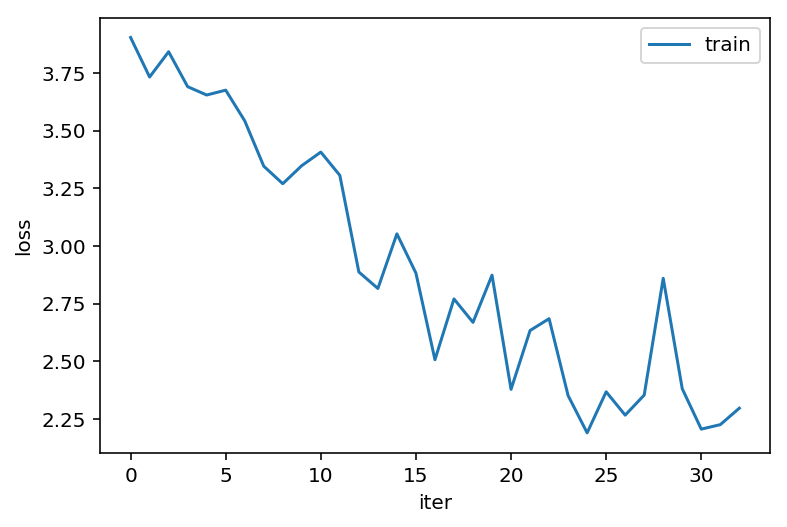

33
Epoch: 33, Iteration: 50, Loss: 2.145930767059326
Epoch: 33, Iteration: 100, Loss: 1.826597809791565
Epoch: 33, Iteration: 150, Loss: 2.2468676567077637
Epoch: 33, Iteration: 200, Loss: 2.051513433456421
Epoch: 33, Iteration: 250, Loss: 1.9970782995224
Epoch: 33, Iteration: 300, Loss: 1.6341168880462646
Epoch: 33, Iteration: 350, Loss: 2.151700258255005
Epoch: 33, Iteration: 400, Loss: 1.9906476736068726
Epoch: 33, Iteration: 450, Loss: 1.9907833337783813
Epoch: 33, Iteration: 500, Loss: 2.0738725662231445
Epoch: 33, Iteration: 550, Loss: 2.305797576904297
Epoch: 33, Iteration: 600, Loss: 1.9217798709869385
Epoch: 33, Iteration: 650, Loss: 2.290318012237549
Epoch: 33, Iteration: 700, Loss: 2.1624770164489746
Epoch: 33, Iteration: 750, Loss: 2.053178071975708
Epoch: 33, Iteration: 800, Loss: 1.972827434539795
Epoch: 33, Iteration: 850, Loss: 2.0681464672088623


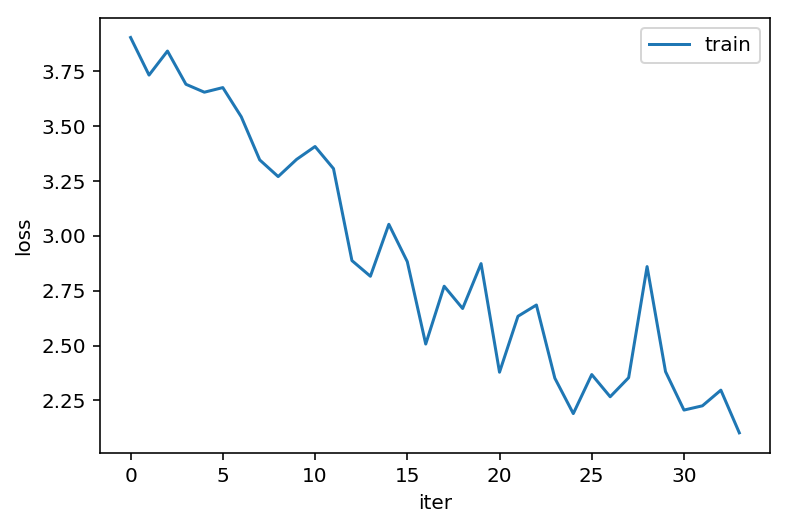

34
Epoch: 34, Iteration: 20, Loss: 1.9530588388442993
Epoch: 34, Iteration: 40, Loss: 2.1172728538513184
Epoch: 34, Iteration: 60, Loss: 2.119645357131958
Epoch: 34, Iteration: 80, Loss: 1.9337984323501587
Epoch: 34, Iteration: 100, Loss: 2.122882843017578
Epoch: 34, Iteration: 120, Loss: 1.9143853187561035
Epoch: 34, Iteration: 140, Loss: 2.2192933559417725
Epoch: 34, Iteration: 160, Loss: 1.6922787427902222
Epoch: 34, Iteration: 180, Loss: 1.3306680917739868
Epoch: 34, Iteration: 200, Loss: 2.31784725189209
Epoch: 34, Iteration: 220, Loss: 2.4379208087921143
Epoch: 34, Iteration: 240, Loss: 2.079331874847412
Epoch: 34, Iteration: 260, Loss: 2.0823161602020264
Epoch: 34, Iteration: 280, Loss: 1.8756846189498901
Epoch: 34, Iteration: 300, Loss: 2.168769121170044
Epoch: 34, Iteration: 320, Loss: 2.2703561782836914
Epoch: 34, Iteration: 340, Loss: 2.171459674835205
Epoch: 34, Iteration: 360, Loss: 2.0907509326934814
Epoch: 34, Iteration: 380, Loss: 2.0704307556152344
Epoch: 34, Iteration

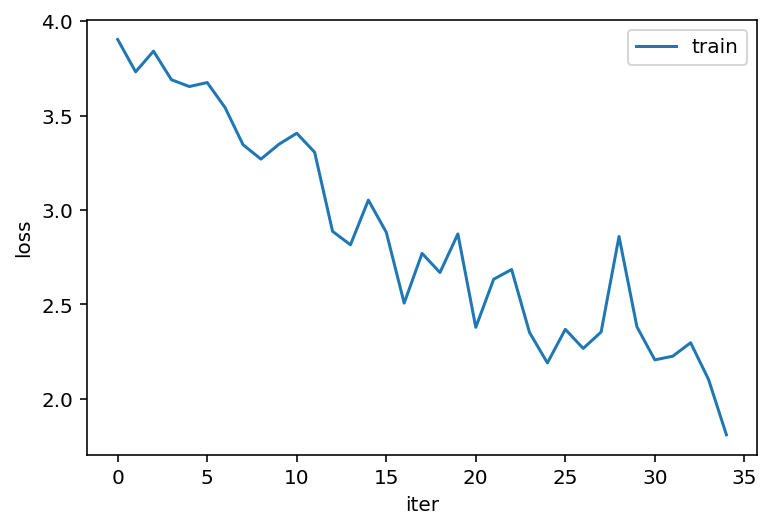

35
Epoch: 35, Iteration: 25, Loss: 1.8171992301940918
Epoch: 35, Iteration: 50, Loss: 1.9388524293899536
Epoch: 35, Iteration: 75, Loss: 1.7095646858215332
Epoch: 35, Iteration: 100, Loss: 2.0667307376861572
Epoch: 35, Iteration: 125, Loss: 1.7176471948623657
Epoch: 35, Iteration: 150, Loss: 2.0411665439605713
Epoch: 35, Iteration: 175, Loss: 2.4402081966400146
Epoch: 35, Iteration: 200, Loss: 1.9577605724334717
Epoch: 35, Iteration: 225, Loss: 1.864566445350647
Epoch: 35, Iteration: 250, Loss: 1.7371532917022705
Epoch: 35, Iteration: 275, Loss: 1.9905396699905396
Epoch: 35, Iteration: 300, Loss: 2.3061609268188477
Epoch: 35, Iteration: 325, Loss: 1.8283425569534302
Epoch: 35, Iteration: 350, Loss: 1.893035650253296
Epoch: 35, Iteration: 375, Loss: 1.8546642065048218
Epoch: 35, Iteration: 400, Loss: 1.7668821811676025
Epoch: 35, Iteration: 425, Loss: 2.0059726238250732
Epoch: 35, Iteration: 450, Loss: 1.9483901262283325
Epoch: 35, Iteration: 475, Loss: 1.5192928314208984
Epoch: 35, Ite

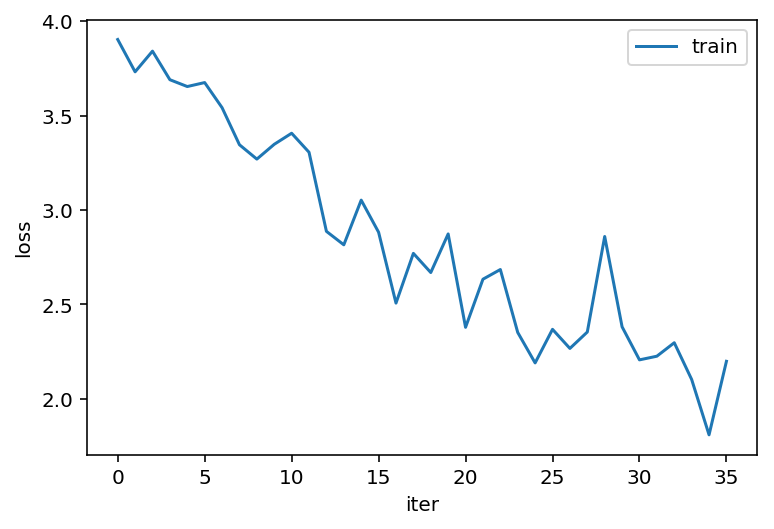

36
Epoch: 36, Iteration: 100, Loss: 2.038567543029785
Epoch: 36, Iteration: 200, Loss: 1.8460485935211182
Epoch: 36, Iteration: 300, Loss: 1.9182076454162598
Epoch: 36, Iteration: 400, Loss: 1.760699987411499
Epoch: 36, Iteration: 500, Loss: 1.857496738433838
Epoch: 36, Iteration: 600, Loss: 2.18634033203125
Epoch: 36, Iteration: 700, Loss: 2.027899980545044
Epoch: 36, Iteration: 800, Loss: 2.2813169956207275


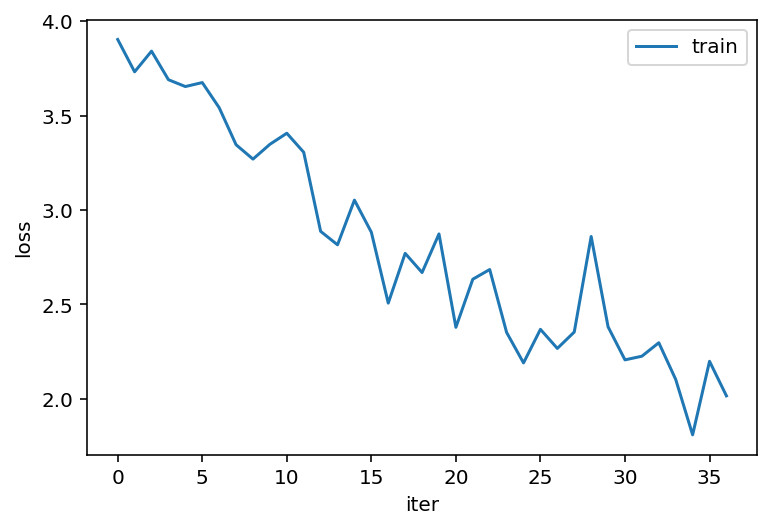

37
Epoch: 37, Iteration: 50, Loss: 1.8908426761627197
Epoch: 37, Iteration: 100, Loss: 1.8999392986297607
Epoch: 37, Iteration: 150, Loss: 2.1663436889648438
Epoch: 37, Iteration: 200, Loss: 1.9783544540405273
Epoch: 37, Iteration: 250, Loss: 1.365918517112732
Epoch: 37, Iteration: 300, Loss: 2.1385068893432617
Epoch: 37, Iteration: 350, Loss: 1.854044795036316
Epoch: 37, Iteration: 400, Loss: 1.9192228317260742
Epoch: 37, Iteration: 450, Loss: 1.8964130878448486
Epoch: 37, Iteration: 500, Loss: 1.9514495134353638
Epoch: 37, Iteration: 550, Loss: 1.5680211782455444
Epoch: 37, Iteration: 600, Loss: 2.2385265827178955
Epoch: 37, Iteration: 650, Loss: 1.9224694967269897
Epoch: 37, Iteration: 700, Loss: 2.3237953186035156
Epoch: 37, Iteration: 750, Loss: 1.7383990287780762
Epoch: 37, Iteration: 800, Loss: 2.017157793045044
Epoch: 37, Iteration: 850, Loss: 2.0463995933532715


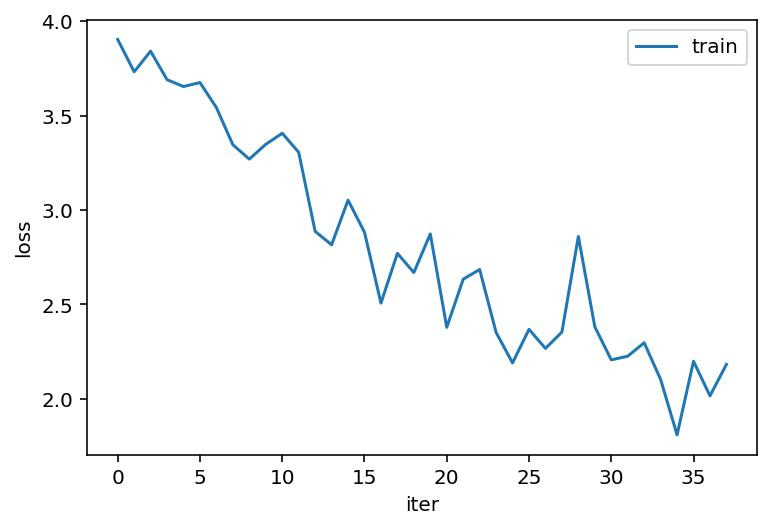

38
Epoch: 38, Iteration: 100, Loss: 1.5907005071640015
Epoch: 38, Iteration: 200, Loss: 1.5423550605773926
Epoch: 38, Iteration: 300, Loss: 1.8775876760482788
Epoch: 38, Iteration: 400, Loss: 1.858217477798462
Epoch: 38, Iteration: 500, Loss: 1.72659432888031
Epoch: 38, Iteration: 600, Loss: 2.1386983394622803
Epoch: 38, Iteration: 700, Loss: 2.0171830654144287
Epoch: 38, Iteration: 800, Loss: 1.6247448921203613


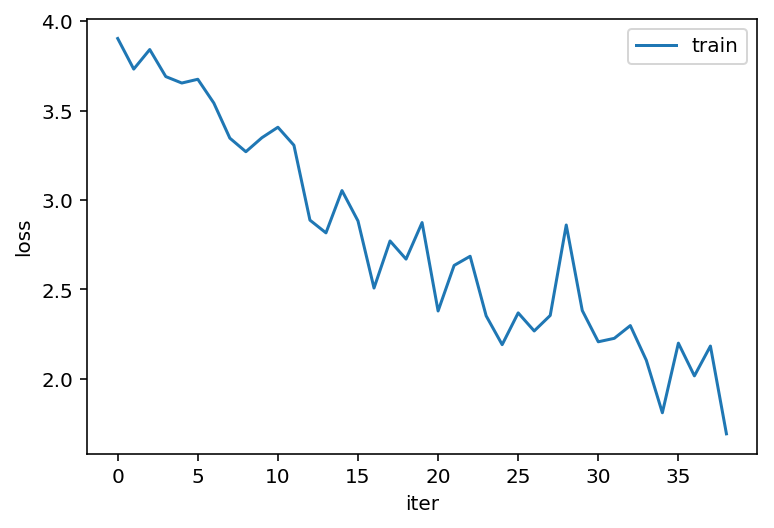

39
Epoch: 39, Iteration: 5, Loss: 1.8142472505569458
Epoch: 39, Iteration: 10, Loss: 1.6338696479797363
Epoch: 39, Iteration: 15, Loss: 2.0981600284576416
Epoch: 39, Iteration: 20, Loss: 1.6382503509521484
Epoch: 39, Iteration: 25, Loss: 1.6397947072982788
Epoch: 39, Iteration: 30, Loss: 2.023024320602417
Epoch: 39, Iteration: 35, Loss: 2.074187755584717
Epoch: 39, Iteration: 40, Loss: 1.5754830837249756
Epoch: 39, Iteration: 45, Loss: 2.0597827434539795
Epoch: 39, Iteration: 50, Loss: 1.5235956907272339
Epoch: 39, Iteration: 55, Loss: 2.0044028759002686
Epoch: 39, Iteration: 60, Loss: 2.375781536102295
Epoch: 39, Iteration: 65, Loss: 1.656282663345337
Epoch: 39, Iteration: 70, Loss: 1.9062130451202393
Epoch: 39, Iteration: 75, Loss: 1.8630335330963135
Epoch: 39, Iteration: 80, Loss: 1.7478253841400146
Epoch: 39, Iteration: 85, Loss: 1.7188704013824463
Epoch: 39, Iteration: 90, Loss: 1.592058539390564
Epoch: 39, Iteration: 95, Loss: 2.1805713176727295
Epoch: 39, Iteration: 100, Loss: 2

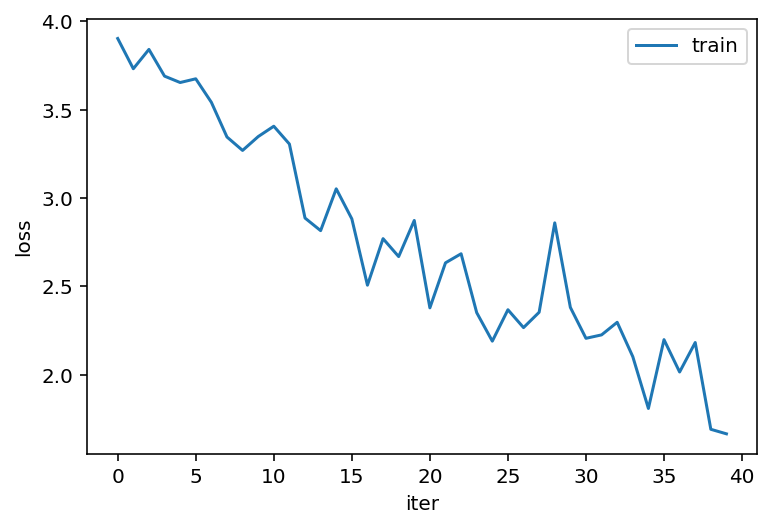

40
Epoch: 40, Iteration: 100, Loss: 1.9004623889923096
Epoch: 40, Iteration: 200, Loss: 1.5949327945709229
Epoch: 40, Iteration: 300, Loss: 1.7755417823791504
Epoch: 40, Iteration: 400, Loss: 2.0901501178741455
Epoch: 40, Iteration: 500, Loss: 1.5528026819229126
Epoch: 40, Iteration: 600, Loss: 2.2081239223480225
Epoch: 40, Iteration: 700, Loss: 1.8544036149978638
Epoch: 40, Iteration: 800, Loss: 1.8854855298995972


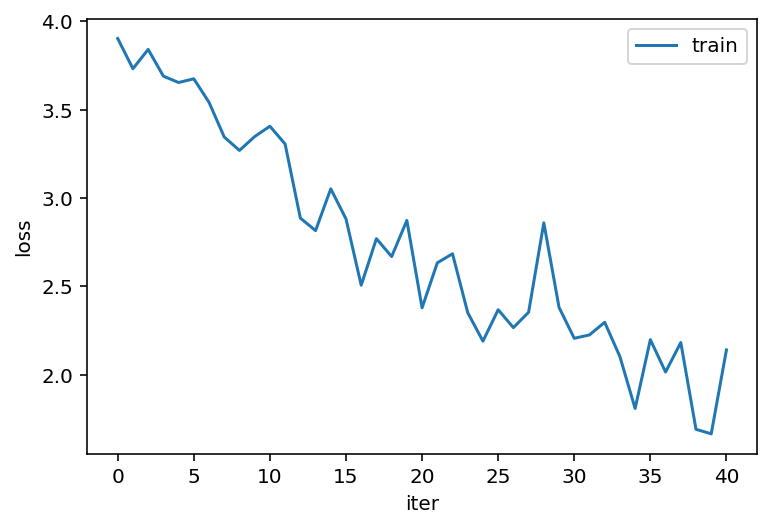

41
Epoch: 41, Iteration: 50, Loss: 1.976380467414856
Epoch: 41, Iteration: 100, Loss: 1.4745235443115234
Epoch: 41, Iteration: 150, Loss: 2.0041890144348145
Epoch: 41, Iteration: 200, Loss: 2.1987428665161133
Epoch: 41, Iteration: 250, Loss: 1.2943755388259888
Epoch: 41, Iteration: 300, Loss: 2.107570171356201
Epoch: 41, Iteration: 350, Loss: 2.047434091567993
Epoch: 41, Iteration: 400, Loss: 2.1817309856414795
Epoch: 41, Iteration: 450, Loss: 1.6212139129638672
Epoch: 41, Iteration: 500, Loss: 2.0822229385375977
Epoch: 41, Iteration: 550, Loss: 1.7174336910247803
Epoch: 41, Iteration: 600, Loss: 2.006815195083618
Epoch: 41, Iteration: 650, Loss: 1.8867546319961548
Epoch: 41, Iteration: 700, Loss: 2.1650497913360596
Epoch: 41, Iteration: 750, Loss: 1.792984127998352
Epoch: 41, Iteration: 800, Loss: 1.9977399110794067
Epoch: 41, Iteration: 850, Loss: 1.9274011850357056


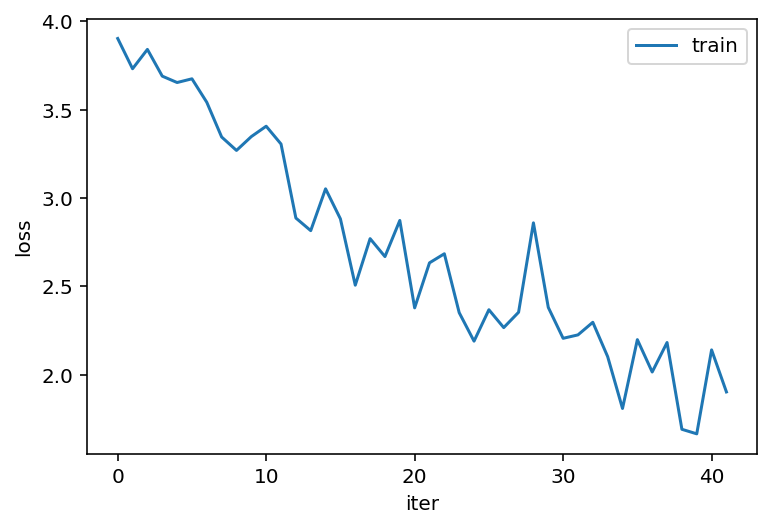

42
Epoch: 42, Iteration: 100, Loss: 1.8577343225479126
Epoch: 42, Iteration: 200, Loss: 1.9776238203048706
Epoch: 42, Iteration: 300, Loss: 1.6213070154190063
Epoch: 42, Iteration: 400, Loss: 1.7070980072021484
Epoch: 42, Iteration: 500, Loss: 1.6738996505737305
Epoch: 42, Iteration: 600, Loss: 1.888074278831482
Epoch: 42, Iteration: 700, Loss: 1.979445457458496
Epoch: 42, Iteration: 800, Loss: 1.9835286140441895


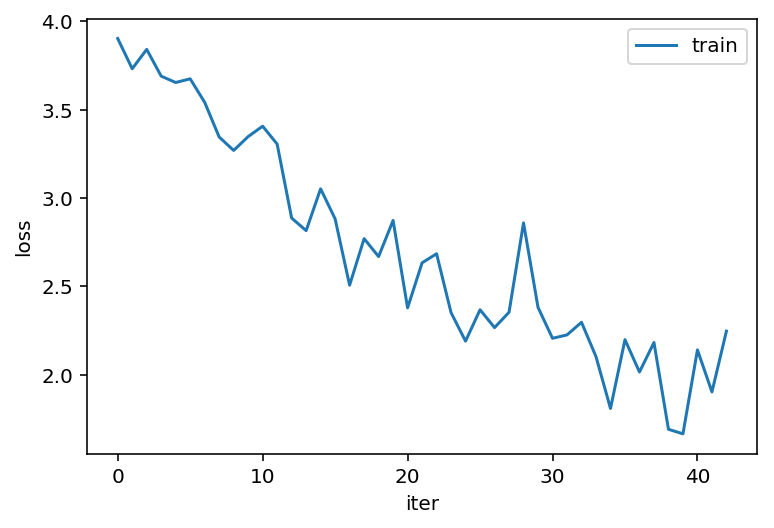

43
Epoch: 43, Iteration: 25, Loss: 2.063826322555542
Epoch: 43, Iteration: 50, Loss: 1.9509588479995728
Epoch: 43, Iteration: 75, Loss: 1.8379191160202026
Epoch: 43, Iteration: 100, Loss: 1.8532248735427856
Epoch: 43, Iteration: 125, Loss: 1.727165699005127
Epoch: 43, Iteration: 150, Loss: 1.7489206790924072
Epoch: 43, Iteration: 175, Loss: 1.7948026657104492
Epoch: 43, Iteration: 200, Loss: 1.7534334659576416
Epoch: 43, Iteration: 225, Loss: 1.8127565383911133
Epoch: 43, Iteration: 250, Loss: 1.9761855602264404
Epoch: 43, Iteration: 275, Loss: 1.7649011611938477
Epoch: 43, Iteration: 300, Loss: 2.147692918777466
Epoch: 43, Iteration: 325, Loss: 2.0298988819122314
Epoch: 43, Iteration: 350, Loss: 1.6859028339385986
Epoch: 43, Iteration: 375, Loss: 1.5934396982192993
Epoch: 43, Iteration: 400, Loss: 1.9838279485702515
Epoch: 43, Iteration: 425, Loss: 2.0181491374969482
Epoch: 43, Iteration: 450, Loss: 1.8322731256484985
Epoch: 43, Iteration: 475, Loss: 1.9791791439056396
Epoch: 43, Iter

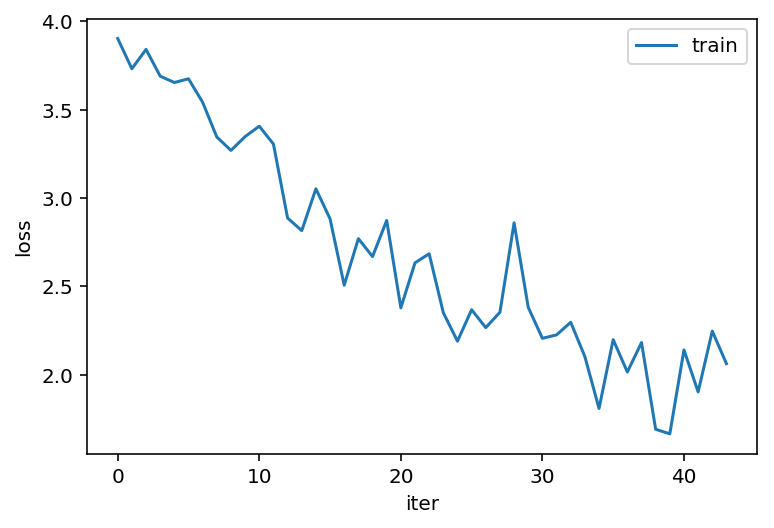

44
Epoch: 44, Iteration: 20, Loss: 1.9021912813186646
Epoch: 44, Iteration: 40, Loss: 1.6032050848007202
Epoch: 44, Iteration: 60, Loss: 1.8070966005325317
Epoch: 44, Iteration: 80, Loss: 2.1794393062591553
Epoch: 44, Iteration: 100, Loss: 1.4431912899017334
Epoch: 44, Iteration: 120, Loss: 1.3351455926895142
Epoch: 44, Iteration: 140, Loss: 1.7713687419891357
Epoch: 44, Iteration: 160, Loss: 1.7075817584991455
Epoch: 44, Iteration: 180, Loss: 1.7899909019470215
Epoch: 44, Iteration: 200, Loss: 1.7839787006378174
Epoch: 44, Iteration: 220, Loss: 1.6451736688613892
Epoch: 44, Iteration: 240, Loss: 1.7944977283477783
Epoch: 44, Iteration: 260, Loss: 1.4789429903030396
Epoch: 44, Iteration: 280, Loss: 1.875123381614685
Epoch: 44, Iteration: 300, Loss: 1.7402136325836182
Epoch: 44, Iteration: 320, Loss: 1.9266306161880493
Epoch: 44, Iteration: 340, Loss: 2.1223323345184326
Epoch: 44, Iteration: 360, Loss: 1.90736722946167
Epoch: 44, Iteration: 380, Loss: 1.674790859222412
Epoch: 44, Iterat

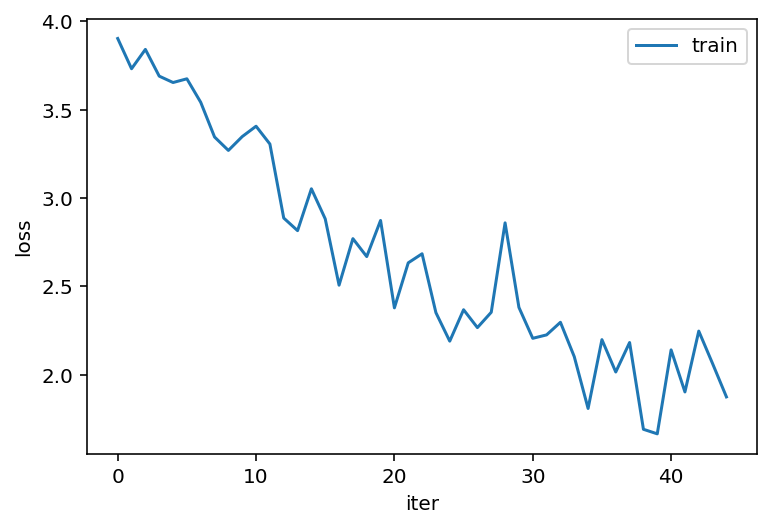

45
Epoch: 45, Iteration: 50, Loss: 1.9565366506576538
Epoch: 45, Iteration: 100, Loss: 2.0083348751068115
Epoch: 45, Iteration: 150, Loss: 1.6206434965133667
Epoch: 45, Iteration: 200, Loss: 1.9295837879180908
Epoch: 45, Iteration: 250, Loss: 1.9106593132019043
Epoch: 45, Iteration: 300, Loss: 1.7922942638397217
Epoch: 45, Iteration: 350, Loss: 1.9061051607131958
Epoch: 45, Iteration: 400, Loss: 1.946221947669983
Epoch: 45, Iteration: 450, Loss: 1.6961127519607544
Epoch: 45, Iteration: 500, Loss: 1.7445347309112549
Epoch: 45, Iteration: 550, Loss: 1.426184892654419
Epoch: 45, Iteration: 600, Loss: 2.2738866806030273
Epoch: 45, Iteration: 650, Loss: 1.2746859788894653
Epoch: 45, Iteration: 700, Loss: 1.9037516117095947
Epoch: 45, Iteration: 750, Loss: 1.6534148454666138
Epoch: 45, Iteration: 800, Loss: 2.247551918029785
Epoch: 45, Iteration: 850, Loss: 1.7934402227401733


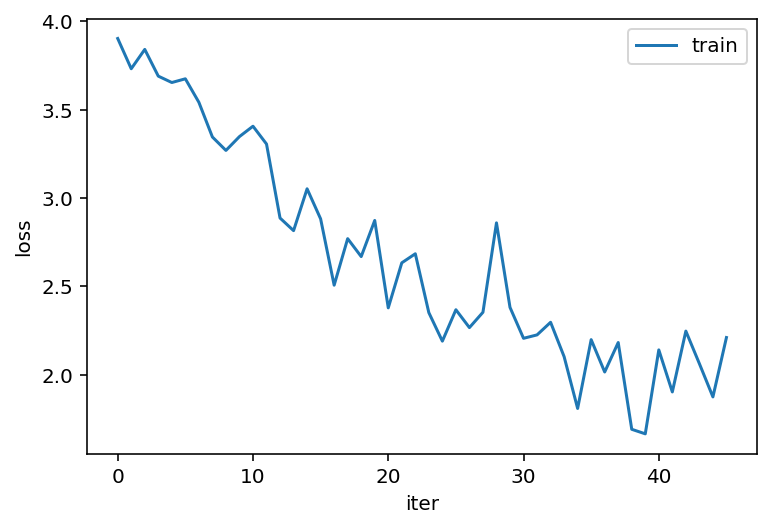

46
Epoch: 46, Iteration: 100, Loss: 1.8600808382034302
Epoch: 46, Iteration: 200, Loss: 1.7862601280212402
Epoch: 46, Iteration: 300, Loss: 1.6239618062973022
Epoch: 46, Iteration: 400, Loss: 1.5622258186340332
Epoch: 46, Iteration: 500, Loss: 1.9396530389785767
Epoch: 46, Iteration: 600, Loss: 2.1111538410186768
Epoch: 46, Iteration: 700, Loss: 1.5584839582443237
Epoch: 46, Iteration: 800, Loss: 2.2734251022338867


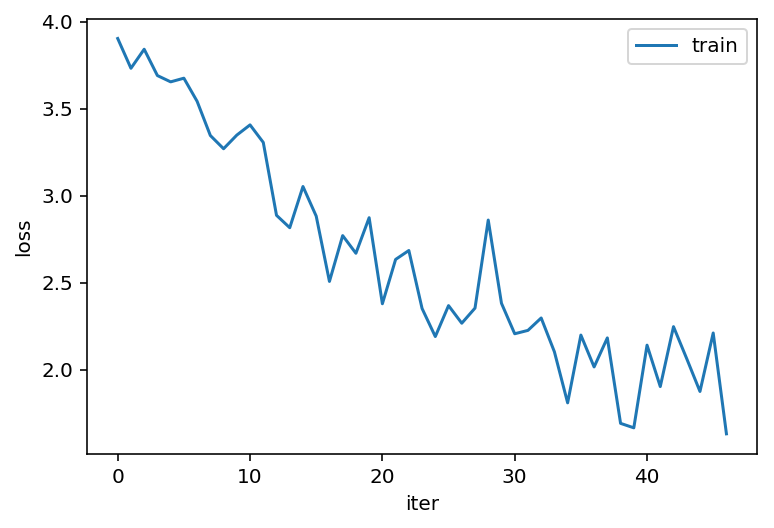

47
Epoch: 47, Iteration: 25, Loss: 1.7323836088180542
Epoch: 47, Iteration: 50, Loss: 1.789003610610962
Epoch: 47, Iteration: 75, Loss: 1.627199649810791
Epoch: 47, Iteration: 100, Loss: 1.718190312385559
Epoch: 47, Iteration: 125, Loss: 2.1169824600219727
Epoch: 47, Iteration: 150, Loss: 1.5804787874221802
Epoch: 47, Iteration: 175, Loss: 1.5474227666854858
Epoch: 47, Iteration: 200, Loss: 1.5216883420944214
Epoch: 47, Iteration: 225, Loss: 1.7701070308685303
Epoch: 47, Iteration: 250, Loss: 2.113260269165039
Epoch: 47, Iteration: 275, Loss: 1.4601548910140991
Epoch: 47, Iteration: 300, Loss: 1.5896378755569458
Epoch: 47, Iteration: 325, Loss: 2.2312939167022705
Epoch: 47, Iteration: 350, Loss: 1.5888032913208008
Epoch: 47, Iteration: 375, Loss: 2.047957181930542
Epoch: 47, Iteration: 400, Loss: 1.8297619819641113
Epoch: 47, Iteration: 425, Loss: 1.4860855340957642
Epoch: 47, Iteration: 450, Loss: 1.8321187496185303
Epoch: 47, Iteration: 475, Loss: 1.633954644203186
Epoch: 47, Iterati

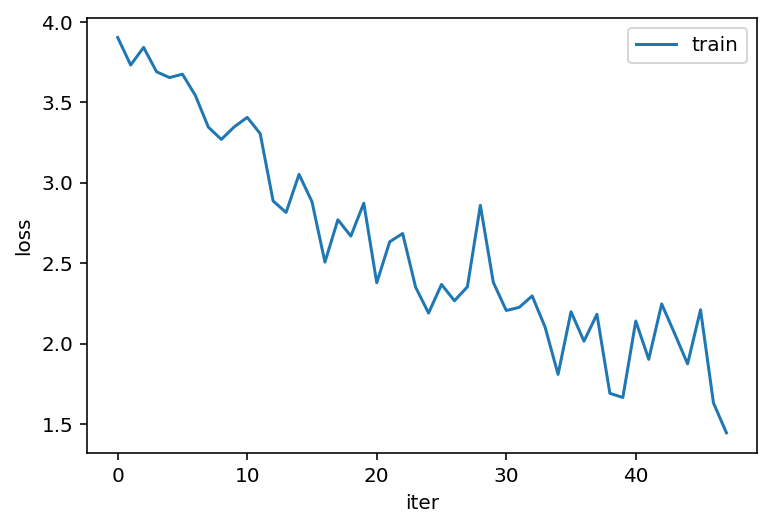

48
Epoch: 48, Iteration: 100, Loss: 1.8354912996292114
Epoch: 48, Iteration: 200, Loss: 1.7723921537399292
Epoch: 48, Iteration: 300, Loss: 1.8261724710464478
Epoch: 48, Iteration: 400, Loss: 1.9162628650665283
Epoch: 48, Iteration: 500, Loss: 1.9572184085845947
Epoch: 48, Iteration: 600, Loss: 2.0902299880981445
Epoch: 48, Iteration: 700, Loss: 1.55402672290802
Epoch: 48, Iteration: 800, Loss: 1.4790741205215454


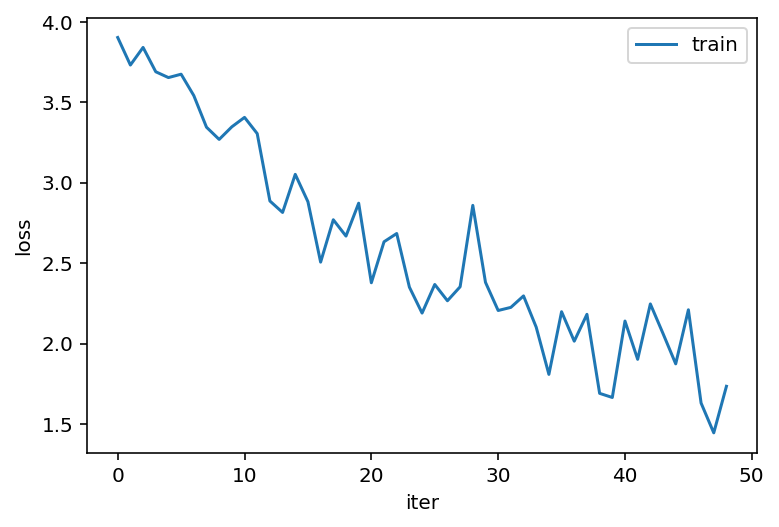

49
Epoch: 49, Iteration: 2, Loss: 1.6875320672988892
Epoch: 49, Iteration: 4, Loss: 1.9544601440429688
Epoch: 49, Iteration: 6, Loss: 1.7724995613098145
Epoch: 49, Iteration: 8, Loss: 1.4736655950546265
Epoch: 49, Iteration: 10, Loss: 1.6249759197235107
Epoch: 49, Iteration: 12, Loss: 1.5617034435272217
Epoch: 49, Iteration: 14, Loss: 1.9764587879180908
Epoch: 49, Iteration: 16, Loss: 1.6771036386489868
Epoch: 49, Iteration: 18, Loss: 1.46656334400177
Epoch: 49, Iteration: 20, Loss: 1.8829289674758911
Epoch: 49, Iteration: 22, Loss: 1.9955122470855713
Epoch: 49, Iteration: 24, Loss: 1.79050612449646
Epoch: 49, Iteration: 26, Loss: 1.4830905199050903
Epoch: 49, Iteration: 28, Loss: 1.473780632019043
Epoch: 49, Iteration: 30, Loss: 1.918976902961731
Epoch: 49, Iteration: 32, Loss: 1.635597825050354
Epoch: 49, Iteration: 34, Loss: 1.7678934335708618
Epoch: 49, Iteration: 36, Loss: 1.5454498529434204
Epoch: 49, Iteration: 38, Loss: 1.5524744987487793
Epoch: 49, Iteration: 40, Loss: 1.62478

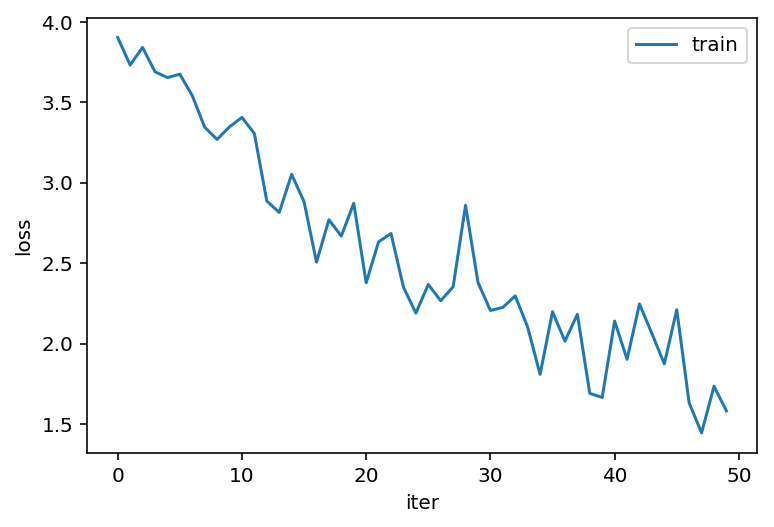

50
Epoch: 50, Iteration: 100, Loss: 1.9368281364440918
Epoch: 50, Iteration: 200, Loss: 1.6095073223114014
Epoch: 50, Iteration: 300, Loss: 1.6526389122009277
Epoch: 50, Iteration: 400, Loss: 1.9440473318099976
Epoch: 50, Iteration: 500, Loss: 1.446283221244812
Epoch: 50, Iteration: 600, Loss: 1.5996756553649902
Epoch: 50, Iteration: 700, Loss: 1.9721298217773438
Epoch: 50, Iteration: 800, Loss: 1.6418370008468628


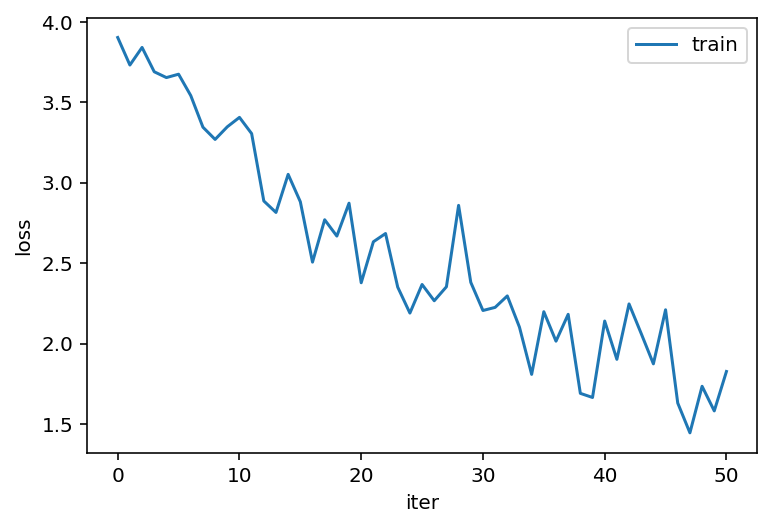

51
Epoch: 51, Iteration: 25, Loss: 1.6894874572753906
Epoch: 51, Iteration: 50, Loss: 1.6955090761184692
Epoch: 51, Iteration: 75, Loss: 1.7118457555770874
Epoch: 51, Iteration: 100, Loss: 2.2034988403320312
Epoch: 51, Iteration: 125, Loss: 1.4391831159591675
Epoch: 51, Iteration: 150, Loss: 1.9724030494689941
Epoch: 51, Iteration: 175, Loss: 1.4611127376556396
Epoch: 51, Iteration: 200, Loss: 1.7743278741836548
Epoch: 51, Iteration: 225, Loss: 1.5592846870422363
Epoch: 51, Iteration: 250, Loss: 1.740325927734375
Epoch: 51, Iteration: 275, Loss: 1.6537054777145386
Epoch: 51, Iteration: 300, Loss: 1.2720133066177368
Epoch: 51, Iteration: 325, Loss: 1.451648235321045
Epoch: 51, Iteration: 350, Loss: 1.7316712141036987
Epoch: 51, Iteration: 375, Loss: 1.6242567300796509
Epoch: 51, Iteration: 400, Loss: 1.8820658922195435
Epoch: 51, Iteration: 425, Loss: 1.5502195358276367
Epoch: 51, Iteration: 450, Loss: 1.5675712823867798
Epoch: 51, Iteration: 475, Loss: 2.0927557945251465
Epoch: 51, Ite

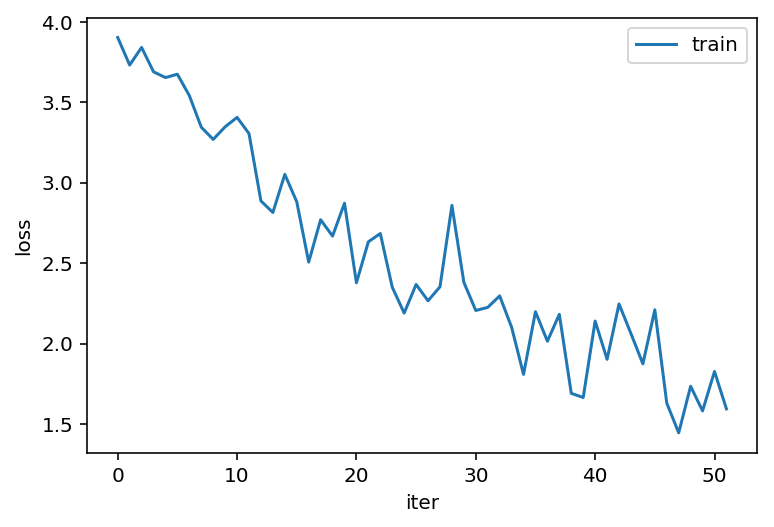

52
Epoch: 52, Iteration: 100, Loss: 2.0694079399108887
Epoch: 52, Iteration: 200, Loss: 1.7504993677139282
Epoch: 52, Iteration: 300, Loss: 1.7173233032226562
Epoch: 52, Iteration: 400, Loss: 1.6821420192718506
Epoch: 52, Iteration: 500, Loss: 2.0122594833374023
Epoch: 52, Iteration: 600, Loss: 1.6527409553527832
Epoch: 52, Iteration: 700, Loss: 1.9167652130126953
Epoch: 52, Iteration: 800, Loss: 1.5771652460098267


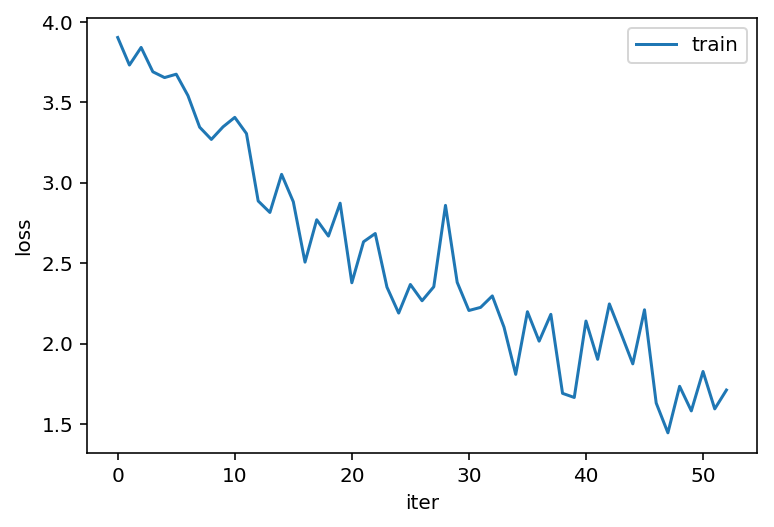

53
Epoch: 53, Iteration: 50, Loss: 1.4762582778930664
Epoch: 53, Iteration: 100, Loss: 1.6390142440795898
Epoch: 53, Iteration: 150, Loss: 1.7120059728622437
Epoch: 53, Iteration: 200, Loss: 1.6724441051483154
Epoch: 53, Iteration: 250, Loss: 1.8045849800109863
Epoch: 53, Iteration: 300, Loss: 1.7371233701705933
Epoch: 53, Iteration: 350, Loss: 1.5332242250442505
Epoch: 53, Iteration: 400, Loss: 2.170757532119751
Epoch: 53, Iteration: 450, Loss: 1.523176670074463
Epoch: 53, Iteration: 500, Loss: 1.8692671060562134
Epoch: 53, Iteration: 550, Loss: 1.8805086612701416
Epoch: 53, Iteration: 600, Loss: 1.5582095384597778
Epoch: 53, Iteration: 650, Loss: 1.7154160737991333
Epoch: 53, Iteration: 700, Loss: 1.8479329347610474
Epoch: 53, Iteration: 750, Loss: 1.3291000127792358
Epoch: 53, Iteration: 800, Loss: 1.7005811929702759
Epoch: 53, Iteration: 850, Loss: 1.681777000427246


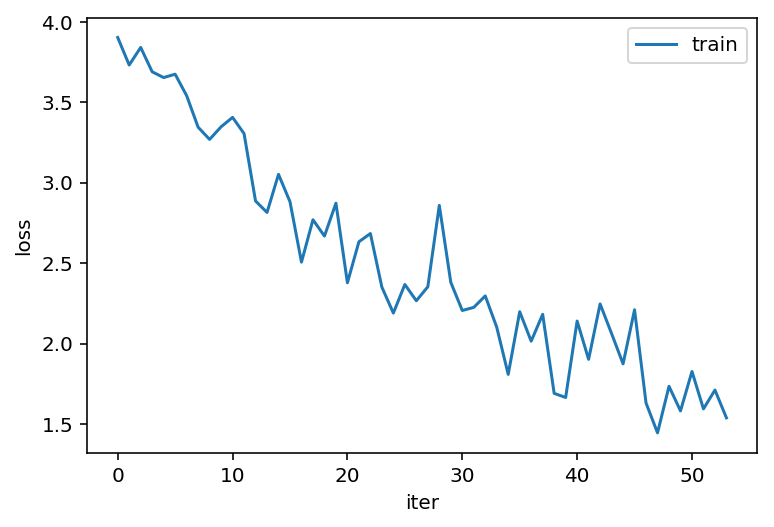

54
Epoch: 54, Iteration: 20, Loss: 1.608862280845642
Epoch: 54, Iteration: 40, Loss: 1.3292778730392456
Epoch: 54, Iteration: 60, Loss: 1.768781065940857
Epoch: 54, Iteration: 80, Loss: 1.5118687152862549
Epoch: 54, Iteration: 100, Loss: 1.9353221654891968
Epoch: 54, Iteration: 120, Loss: 1.5914074182510376
Epoch: 54, Iteration: 140, Loss: 1.7946537733078003
Epoch: 54, Iteration: 160, Loss: 1.5826798677444458
Epoch: 54, Iteration: 180, Loss: 1.8503086566925049
Epoch: 54, Iteration: 200, Loss: 1.8360233306884766
Epoch: 54, Iteration: 220, Loss: 1.8405076265335083
Epoch: 54, Iteration: 240, Loss: 1.4782283306121826
Epoch: 54, Iteration: 260, Loss: 1.8409550189971924
Epoch: 54, Iteration: 280, Loss: 1.4864171743392944
Epoch: 54, Iteration: 300, Loss: 1.538082480430603
Epoch: 54, Iteration: 320, Loss: 1.6429877281188965
Epoch: 54, Iteration: 340, Loss: 1.5904252529144287
Epoch: 54, Iteration: 360, Loss: 1.5970697402954102
Epoch: 54, Iteration: 380, Loss: 1.7694672346115112
Epoch: 54, Itera

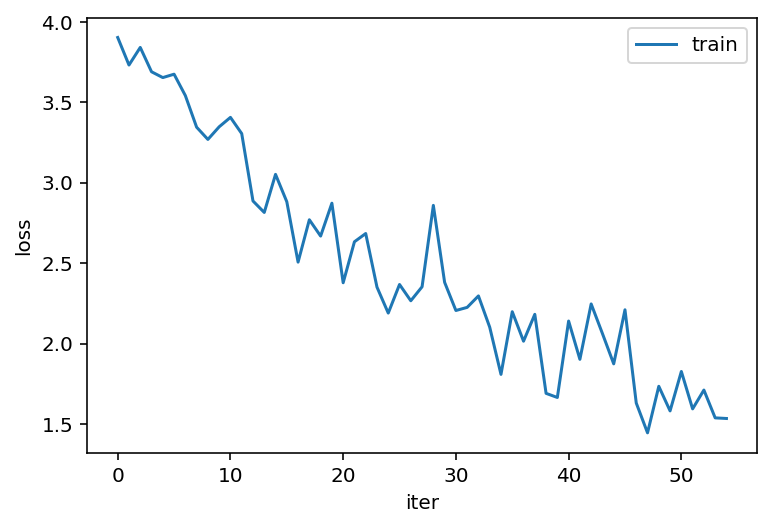

55
Epoch: 55, Iteration: 25, Loss: 1.583561658859253
Epoch: 55, Iteration: 50, Loss: 1.3064759969711304
Epoch: 55, Iteration: 75, Loss: 1.5226370096206665
Epoch: 55, Iteration: 100, Loss: 1.5619597434997559
Epoch: 55, Iteration: 125, Loss: 1.7248371839523315
Epoch: 55, Iteration: 150, Loss: 1.7691676616668701
Epoch: 55, Iteration: 175, Loss: 1.5030443668365479
Epoch: 55, Iteration: 200, Loss: 1.765504002571106
Epoch: 55, Iteration: 225, Loss: 1.3529126644134521
Epoch: 55, Iteration: 250, Loss: 1.77712881565094
Epoch: 55, Iteration: 275, Loss: 1.3097617626190186
Epoch: 55, Iteration: 300, Loss: 1.7143083810806274
Epoch: 55, Iteration: 325, Loss: 1.5828757286071777
Epoch: 55, Iteration: 350, Loss: 1.860844373703003
Epoch: 55, Iteration: 375, Loss: 1.680816411972046
Epoch: 55, Iteration: 400, Loss: 1.7369052171707153
Epoch: 55, Iteration: 425, Loss: 1.8761284351348877
Epoch: 55, Iteration: 450, Loss: 1.7808955907821655
Epoch: 55, Iteration: 475, Loss: 1.547744631767273
Epoch: 55, Iteratio

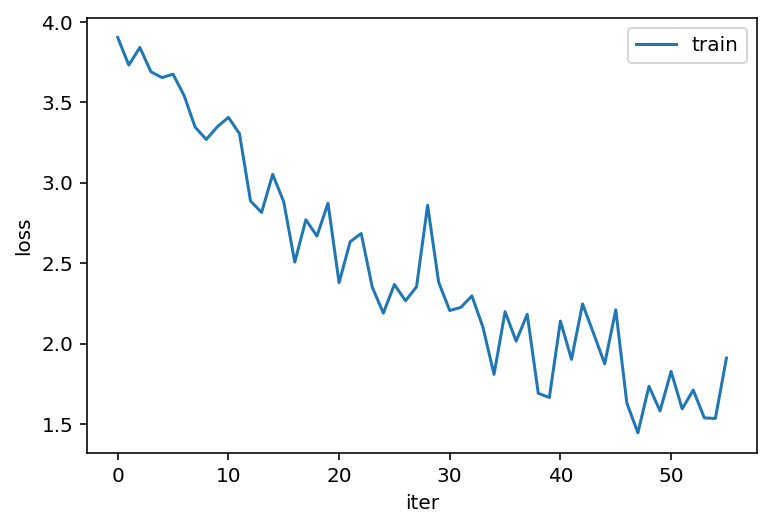

56
Epoch: 56, Iteration: 100, Loss: 1.3671140670776367
Epoch: 56, Iteration: 200, Loss: 1.315259575843811
Epoch: 56, Iteration: 300, Loss: 1.7489514350891113
Epoch: 56, Iteration: 400, Loss: 1.6809834241867065
Epoch: 56, Iteration: 500, Loss: 1.6441584825515747
Epoch: 56, Iteration: 600, Loss: 1.9923415184020996
Epoch: 56, Iteration: 700, Loss: 1.6165740489959717
Epoch: 56, Iteration: 800, Loss: 1.5453017950057983


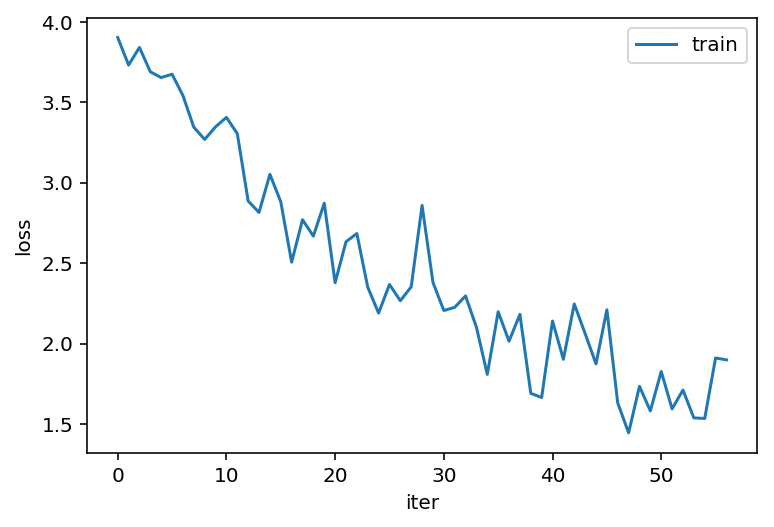

57
Epoch: 57, Iteration: 50, Loss: 1.772554874420166
Epoch: 57, Iteration: 100, Loss: 1.574744462966919
Epoch: 57, Iteration: 150, Loss: 1.2703025341033936
Epoch: 57, Iteration: 200, Loss: 1.8334991931915283
Epoch: 57, Iteration: 250, Loss: 1.437401533126831
Epoch: 57, Iteration: 300, Loss: 1.53241765499115
Epoch: 57, Iteration: 350, Loss: 1.6325727701187134
Epoch: 57, Iteration: 400, Loss: 1.3785614967346191
Epoch: 57, Iteration: 450, Loss: 1.2717057466506958
Epoch: 57, Iteration: 500, Loss: 1.734574556350708
Epoch: 57, Iteration: 550, Loss: 2.022347927093506
Epoch: 57, Iteration: 600, Loss: 1.6615469455718994
Epoch: 57, Iteration: 650, Loss: 1.4300440549850464
Epoch: 57, Iteration: 700, Loss: 1.6209650039672852
Epoch: 57, Iteration: 750, Loss: 1.909308671951294
Epoch: 57, Iteration: 800, Loss: 2.066331386566162
Epoch: 57, Iteration: 850, Loss: 1.8375358581542969


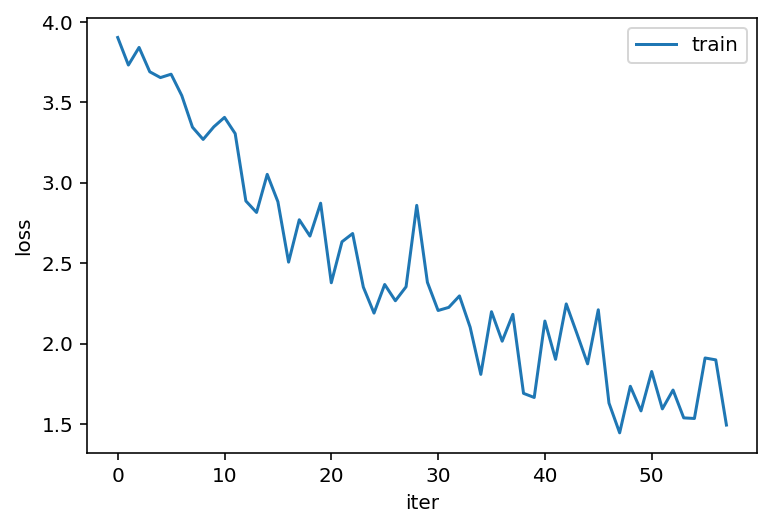

58
Epoch: 58, Iteration: 100, Loss: 1.5342004299163818
Epoch: 58, Iteration: 200, Loss: 1.5334597826004028
Epoch: 58, Iteration: 300, Loss: 1.535914659500122
Epoch: 58, Iteration: 400, Loss: 1.436741590499878
Epoch: 58, Iteration: 500, Loss: 1.601532220840454
Epoch: 58, Iteration: 600, Loss: 1.7128541469573975
Epoch: 58, Iteration: 700, Loss: 1.5885062217712402
Epoch: 58, Iteration: 800, Loss: 2.241494655609131


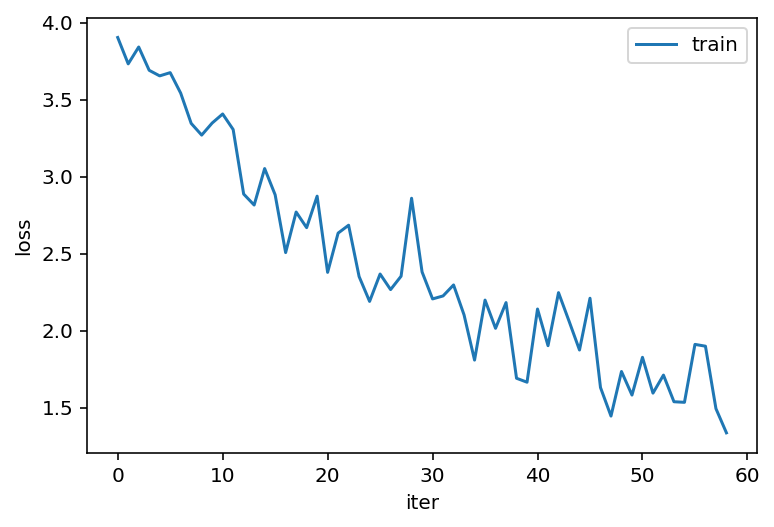

59
Epoch: 59, Iteration: 5, Loss: 1.7538855075836182
Epoch: 59, Iteration: 10, Loss: 1.857195258140564
Epoch: 59, Iteration: 15, Loss: 1.4640908241271973
Epoch: 59, Iteration: 20, Loss: 1.6045734882354736
Epoch: 59, Iteration: 25, Loss: 1.561900019645691
Epoch: 59, Iteration: 30, Loss: 1.4462265968322754
Epoch: 59, Iteration: 35, Loss: 1.649122714996338
Epoch: 59, Iteration: 40, Loss: 1.9378575086593628
Epoch: 59, Iteration: 45, Loss: 1.118133783340454
Epoch: 59, Iteration: 50, Loss: 1.3784878253936768
Epoch: 59, Iteration: 55, Loss: 1.8709543943405151
Epoch: 59, Iteration: 60, Loss: 1.762237310409546
Epoch: 59, Iteration: 65, Loss: 1.6437958478927612
Epoch: 59, Iteration: 70, Loss: 1.2795145511627197
Epoch: 59, Iteration: 75, Loss: 1.7816647291183472
Epoch: 59, Iteration: 80, Loss: 1.8594450950622559
Epoch: 59, Iteration: 85, Loss: 1.4844064712524414
Epoch: 59, Iteration: 90, Loss: 1.3176944255828857
Epoch: 59, Iteration: 95, Loss: 1.6970371007919312
Epoch: 59, Iteration: 100, Loss: 1

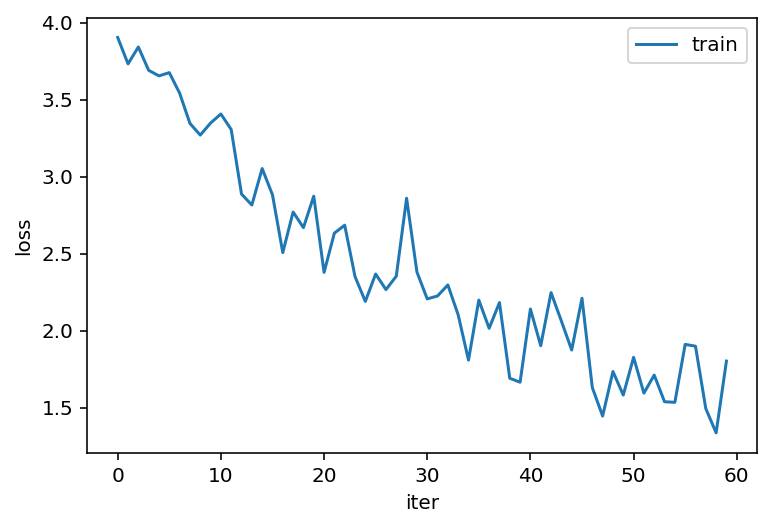

60
Epoch: 60, Iteration: 100, Loss: 1.8610365390777588
Epoch: 60, Iteration: 200, Loss: 1.628778100013733
Epoch: 60, Iteration: 300, Loss: 1.4162348508834839
Epoch: 60, Iteration: 400, Loss: 2.085484266281128
Epoch: 60, Iteration: 500, Loss: 2.001490592956543
Epoch: 60, Iteration: 600, Loss: 2.021695852279663
Epoch: 60, Iteration: 700, Loss: 1.7781895399093628
Epoch: 60, Iteration: 800, Loss: 1.1678072214126587


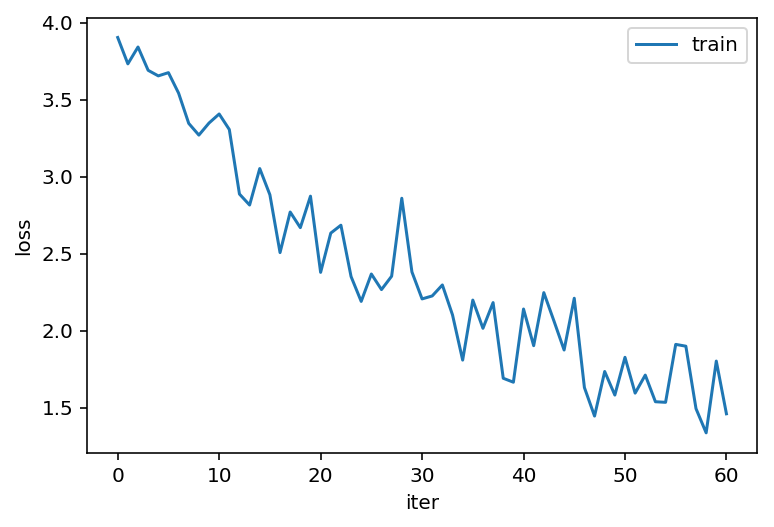

61
Epoch: 61, Iteration: 50, Loss: 1.6531097888946533
Epoch: 61, Iteration: 100, Loss: 1.7817598581314087
Epoch: 61, Iteration: 150, Loss: 1.6175174713134766
Epoch: 61, Iteration: 200, Loss: 1.8645260334014893
Epoch: 61, Iteration: 250, Loss: 1.8765712976455688
Epoch: 61, Iteration: 300, Loss: 1.5893827676773071
Epoch: 61, Iteration: 350, Loss: 1.7689814567565918
Epoch: 61, Iteration: 400, Loss: 1.2403217554092407
Epoch: 61, Iteration: 450, Loss: 1.6381843090057373
Epoch: 61, Iteration: 500, Loss: 1.632577657699585
Epoch: 61, Iteration: 550, Loss: 2.0282015800476074
Epoch: 61, Iteration: 600, Loss: 1.6613435745239258
Epoch: 61, Iteration: 650, Loss: 1.5726441144943237
Epoch: 61, Iteration: 700, Loss: 1.6131625175476074
Epoch: 61, Iteration: 750, Loss: 1.9430649280548096
Epoch: 61, Iteration: 800, Loss: 1.565119743347168
Epoch: 61, Iteration: 850, Loss: 1.3314659595489502


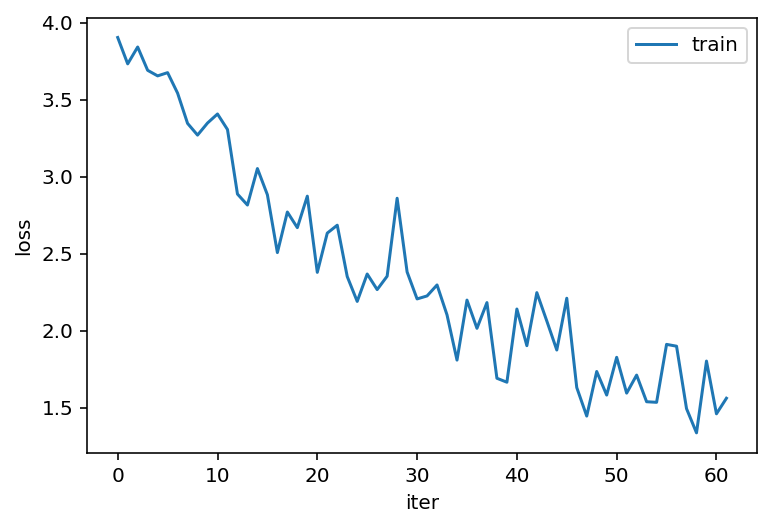

62
Epoch: 62, Iteration: 100, Loss: 1.429581642150879
Epoch: 62, Iteration: 200, Loss: 1.7005729675292969
Epoch: 62, Iteration: 300, Loss: 1.6563738584518433
Epoch: 62, Iteration: 400, Loss: 1.6093918085098267
Epoch: 62, Iteration: 500, Loss: 1.9823988676071167
Epoch: 62, Iteration: 600, Loss: 1.6510213613510132
Epoch: 62, Iteration: 700, Loss: 1.6584975719451904
Epoch: 62, Iteration: 800, Loss: 1.538238763809204


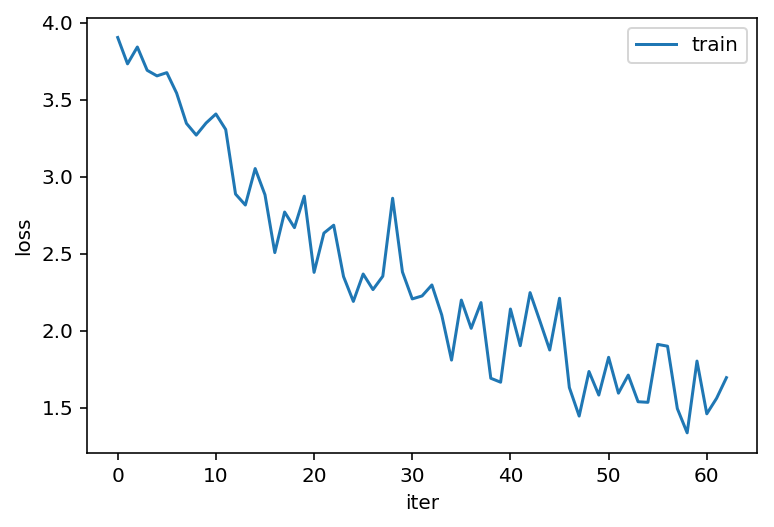

63
Epoch: 63, Iteration: 25, Loss: 1.6692992448806763
Epoch: 63, Iteration: 50, Loss: 1.6926441192626953
Epoch: 63, Iteration: 75, Loss: 1.3185126781463623
Epoch: 63, Iteration: 100, Loss: 1.552549123764038
Epoch: 63, Iteration: 125, Loss: 1.564483880996704
Epoch: 63, Iteration: 150, Loss: 1.2576602697372437
Epoch: 63, Iteration: 175, Loss: 1.6132550239562988
Epoch: 63, Iteration: 200, Loss: 1.6510051488876343
Epoch: 63, Iteration: 225, Loss: 1.4800126552581787
Epoch: 63, Iteration: 250, Loss: 1.682408332824707
Epoch: 63, Iteration: 275, Loss: 1.848846673965454
Epoch: 63, Iteration: 300, Loss: 1.9820613861083984
Epoch: 63, Iteration: 325, Loss: 1.421836018562317
Epoch: 63, Iteration: 350, Loss: 1.7877111434936523
Epoch: 63, Iteration: 375, Loss: 1.6734849214553833
Epoch: 63, Iteration: 400, Loss: 1.5659480094909668
Epoch: 63, Iteration: 425, Loss: 1.731709599494934
Epoch: 63, Iteration: 450, Loss: 1.3881523609161377
Epoch: 63, Iteration: 475, Loss: 1.4658375978469849
Epoch: 63, Iterati

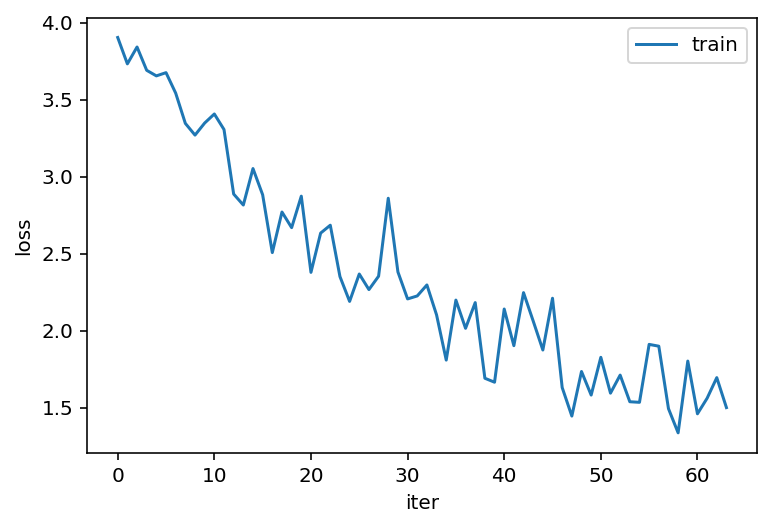

64
Epoch: 64, Iteration: 20, Loss: 1.4699547290802002
Epoch: 64, Iteration: 40, Loss: 1.4296178817749023
Epoch: 64, Iteration: 60, Loss: 1.5657535791397095
Epoch: 64, Iteration: 80, Loss: 1.7035603523254395
Epoch: 64, Iteration: 100, Loss: 1.7466696500778198
Epoch: 64, Iteration: 120, Loss: 1.5419056415557861
Epoch: 64, Iteration: 140, Loss: 1.7200771570205688
Epoch: 64, Iteration: 160, Loss: 1.477721095085144
Epoch: 64, Iteration: 180, Loss: 2.010483503341675
Epoch: 64, Iteration: 200, Loss: 1.5623127222061157
Epoch: 64, Iteration: 220, Loss: 1.7204463481903076
Epoch: 64, Iteration: 240, Loss: 1.4405560493469238
Epoch: 64, Iteration: 260, Loss: 1.4209624528884888
Epoch: 64, Iteration: 280, Loss: 1.610477328300476
Epoch: 64, Iteration: 300, Loss: 1.8347729444503784
Epoch: 64, Iteration: 320, Loss: 1.4470168352127075
Epoch: 64, Iteration: 340, Loss: 1.4919695854187012
Epoch: 64, Iteration: 360, Loss: 1.6968324184417725
Epoch: 64, Iteration: 380, Loss: 1.3567529916763306
Epoch: 64, Itera

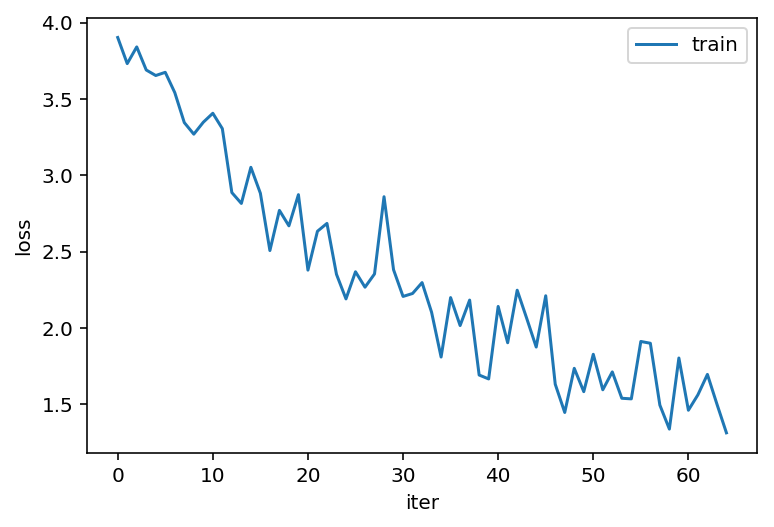

65
Epoch: 65, Iteration: 50, Loss: 1.563414216041565
Epoch: 65, Iteration: 100, Loss: 1.4610321521759033
Epoch: 65, Iteration: 150, Loss: 1.3782511949539185
Epoch: 65, Iteration: 200, Loss: 1.3463653326034546
Epoch: 65, Iteration: 250, Loss: 1.4392539262771606
Epoch: 65, Iteration: 300, Loss: 1.2766706943511963
Epoch: 65, Iteration: 350, Loss: 1.7620956897735596
Epoch: 65, Iteration: 400, Loss: 1.7331109046936035
Epoch: 65, Iteration: 450, Loss: 1.4742811918258667
Epoch: 65, Iteration: 500, Loss: 1.3637256622314453
Epoch: 65, Iteration: 550, Loss: 1.5754629373550415
Epoch: 65, Iteration: 600, Loss: 1.8566654920578003
Epoch: 65, Iteration: 650, Loss: 1.7226531505584717
Epoch: 65, Iteration: 700, Loss: 1.580336332321167
Epoch: 65, Iteration: 750, Loss: 1.2122043371200562
Epoch: 65, Iteration: 800, Loss: 1.5348941087722778
Epoch: 65, Iteration: 850, Loss: 1.4812285900115967


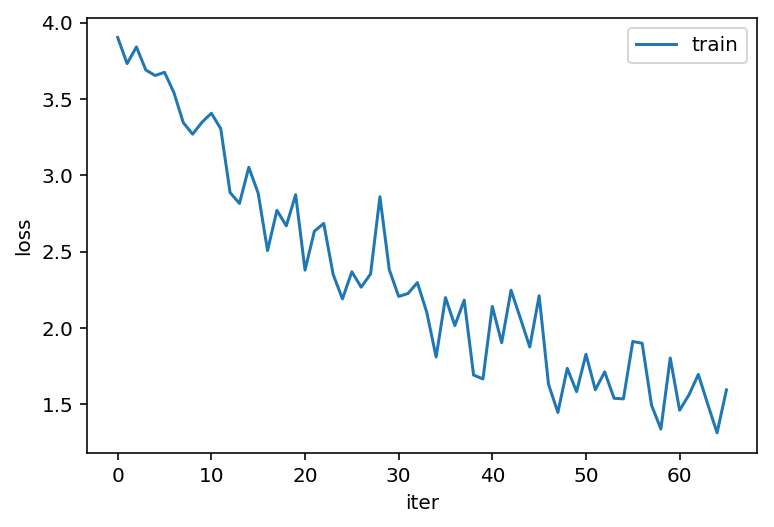

66
Epoch: 66, Iteration: 100, Loss: 1.3739676475524902
Epoch: 66, Iteration: 200, Loss: 1.3941045999526978
Epoch: 66, Iteration: 300, Loss: 1.9871844053268433
Epoch: 66, Iteration: 400, Loss: 1.6406481266021729
Epoch: 66, Iteration: 500, Loss: 1.8998159170150757
Epoch: 66, Iteration: 600, Loss: 1.4811538457870483
Epoch: 66, Iteration: 700, Loss: 1.3876821994781494
Epoch: 66, Iteration: 800, Loss: 1.3588351011276245


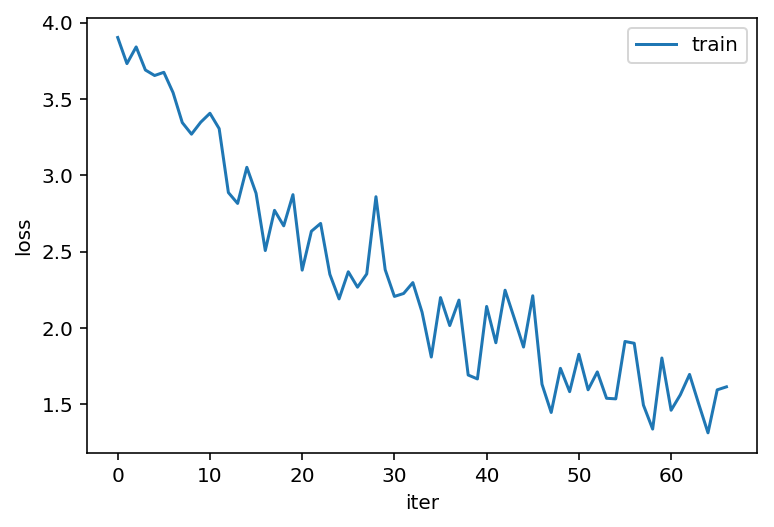

67
Epoch: 67, Iteration: 25, Loss: 1.6414071321487427
Epoch: 67, Iteration: 50, Loss: 1.4463679790496826
Epoch: 67, Iteration: 75, Loss: 1.625219464302063
Epoch: 67, Iteration: 100, Loss: 1.8260356187820435
Epoch: 67, Iteration: 125, Loss: 1.4571987390518188
Epoch: 67, Iteration: 150, Loss: 1.5299495458602905
Epoch: 67, Iteration: 175, Loss: 1.8434947729110718
Epoch: 67, Iteration: 200, Loss: 1.5412068367004395
Epoch: 67, Iteration: 225, Loss: 1.771442174911499
Epoch: 67, Iteration: 250, Loss: 1.5361887216567993
Epoch: 67, Iteration: 275, Loss: 1.5338414907455444
Epoch: 67, Iteration: 300, Loss: 1.7463955879211426
Epoch: 67, Iteration: 325, Loss: 1.906200647354126
Epoch: 67, Iteration: 350, Loss: 1.4545385837554932
Epoch: 67, Iteration: 375, Loss: 1.4568394422531128
Epoch: 67, Iteration: 400, Loss: 1.5117015838623047
Epoch: 67, Iteration: 425, Loss: 1.3694101572036743
Epoch: 67, Iteration: 450, Loss: 1.6097385883331299
Epoch: 67, Iteration: 475, Loss: 1.6833393573760986
Epoch: 67, Iter

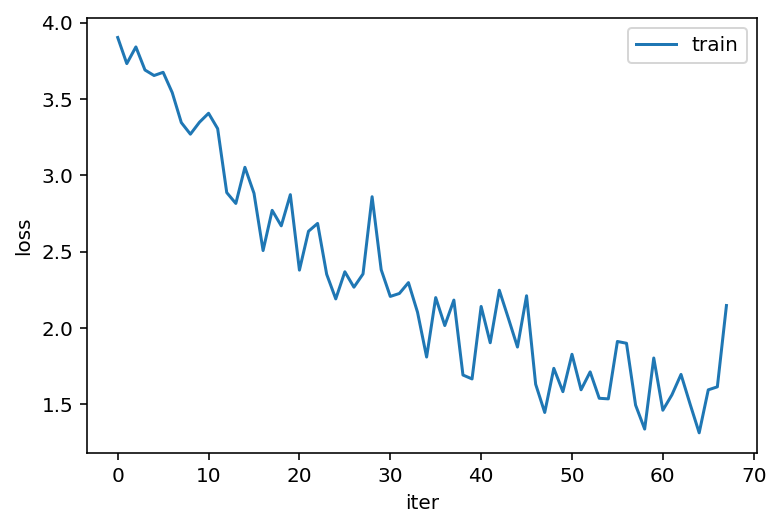

68
Epoch: 68, Iteration: 100, Loss: 1.5511853694915771
Epoch: 68, Iteration: 200, Loss: 1.9824694395065308
Epoch: 68, Iteration: 300, Loss: 1.594010591506958
Epoch: 68, Iteration: 400, Loss: 1.075042724609375
Epoch: 68, Iteration: 500, Loss: 1.3914991617202759
Epoch: 68, Iteration: 600, Loss: 1.6818740367889404
Epoch: 68, Iteration: 700, Loss: 1.938878059387207
Epoch: 68, Iteration: 800, Loss: 1.621795654296875


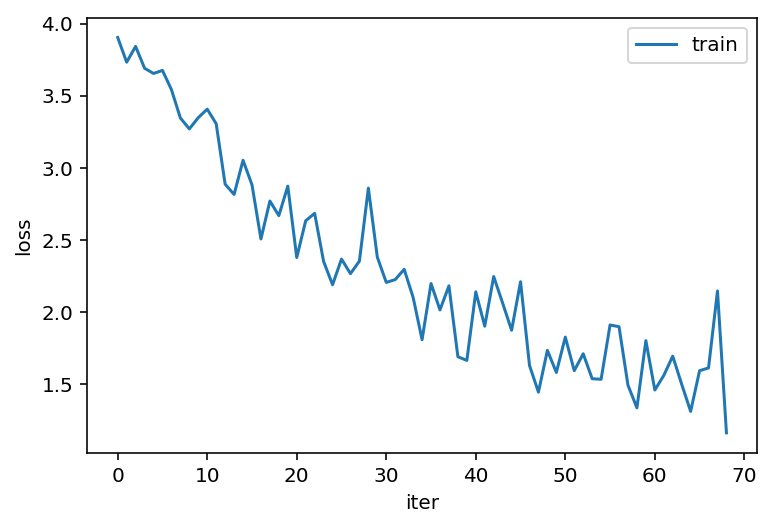

69
Epoch: 69, Iteration: 10, Loss: 1.6717512607574463
Epoch: 69, Iteration: 20, Loss: 1.6912254095077515
Epoch: 69, Iteration: 30, Loss: 1.4353173971176147
Epoch: 69, Iteration: 40, Loss: 1.9182251691818237
Epoch: 69, Iteration: 50, Loss: 1.5080194473266602
Epoch: 69, Iteration: 60, Loss: 1.692936658859253
Epoch: 69, Iteration: 70, Loss: 1.4851243495941162
Epoch: 69, Iteration: 80, Loss: 1.831402063369751
Epoch: 69, Iteration: 90, Loss: 1.6589267253875732
Epoch: 69, Iteration: 100, Loss: 1.4839962720870972
Epoch: 69, Iteration: 110, Loss: 1.885798454284668
Epoch: 69, Iteration: 120, Loss: 1.8055325746536255
Epoch: 69, Iteration: 130, Loss: 1.2645665407180786
Epoch: 69, Iteration: 140, Loss: 1.2745381593704224
Epoch: 69, Iteration: 150, Loss: 1.3214777708053589
Epoch: 69, Iteration: 160, Loss: 1.3856528997421265
Epoch: 69, Iteration: 170, Loss: 1.5968647003173828
Epoch: 69, Iteration: 180, Loss: 1.6376240253448486
Epoch: 69, Iteration: 190, Loss: 1.261851191520691
Epoch: 69, Iteration: 

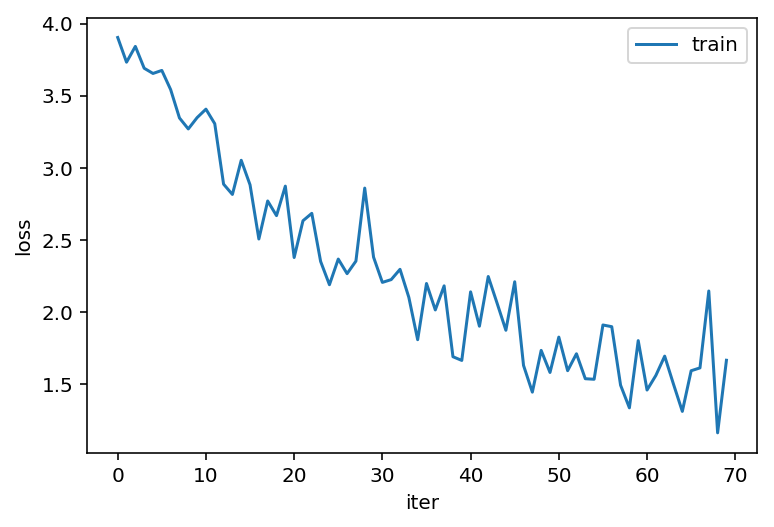

70
Epoch: 70, Iteration: 100, Loss: 1.280153751373291
Epoch: 70, Iteration: 200, Loss: 1.2008087635040283
Epoch: 70, Iteration: 300, Loss: 1.8105300664901733
Epoch: 70, Iteration: 400, Loss: 1.369384765625
Epoch: 70, Iteration: 500, Loss: 1.454945683479309
Epoch: 70, Iteration: 600, Loss: 1.5953134298324585
Epoch: 70, Iteration: 700, Loss: 1.3483681678771973
Epoch: 70, Iteration: 800, Loss: 1.7578116655349731


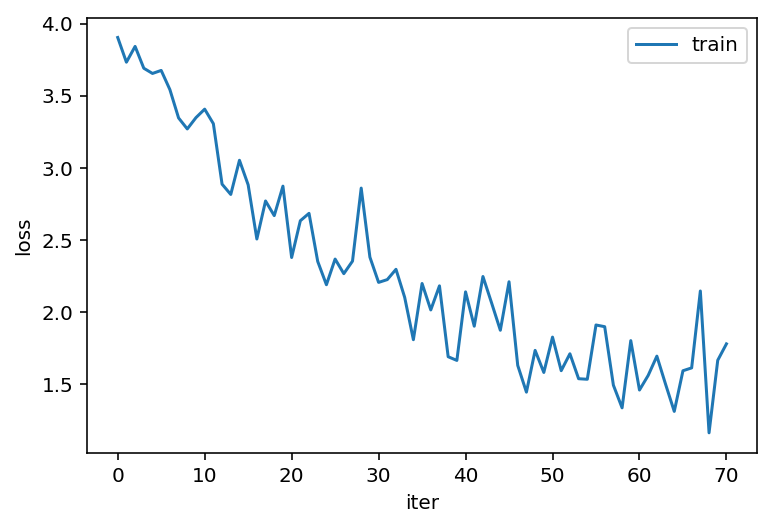

71
Epoch: 71, Iteration: 25, Loss: 1.4210963249206543
Epoch: 71, Iteration: 50, Loss: 1.440896987915039
Epoch: 71, Iteration: 75, Loss: 1.252270221710205
Epoch: 71, Iteration: 100, Loss: 1.5998555421829224
Epoch: 71, Iteration: 125, Loss: 1.38430917263031
Epoch: 71, Iteration: 150, Loss: 1.17055082321167
Epoch: 71, Iteration: 175, Loss: 1.4095118045806885
Epoch: 71, Iteration: 200, Loss: 1.420494794845581
Epoch: 71, Iteration: 225, Loss: 1.4706002473831177
Epoch: 71, Iteration: 250, Loss: 1.7359962463378906
Epoch: 71, Iteration: 275, Loss: 1.4669554233551025
Epoch: 71, Iteration: 300, Loss: 1.663244605064392
Epoch: 71, Iteration: 325, Loss: 1.4604142904281616
Epoch: 71, Iteration: 350, Loss: 1.471529483795166
Epoch: 71, Iteration: 375, Loss: 1.6115728616714478
Epoch: 71, Iteration: 400, Loss: 1.5346777439117432
Epoch: 71, Iteration: 425, Loss: 1.8000447750091553
Epoch: 71, Iteration: 450, Loss: 1.0788257122039795
Epoch: 71, Iteration: 475, Loss: 1.5486319065093994
Epoch: 71, Iteration:

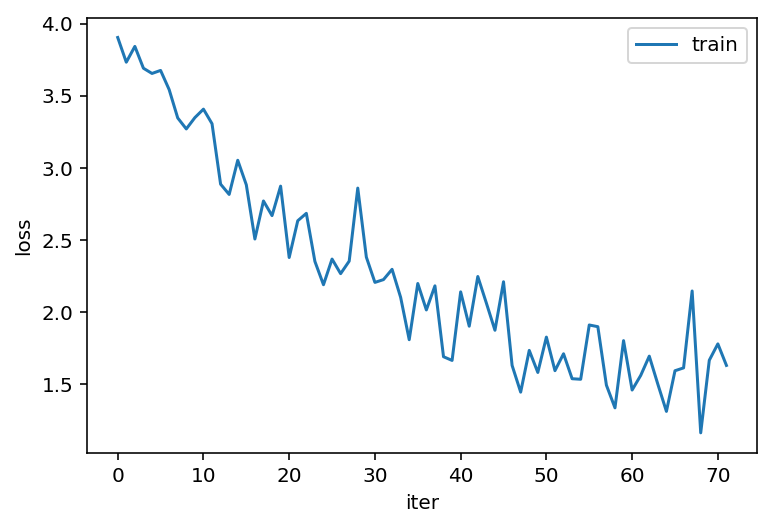

72
Epoch: 72, Iteration: 100, Loss: 1.3050577640533447
Epoch: 72, Iteration: 200, Loss: 1.4812792539596558
Epoch: 72, Iteration: 300, Loss: 1.3262383937835693
Epoch: 72, Iteration: 400, Loss: 1.2793798446655273
Epoch: 72, Iteration: 500, Loss: 1.7992335557937622
Epoch: 72, Iteration: 600, Loss: 1.4186367988586426
Epoch: 72, Iteration: 700, Loss: 1.7666616439819336
Epoch: 72, Iteration: 800, Loss: 1.5094548463821411


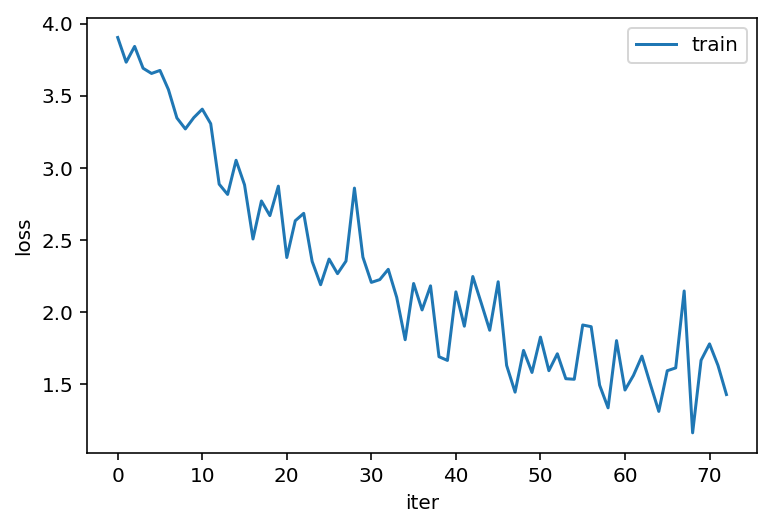

73
Epoch: 73, Iteration: 50, Loss: 1.5893073081970215
Epoch: 73, Iteration: 100, Loss: 1.3892180919647217
Epoch: 73, Iteration: 150, Loss: 1.3076311349868774
Epoch: 73, Iteration: 200, Loss: 1.4310704469680786
Epoch: 73, Iteration: 250, Loss: 1.5277036428451538
Epoch: 73, Iteration: 300, Loss: 1.33894681930542
Epoch: 73, Iteration: 350, Loss: 1.683243751525879
Epoch: 73, Iteration: 400, Loss: 1.779464602470398
Epoch: 73, Iteration: 450, Loss: 1.342200517654419
Epoch: 73, Iteration: 500, Loss: 1.3724421262741089
Epoch: 73, Iteration: 550, Loss: 1.435829758644104
Epoch: 73, Iteration: 600, Loss: 1.7886896133422852
Epoch: 73, Iteration: 650, Loss: 1.303445816040039
Epoch: 73, Iteration: 700, Loss: 1.4331117868423462
Epoch: 73, Iteration: 750, Loss: 1.5591562986373901
Epoch: 73, Iteration: 800, Loss: 1.3288692235946655
Epoch: 73, Iteration: 850, Loss: 1.8195065259933472


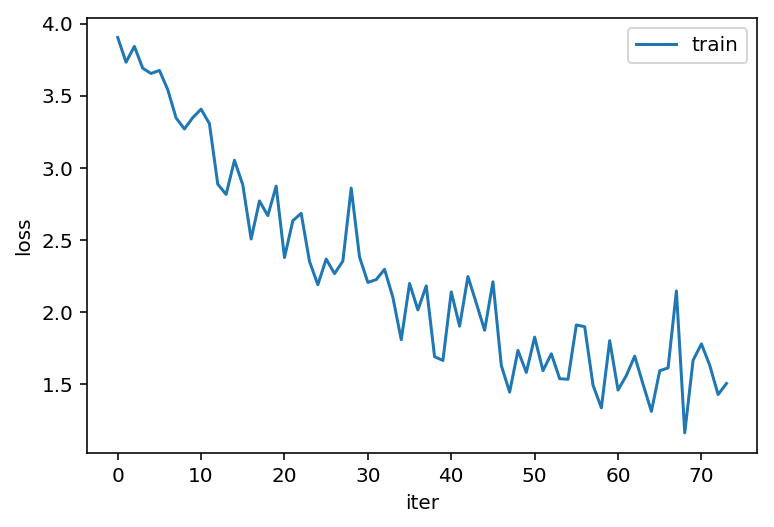

74
Epoch: 74, Iteration: 4, Loss: 1.267366647720337
Epoch: 74, Iteration: 8, Loss: 1.3680669069290161
Epoch: 74, Iteration: 12, Loss: 1.2431120872497559
Epoch: 74, Iteration: 16, Loss: 1.3952746391296387
Epoch: 74, Iteration: 20, Loss: 2.1085317134857178
Epoch: 74, Iteration: 24, Loss: 1.6984063386917114
Epoch: 74, Iteration: 28, Loss: 1.2134829759597778
Epoch: 74, Iteration: 32, Loss: 1.8117598295211792
Epoch: 74, Iteration: 36, Loss: 1.7941557168960571
Epoch: 74, Iteration: 40, Loss: 1.5812252759933472
Epoch: 74, Iteration: 44, Loss: 1.4624685049057007
Epoch: 74, Iteration: 48, Loss: 1.427821159362793
Epoch: 74, Iteration: 52, Loss: 1.3037396669387817
Epoch: 74, Iteration: 56, Loss: 1.500991702079773
Epoch: 74, Iteration: 60, Loss: 1.6667370796203613
Epoch: 74, Iteration: 64, Loss: 1.4251608848571777
Epoch: 74, Iteration: 68, Loss: 1.569226861000061
Epoch: 74, Iteration: 72, Loss: 1.5863194465637207
Epoch: 74, Iteration: 76, Loss: 1.6410490274429321
Epoch: 74, Iteration: 80, Loss: 1.

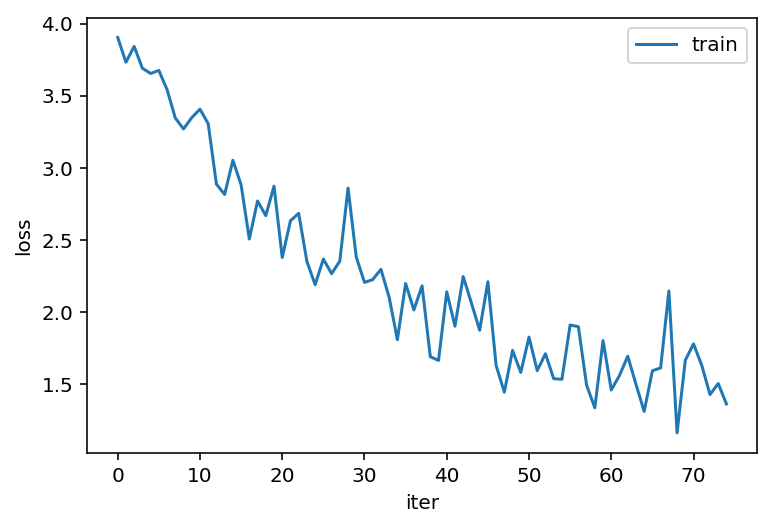

75
Epoch: 75, Iteration: 25, Loss: 1.1316852569580078
Epoch: 75, Iteration: 50, Loss: 1.417107343673706
Epoch: 75, Iteration: 75, Loss: 1.5448975563049316
Epoch: 75, Iteration: 100, Loss: 1.6070455312728882
Epoch: 75, Iteration: 125, Loss: 1.4542063474655151
Epoch: 75, Iteration: 150, Loss: 1.8868727684020996
Epoch: 75, Iteration: 175, Loss: 1.3062450885772705
Epoch: 75, Iteration: 200, Loss: 1.3423116207122803
Epoch: 75, Iteration: 225, Loss: 1.4093214273452759
Epoch: 75, Iteration: 250, Loss: 1.6871503591537476
Epoch: 75, Iteration: 275, Loss: 1.5515284538269043
Epoch: 75, Iteration: 300, Loss: 1.579928994178772
Epoch: 75, Iteration: 325, Loss: 1.4713455438613892
Epoch: 75, Iteration: 350, Loss: 1.5268683433532715
Epoch: 75, Iteration: 375, Loss: 1.3051584959030151
Epoch: 75, Iteration: 400, Loss: 1.97523033618927
Epoch: 75, Iteration: 425, Loss: 1.3534246683120728
Epoch: 75, Iteration: 450, Loss: 1.7333183288574219
Epoch: 75, Iteration: 475, Loss: 1.341672420501709
Epoch: 75, Iterat

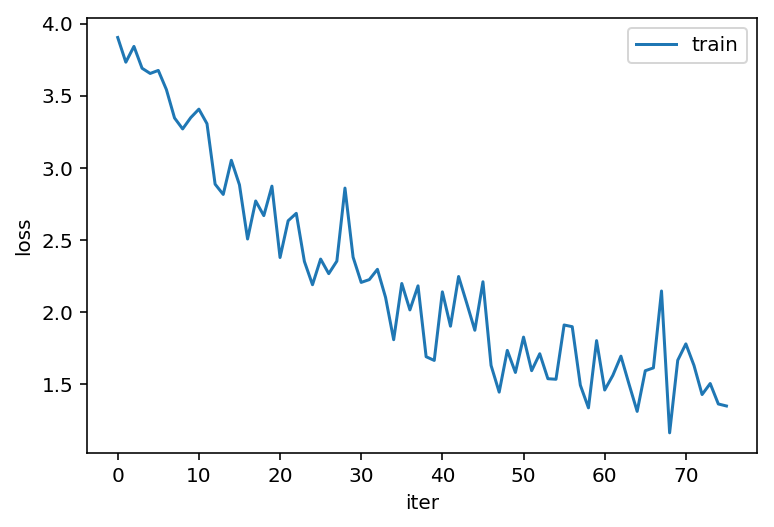

76
Epoch: 76, Iteration: 100, Loss: 1.626932144165039
Epoch: 76, Iteration: 200, Loss: 1.4846607446670532
Epoch: 76, Iteration: 300, Loss: 1.6402907371520996
Epoch: 76, Iteration: 400, Loss: 1.479750633239746
Epoch: 76, Iteration: 500, Loss: 1.5511338710784912
Epoch: 76, Iteration: 600, Loss: 1.5337995290756226
Epoch: 76, Iteration: 700, Loss: 1.401889681816101
Epoch: 76, Iteration: 800, Loss: 1.490808129310608


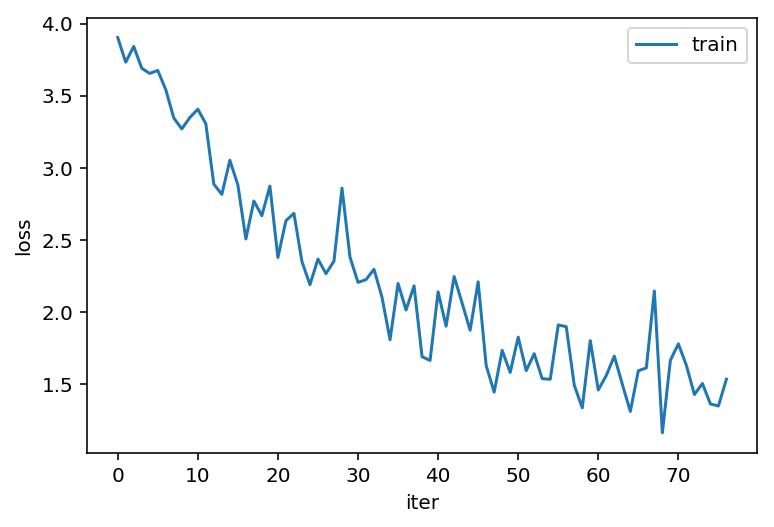

77
Epoch: 77, Iteration: 50, Loss: 1.475142002105713
Epoch: 77, Iteration: 100, Loss: 1.314227819442749
Epoch: 77, Iteration: 150, Loss: 2.001723051071167
Epoch: 77, Iteration: 200, Loss: 1.5764840841293335
Epoch: 77, Iteration: 250, Loss: 1.5011327266693115
Epoch: 77, Iteration: 300, Loss: 1.6639543771743774
Epoch: 77, Iteration: 350, Loss: 1.366456151008606
Epoch: 77, Iteration: 400, Loss: 1.5749590396881104
Epoch: 77, Iteration: 450, Loss: 1.369126319885254
Epoch: 77, Iteration: 500, Loss: 1.4351731538772583
Epoch: 77, Iteration: 550, Loss: 1.2593159675598145
Epoch: 77, Iteration: 600, Loss: 1.690577507019043
Epoch: 77, Iteration: 650, Loss: 1.66716730594635
Epoch: 77, Iteration: 700, Loss: 1.3373444080352783
Epoch: 77, Iteration: 750, Loss: 1.5859086513519287
Epoch: 77, Iteration: 800, Loss: 1.741012454032898
Epoch: 77, Iteration: 850, Loss: 1.595587968826294


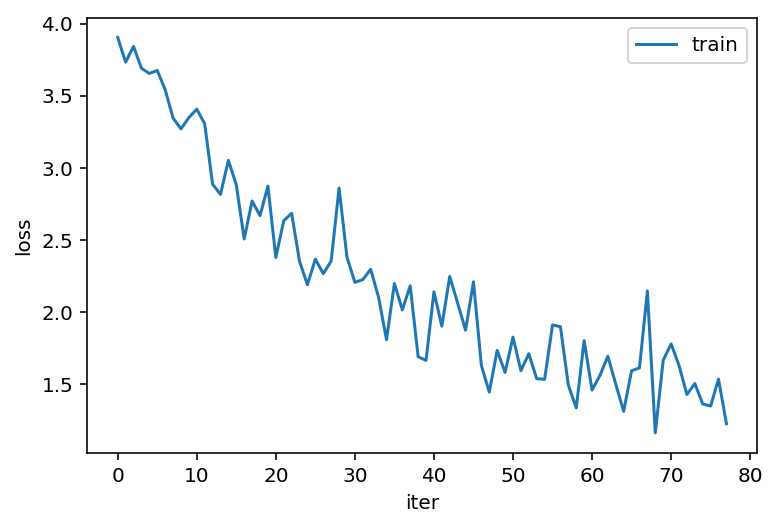

78
Epoch: 78, Iteration: 100, Loss: 1.5410014390945435
Epoch: 78, Iteration: 200, Loss: 1.3387202024459839
Epoch: 78, Iteration: 300, Loss: 1.5763508081436157
Epoch: 78, Iteration: 400, Loss: 1.2811697721481323
Epoch: 78, Iteration: 500, Loss: 1.4447071552276611
Epoch: 78, Iteration: 600, Loss: 1.3651576042175293
Epoch: 78, Iteration: 700, Loss: 1.2783622741699219
Epoch: 78, Iteration: 800, Loss: 1.8298741579055786


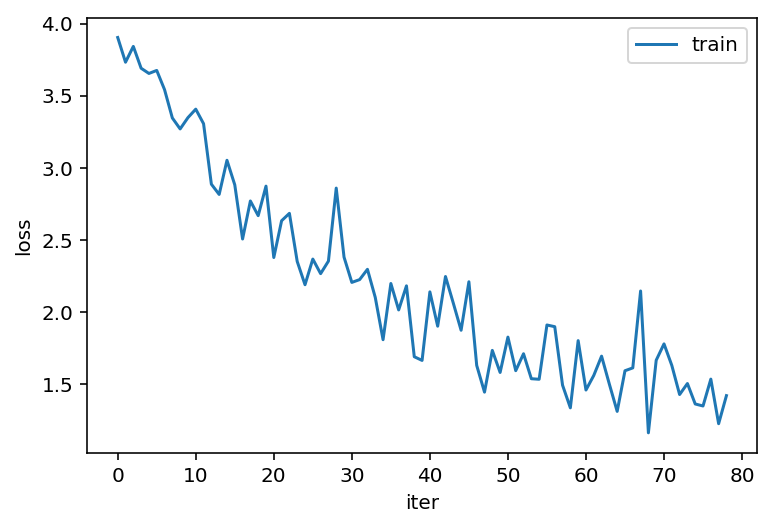

79
Epoch: 79, Iteration: 5, Loss: 1.3109614849090576
Epoch: 79, Iteration: 10, Loss: 1.2209975719451904
Epoch: 79, Iteration: 15, Loss: 1.2568446397781372
Epoch: 79, Iteration: 20, Loss: 1.2739907503128052
Epoch: 79, Iteration: 25, Loss: 1.6876740455627441
Epoch: 79, Iteration: 30, Loss: 1.2367388010025024
Epoch: 79, Iteration: 35, Loss: 1.630860447883606
Epoch: 79, Iteration: 40, Loss: 1.548159122467041
Epoch: 79, Iteration: 45, Loss: 1.636273980140686
Epoch: 79, Iteration: 50, Loss: 1.3028861284255981
Epoch: 79, Iteration: 55, Loss: 1.3310375213623047
Epoch: 79, Iteration: 60, Loss: 1.260144591331482
Epoch: 79, Iteration: 65, Loss: 1.1039259433746338
Epoch: 79, Iteration: 70, Loss: 1.179903268814087
Epoch: 79, Iteration: 75, Loss: 1.2564576864242554
Epoch: 79, Iteration: 80, Loss: 1.3416167497634888
Epoch: 79, Iteration: 85, Loss: 1.2693672180175781
Epoch: 79, Iteration: 90, Loss: 1.3638243675231934
Epoch: 79, Iteration: 95, Loss: 1.5789605379104614
Epoch: 79, Iteration: 100, Loss: 1

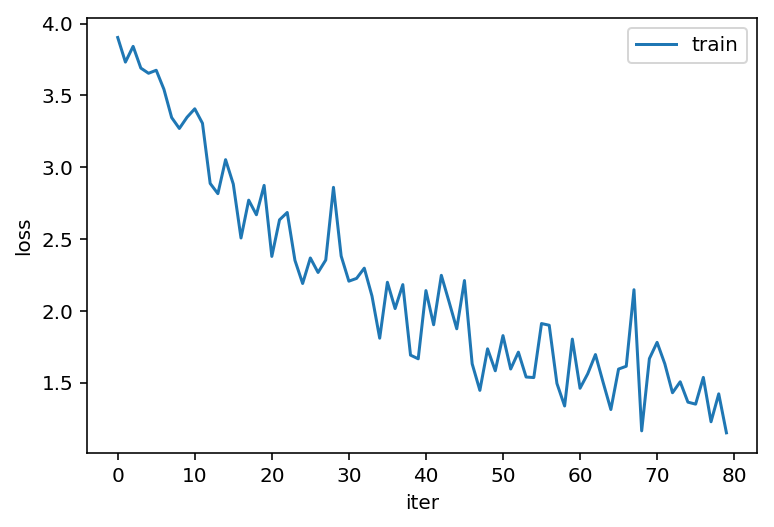

80
Epoch: 80, Iteration: 100, Loss: 1.4930243492126465
Epoch: 80, Iteration: 200, Loss: 1.2623317241668701
Epoch: 80, Iteration: 300, Loss: 1.7145376205444336
Epoch: 80, Iteration: 400, Loss: 1.558934211730957
Epoch: 80, Iteration: 500, Loss: 1.4230512380599976
Epoch: 80, Iteration: 600, Loss: 1.7614392042160034
Epoch: 80, Iteration: 700, Loss: 1.5366226434707642
Epoch: 80, Iteration: 800, Loss: 1.3489364385604858


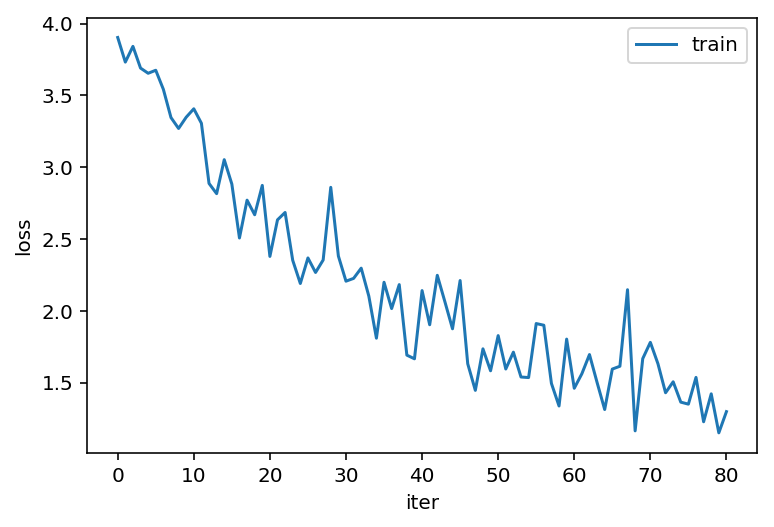

81
Epoch: 81, Iteration: 50, Loss: 1.4187484979629517
Epoch: 81, Iteration: 100, Loss: 1.2165096998214722
Epoch: 81, Iteration: 150, Loss: 1.176489233970642
Epoch: 81, Iteration: 200, Loss: 1.2597416639328003
Epoch: 81, Iteration: 250, Loss: 1.5474574565887451
Epoch: 81, Iteration: 300, Loss: 1.4847685098648071
Epoch: 81, Iteration: 350, Loss: 1.4747962951660156
Epoch: 81, Iteration: 400, Loss: 1.3698476552963257
Epoch: 81, Iteration: 450, Loss: 1.4792661666870117
Epoch: 81, Iteration: 500, Loss: 1.014923095703125
Epoch: 81, Iteration: 550, Loss: 1.3797709941864014
Epoch: 81, Iteration: 600, Loss: 1.5417007207870483
Epoch: 81, Iteration: 650, Loss: 1.4825427532196045
Epoch: 81, Iteration: 700, Loss: 1.7647628784179688
Epoch: 81, Iteration: 750, Loss: 1.7882674932479858
Epoch: 81, Iteration: 800, Loss: 1.4443672895431519
Epoch: 81, Iteration: 850, Loss: 1.5323609113693237


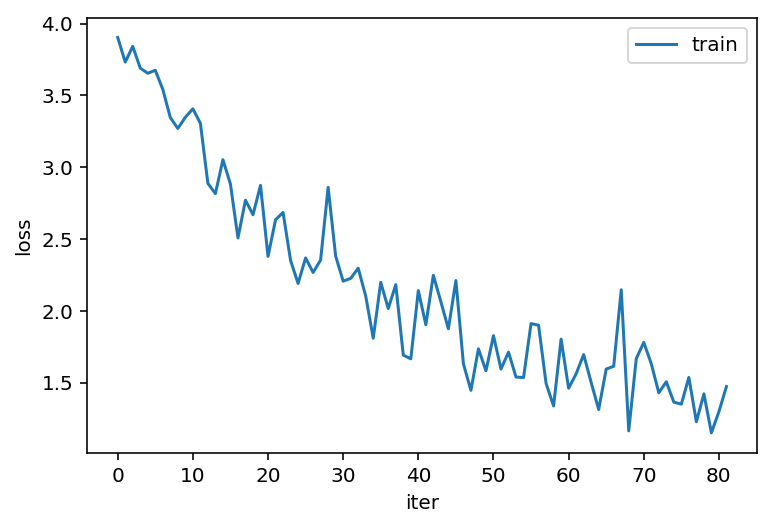

82
Epoch: 82, Iteration: 100, Loss: 1.5109163522720337
Epoch: 82, Iteration: 200, Loss: 1.5082687139511108
Epoch: 82, Iteration: 300, Loss: 1.3815364837646484
Epoch: 82, Iteration: 400, Loss: 1.4961895942687988
Epoch: 82, Iteration: 500, Loss: 1.3806744813919067
Epoch: 82, Iteration: 600, Loss: 1.4336904287338257
Epoch: 82, Iteration: 700, Loss: 1.1158910989761353
Epoch: 82, Iteration: 800, Loss: 1.3575315475463867


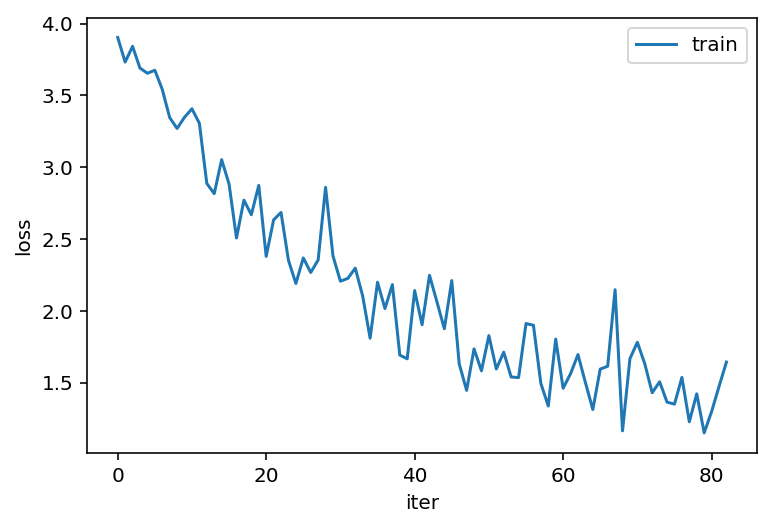

83
Epoch: 83, Iteration: 25, Loss: 1.2947585582733154
Epoch: 83, Iteration: 50, Loss: 1.4268733263015747
Epoch: 83, Iteration: 75, Loss: 1.3041669130325317
Epoch: 83, Iteration: 100, Loss: 1.473333477973938
Epoch: 83, Iteration: 125, Loss: 0.8350037932395935
Epoch: 83, Iteration: 150, Loss: 1.3870465755462646
Epoch: 83, Iteration: 175, Loss: 1.4793941974639893
Epoch: 83, Iteration: 200, Loss: 1.4033418893814087
Epoch: 83, Iteration: 225, Loss: 1.1460506916046143
Epoch: 83, Iteration: 250, Loss: 1.2669697999954224
Epoch: 83, Iteration: 275, Loss: 1.4551186561584473
Epoch: 83, Iteration: 300, Loss: 1.3655872344970703
Epoch: 83, Iteration: 325, Loss: 1.4309478998184204
Epoch: 83, Iteration: 350, Loss: 1.704549789428711
Epoch: 83, Iteration: 375, Loss: 1.3773239850997925
Epoch: 83, Iteration: 400, Loss: 1.6306993961334229
Epoch: 83, Iteration: 425, Loss: 1.3463919162750244
Epoch: 83, Iteration: 450, Loss: 1.3534048795700073
Epoch: 83, Iteration: 475, Loss: 1.3773161172866821
Epoch: 83, Ite

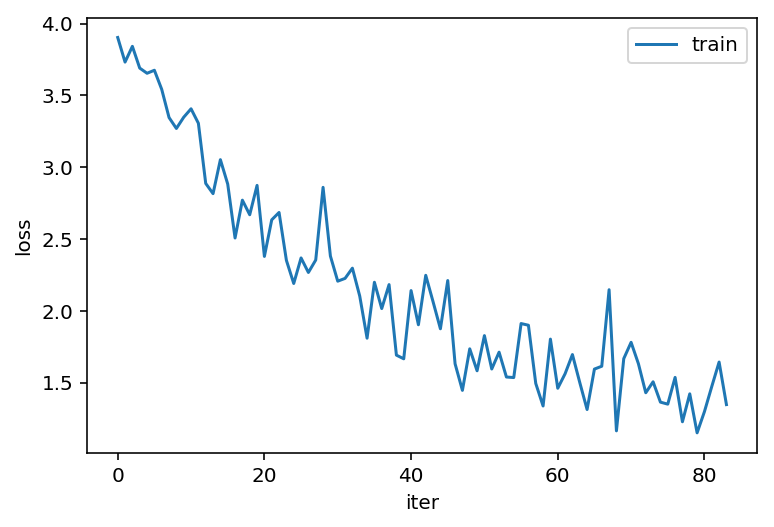

84
Epoch: 84, Iteration: 20, Loss: 1.4795175790786743
Epoch: 84, Iteration: 40, Loss: 1.3537280559539795
Epoch: 84, Iteration: 60, Loss: 1.1014604568481445
Epoch: 84, Iteration: 80, Loss: 1.6663970947265625
Epoch: 84, Iteration: 100, Loss: 1.4464964866638184
Epoch: 84, Iteration: 120, Loss: 1.3363856077194214
Epoch: 84, Iteration: 140, Loss: 1.234050989151001
Epoch: 84, Iteration: 160, Loss: 1.2463593482971191
Epoch: 84, Iteration: 180, Loss: 1.5312696695327759
Epoch: 84, Iteration: 200, Loss: 1.746546745300293
Epoch: 84, Iteration: 220, Loss: 1.8536373376846313
Epoch: 84, Iteration: 240, Loss: 1.3044899702072144
Epoch: 84, Iteration: 260, Loss: 1.2514561414718628
Epoch: 84, Iteration: 280, Loss: 1.6335290670394897
Epoch: 84, Iteration: 300, Loss: 1.1337127685546875
Epoch: 84, Iteration: 320, Loss: 1.2906063795089722
Epoch: 84, Iteration: 340, Loss: 1.4131269454956055
Epoch: 84, Iteration: 360, Loss: 1.3484013080596924
Epoch: 84, Iteration: 380, Loss: 1.539341688156128
Epoch: 84, Itera

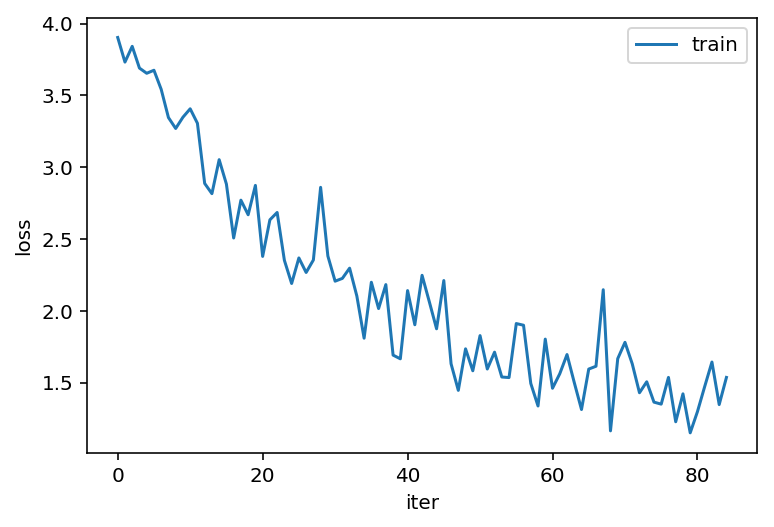

85
Epoch: 85, Iteration: 50, Loss: 1.440205693244934
Epoch: 85, Iteration: 100, Loss: 1.4797321557998657
Epoch: 85, Iteration: 150, Loss: 1.6123206615447998
Epoch: 85, Iteration: 200, Loss: 1.2561252117156982
Epoch: 85, Iteration: 250, Loss: 1.085984706878662
Epoch: 85, Iteration: 300, Loss: 1.3759149312973022
Epoch: 85, Iteration: 350, Loss: 1.5827958583831787
Epoch: 85, Iteration: 400, Loss: 1.4537758827209473
Epoch: 85, Iteration: 450, Loss: 1.2299193143844604
Epoch: 85, Iteration: 500, Loss: 1.5560977458953857
Epoch: 85, Iteration: 550, Loss: 1.2592023611068726
Epoch: 85, Iteration: 600, Loss: 1.7301489114761353
Epoch: 85, Iteration: 650, Loss: 1.4601284265518188
Epoch: 85, Iteration: 700, Loss: 1.4405057430267334
Epoch: 85, Iteration: 750, Loss: 1.4118858575820923
Epoch: 85, Iteration: 800, Loss: 1.5178883075714111
Epoch: 85, Iteration: 850, Loss: 1.1117887496948242


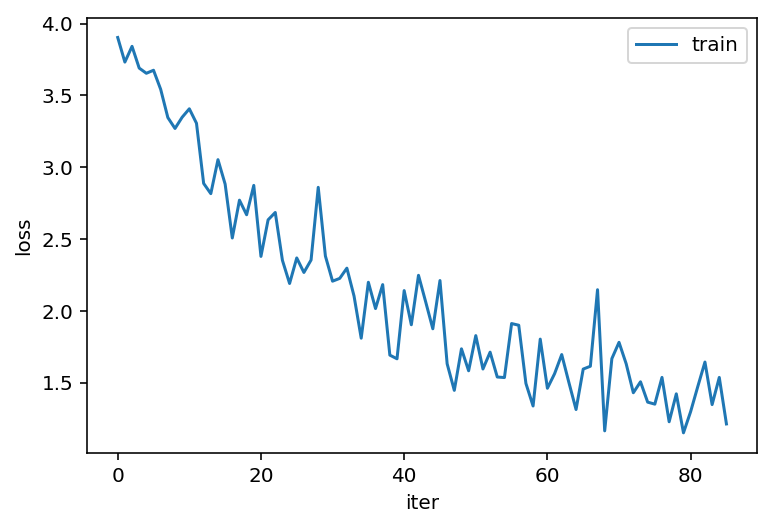

86
Epoch: 86, Iteration: 100, Loss: 1.4050315618515015
Epoch: 86, Iteration: 200, Loss: 1.0663177967071533
Epoch: 86, Iteration: 300, Loss: 1.1880133152008057
Epoch: 86, Iteration: 400, Loss: 1.6463428735733032
Epoch: 86, Iteration: 500, Loss: 1.1820505857467651
Epoch: 86, Iteration: 600, Loss: 1.4592697620391846
Epoch: 86, Iteration: 700, Loss: 1.1306180953979492
Epoch: 86, Iteration: 800, Loss: 1.533995270729065


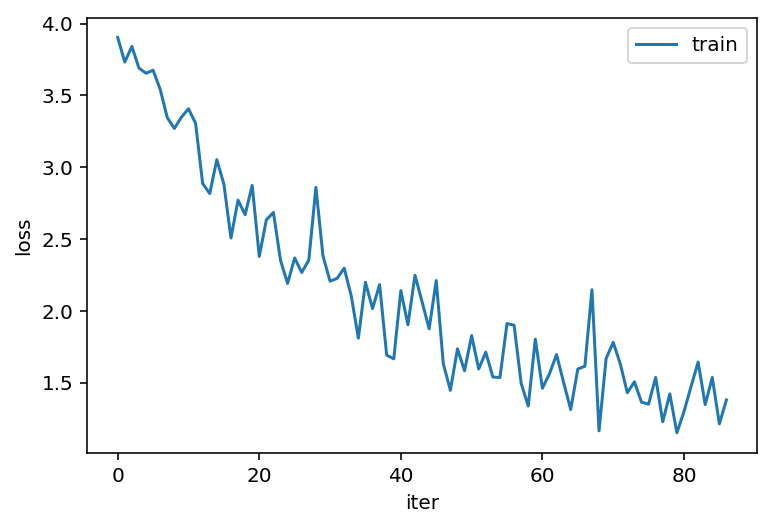

87
Epoch: 87, Iteration: 25, Loss: 1.5313202142715454
Epoch: 87, Iteration: 50, Loss: 1.3323239088058472
Epoch: 87, Iteration: 75, Loss: 1.2374705076217651
Epoch: 87, Iteration: 100, Loss: 1.700615406036377
Epoch: 87, Iteration: 125, Loss: 1.2698519229888916
Epoch: 87, Iteration: 150, Loss: 1.906550645828247
Epoch: 87, Iteration: 175, Loss: 1.3077367544174194
Epoch: 87, Iteration: 200, Loss: 1.1063700914382935
Epoch: 87, Iteration: 225, Loss: 1.3130896091461182
Epoch: 87, Iteration: 250, Loss: 1.5315932035446167
Epoch: 87, Iteration: 275, Loss: 1.1930464506149292
Epoch: 87, Iteration: 300, Loss: 1.117131233215332
Epoch: 87, Iteration: 325, Loss: 1.7063939571380615
Epoch: 87, Iteration: 350, Loss: 1.917653203010559
Epoch: 87, Iteration: 375, Loss: 1.4089354276657104
Epoch: 87, Iteration: 400, Loss: 1.2256083488464355
Epoch: 87, Iteration: 425, Loss: 1.5903640985488892
Epoch: 87, Iteration: 450, Loss: 1.0307544469833374
Epoch: 87, Iteration: 475, Loss: 1.1870964765548706
Epoch: 87, Itera

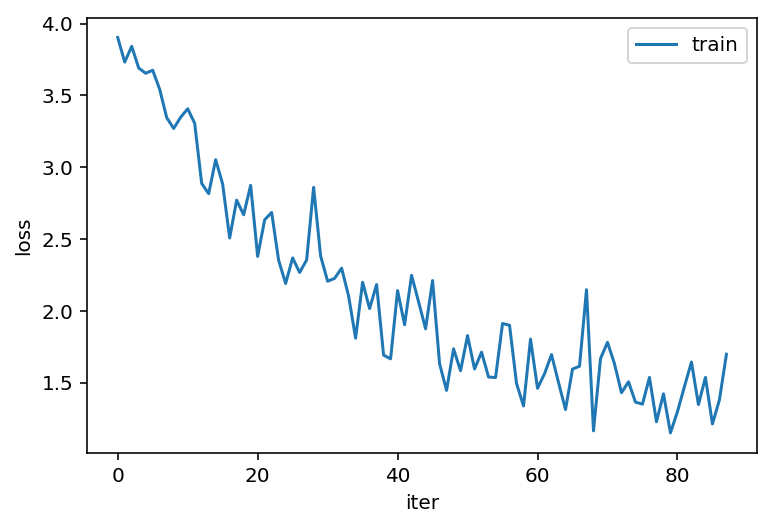

88
Epoch: 88, Iteration: 100, Loss: 0.7796149253845215
Epoch: 88, Iteration: 200, Loss: 1.2439005374908447
Epoch: 88, Iteration: 300, Loss: 1.432222843170166
Epoch: 88, Iteration: 400, Loss: 1.4853456020355225
Epoch: 88, Iteration: 500, Loss: 1.5863453149795532
Epoch: 88, Iteration: 600, Loss: 1.4348187446594238
Epoch: 88, Iteration: 700, Loss: 1.2568937540054321
Epoch: 88, Iteration: 800, Loss: 1.4288783073425293


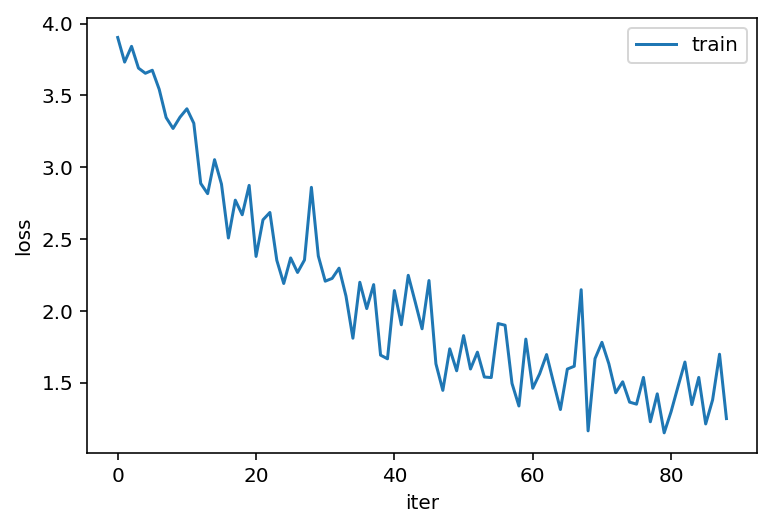

89
Epoch: 89, Iteration: 10, Loss: 1.5091347694396973
Epoch: 89, Iteration: 20, Loss: 1.035675287246704
Epoch: 89, Iteration: 30, Loss: 1.3191115856170654
Epoch: 89, Iteration: 40, Loss: 1.6076838970184326
Epoch: 89, Iteration: 50, Loss: 1.5618802309036255
Epoch: 89, Iteration: 60, Loss: 1.3143694400787354
Epoch: 89, Iteration: 70, Loss: 1.2353239059448242
Epoch: 89, Iteration: 80, Loss: 1.456824779510498
Epoch: 89, Iteration: 90, Loss: 1.3321740627288818
Epoch: 89, Iteration: 100, Loss: 1.3489710092544556
Epoch: 89, Iteration: 110, Loss: 1.5739713907241821
Epoch: 89, Iteration: 120, Loss: 1.228549838066101
Epoch: 89, Iteration: 130, Loss: 1.4211727380752563
Epoch: 89, Iteration: 140, Loss: 1.230581283569336
Epoch: 89, Iteration: 150, Loss: 1.4603829383850098
Epoch: 89, Iteration: 160, Loss: 1.455474615097046
Epoch: 89, Iteration: 170, Loss: 1.5022716522216797
Epoch: 89, Iteration: 180, Loss: 1.2492408752441406
Epoch: 89, Iteration: 190, Loss: 1.5685393810272217
Epoch: 89, Iteration: 2

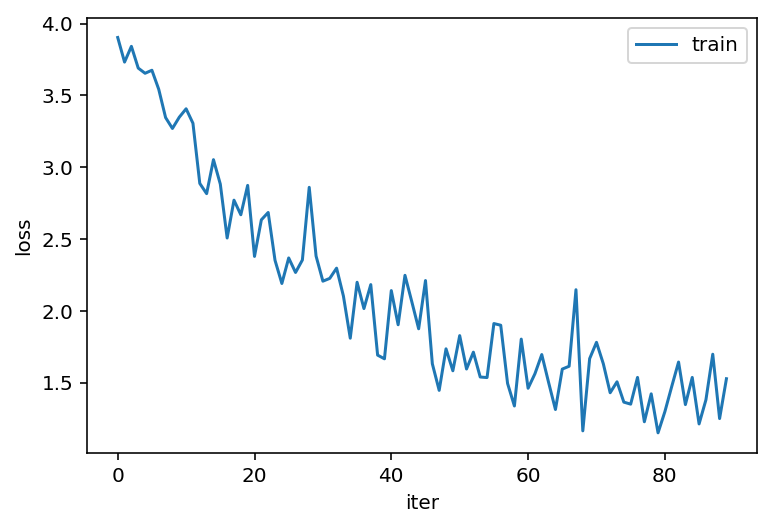

90
Epoch: 90, Iteration: 100, Loss: 1.145464539527893
Epoch: 90, Iteration: 200, Loss: 1.3298720121383667
Epoch: 90, Iteration: 300, Loss: 1.3873177766799927
Epoch: 90, Iteration: 400, Loss: 1.391806721687317
Epoch: 90, Iteration: 500, Loss: 1.1756099462509155
Epoch: 90, Iteration: 600, Loss: 1.1176245212554932
Epoch: 90, Iteration: 700, Loss: 1.2027344703674316
Epoch: 90, Iteration: 800, Loss: 0.9122685790061951


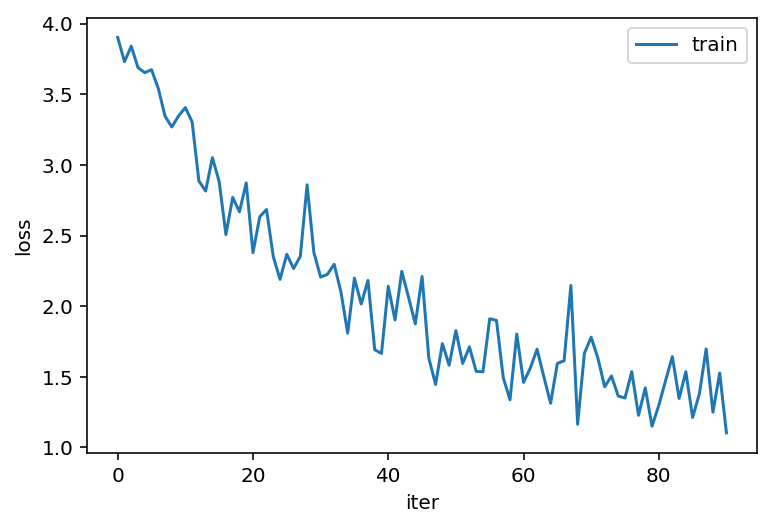

91
Epoch: 91, Iteration: 25, Loss: 1.4187414646148682
Epoch: 91, Iteration: 50, Loss: 1.360319972038269
Epoch: 91, Iteration: 75, Loss: 1.232238531112671
Epoch: 91, Iteration: 100, Loss: 1.2631053924560547
Epoch: 91, Iteration: 125, Loss: 1.322055697441101
Epoch: 91, Iteration: 150, Loss: 1.3490593433380127
Epoch: 91, Iteration: 175, Loss: 1.1697129011154175
Epoch: 91, Iteration: 200, Loss: 1.0311651229858398
Epoch: 91, Iteration: 225, Loss: 1.4319498538970947
Epoch: 91, Iteration: 250, Loss: 1.3541595935821533
Epoch: 91, Iteration: 275, Loss: 1.2957566976547241
Epoch: 91, Iteration: 300, Loss: 1.4407596588134766
Epoch: 91, Iteration: 325, Loss: 1.2591902017593384
Epoch: 91, Iteration: 350, Loss: 1.6183017492294312
Epoch: 91, Iteration: 375, Loss: 1.4859880208969116
Epoch: 91, Iteration: 400, Loss: 1.1656162738800049
Epoch: 91, Iteration: 425, Loss: 1.9043608903884888
Epoch: 91, Iteration: 450, Loss: 1.340664267539978
Epoch: 91, Iteration: 475, Loss: 1.5969581604003906
Epoch: 91, Itera

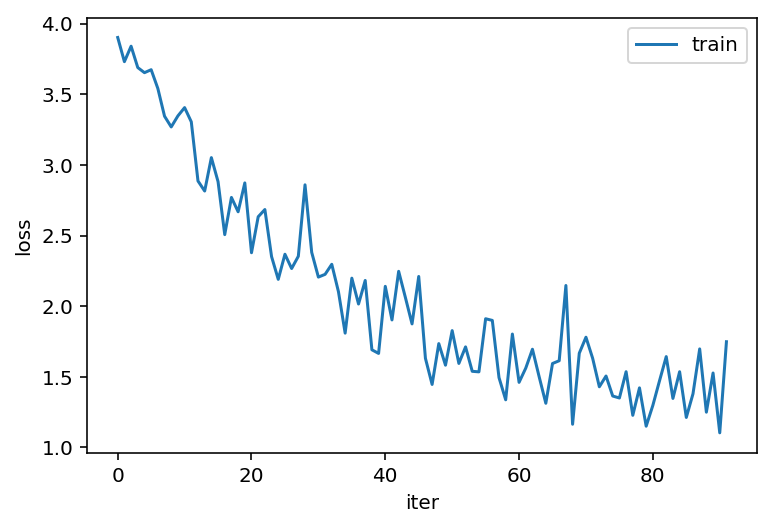

92
Epoch: 92, Iteration: 100, Loss: 1.6347377300262451
Epoch: 92, Iteration: 200, Loss: 1.707190752029419
Epoch: 92, Iteration: 300, Loss: 1.475222110748291
Epoch: 92, Iteration: 400, Loss: 1.545519232749939
Epoch: 92, Iteration: 500, Loss: 1.7080813646316528
Epoch: 92, Iteration: 600, Loss: 1.7732700109481812
Epoch: 92, Iteration: 700, Loss: 1.3352456092834473
Epoch: 92, Iteration: 800, Loss: 1.4430818557739258


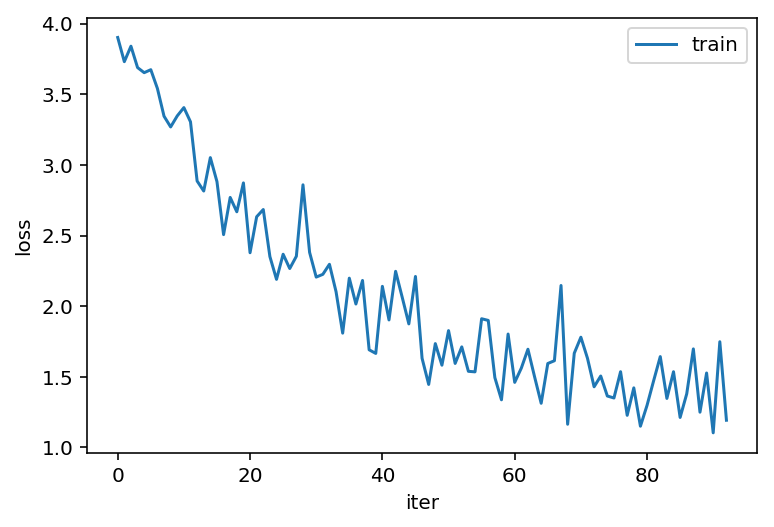

93
Epoch: 93, Iteration: 50, Loss: 1.4484624862670898
Epoch: 93, Iteration: 100, Loss: 1.3798177242279053
Epoch: 93, Iteration: 150, Loss: 1.243404746055603
Epoch: 93, Iteration: 200, Loss: 1.5344626903533936
Epoch: 93, Iteration: 250, Loss: 1.55363130569458
Epoch: 93, Iteration: 300, Loss: 1.2818015813827515
Epoch: 93, Iteration: 350, Loss: 1.5861387252807617
Epoch: 93, Iteration: 400, Loss: 1.3192378282546997
Epoch: 93, Iteration: 450, Loss: 1.1656160354614258
Epoch: 93, Iteration: 500, Loss: 1.4100103378295898
Epoch: 93, Iteration: 550, Loss: 1.2991670370101929
Epoch: 93, Iteration: 600, Loss: 1.2676429748535156
Epoch: 93, Iteration: 650, Loss: 1.4214328527450562
Epoch: 93, Iteration: 700, Loss: 1.3314440250396729
Epoch: 93, Iteration: 750, Loss: 1.3951020240783691
Epoch: 93, Iteration: 800, Loss: 1.486236810684204
Epoch: 93, Iteration: 850, Loss: 1.7685858011245728


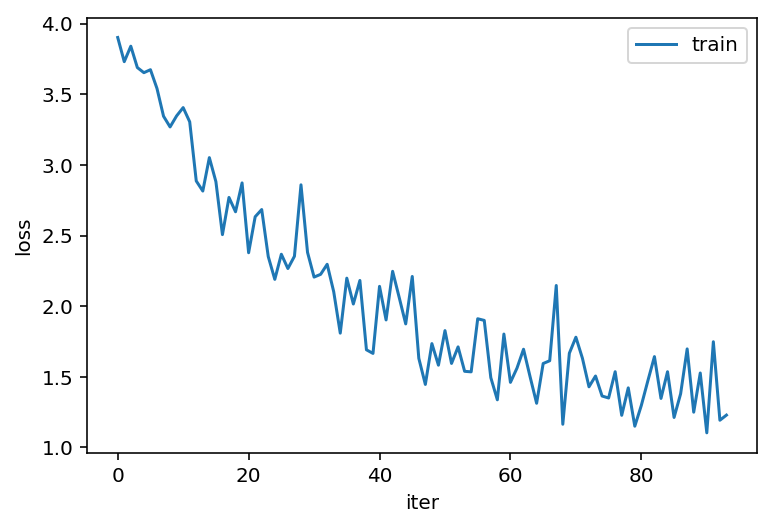

94
Epoch: 94, Iteration: 20, Loss: 1.410199522972107
Epoch: 94, Iteration: 40, Loss: 1.3740345239639282
Epoch: 94, Iteration: 60, Loss: 1.5461156368255615
Epoch: 94, Iteration: 80, Loss: 1.2010403871536255
Epoch: 94, Iteration: 100, Loss: 1.2149394750595093
Epoch: 94, Iteration: 120, Loss: 1.2236698865890503
Epoch: 94, Iteration: 140, Loss: 1.3153693675994873
Epoch: 94, Iteration: 160, Loss: 1.423872947692871
Epoch: 94, Iteration: 180, Loss: 1.1933047771453857
Epoch: 94, Iteration: 200, Loss: 1.332938551902771
Epoch: 94, Iteration: 220, Loss: 1.5578150749206543
Epoch: 94, Iteration: 240, Loss: 1.3332560062408447
Epoch: 94, Iteration: 260, Loss: 1.4491881132125854
Epoch: 94, Iteration: 280, Loss: 1.1416873931884766
Epoch: 94, Iteration: 300, Loss: 1.431338906288147
Epoch: 94, Iteration: 320, Loss: 0.9846012592315674
Epoch: 94, Iteration: 340, Loss: 1.4093782901763916
Epoch: 94, Iteration: 360, Loss: 1.2489097118377686
Epoch: 94, Iteration: 380, Loss: 1.2911975383758545
Epoch: 94, Iterat

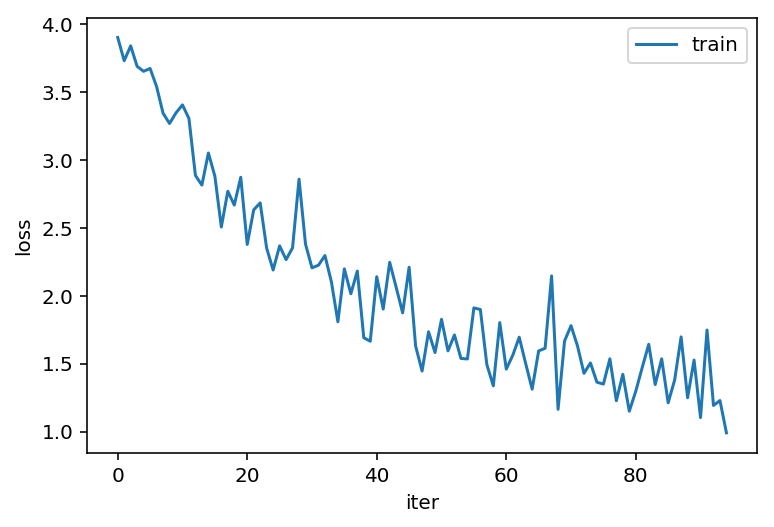

95
Epoch: 95, Iteration: 25, Loss: 1.4031449556350708
Epoch: 95, Iteration: 50, Loss: 1.463701844215393
Epoch: 95, Iteration: 75, Loss: 1.2988876104354858
Epoch: 95, Iteration: 100, Loss: 1.0999982357025146
Epoch: 95, Iteration: 125, Loss: 1.44169282913208
Epoch: 95, Iteration: 150, Loss: 1.4769412279129028
Epoch: 95, Iteration: 175, Loss: 1.6536245346069336
Epoch: 95, Iteration: 200, Loss: 1.2563554048538208
Epoch: 95, Iteration: 225, Loss: 1.060391902923584
Epoch: 95, Iteration: 250, Loss: 1.2422480583190918
Epoch: 95, Iteration: 275, Loss: 1.5786967277526855
Epoch: 95, Iteration: 300, Loss: 1.275136947631836
Epoch: 95, Iteration: 325, Loss: 1.296379566192627
Epoch: 95, Iteration: 350, Loss: 1.4240450859069824
Epoch: 95, Iteration: 375, Loss: 1.566681981086731
Epoch: 95, Iteration: 400, Loss: 1.513045310974121
Epoch: 95, Iteration: 425, Loss: 1.083774447441101
Epoch: 95, Iteration: 450, Loss: 1.510524868965149
Epoch: 95, Iteration: 475, Loss: 1.3892463445663452
Epoch: 95, Iteration: 

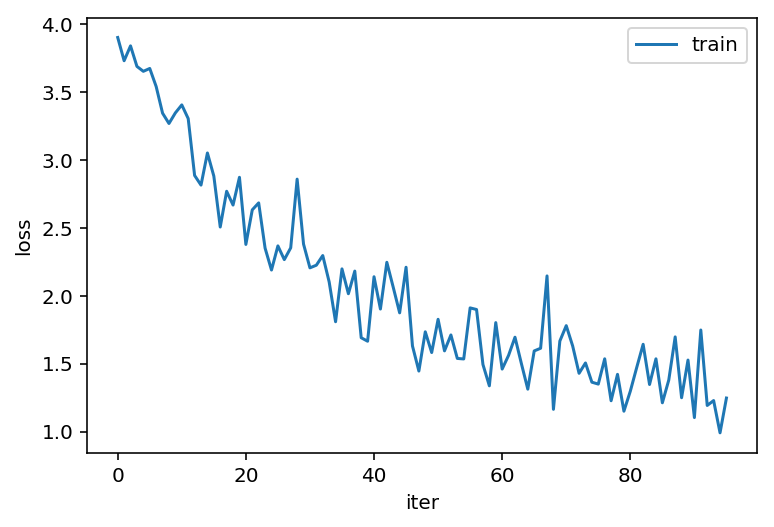

96
Epoch: 96, Iteration: 100, Loss: 1.5025345087051392
Epoch: 96, Iteration: 200, Loss: 1.3553359508514404
Epoch: 96, Iteration: 300, Loss: 1.5877974033355713
Epoch: 96, Iteration: 400, Loss: 1.3000987768173218
Epoch: 96, Iteration: 500, Loss: 1.8341248035430908
Epoch: 96, Iteration: 600, Loss: 1.3207911252975464
Epoch: 96, Iteration: 700, Loss: 1.2961738109588623
Epoch: 96, Iteration: 800, Loss: 1.043958306312561


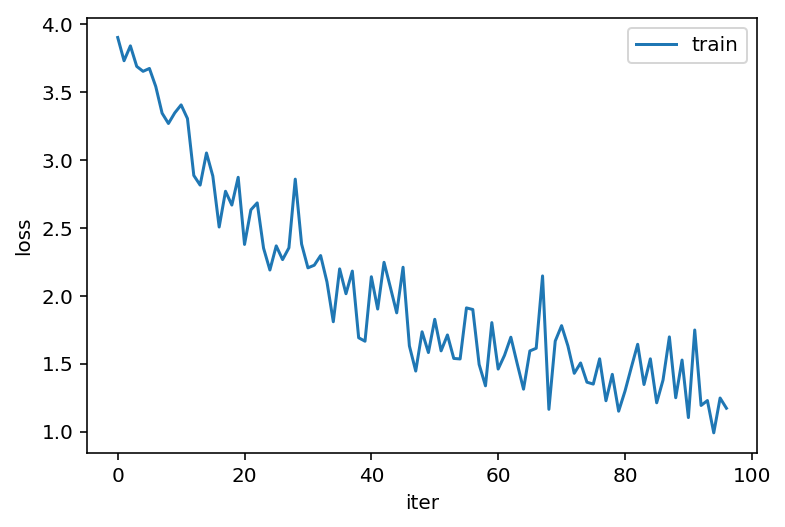

97
Epoch: 97, Iteration: 50, Loss: 1.5396603345870972
Epoch: 97, Iteration: 100, Loss: 1.607703447341919
Epoch: 97, Iteration: 150, Loss: 1.2986729145050049
Epoch: 97, Iteration: 200, Loss: 1.179023265838623
Epoch: 97, Iteration: 250, Loss: 1.567805528640747
Epoch: 97, Iteration: 300, Loss: 1.3016433715820312
Epoch: 97, Iteration: 350, Loss: 1.135697603225708
Epoch: 97, Iteration: 400, Loss: 1.4705802202224731
Epoch: 97, Iteration: 450, Loss: 1.1591471433639526
Epoch: 97, Iteration: 500, Loss: 1.1393452882766724
Epoch: 97, Iteration: 550, Loss: 1.4022917747497559
Epoch: 97, Iteration: 600, Loss: 1.1529145240783691
Epoch: 97, Iteration: 650, Loss: 1.0793061256408691
Epoch: 97, Iteration: 700, Loss: 1.419806957244873
Epoch: 97, Iteration: 750, Loss: 1.6826872825622559
Epoch: 97, Iteration: 800, Loss: 1.2582603693008423
Epoch: 97, Iteration: 850, Loss: 1.7628601789474487


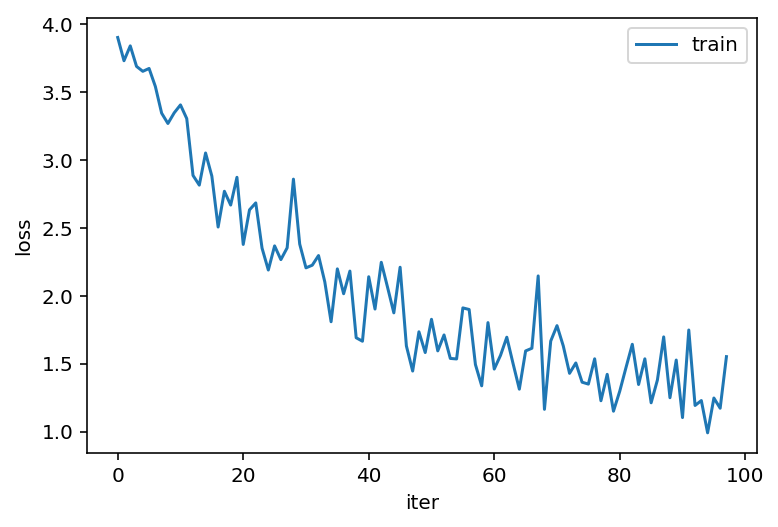

98
Epoch: 98, Iteration: 100, Loss: 1.3189623355865479
Epoch: 98, Iteration: 200, Loss: 1.4480750560760498
Epoch: 98, Iteration: 300, Loss: 1.3962534666061401
Epoch: 98, Iteration: 400, Loss: 1.3733381032943726
Epoch: 98, Iteration: 500, Loss: 1.5951900482177734
Epoch: 98, Iteration: 600, Loss: 1.21934974193573
Epoch: 98, Iteration: 700, Loss: 1.8017164468765259
Epoch: 98, Iteration: 800, Loss: 1.3281404972076416


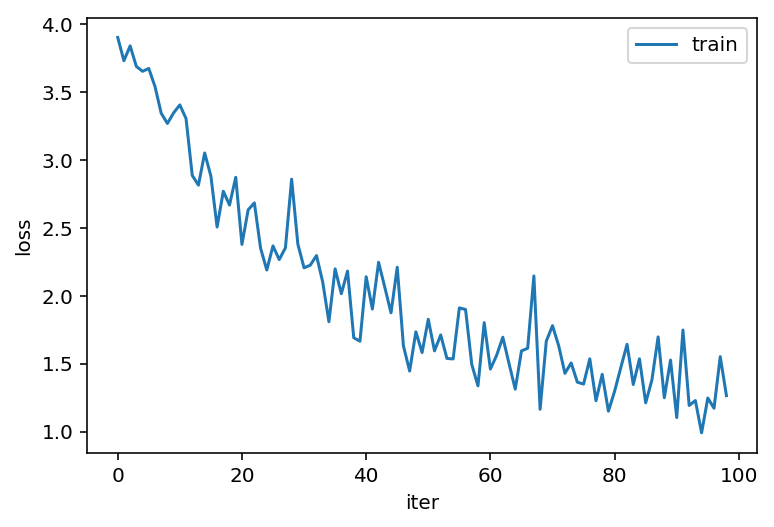

99
Epoch: 99, Iteration: 1, Loss: 1.3778656721115112
Epoch: 99, Iteration: 2, Loss: 1.1809580326080322
Epoch: 99, Iteration: 3, Loss: 1.5185588598251343
Epoch: 99, Iteration: 4, Loss: 1.265201210975647
Epoch: 99, Iteration: 5, Loss: 1.2199037075042725
Epoch: 99, Iteration: 6, Loss: 1.5528476238250732
Epoch: 99, Iteration: 7, Loss: 1.5496785640716553
Epoch: 99, Iteration: 8, Loss: 1.190529227256775
Epoch: 99, Iteration: 9, Loss: 1.3831616640090942
Epoch: 99, Iteration: 10, Loss: 1.2163718938827515
Epoch: 99, Iteration: 11, Loss: 0.8820783495903015
Epoch: 99, Iteration: 12, Loss: 1.5180515050888062
Epoch: 99, Iteration: 13, Loss: 1.3238029479980469
Epoch: 99, Iteration: 14, Loss: 1.4566411972045898
Epoch: 99, Iteration: 15, Loss: 1.3918992280960083
Epoch: 99, Iteration: 16, Loss: 1.2395062446594238
Epoch: 99, Iteration: 17, Loss: 1.2270252704620361
Epoch: 99, Iteration: 18, Loss: 1.125352144241333
Epoch: 99, Iteration: 19, Loss: 1.3947441577911377
Epoch: 99, Iteration: 20, Loss: 1.430918

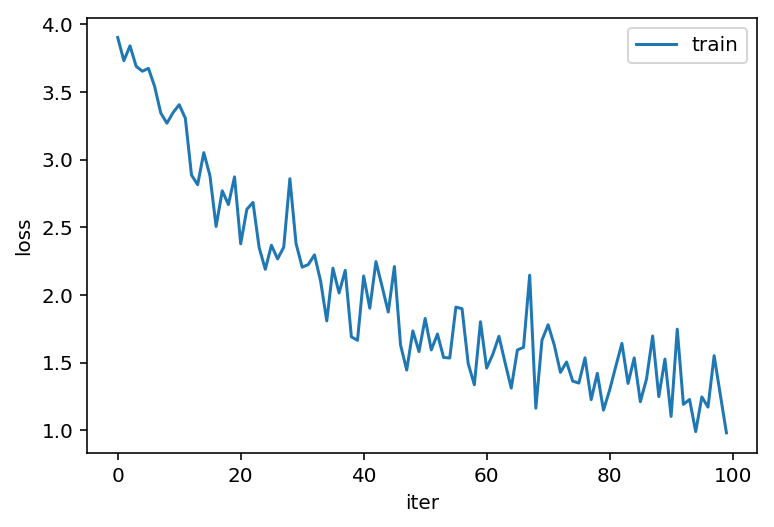

100
Epoch: 100, Iteration: 100, Loss: 1.144152045249939
Epoch: 100, Iteration: 200, Loss: 1.629133701324463
Epoch: 100, Iteration: 300, Loss: 1.239150047302246
Epoch: 100, Iteration: 400, Loss: 1.1795884370803833
Epoch: 100, Iteration: 500, Loss: 1.4806965589523315
Epoch: 100, Iteration: 600, Loss: 1.2778236865997314
Epoch: 100, Iteration: 700, Loss: 1.223367691040039
Epoch: 100, Iteration: 800, Loss: 1.3756990432739258


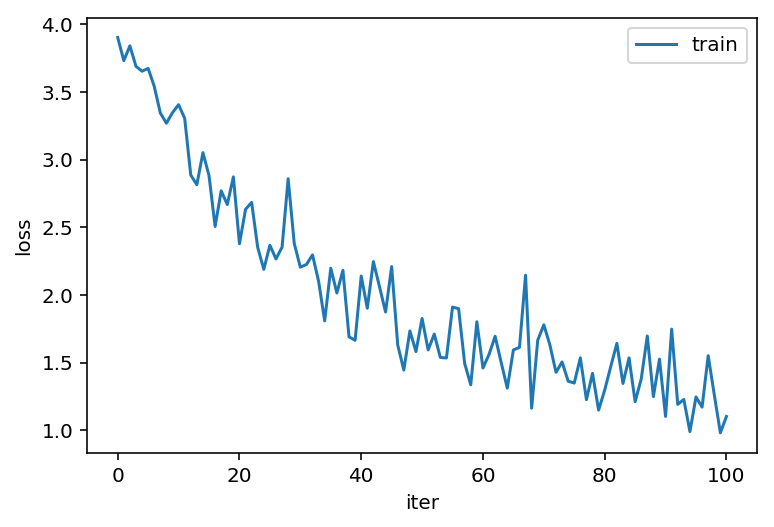

101
Epoch: 101, Iteration: 50, Loss: 0.9198423624038696
Epoch: 101, Iteration: 100, Loss: 1.306971549987793
Epoch: 101, Iteration: 150, Loss: 1.5699456930160522
Epoch: 101, Iteration: 200, Loss: 1.4940484762191772
Epoch: 101, Iteration: 250, Loss: 1.190083384513855
Epoch: 101, Iteration: 300, Loss: 1.3546900749206543
Epoch: 101, Iteration: 350, Loss: 1.5616474151611328
Epoch: 101, Iteration: 400, Loss: 1.3079088926315308
Epoch: 101, Iteration: 450, Loss: 1.1676392555236816
Epoch: 101, Iteration: 500, Loss: 1.1639783382415771
Epoch: 101, Iteration: 550, Loss: 1.7039763927459717
Epoch: 101, Iteration: 600, Loss: 1.238808512687683
Epoch: 101, Iteration: 650, Loss: 1.7512805461883545
Epoch: 101, Iteration: 700, Loss: 1.4040111303329468
Epoch: 101, Iteration: 750, Loss: 1.608394742012024
Epoch: 101, Iteration: 800, Loss: 1.3059972524642944
Epoch: 101, Iteration: 850, Loss: 1.3586235046386719


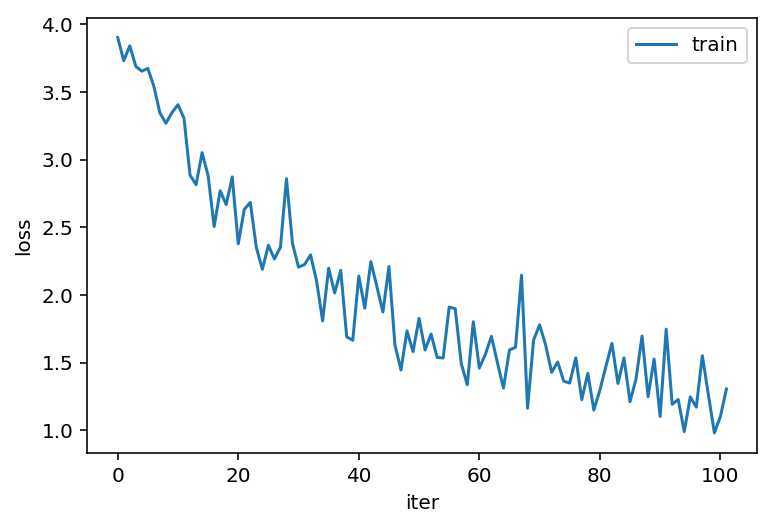

102
Epoch: 102, Iteration: 100, Loss: 1.3801956176757812
Epoch: 102, Iteration: 200, Loss: 1.3625084161758423
Epoch: 102, Iteration: 300, Loss: 1.4202953577041626
Epoch: 102, Iteration: 400, Loss: 1.3230066299438477
Epoch: 102, Iteration: 500, Loss: 1.4871554374694824
Epoch: 102, Iteration: 600, Loss: 1.55350661277771
Epoch: 102, Iteration: 700, Loss: 1.2584638595581055
Epoch: 102, Iteration: 800, Loss: 1.056235909461975


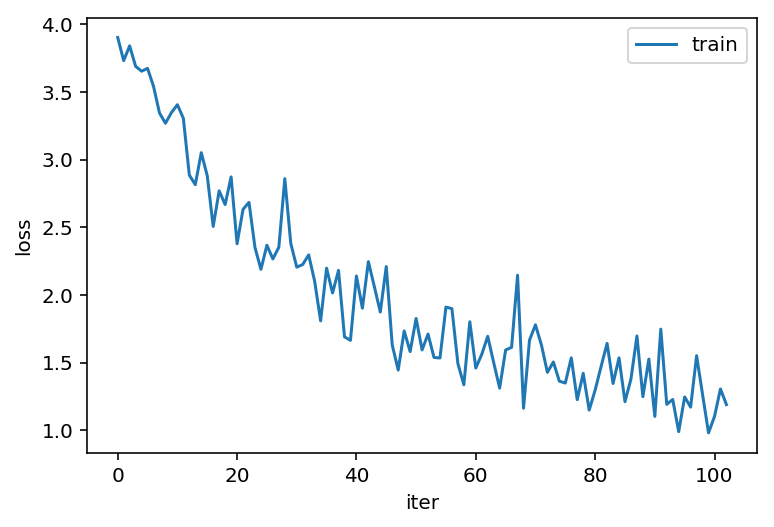

103
Epoch: 103, Iteration: 25, Loss: 1.093565821647644
Epoch: 103, Iteration: 50, Loss: 1.1739542484283447
Epoch: 103, Iteration: 75, Loss: 1.1228708028793335
Epoch: 103, Iteration: 100, Loss: 1.3774785995483398
Epoch: 103, Iteration: 125, Loss: 1.1282258033752441
Epoch: 103, Iteration: 150, Loss: 1.3553848266601562
Epoch: 103, Iteration: 175, Loss: 1.495205044746399
Epoch: 103, Iteration: 200, Loss: 1.2417659759521484
Epoch: 103, Iteration: 225, Loss: 0.9782368540763855
Epoch: 103, Iteration: 250, Loss: 1.5006719827651978
Epoch: 103, Iteration: 275, Loss: 1.6850194931030273
Epoch: 103, Iteration: 300, Loss: 1.097213625907898
Epoch: 103, Iteration: 325, Loss: 1.1221860647201538
Epoch: 103, Iteration: 350, Loss: 1.3046233654022217
Epoch: 103, Iteration: 375, Loss: 1.1112006902694702
Epoch: 103, Iteration: 400, Loss: 1.2755311727523804
Epoch: 103, Iteration: 425, Loss: 1.484945297241211
Epoch: 103, Iteration: 450, Loss: 1.288594365119934
Epoch: 103, Iteration: 475, Loss: 1.11440956592559

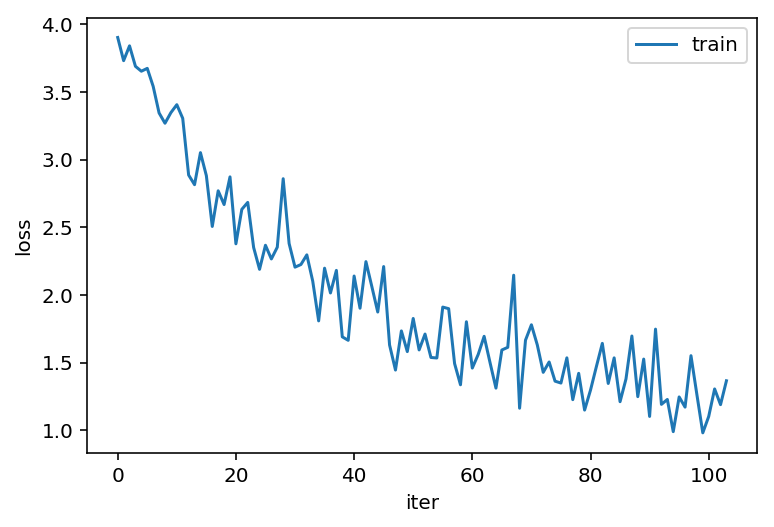

104
Epoch: 104, Iteration: 20, Loss: 1.4123859405517578
Epoch: 104, Iteration: 40, Loss: 1.5447633266448975
Epoch: 104, Iteration: 60, Loss: 1.139431118965149
Epoch: 104, Iteration: 80, Loss: 1.2294126749038696
Epoch: 104, Iteration: 100, Loss: 1.4525138139724731
Epoch: 104, Iteration: 120, Loss: 1.329149603843689
Epoch: 104, Iteration: 140, Loss: 1.4038362503051758
Epoch: 104, Iteration: 160, Loss: 1.266484022140503
Epoch: 104, Iteration: 180, Loss: 1.361187219619751
Epoch: 104, Iteration: 200, Loss: 1.1635884046554565
Epoch: 104, Iteration: 220, Loss: 1.4877557754516602
Epoch: 104, Iteration: 240, Loss: 1.2276599407196045
Epoch: 104, Iteration: 260, Loss: 1.4574942588806152
Epoch: 104, Iteration: 280, Loss: 1.0483589172363281
Epoch: 104, Iteration: 300, Loss: 1.1531407833099365
Epoch: 104, Iteration: 320, Loss: 1.3668538331985474
Epoch: 104, Iteration: 340, Loss: 1.4352444410324097
Epoch: 104, Iteration: 360, Loss: 1.422255516052246
Epoch: 104, Iteration: 380, Loss: 1.246250748634338

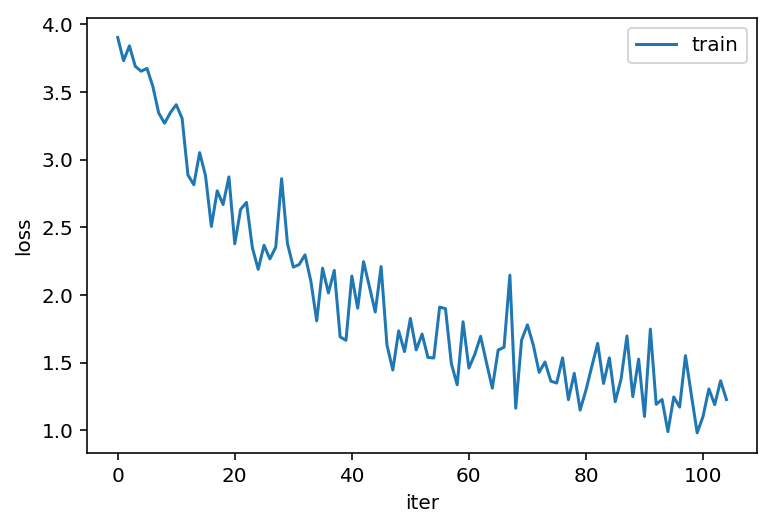

105
Epoch: 105, Iteration: 50, Loss: 1.3919869661331177
Epoch: 105, Iteration: 100, Loss: 1.416924238204956
Epoch: 105, Iteration: 150, Loss: 1.2625086307525635
Epoch: 105, Iteration: 200, Loss: 1.3185096979141235
Epoch: 105, Iteration: 250, Loss: 1.6668541431427002
Epoch: 105, Iteration: 300, Loss: 1.2872288227081299
Epoch: 105, Iteration: 350, Loss: 1.6889976263046265
Epoch: 105, Iteration: 400, Loss: 1.3200031518936157
Epoch: 105, Iteration: 450, Loss: 1.4649549722671509
Epoch: 105, Iteration: 500, Loss: 1.2426129579544067
Epoch: 105, Iteration: 550, Loss: 1.53423011302948
Epoch: 105, Iteration: 600, Loss: 1.2738276720046997
Epoch: 105, Iteration: 650, Loss: 1.222511649131775
Epoch: 105, Iteration: 700, Loss: 1.2647616863250732
Epoch: 105, Iteration: 750, Loss: 1.3740582466125488
Epoch: 105, Iteration: 800, Loss: 1.3146867752075195
Epoch: 105, Iteration: 850, Loss: 1.0926004648208618


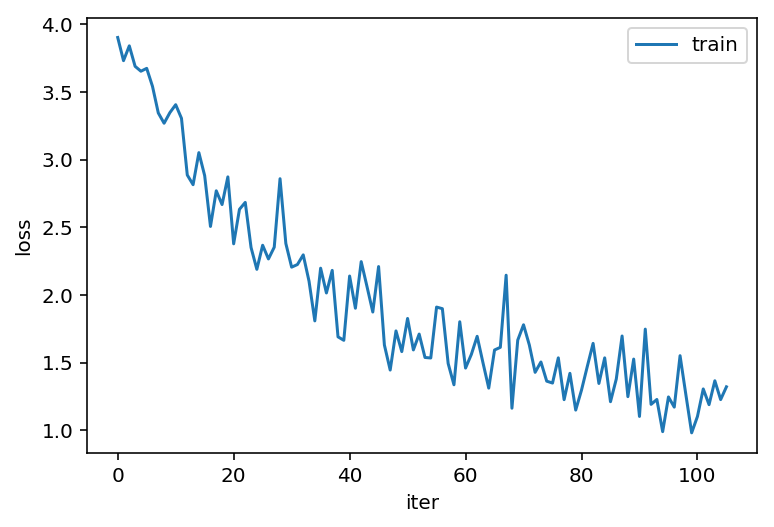

106
Epoch: 106, Iteration: 100, Loss: 1.3061758279800415
Epoch: 106, Iteration: 200, Loss: 1.4626482725143433
Epoch: 106, Iteration: 300, Loss: 1.2234313488006592
Epoch: 106, Iteration: 400, Loss: 1.257903814315796
Epoch: 106, Iteration: 500, Loss: 1.4594354629516602
Epoch: 106, Iteration: 600, Loss: 1.2198017835617065
Epoch: 106, Iteration: 700, Loss: 1.4883986711502075
Epoch: 106, Iteration: 800, Loss: 1.451756238937378


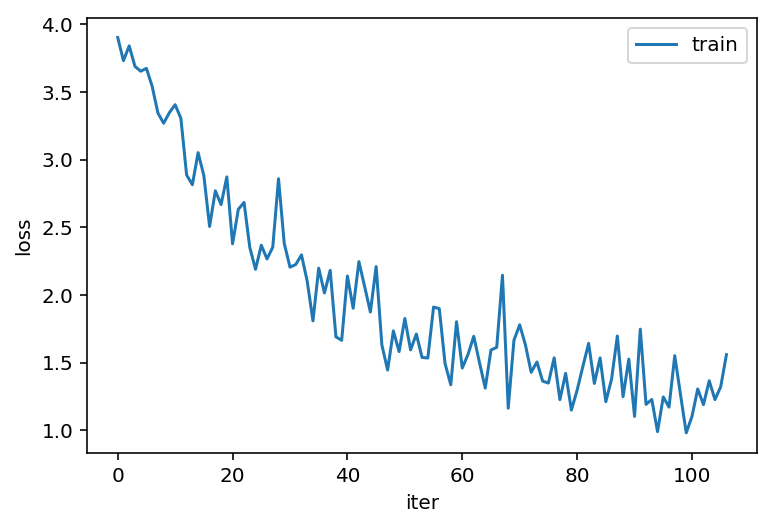

107
Epoch: 107, Iteration: 25, Loss: 1.170542597770691
Epoch: 107, Iteration: 50, Loss: 1.1012046337127686
Epoch: 107, Iteration: 75, Loss: 1.1922599077224731
Epoch: 107, Iteration: 100, Loss: 1.230980634689331
Epoch: 107, Iteration: 125, Loss: 0.8665223717689514
Epoch: 107, Iteration: 150, Loss: 1.2528494596481323
Epoch: 107, Iteration: 175, Loss: 1.383727788925171
Epoch: 107, Iteration: 200, Loss: 1.3453840017318726
Epoch: 107, Iteration: 225, Loss: 1.5804216861724854
Epoch: 107, Iteration: 250, Loss: 1.4483550786972046
Epoch: 107, Iteration: 275, Loss: 1.2423787117004395
Epoch: 107, Iteration: 300, Loss: 1.36085844039917
Epoch: 107, Iteration: 325, Loss: 1.5008609294891357
Epoch: 107, Iteration: 350, Loss: 1.6636018753051758
Epoch: 107, Iteration: 375, Loss: 1.2986297607421875
Epoch: 107, Iteration: 400, Loss: 1.385007619857788
Epoch: 107, Iteration: 425, Loss: 1.269264578819275
Epoch: 107, Iteration: 450, Loss: 1.2455055713653564
Epoch: 107, Iteration: 475, Loss: 1.2304514646530151

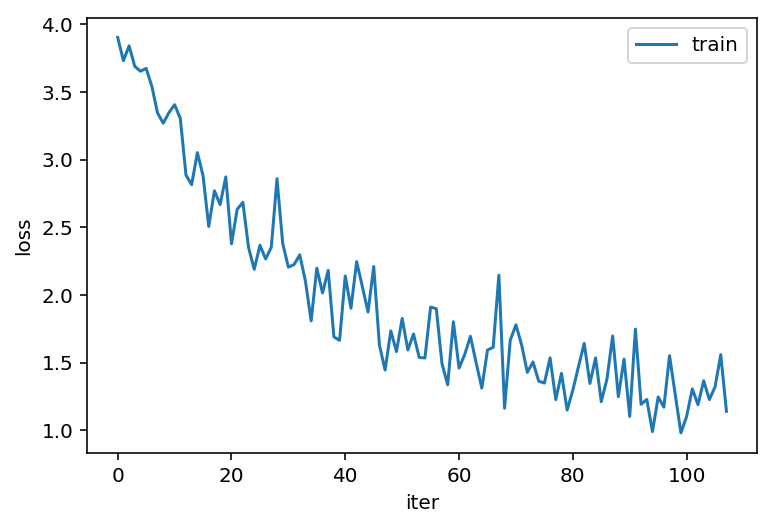

108
Epoch: 108, Iteration: 100, Loss: 1.3803088665008545
Epoch: 108, Iteration: 200, Loss: 1.278602957725525
Epoch: 108, Iteration: 300, Loss: 0.8258374929428101
Epoch: 108, Iteration: 400, Loss: 1.3880079984664917
Epoch: 108, Iteration: 500, Loss: 1.5430850982666016
Epoch: 108, Iteration: 600, Loss: 1.4850205183029175
Epoch: 108, Iteration: 700, Loss: 0.9285614490509033
Epoch: 108, Iteration: 800, Loss: 1.0252125263214111


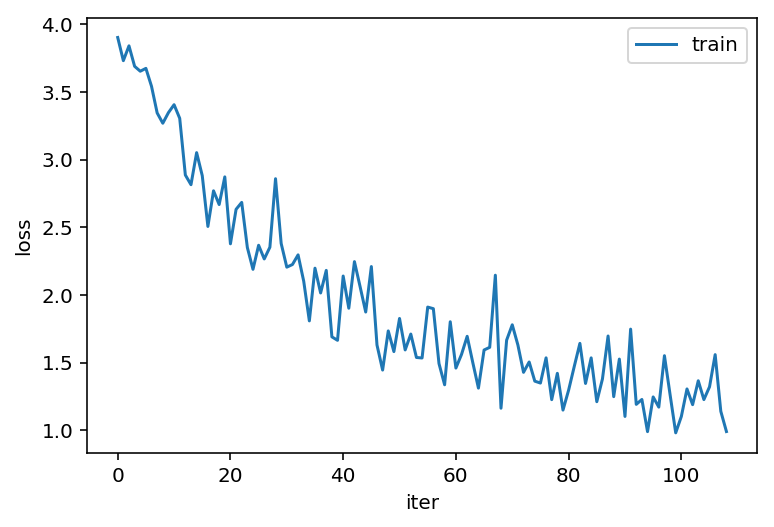

109
Epoch: 109, Iteration: 10, Loss: 1.378236174583435
Epoch: 109, Iteration: 20, Loss: 1.1285895109176636
Epoch: 109, Iteration: 30, Loss: 1.4201087951660156
Epoch: 109, Iteration: 40, Loss: 1.431532621383667
Epoch: 109, Iteration: 50, Loss: 1.09175443649292
Epoch: 109, Iteration: 60, Loss: 1.5202054977416992
Epoch: 109, Iteration: 70, Loss: 1.1812065839767456
Epoch: 109, Iteration: 80, Loss: 1.231083869934082
Epoch: 109, Iteration: 90, Loss: 1.3985798358917236
Epoch: 109, Iteration: 100, Loss: 1.4452829360961914
Epoch: 109, Iteration: 110, Loss: 0.9658554792404175
Epoch: 109, Iteration: 120, Loss: 1.1730633974075317
Epoch: 109, Iteration: 130, Loss: 1.1630805730819702
Epoch: 109, Iteration: 140, Loss: 1.0273618698120117
Epoch: 109, Iteration: 150, Loss: 1.4614331722259521
Epoch: 109, Iteration: 160, Loss: 1.442858338356018
Epoch: 109, Iteration: 170, Loss: 1.3336410522460938
Epoch: 109, Iteration: 180, Loss: 1.4979726076126099
Epoch: 109, Iteration: 190, Loss: 1.313833236694336
Epoch

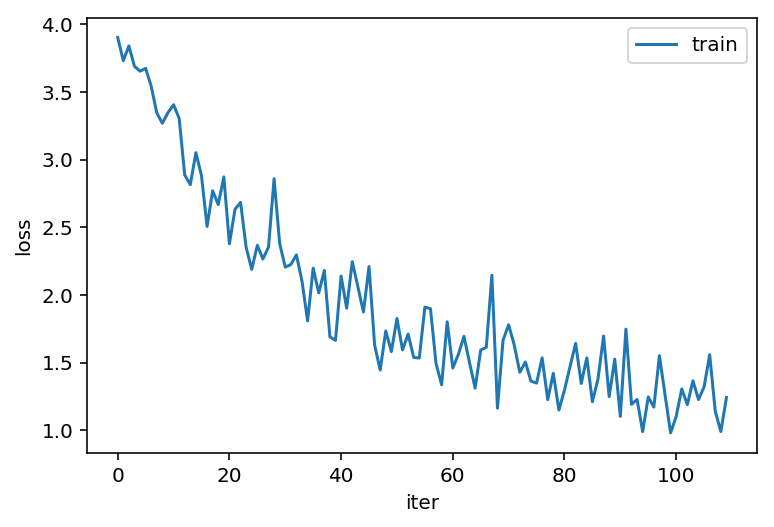

110
Epoch: 110, Iteration: 100, Loss: 1.1411300897598267
Epoch: 110, Iteration: 200, Loss: 1.1138008832931519
Epoch: 110, Iteration: 300, Loss: 1.7462506294250488
Epoch: 110, Iteration: 400, Loss: 1.6502487659454346
Epoch: 110, Iteration: 500, Loss: 0.850710391998291
Epoch: 110, Iteration: 600, Loss: 1.0144108533859253
Epoch: 110, Iteration: 700, Loss: 1.2207804918289185
Epoch: 110, Iteration: 800, Loss: 0.8972931504249573


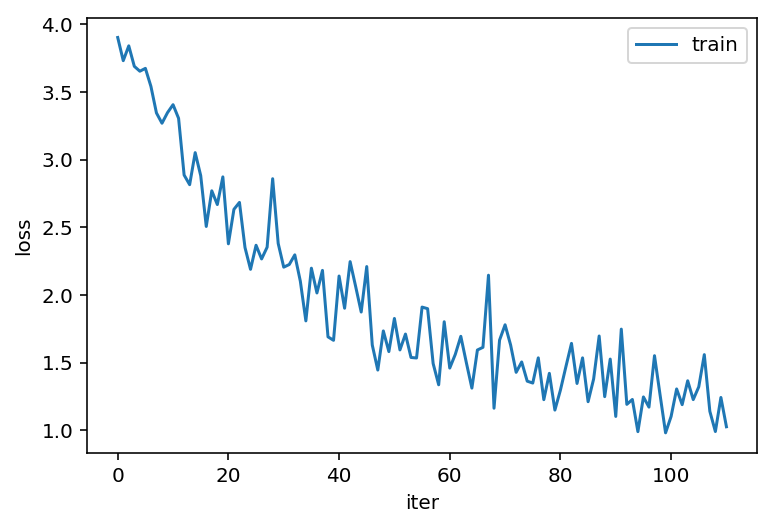

111
Epoch: 111, Iteration: 25, Loss: 1.1960985660552979
Epoch: 111, Iteration: 50, Loss: 1.4197105169296265
Epoch: 111, Iteration: 75, Loss: 1.4166793823242188
Epoch: 111, Iteration: 100, Loss: 1.3689601421356201
Epoch: 111, Iteration: 125, Loss: 1.2489079236984253
Epoch: 111, Iteration: 150, Loss: 1.390701174736023
Epoch: 111, Iteration: 175, Loss: 1.5066207647323608
Epoch: 111, Iteration: 200, Loss: 1.2292059659957886
Epoch: 111, Iteration: 225, Loss: 1.4765808582305908
Epoch: 111, Iteration: 250, Loss: 1.3882269859313965
Epoch: 111, Iteration: 275, Loss: 1.522215485572815
Epoch: 111, Iteration: 300, Loss: 1.4140069484710693
Epoch: 111, Iteration: 325, Loss: 1.2682437896728516
Epoch: 111, Iteration: 350, Loss: 1.3739277124404907
Epoch: 111, Iteration: 375, Loss: 1.3399103879928589
Epoch: 111, Iteration: 400, Loss: 1.0797475576400757
Epoch: 111, Iteration: 425, Loss: 1.3746715784072876
Epoch: 111, Iteration: 450, Loss: 1.494598388671875
Epoch: 111, Iteration: 475, Loss: 1.585377573966

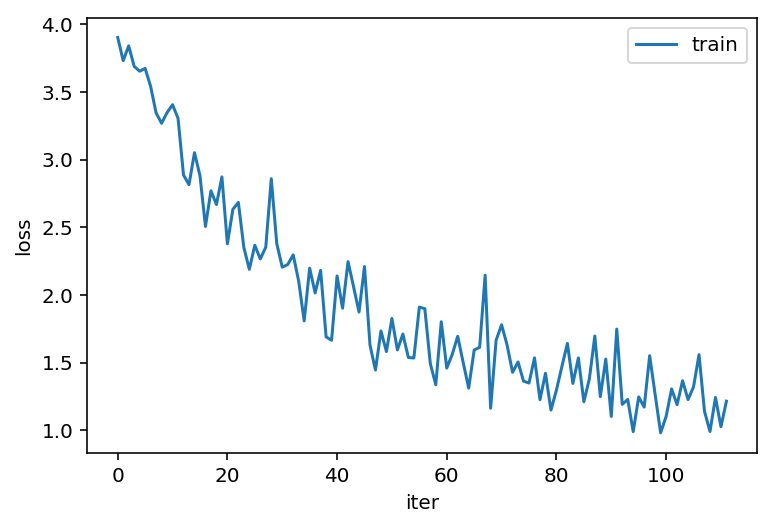

112
Epoch: 112, Iteration: 100, Loss: 1.3006526231765747
Epoch: 112, Iteration: 200, Loss: 0.830717921257019
Epoch: 112, Iteration: 300, Loss: 1.250901460647583
Epoch: 112, Iteration: 400, Loss: 0.9782925248146057
Epoch: 112, Iteration: 500, Loss: 1.4298301935195923
Epoch: 112, Iteration: 600, Loss: 1.1469167470932007
Epoch: 112, Iteration: 700, Loss: 1.5219650268554688
Epoch: 112, Iteration: 800, Loss: 1.382744550704956


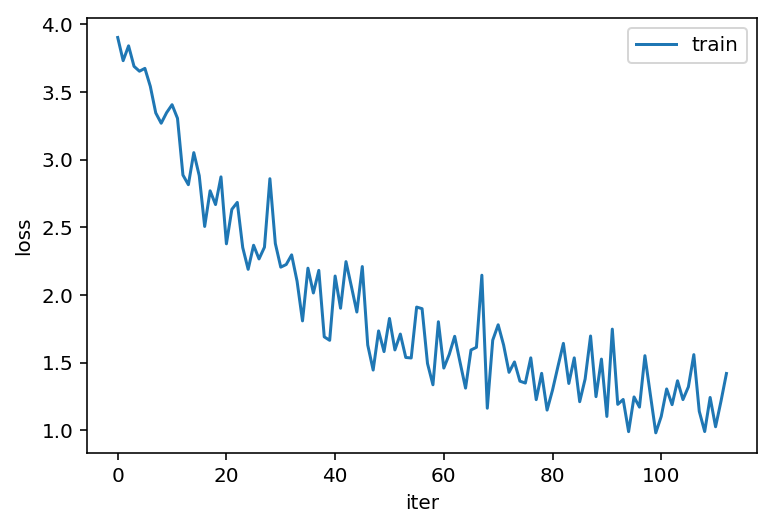

113
Epoch: 113, Iteration: 50, Loss: 1.4114954471588135
Epoch: 113, Iteration: 100, Loss: 1.3108865022659302
Epoch: 113, Iteration: 150, Loss: 1.2441630363464355
Epoch: 113, Iteration: 200, Loss: 1.1097393035888672
Epoch: 113, Iteration: 250, Loss: 1.3206110000610352
Epoch: 113, Iteration: 300, Loss: 1.3029084205627441
Epoch: 113, Iteration: 350, Loss: 1.3658884763717651
Epoch: 113, Iteration: 400, Loss: 1.1482980251312256
Epoch: 113, Iteration: 450, Loss: 1.4043699502944946
Epoch: 113, Iteration: 500, Loss: 1.3686171770095825
Epoch: 113, Iteration: 550, Loss: 1.4432284832000732
Epoch: 113, Iteration: 600, Loss: 1.445850133895874
Epoch: 113, Iteration: 650, Loss: 1.1400712728500366
Epoch: 113, Iteration: 700, Loss: 1.1798299551010132
Epoch: 113, Iteration: 750, Loss: 1.292407751083374
Epoch: 113, Iteration: 800, Loss: 1.37149977684021
Epoch: 113, Iteration: 850, Loss: 1.4307736158370972


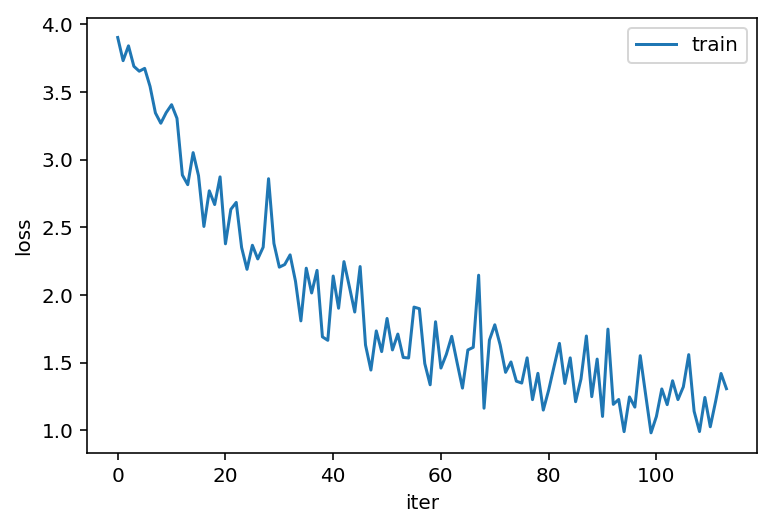

114
Epoch: 114, Iteration: 20, Loss: 1.136573314666748
Epoch: 114, Iteration: 40, Loss: 1.3089433908462524
Epoch: 114, Iteration: 60, Loss: 0.9028367400169373
Epoch: 114, Iteration: 80, Loss: 1.1483529806137085
Epoch: 114, Iteration: 100, Loss: 1.2817789316177368
Epoch: 114, Iteration: 120, Loss: 0.9780061841011047
Epoch: 114, Iteration: 140, Loss: 0.9355359673500061
Epoch: 114, Iteration: 160, Loss: 0.9275164604187012
Epoch: 114, Iteration: 180, Loss: 1.0543289184570312
Epoch: 114, Iteration: 200, Loss: 1.3339674472808838
Epoch: 114, Iteration: 220, Loss: 1.112253189086914
Epoch: 114, Iteration: 240, Loss: 1.3692491054534912
Epoch: 114, Iteration: 260, Loss: 0.990946888923645
Epoch: 114, Iteration: 280, Loss: 1.3712308406829834
Epoch: 114, Iteration: 300, Loss: 1.0819544792175293
Epoch: 114, Iteration: 320, Loss: 1.3818761110305786
Epoch: 114, Iteration: 340, Loss: 1.4271339178085327
Epoch: 114, Iteration: 360, Loss: 1.1996914148330688
Epoch: 114, Iteration: 380, Loss: 1.7005608081817

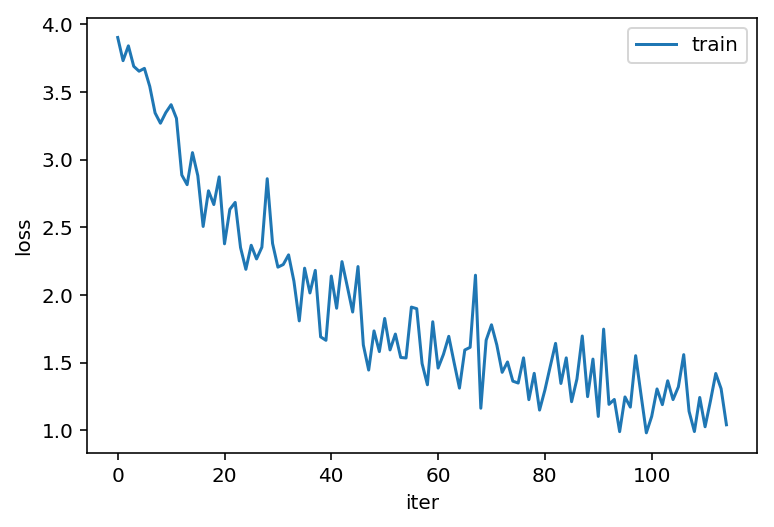

115
Epoch: 115, Iteration: 25, Loss: 1.4733636379241943
Epoch: 115, Iteration: 50, Loss: 1.3971688747406006
Epoch: 115, Iteration: 75, Loss: 1.120283603668213
Epoch: 115, Iteration: 100, Loss: 0.8207128047943115
Epoch: 115, Iteration: 125, Loss: 1.1977345943450928
Epoch: 115, Iteration: 150, Loss: 1.343544840812683
Epoch: 115, Iteration: 175, Loss: 1.1791017055511475
Epoch: 115, Iteration: 200, Loss: 0.9832229018211365
Epoch: 115, Iteration: 225, Loss: 1.2571899890899658
Epoch: 115, Iteration: 250, Loss: 1.1727174520492554
Epoch: 115, Iteration: 275, Loss: 1.5086067914962769
Epoch: 115, Iteration: 300, Loss: 1.2154567241668701
Epoch: 115, Iteration: 325, Loss: 1.2645180225372314
Epoch: 115, Iteration: 350, Loss: 1.061973214149475
Epoch: 115, Iteration: 375, Loss: 1.305851697921753
Epoch: 115, Iteration: 400, Loss: 1.5619734525680542
Epoch: 115, Iteration: 425, Loss: 1.597597599029541
Epoch: 115, Iteration: 450, Loss: 1.4187427759170532
Epoch: 115, Iteration: 475, Loss: 1.07247138023376

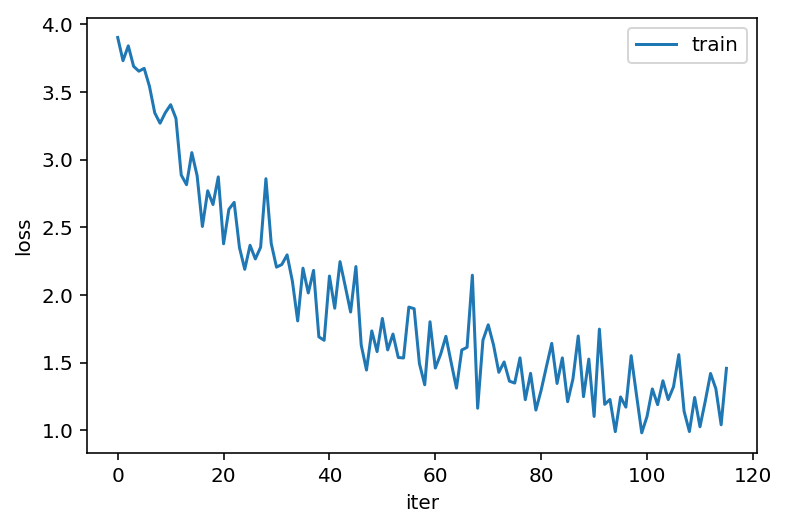

116
Epoch: 116, Iteration: 100, Loss: 1.2431453466415405
Epoch: 116, Iteration: 200, Loss: 1.3473564386367798
Epoch: 116, Iteration: 300, Loss: 1.6405553817749023
Epoch: 116, Iteration: 400, Loss: 1.3559727668762207
Epoch: 116, Iteration: 500, Loss: 1.5869452953338623
Epoch: 116, Iteration: 600, Loss: 1.315281867980957
Epoch: 116, Iteration: 700, Loss: 1.3228521347045898
Epoch: 116, Iteration: 800, Loss: 1.0282349586486816


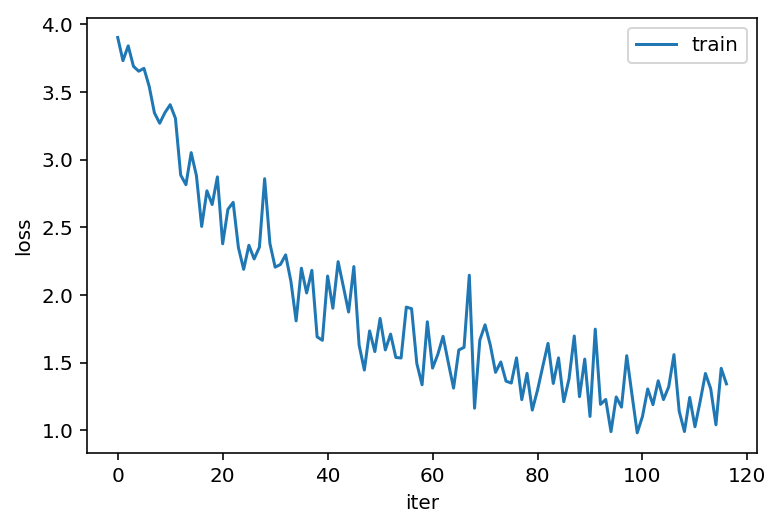

117
Epoch: 117, Iteration: 50, Loss: 1.181902527809143
Epoch: 117, Iteration: 100, Loss: 1.3793728351593018
Epoch: 117, Iteration: 150, Loss: 1.23466157913208
Epoch: 117, Iteration: 200, Loss: 1.197988510131836
Epoch: 117, Iteration: 250, Loss: 1.445429801940918
Epoch: 117, Iteration: 300, Loss: 1.348190188407898
Epoch: 117, Iteration: 350, Loss: 1.1583900451660156
Epoch: 117, Iteration: 400, Loss: 1.0984365940093994
Epoch: 117, Iteration: 450, Loss: 1.3053710460662842
Epoch: 117, Iteration: 500, Loss: 1.5452765226364136
Epoch: 117, Iteration: 550, Loss: 1.2134772539138794
Epoch: 117, Iteration: 600, Loss: 1.621933102607727
Epoch: 117, Iteration: 650, Loss: 1.0249571800231934
Epoch: 117, Iteration: 700, Loss: 1.2566781044006348
Epoch: 117, Iteration: 750, Loss: 1.1973233222961426
Epoch: 117, Iteration: 800, Loss: 1.5372382402420044
Epoch: 117, Iteration: 850, Loss: 1.0114279985427856


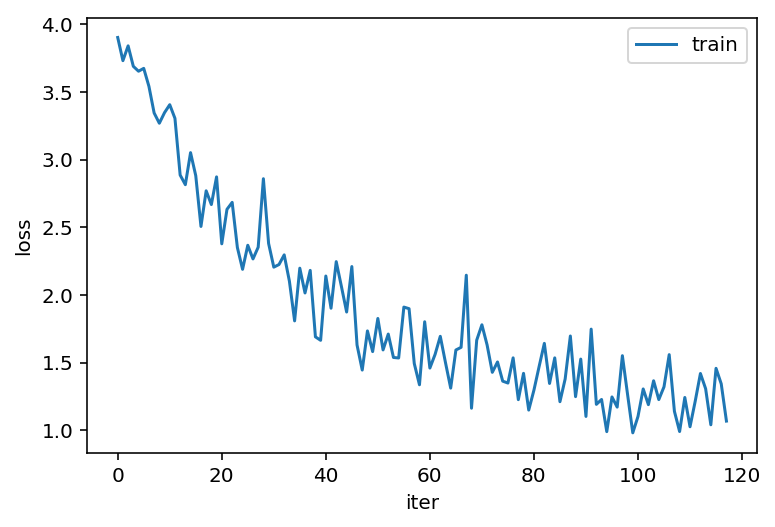

118
Epoch: 118, Iteration: 100, Loss: 1.3109591007232666
Epoch: 118, Iteration: 200, Loss: 1.1575549840927124
Epoch: 118, Iteration: 300, Loss: 1.0559223890304565
Epoch: 118, Iteration: 400, Loss: 1.617993712425232
Epoch: 118, Iteration: 500, Loss: 1.220003604888916
Epoch: 118, Iteration: 600, Loss: 1.3379645347595215
Epoch: 118, Iteration: 700, Loss: 1.3388416767120361
Epoch: 118, Iteration: 800, Loss: 1.5102105140686035


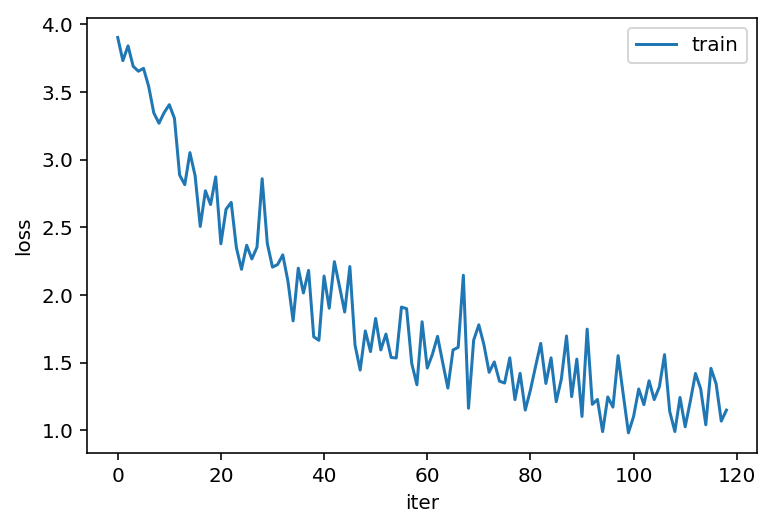

119
Epoch: 119, Iteration: 5, Loss: 1.1468243598937988
Epoch: 119, Iteration: 10, Loss: 1.603114366531372
Epoch: 119, Iteration: 15, Loss: 1.2793569564819336
Epoch: 119, Iteration: 20, Loss: 1.3591488599777222
Epoch: 119, Iteration: 25, Loss: 0.8921166658401489
Epoch: 119, Iteration: 30, Loss: 1.3138543367385864
Epoch: 119, Iteration: 35, Loss: 0.8715335130691528
Epoch: 119, Iteration: 40, Loss: 1.154033899307251
Epoch: 119, Iteration: 45, Loss: 1.1287809610366821
Epoch: 119, Iteration: 50, Loss: 1.5442752838134766
Epoch: 119, Iteration: 55, Loss: 1.0872665643692017
Epoch: 119, Iteration: 60, Loss: 1.215242624282837
Epoch: 119, Iteration: 65, Loss: 1.2192094326019287
Epoch: 119, Iteration: 70, Loss: 1.3008801937103271
Epoch: 119, Iteration: 75, Loss: 1.082565188407898
Epoch: 119, Iteration: 80, Loss: 1.0090973377227783
Epoch: 119, Iteration: 85, Loss: 1.394653081893921
Epoch: 119, Iteration: 90, Loss: 1.0856008529663086
Epoch: 119, Iteration: 95, Loss: 1.136931300163269
Epoch: 119, Ite

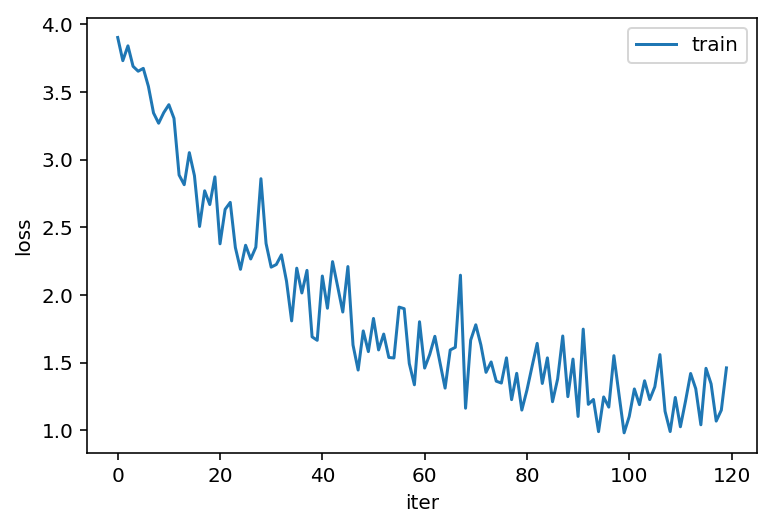

120
Epoch: 120, Iteration: 100, Loss: 1.0100810527801514
Epoch: 120, Iteration: 200, Loss: 1.1863352060317993
Epoch: 120, Iteration: 300, Loss: 1.1293047666549683
Epoch: 120, Iteration: 400, Loss: 1.144091248512268
Epoch: 120, Iteration: 500, Loss: 1.4954054355621338
Epoch: 120, Iteration: 600, Loss: 1.271637201309204
Epoch: 120, Iteration: 700, Loss: 1.3248393535614014
Epoch: 120, Iteration: 800, Loss: 1.1647061109542847


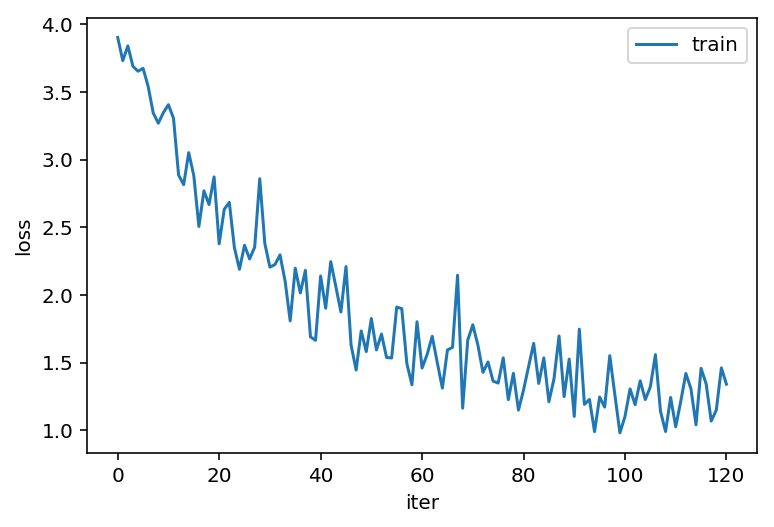

121
Epoch: 121, Iteration: 50, Loss: 1.5068858861923218
Epoch: 121, Iteration: 100, Loss: 1.545257806777954
Epoch: 121, Iteration: 150, Loss: 1.4462571144104004
Epoch: 121, Iteration: 200, Loss: 1.4972138404846191
Epoch: 121, Iteration: 250, Loss: 1.101243495941162
Epoch: 121, Iteration: 300, Loss: 1.459639549255371
Epoch: 121, Iteration: 350, Loss: 1.0505564212799072
Epoch: 121, Iteration: 400, Loss: 1.0944775342941284
Epoch: 121, Iteration: 450, Loss: 1.2896891832351685
Epoch: 121, Iteration: 500, Loss: 1.0593183040618896
Epoch: 121, Iteration: 550, Loss: 1.3956692218780518
Epoch: 121, Iteration: 600, Loss: 1.3653401136398315
Epoch: 121, Iteration: 650, Loss: 1.4820560216903687
Epoch: 121, Iteration: 700, Loss: 1.1819435358047485
Epoch: 121, Iteration: 750, Loss: 1.2500569820404053
Epoch: 121, Iteration: 800, Loss: 1.0304232835769653
Epoch: 121, Iteration: 850, Loss: 1.3464120626449585


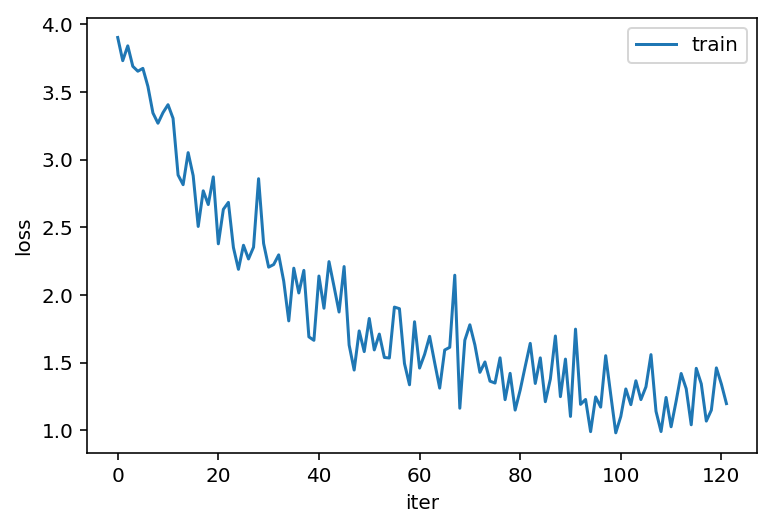

122
Epoch: 122, Iteration: 100, Loss: 0.9304538369178772
Epoch: 122, Iteration: 200, Loss: 1.1012777090072632
Epoch: 122, Iteration: 300, Loss: 1.2769290208816528
Epoch: 122, Iteration: 400, Loss: 1.365074634552002
Epoch: 122, Iteration: 500, Loss: 1.1426182985305786
Epoch: 122, Iteration: 600, Loss: 1.1937386989593506
Epoch: 122, Iteration: 700, Loss: 0.9718652963638306
Epoch: 122, Iteration: 800, Loss: 1.219024419784546


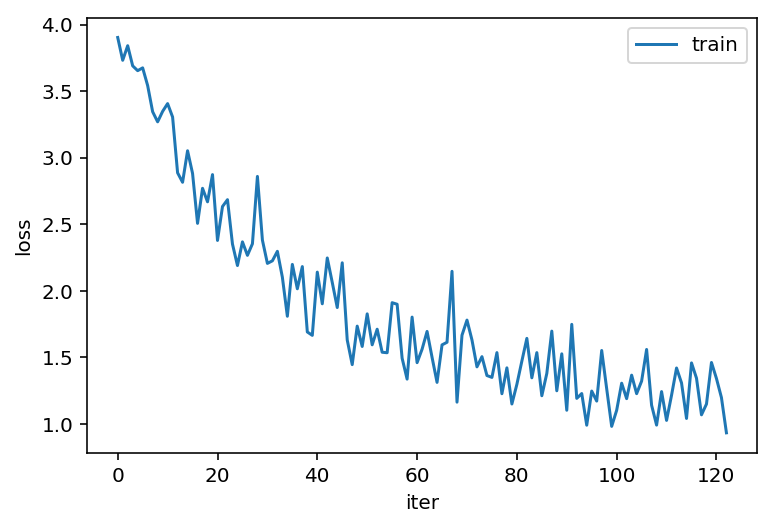

123
Epoch: 123, Iteration: 25, Loss: 1.2121903896331787
Epoch: 123, Iteration: 50, Loss: 1.09750497341156
Epoch: 123, Iteration: 75, Loss: 1.1368591785430908
Epoch: 123, Iteration: 100, Loss: 1.4169020652770996
Epoch: 123, Iteration: 125, Loss: 1.2694333791732788
Epoch: 123, Iteration: 150, Loss: 0.9537060260772705
Epoch: 123, Iteration: 175, Loss: 1.329558253288269
Epoch: 123, Iteration: 200, Loss: 1.2490191459655762
Epoch: 123, Iteration: 225, Loss: 1.1021360158920288
Epoch: 123, Iteration: 250, Loss: 1.2785158157348633
Epoch: 123, Iteration: 275, Loss: 1.1408262252807617
Epoch: 123, Iteration: 300, Loss: 1.6512032747268677
Epoch: 123, Iteration: 325, Loss: 1.6918752193450928
Epoch: 123, Iteration: 350, Loss: 1.1274652481079102
Epoch: 123, Iteration: 375, Loss: 1.3157048225402832
Epoch: 123, Iteration: 400, Loss: 1.1111477613449097
Epoch: 123, Iteration: 425, Loss: 1.4678980112075806
Epoch: 123, Iteration: 450, Loss: 1.2385605573654175
Epoch: 123, Iteration: 475, Loss: 1.311451315879

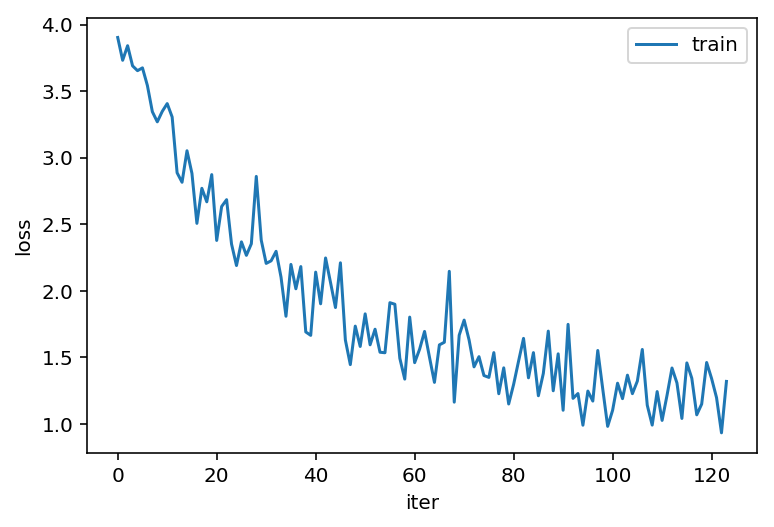

124
Epoch: 124, Iteration: 4, Loss: 1.1004332304000854
Epoch: 124, Iteration: 8, Loss: 1.3452788591384888
Epoch: 124, Iteration: 12, Loss: 1.2125232219696045
Epoch: 124, Iteration: 16, Loss: 1.127542495727539
Epoch: 124, Iteration: 20, Loss: 1.3394075632095337
Epoch: 124, Iteration: 24, Loss: 1.0122829675674438
Epoch: 124, Iteration: 28, Loss: 1.4283161163330078
Epoch: 124, Iteration: 32, Loss: 1.0151734352111816
Epoch: 124, Iteration: 36, Loss: 1.0083380937576294
Epoch: 124, Iteration: 40, Loss: 1.0273011922836304
Epoch: 124, Iteration: 44, Loss: 1.2777020931243896
Epoch: 124, Iteration: 48, Loss: 1.1058000326156616
Epoch: 124, Iteration: 52, Loss: 1.3875435590744019
Epoch: 124, Iteration: 56, Loss: 1.0252021551132202
Epoch: 124, Iteration: 60, Loss: 1.1214120388031006
Epoch: 124, Iteration: 64, Loss: 1.359260082244873
Epoch: 124, Iteration: 68, Loss: 1.3207440376281738
Epoch: 124, Iteration: 72, Loss: 1.1808497905731201
Epoch: 124, Iteration: 76, Loss: 0.8144183158874512
Epoch: 124, 

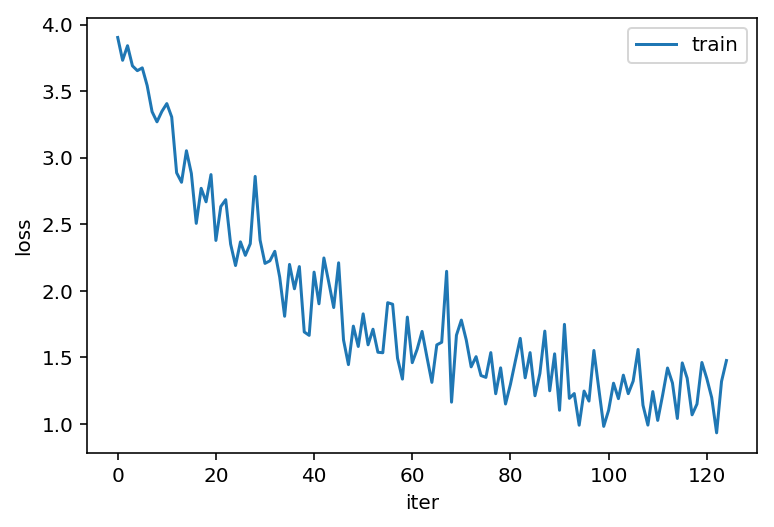

125
Epoch: 125, Iteration: 50, Loss: 1.2524648904800415
Epoch: 125, Iteration: 100, Loss: 1.1226481199264526
Epoch: 125, Iteration: 150, Loss: 1.3161084651947021
Epoch: 125, Iteration: 200, Loss: 1.0098103284835815
Epoch: 125, Iteration: 250, Loss: 1.0571715831756592
Epoch: 125, Iteration: 300, Loss: 1.3142647743225098
Epoch: 125, Iteration: 350, Loss: 1.0786539316177368
Epoch: 125, Iteration: 400, Loss: 1.1999708414077759
Epoch: 125, Iteration: 450, Loss: 1.5218290090560913
Epoch: 125, Iteration: 500, Loss: 1.6464111804962158
Epoch: 125, Iteration: 550, Loss: 1.0415422916412354
Epoch: 125, Iteration: 600, Loss: 1.3255819082260132
Epoch: 125, Iteration: 650, Loss: 1.1692663431167603
Epoch: 125, Iteration: 700, Loss: 1.3261390924453735
Epoch: 125, Iteration: 750, Loss: 1.1371736526489258
Epoch: 125, Iteration: 800, Loss: 1.3742974996566772
Epoch: 125, Iteration: 850, Loss: 1.3154752254486084


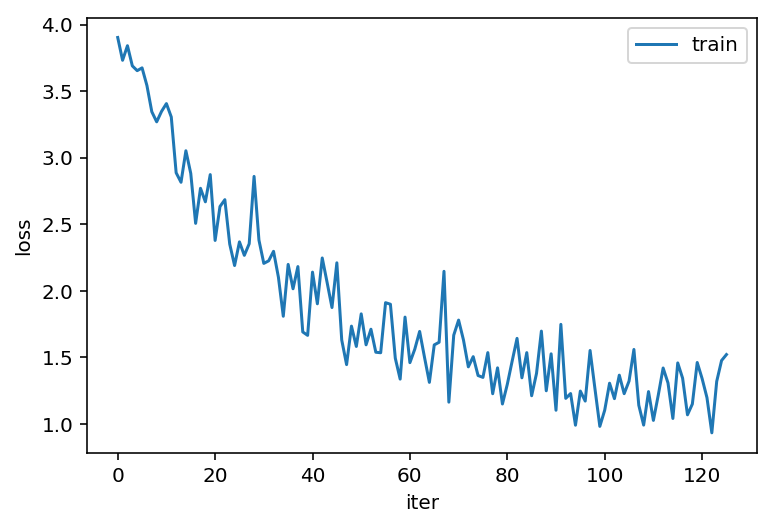

126
Epoch: 126, Iteration: 100, Loss: 1.024329423904419
Epoch: 126, Iteration: 200, Loss: 1.302104115486145
Epoch: 126, Iteration: 300, Loss: 0.9868419170379639
Epoch: 126, Iteration: 400, Loss: 1.3851468563079834
Epoch: 126, Iteration: 500, Loss: 1.6881815195083618
Epoch: 126, Iteration: 600, Loss: 1.0465680360794067
Epoch: 126, Iteration: 700, Loss: 1.2273682355880737
Epoch: 126, Iteration: 800, Loss: 1.3496955633163452


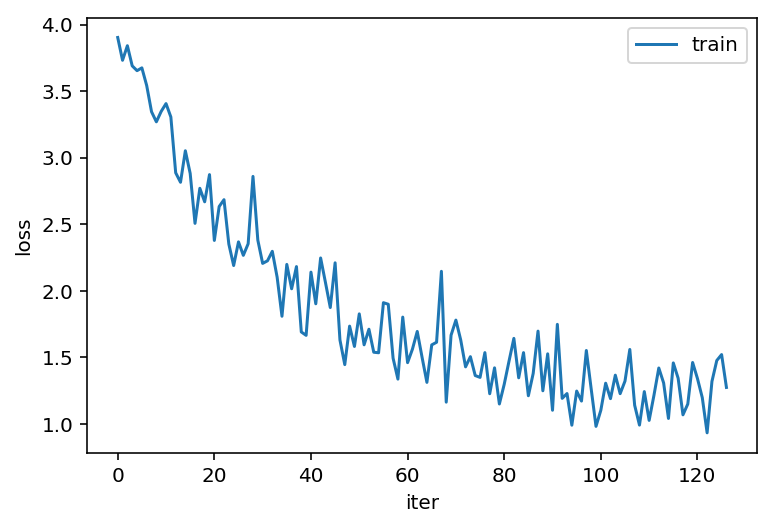

127
Epoch: 127, Iteration: 25, Loss: 1.3187772035598755
Epoch: 127, Iteration: 50, Loss: 1.110792636871338
Epoch: 127, Iteration: 75, Loss: 0.9890695214271545
Epoch: 127, Iteration: 100, Loss: 1.373275876045227
Epoch: 127, Iteration: 125, Loss: 1.1736706495285034
Epoch: 127, Iteration: 150, Loss: 1.3834184408187866
Epoch: 127, Iteration: 175, Loss: 1.0896406173706055
Epoch: 127, Iteration: 200, Loss: 1.224942684173584
Epoch: 127, Iteration: 225, Loss: 1.3547414541244507
Epoch: 127, Iteration: 250, Loss: 1.325275182723999
Epoch: 127, Iteration: 275, Loss: 1.219173789024353
Epoch: 127, Iteration: 300, Loss: 1.1224150657653809
Epoch: 127, Iteration: 325, Loss: 1.2799209356307983
Epoch: 127, Iteration: 350, Loss: 1.4417353868484497
Epoch: 127, Iteration: 375, Loss: 1.5151445865631104
Epoch: 127, Iteration: 400, Loss: 0.7375266551971436
Epoch: 127, Iteration: 425, Loss: 0.9289863109588623
Epoch: 127, Iteration: 450, Loss: 1.210399866104126
Epoch: 127, Iteration: 475, Loss: 0.946473598480224

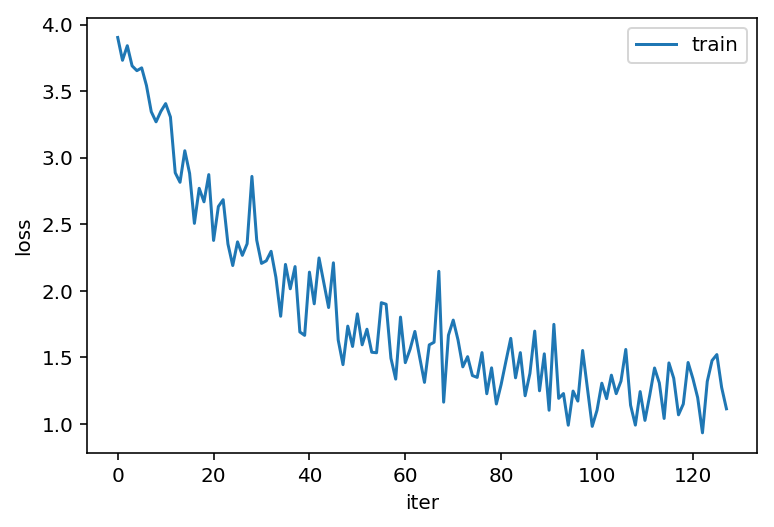

128
Epoch: 128, Iteration: 100, Loss: 1.012566089630127
Epoch: 128, Iteration: 200, Loss: 1.1766698360443115
Epoch: 128, Iteration: 300, Loss: 1.5261547565460205
Epoch: 128, Iteration: 400, Loss: 1.3185232877731323
Epoch: 128, Iteration: 500, Loss: 1.3661082983016968
Epoch: 128, Iteration: 600, Loss: 1.3547680377960205
Epoch: 128, Iteration: 700, Loss: 1.448352575302124
Epoch: 128, Iteration: 800, Loss: 1.4379712343215942


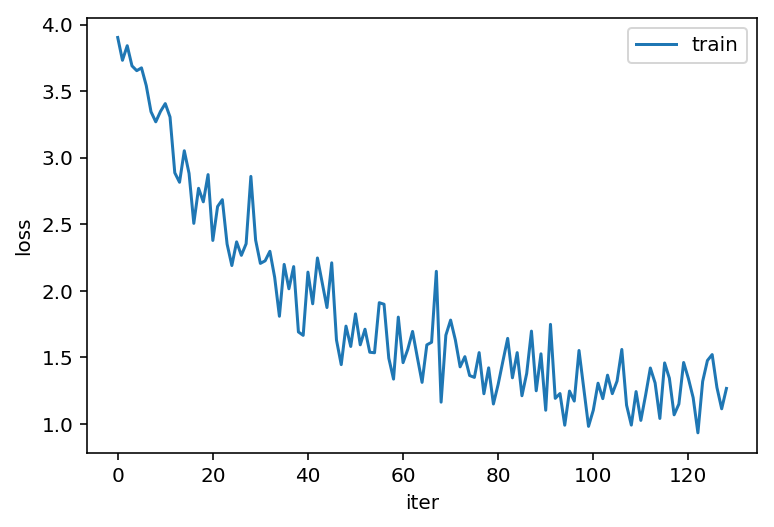

129
Epoch: 129, Iteration: 10, Loss: 1.2473880052566528
Epoch: 129, Iteration: 20, Loss: 1.030260443687439
Epoch: 129, Iteration: 30, Loss: 1.2253570556640625
Epoch: 129, Iteration: 40, Loss: 1.4837393760681152
Epoch: 129, Iteration: 50, Loss: 1.3772680759429932
Epoch: 129, Iteration: 60, Loss: 1.0887510776519775
Epoch: 129, Iteration: 70, Loss: 1.379820466041565
Epoch: 129, Iteration: 80, Loss: 1.017800211906433
Epoch: 129, Iteration: 90, Loss: 0.9081684947013855
Epoch: 129, Iteration: 100, Loss: 1.0184181928634644
Epoch: 129, Iteration: 110, Loss: 1.2397549152374268
Epoch: 129, Iteration: 120, Loss: 1.0362086296081543
Epoch: 129, Iteration: 130, Loss: 1.3487770557403564
Epoch: 129, Iteration: 140, Loss: 1.2998900413513184
Epoch: 129, Iteration: 150, Loss: 1.4270280599594116
Epoch: 129, Iteration: 160, Loss: 1.4032610654830933
Epoch: 129, Iteration: 170, Loss: 1.4710849523544312
Epoch: 129, Iteration: 180, Loss: 1.4178340435028076
Epoch: 129, Iteration: 190, Loss: 1.0414634943008423
E

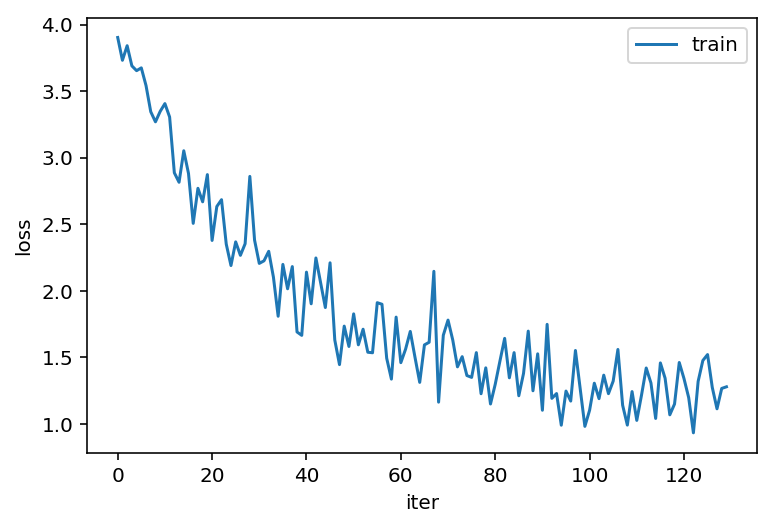

130
Epoch: 130, Iteration: 100, Loss: 1.3472979068756104
Epoch: 130, Iteration: 200, Loss: 1.1749391555786133
Epoch: 130, Iteration: 300, Loss: 1.6497797966003418
Epoch: 130, Iteration: 400, Loss: 1.3860797882080078
Epoch: 130, Iteration: 500, Loss: 1.3031597137451172
Epoch: 130, Iteration: 600, Loss: 1.1479216814041138
Epoch: 130, Iteration: 700, Loss: 1.6562210321426392
Epoch: 130, Iteration: 800, Loss: 1.5423390865325928


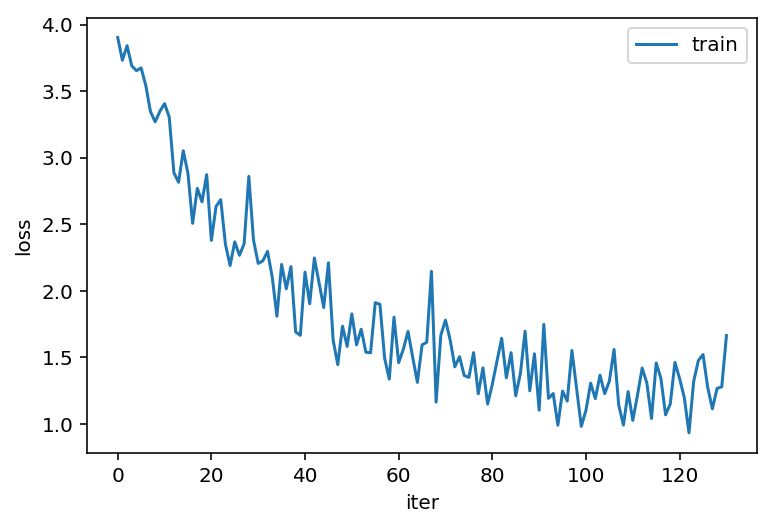

131
Epoch: 131, Iteration: 25, Loss: 1.4040151834487915
Epoch: 131, Iteration: 50, Loss: 1.210330605506897
Epoch: 131, Iteration: 75, Loss: 1.495273470878601
Epoch: 131, Iteration: 100, Loss: 1.7068125009536743
Epoch: 131, Iteration: 125, Loss: 1.1097033023834229
Epoch: 131, Iteration: 150, Loss: 0.8640769124031067
Epoch: 131, Iteration: 175, Loss: 1.3322198390960693
Epoch: 131, Iteration: 200, Loss: 0.9987941980361938
Epoch: 131, Iteration: 225, Loss: 1.1310328245162964
Epoch: 131, Iteration: 250, Loss: 0.9098320007324219
Epoch: 131, Iteration: 275, Loss: 1.4103479385375977
Epoch: 131, Iteration: 300, Loss: 1.5570893287658691
Epoch: 131, Iteration: 325, Loss: 1.046556830406189
Epoch: 131, Iteration: 350, Loss: 1.2876968383789062
Epoch: 131, Iteration: 375, Loss: 1.4026379585266113
Epoch: 131, Iteration: 400, Loss: 1.111214280128479
Epoch: 131, Iteration: 425, Loss: 0.8696393370628357
Epoch: 131, Iteration: 450, Loss: 1.0916367769241333
Epoch: 131, Iteration: 475, Loss: 1.3716208934783

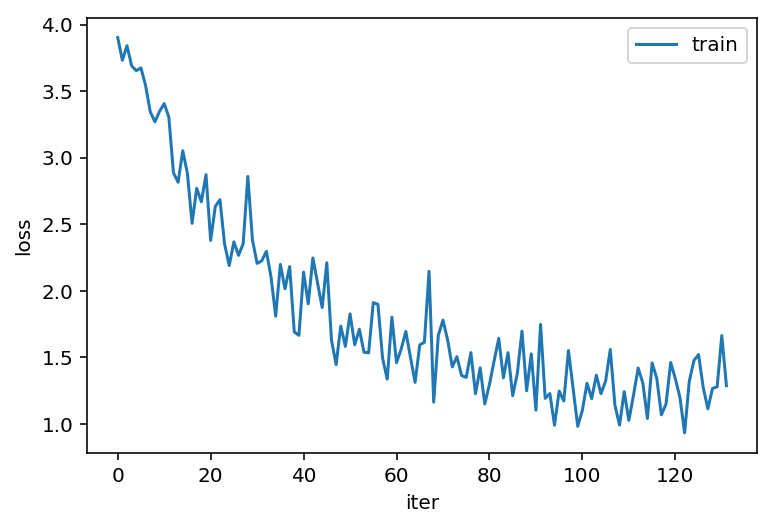

132
Epoch: 132, Iteration: 100, Loss: 1.2756980657577515
Epoch: 132, Iteration: 200, Loss: 1.2262179851531982
Epoch: 132, Iteration: 300, Loss: 0.8568555116653442
Epoch: 132, Iteration: 400, Loss: 1.5400344133377075
Epoch: 132, Iteration: 500, Loss: 1.306303858757019
Epoch: 132, Iteration: 600, Loss: 1.2615289688110352
Epoch: 132, Iteration: 700, Loss: 1.2504820823669434
Epoch: 132, Iteration: 800, Loss: 1.2664159536361694


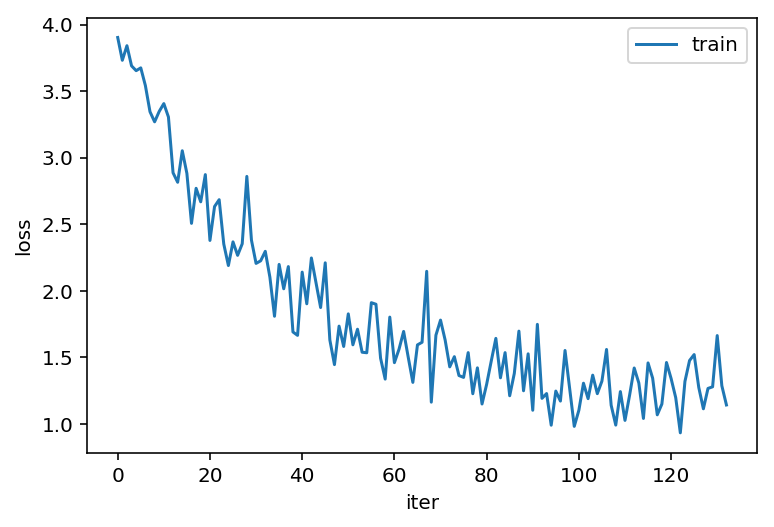

133
Epoch: 133, Iteration: 50, Loss: 1.0633957386016846
Epoch: 133, Iteration: 100, Loss: 1.2595953941345215
Epoch: 133, Iteration: 150, Loss: 1.239601731300354
Epoch: 133, Iteration: 200, Loss: 0.9173990488052368
Epoch: 133, Iteration: 250, Loss: 1.2447073459625244
Epoch: 133, Iteration: 300, Loss: 1.4124029874801636
Epoch: 133, Iteration: 350, Loss: 1.2031933069229126
Epoch: 133, Iteration: 400, Loss: 1.0832043886184692
Epoch: 133, Iteration: 450, Loss: 1.365074634552002
Epoch: 133, Iteration: 500, Loss: 1.215091586112976
Epoch: 133, Iteration: 550, Loss: 1.0499987602233887
Epoch: 133, Iteration: 600, Loss: 1.3753770589828491
Epoch: 133, Iteration: 650, Loss: 0.9747762680053711
Epoch: 133, Iteration: 700, Loss: 1.1968896389007568
Epoch: 133, Iteration: 750, Loss: 1.2450231313705444
Epoch: 133, Iteration: 800, Loss: 1.4460641145706177
Epoch: 133, Iteration: 850, Loss: 1.2615840435028076


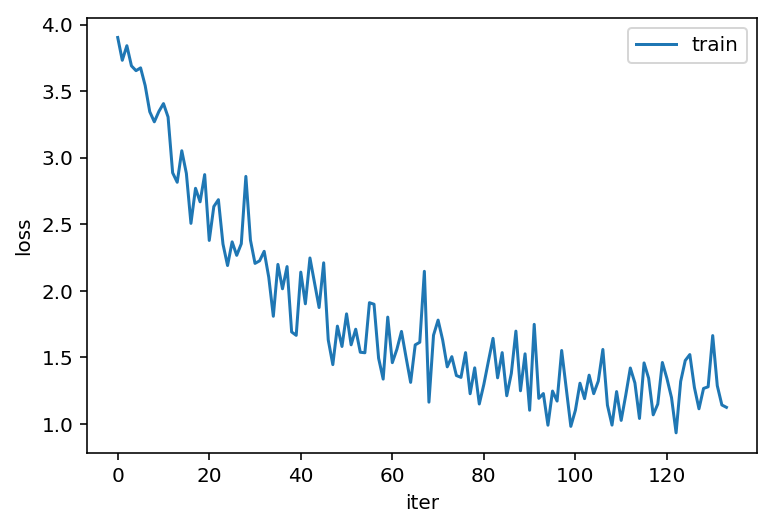

134
Epoch: 134, Iteration: 20, Loss: 0.9880589842796326
Epoch: 134, Iteration: 40, Loss: 1.1724213361740112
Epoch: 134, Iteration: 60, Loss: 1.184905767440796
Epoch: 134, Iteration: 80, Loss: 1.0076477527618408
Epoch: 134, Iteration: 100, Loss: 1.4212440252304077
Epoch: 134, Iteration: 120, Loss: 1.25938081741333
Epoch: 134, Iteration: 140, Loss: 1.0670254230499268
Epoch: 134, Iteration: 160, Loss: 1.366441249847412
Epoch: 134, Iteration: 180, Loss: 1.688905119895935
Epoch: 134, Iteration: 200, Loss: 1.2947217226028442
Epoch: 134, Iteration: 220, Loss: 1.2873692512512207
Epoch: 134, Iteration: 240, Loss: 1.030148983001709
Epoch: 134, Iteration: 260, Loss: 1.0651259422302246
Epoch: 134, Iteration: 280, Loss: 1.2212072610855103
Epoch: 134, Iteration: 300, Loss: 1.2501797676086426
Epoch: 134, Iteration: 320, Loss: 1.4950809478759766
Epoch: 134, Iteration: 340, Loss: 1.3206148147583008
Epoch: 134, Iteration: 360, Loss: 1.6595847606658936
Epoch: 134, Iteration: 380, Loss: 0.9324004054069519

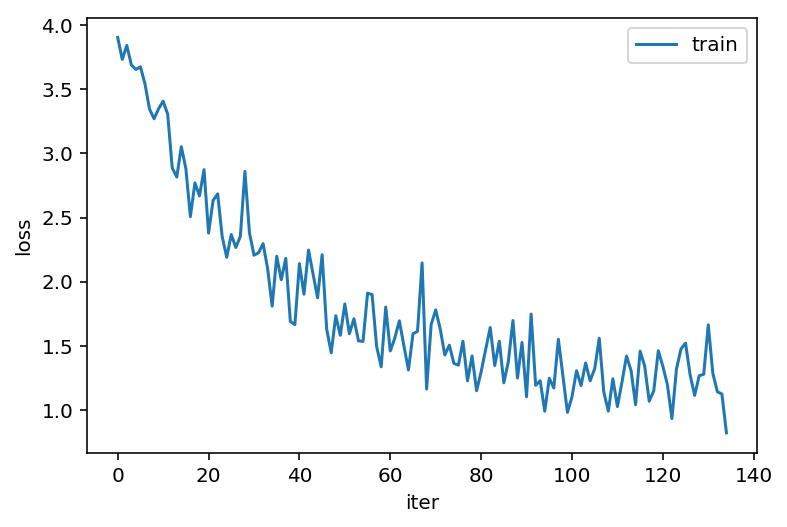

135
Epoch: 135, Iteration: 25, Loss: 1.2271389961242676
Epoch: 135, Iteration: 50, Loss: 1.270320177078247
Epoch: 135, Iteration: 75, Loss: 1.499298334121704
Epoch: 135, Iteration: 100, Loss: 1.13814377784729
Epoch: 135, Iteration: 125, Loss: 1.2249178886413574
Epoch: 135, Iteration: 150, Loss: 1.0931955575942993
Epoch: 135, Iteration: 175, Loss: 1.167843222618103
Epoch: 135, Iteration: 200, Loss: 1.2259387969970703
Epoch: 135, Iteration: 225, Loss: 1.1004328727722168
Epoch: 135, Iteration: 250, Loss: 1.3731045722961426
Epoch: 135, Iteration: 275, Loss: 1.2703183889389038
Epoch: 135, Iteration: 300, Loss: 1.505370020866394
Epoch: 135, Iteration: 325, Loss: 0.9452885389328003
Epoch: 135, Iteration: 350, Loss: 1.1763803958892822
Epoch: 135, Iteration: 375, Loss: 1.1258196830749512
Epoch: 135, Iteration: 400, Loss: 1.3860794305801392
Epoch: 135, Iteration: 425, Loss: 0.9610419869422913
Epoch: 135, Iteration: 450, Loss: 1.4371076822280884
Epoch: 135, Iteration: 475, Loss: 0.911672711372375

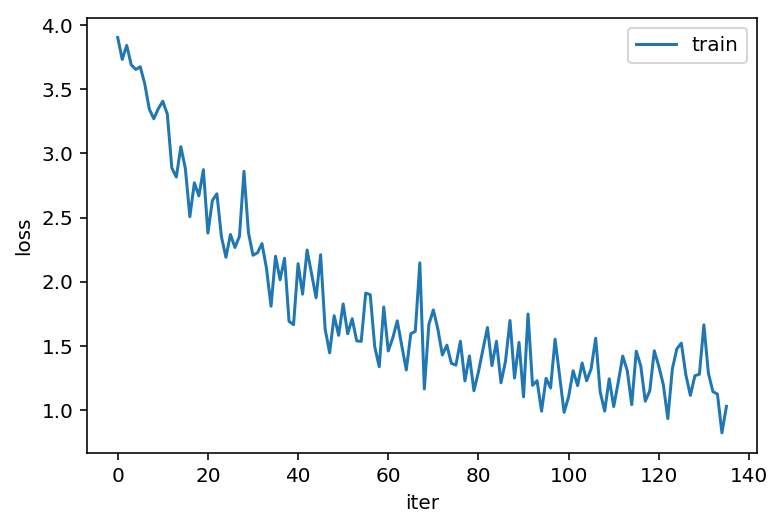

136
Epoch: 136, Iteration: 100, Loss: 0.9590317010879517
Epoch: 136, Iteration: 200, Loss: 1.5487254858016968
Epoch: 136, Iteration: 300, Loss: 0.9901807308197021
Epoch: 136, Iteration: 400, Loss: 1.0651205778121948
Epoch: 136, Iteration: 500, Loss: 1.383063793182373
Epoch: 136, Iteration: 600, Loss: 1.0140581130981445
Epoch: 136, Iteration: 700, Loss: 1.566917061805725
Epoch: 136, Iteration: 800, Loss: 1.55928373336792


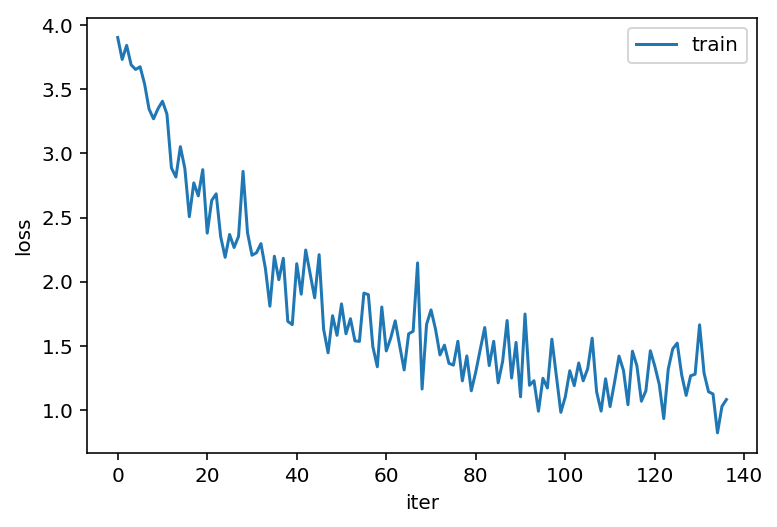

137
Epoch: 137, Iteration: 50, Loss: 0.9965774416923523
Epoch: 137, Iteration: 100, Loss: 0.9722928404808044
Epoch: 137, Iteration: 150, Loss: 0.8357446193695068
Epoch: 137, Iteration: 200, Loss: 0.9764631986618042
Epoch: 137, Iteration: 250, Loss: 1.5084812641143799
Epoch: 137, Iteration: 300, Loss: 0.8243206739425659
Epoch: 137, Iteration: 350, Loss: 0.9429616928100586
Epoch: 137, Iteration: 400, Loss: 1.0137957334518433
Epoch: 137, Iteration: 450, Loss: 1.2094312906265259
Epoch: 137, Iteration: 500, Loss: 1.2122668027877808
Epoch: 137, Iteration: 550, Loss: 1.2167303562164307
Epoch: 137, Iteration: 600, Loss: 1.3927001953125
Epoch: 137, Iteration: 650, Loss: 1.2983412742614746
Epoch: 137, Iteration: 700, Loss: 1.4896974563598633
Epoch: 137, Iteration: 750, Loss: 0.938092827796936
Epoch: 137, Iteration: 800, Loss: 1.1028810739517212
Epoch: 137, Iteration: 850, Loss: 1.323566198348999


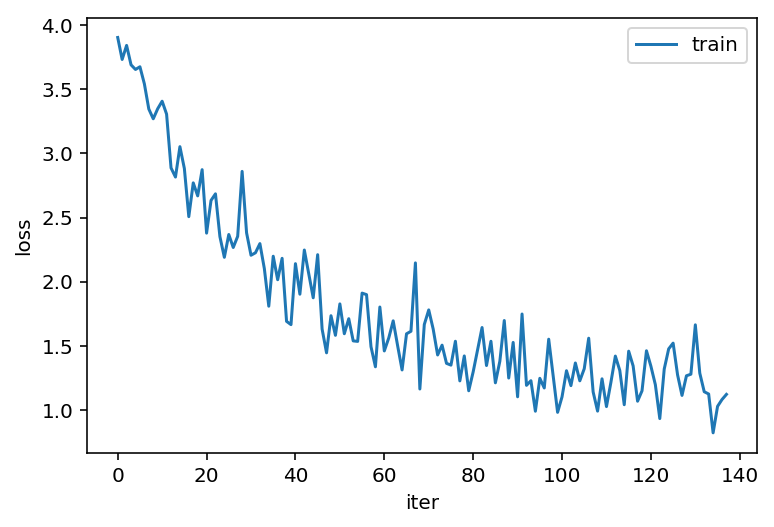

138
Epoch: 138, Iteration: 100, Loss: 1.5516060590744019
Epoch: 138, Iteration: 200, Loss: 1.1520822048187256
Epoch: 138, Iteration: 300, Loss: 1.3460057973861694
Epoch: 138, Iteration: 400, Loss: 1.2721296548843384
Epoch: 138, Iteration: 500, Loss: 1.4110020399093628
Epoch: 138, Iteration: 600, Loss: 1.3640490770339966
Epoch: 138, Iteration: 700, Loss: 1.282343864440918
Epoch: 138, Iteration: 800, Loss: 1.5372765064239502


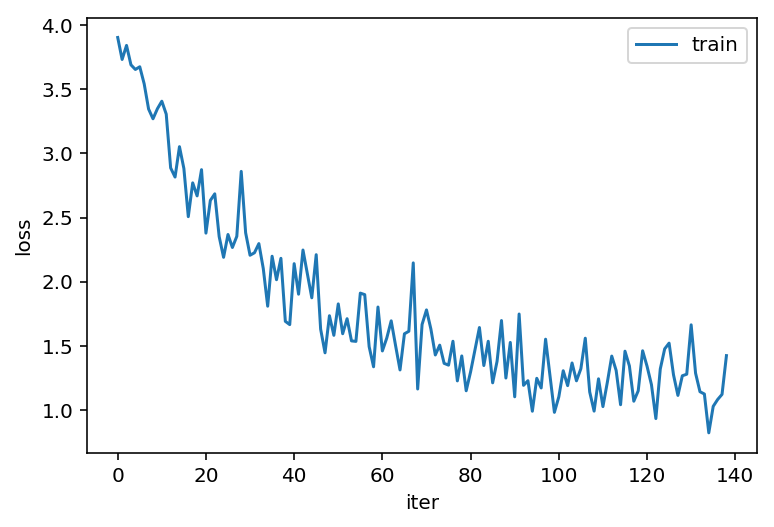

139
Epoch: 139, Iteration: 5, Loss: 0.9592961072921753
Epoch: 139, Iteration: 10, Loss: 0.8813145160675049
Epoch: 139, Iteration: 15, Loss: 1.326061725616455
Epoch: 139, Iteration: 20, Loss: 1.0214565992355347
Epoch: 139, Iteration: 25, Loss: 1.3072404861450195
Epoch: 139, Iteration: 30, Loss: 1.0664855241775513
Epoch: 139, Iteration: 35, Loss: 1.181339144706726
Epoch: 139, Iteration: 40, Loss: 1.1425323486328125
Epoch: 139, Iteration: 45, Loss: 1.2338229417800903
Epoch: 139, Iteration: 50, Loss: 1.16547691822052
Epoch: 139, Iteration: 55, Loss: 1.154914379119873
Epoch: 139, Iteration: 60, Loss: 1.2187055349349976
Epoch: 139, Iteration: 65, Loss: 0.9356746673583984
Epoch: 139, Iteration: 70, Loss: 1.3001959323883057
Epoch: 139, Iteration: 75, Loss: 1.0864571332931519
Epoch: 139, Iteration: 80, Loss: 1.1630799770355225
Epoch: 139, Iteration: 85, Loss: 1.1763564348220825
Epoch: 139, Iteration: 90, Loss: 1.207370400428772
Epoch: 139, Iteration: 95, Loss: 1.3884834051132202
Epoch: 139, Ite

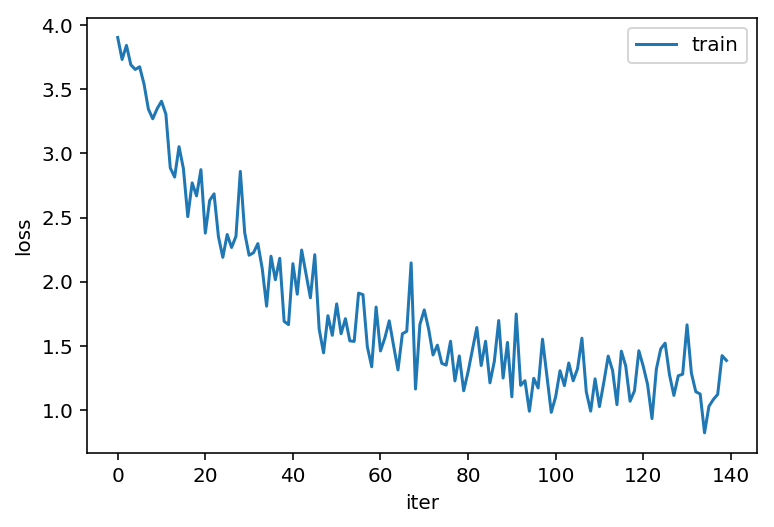

140
Epoch: 140, Iteration: 100, Loss: 1.311856746673584
Epoch: 140, Iteration: 200, Loss: 1.0160869359970093
Epoch: 140, Iteration: 300, Loss: 1.139433741569519
Epoch: 140, Iteration: 400, Loss: 1.2228281497955322
Epoch: 140, Iteration: 500, Loss: 1.5978749990463257
Epoch: 140, Iteration: 600, Loss: 1.4205597639083862
Epoch: 140, Iteration: 700, Loss: 1.4486634731292725
Epoch: 140, Iteration: 800, Loss: 1.1663711071014404


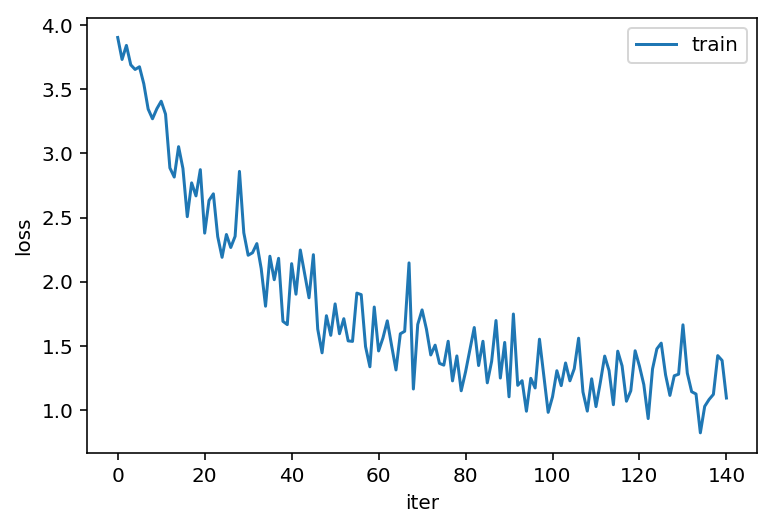

141
Epoch: 141, Iteration: 50, Loss: 1.0965397357940674
Epoch: 141, Iteration: 100, Loss: 1.3723492622375488
Epoch: 141, Iteration: 150, Loss: 1.4867396354675293
Epoch: 141, Iteration: 200, Loss: 0.9878134727478027
Epoch: 141, Iteration: 250, Loss: 1.4194056987762451
Epoch: 141, Iteration: 300, Loss: 0.9445856809616089
Epoch: 141, Iteration: 350, Loss: 1.2007217407226562
Epoch: 141, Iteration: 400, Loss: 1.3546502590179443
Epoch: 141, Iteration: 450, Loss: 0.7920437455177307
Epoch: 141, Iteration: 500, Loss: 1.2238026857376099
Epoch: 141, Iteration: 550, Loss: 1.0666078329086304
Epoch: 141, Iteration: 600, Loss: 1.1937475204467773
Epoch: 141, Iteration: 650, Loss: 1.236728310585022
Epoch: 141, Iteration: 700, Loss: 1.3999013900756836
Epoch: 141, Iteration: 750, Loss: 1.007419228553772
Epoch: 141, Iteration: 800, Loss: 1.2669414281845093
Epoch: 141, Iteration: 850, Loss: 1.3089009523391724


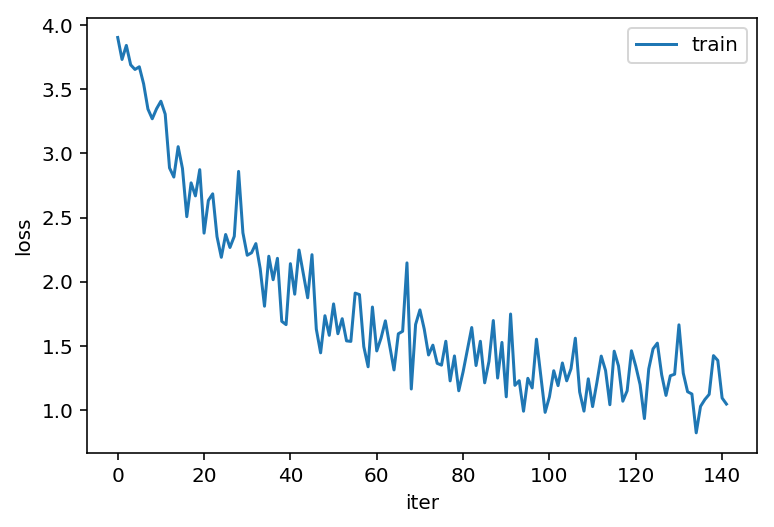

142
Epoch: 142, Iteration: 100, Loss: 1.6458675861358643
Epoch: 142, Iteration: 200, Loss: 1.276318907737732
Epoch: 142, Iteration: 300, Loss: 1.0725023746490479
Epoch: 142, Iteration: 400, Loss: 1.540557861328125
Epoch: 142, Iteration: 500, Loss: 1.2764006853103638
Epoch: 142, Iteration: 600, Loss: 1.4918580055236816
Epoch: 142, Iteration: 700, Loss: 0.8592811822891235
Epoch: 142, Iteration: 800, Loss: 1.2659375667572021


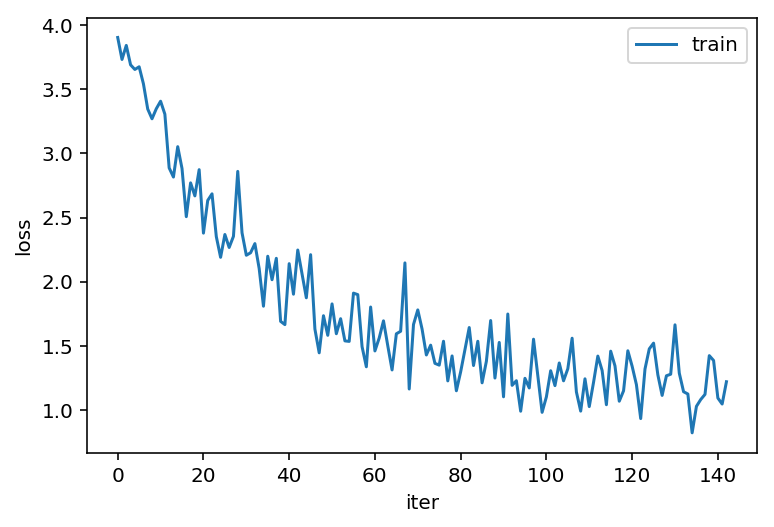

143
Epoch: 143, Iteration: 25, Loss: 1.0621927976608276
Epoch: 143, Iteration: 50, Loss: 1.033409833908081
Epoch: 143, Iteration: 75, Loss: 1.498748779296875
Epoch: 143, Iteration: 100, Loss: 1.2693883180618286
Epoch: 143, Iteration: 125, Loss: 1.1457805633544922
Epoch: 143, Iteration: 150, Loss: 0.8155311346054077
Epoch: 143, Iteration: 175, Loss: 1.1437835693359375
Epoch: 143, Iteration: 200, Loss: 1.1167436838150024
Epoch: 143, Iteration: 225, Loss: 1.2166162729263306
Epoch: 143, Iteration: 250, Loss: 1.1102619171142578
Epoch: 143, Iteration: 275, Loss: 1.2600650787353516
Epoch: 143, Iteration: 300, Loss: 0.9573296904563904
Epoch: 143, Iteration: 325, Loss: 1.3708596229553223
Epoch: 143, Iteration: 350, Loss: 1.110337734222412
Epoch: 143, Iteration: 375, Loss: 1.1549274921417236
Epoch: 143, Iteration: 400, Loss: 1.359876036643982
Epoch: 143, Iteration: 425, Loss: 1.01703941822052
Epoch: 143, Iteration: 450, Loss: 1.1047207117080688
Epoch: 143, Iteration: 475, Loss: 1.223978996276855

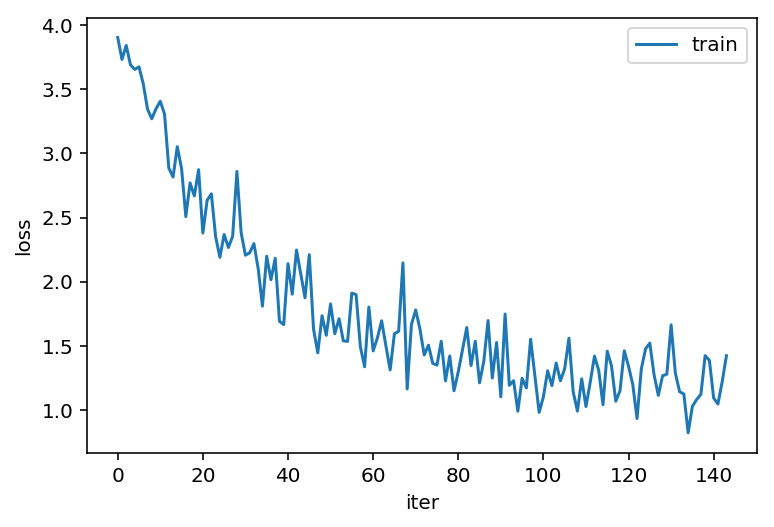

144
Epoch: 144, Iteration: 20, Loss: 1.3290889263153076
Epoch: 144, Iteration: 40, Loss: 0.9247184991836548
Epoch: 144, Iteration: 60, Loss: 1.245314121246338
Epoch: 144, Iteration: 80, Loss: 1.0487831830978394
Epoch: 144, Iteration: 100, Loss: 0.9625658988952637
Epoch: 144, Iteration: 120, Loss: 0.9179605841636658
Epoch: 144, Iteration: 140, Loss: 1.0538780689239502
Epoch: 144, Iteration: 160, Loss: 1.2171194553375244
Epoch: 144, Iteration: 180, Loss: 1.2185688018798828
Epoch: 144, Iteration: 200, Loss: 0.9782253503799438
Epoch: 144, Iteration: 220, Loss: 0.9580024480819702
Epoch: 144, Iteration: 240, Loss: 1.4525452852249146
Epoch: 144, Iteration: 260, Loss: 1.2034556865692139
Epoch: 144, Iteration: 280, Loss: 1.360024094581604
Epoch: 144, Iteration: 300, Loss: 1.185543179512024
Epoch: 144, Iteration: 320, Loss: 1.5205159187316895
Epoch: 144, Iteration: 340, Loss: 1.2398372888565063
Epoch: 144, Iteration: 360, Loss: 1.3872524499893188
Epoch: 144, Iteration: 380, Loss: 1.3480433225631

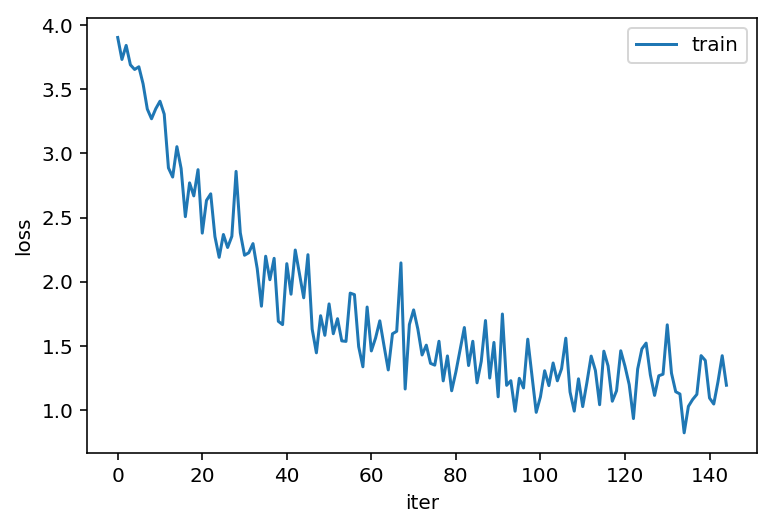

145
Epoch: 145, Iteration: 50, Loss: 1.4110561609268188
Epoch: 145, Iteration: 100, Loss: 1.0040409564971924
Epoch: 145, Iteration: 150, Loss: 0.9931092858314514
Epoch: 145, Iteration: 200, Loss: 1.3654921054840088
Epoch: 145, Iteration: 250, Loss: 1.1042890548706055
Epoch: 145, Iteration: 300, Loss: 1.3434733152389526
Epoch: 145, Iteration: 350, Loss: 1.3039782047271729
Epoch: 145, Iteration: 400, Loss: 0.9272948503494263
Epoch: 145, Iteration: 450, Loss: 1.0028162002563477
Epoch: 145, Iteration: 500, Loss: 1.5843952894210815
Epoch: 145, Iteration: 550, Loss: 1.1181269884109497
Epoch: 145, Iteration: 600, Loss: 1.0603643655776978
Epoch: 145, Iteration: 650, Loss: 1.2639211416244507
Epoch: 145, Iteration: 700, Loss: 1.369040608406067
Epoch: 145, Iteration: 750, Loss: 1.2248879671096802
Epoch: 145, Iteration: 800, Loss: 1.3982726335525513
Epoch: 145, Iteration: 850, Loss: 1.1629358530044556


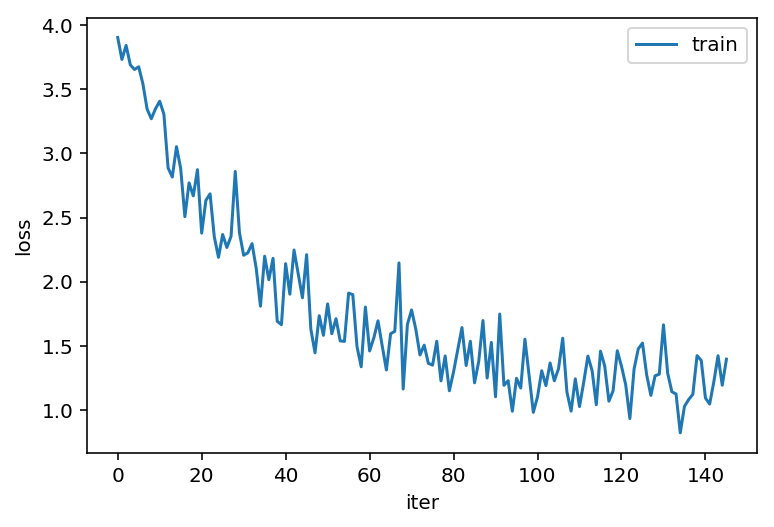

146
Epoch: 146, Iteration: 100, Loss: 1.3152353763580322
Epoch: 146, Iteration: 200, Loss: 1.1667745113372803
Epoch: 146, Iteration: 300, Loss: 1.049332857131958
Epoch: 146, Iteration: 400, Loss: 1.3777618408203125
Epoch: 146, Iteration: 500, Loss: 1.5064302682876587
Epoch: 146, Iteration: 600, Loss: 1.2405565977096558
Epoch: 146, Iteration: 700, Loss: 1.0239397287368774
Epoch: 146, Iteration: 800, Loss: 1.6690329313278198


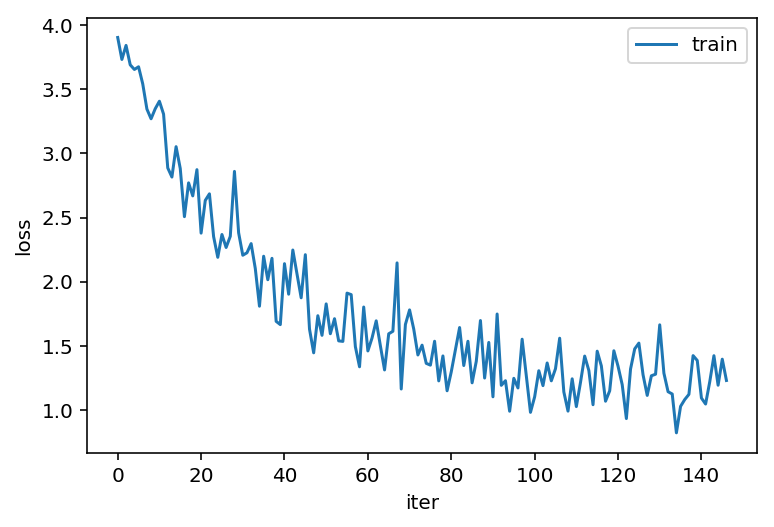

147
Epoch: 147, Iteration: 25, Loss: 1.076280951499939
Epoch: 147, Iteration: 50, Loss: 1.2351727485656738
Epoch: 147, Iteration: 75, Loss: 1.0275574922561646
Epoch: 147, Iteration: 100, Loss: 1.1012896299362183
Epoch: 147, Iteration: 125, Loss: 1.0640573501586914
Epoch: 147, Iteration: 150, Loss: 1.1368207931518555
Epoch: 147, Iteration: 175, Loss: 0.9208727478981018
Epoch: 147, Iteration: 200, Loss: 1.1207705736160278
Epoch: 147, Iteration: 225, Loss: 1.12666916847229
Epoch: 147, Iteration: 250, Loss: 1.0349103212356567
Epoch: 147, Iteration: 275, Loss: 1.1044584512710571
Epoch: 147, Iteration: 300, Loss: 1.072155475616455
Epoch: 147, Iteration: 325, Loss: 1.351570725440979
Epoch: 147, Iteration: 350, Loss: 1.0569908618927002
Epoch: 147, Iteration: 375, Loss: 1.2495805025100708
Epoch: 147, Iteration: 400, Loss: 1.2788840532302856
Epoch: 147, Iteration: 425, Loss: 1.0479063987731934
Epoch: 147, Iteration: 450, Loss: 1.3453724384307861
Epoch: 147, Iteration: 475, Loss: 1.00677955150604

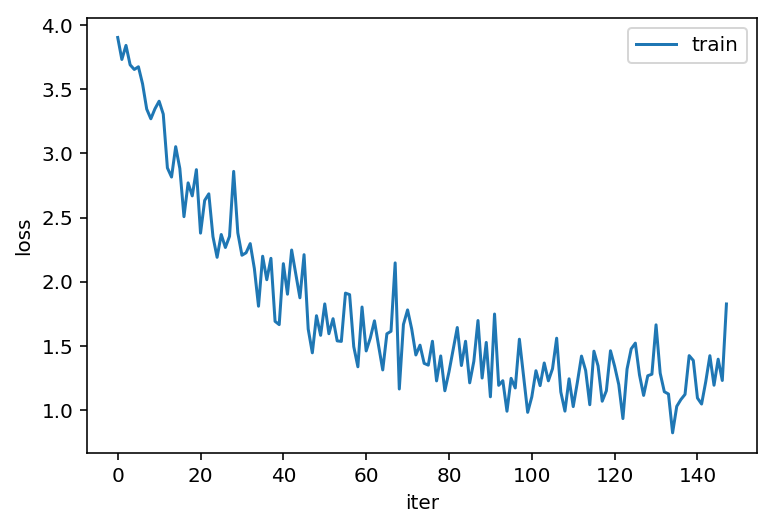

148
Epoch: 148, Iteration: 100, Loss: 1.322801113128662
Epoch: 148, Iteration: 200, Loss: 1.2440303564071655
Epoch: 148, Iteration: 300, Loss: 1.1738609075546265
Epoch: 148, Iteration: 400, Loss: 1.1704304218292236
Epoch: 148, Iteration: 500, Loss: 1.4160090684890747
Epoch: 148, Iteration: 600, Loss: 1.0440465211868286
Epoch: 148, Iteration: 700, Loss: 1.013712763786316
Epoch: 148, Iteration: 800, Loss: 1.0823991298675537


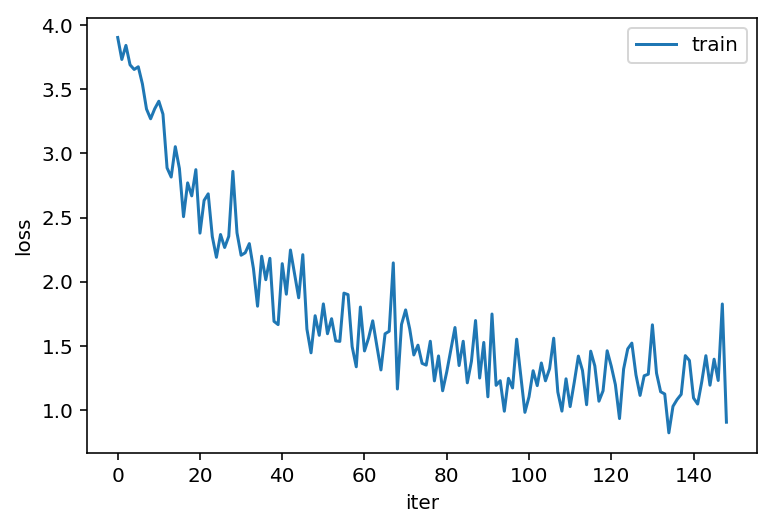

149
Epoch: 149, Iteration: 2, Loss: 1.0035432577133179
Epoch: 149, Iteration: 4, Loss: 1.1353259086608887
Epoch: 149, Iteration: 6, Loss: 1.2467178106307983
Epoch: 149, Iteration: 8, Loss: 1.0763895511627197
Epoch: 149, Iteration: 10, Loss: 1.3622623682022095
Epoch: 149, Iteration: 12, Loss: 1.1608085632324219
Epoch: 149, Iteration: 14, Loss: 1.2523956298828125
Epoch: 149, Iteration: 16, Loss: 1.2314589023590088
Epoch: 149, Iteration: 18, Loss: 0.9690663814544678
Epoch: 149, Iteration: 20, Loss: 1.2807420492172241
Epoch: 149, Iteration: 22, Loss: 0.9024946689605713
Epoch: 149, Iteration: 24, Loss: 1.168662190437317
Epoch: 149, Iteration: 26, Loss: 1.0946085453033447
Epoch: 149, Iteration: 28, Loss: 0.9742224812507629
Epoch: 149, Iteration: 30, Loss: 1.0726101398468018
Epoch: 149, Iteration: 32, Loss: 1.095342993736267
Epoch: 149, Iteration: 34, Loss: 1.2230885028839111
Epoch: 149, Iteration: 36, Loss: 1.0376977920532227
Epoch: 149, Iteration: 38, Loss: 1.223876714706421
Epoch: 149, Ite

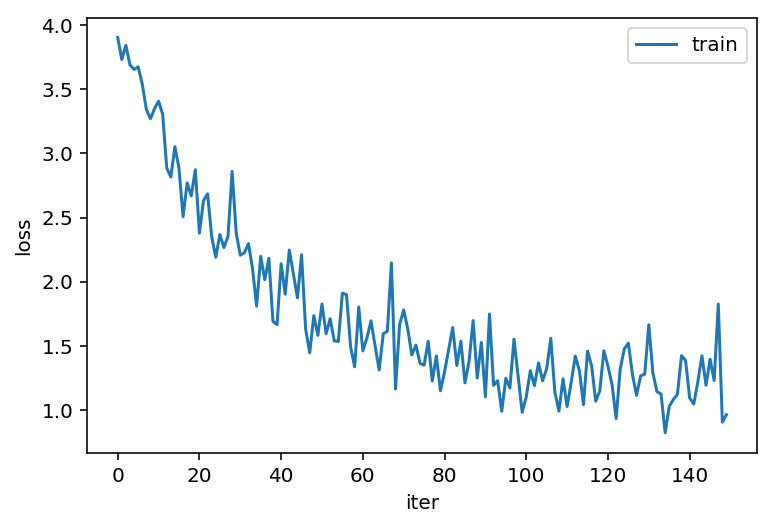

150
Epoch: 150, Iteration: 100, Loss: 1.4688920974731445
Epoch: 150, Iteration: 200, Loss: 1.06882643699646
Epoch: 150, Iteration: 300, Loss: 1.2672735452651978
Epoch: 150, Iteration: 400, Loss: 0.7825578451156616
Epoch: 150, Iteration: 500, Loss: 1.2723413705825806
Epoch: 150, Iteration: 600, Loss: 1.0624840259552002
Epoch: 150, Iteration: 700, Loss: 1.1434346437454224
Epoch: 150, Iteration: 800, Loss: 1.1680318117141724


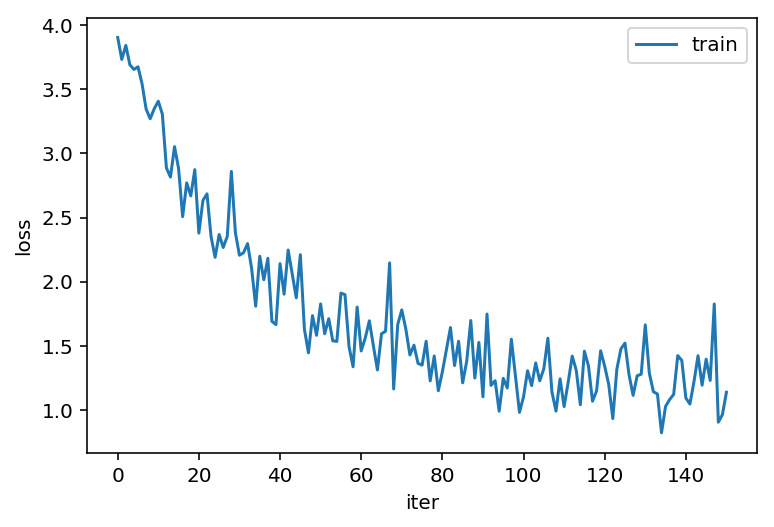

151
Epoch: 151, Iteration: 25, Loss: 1.253796100616455
Epoch: 151, Iteration: 50, Loss: 1.8230451345443726
Epoch: 151, Iteration: 75, Loss: 1.3155466318130493
Epoch: 151, Iteration: 100, Loss: 1.3440359830856323
Epoch: 151, Iteration: 125, Loss: 1.2186362743377686
Epoch: 151, Iteration: 150, Loss: 1.002747654914856
Epoch: 151, Iteration: 175, Loss: 1.2039334774017334
Epoch: 151, Iteration: 200, Loss: 1.1132779121398926
Epoch: 151, Iteration: 225, Loss: 1.3595025539398193
Epoch: 151, Iteration: 250, Loss: 1.1339125633239746
Epoch: 151, Iteration: 275, Loss: 1.2056916952133179
Epoch: 151, Iteration: 300, Loss: 0.8451223373413086
Epoch: 151, Iteration: 325, Loss: 0.9473855495452881
Epoch: 151, Iteration: 350, Loss: 1.0898051261901855
Epoch: 151, Iteration: 375, Loss: 1.1866755485534668
Epoch: 151, Iteration: 400, Loss: 1.0825426578521729
Epoch: 151, Iteration: 425, Loss: 1.054385781288147
Epoch: 151, Iteration: 450, Loss: 1.3208612203598022
Epoch: 151, Iteration: 475, Loss: 1.345146298408

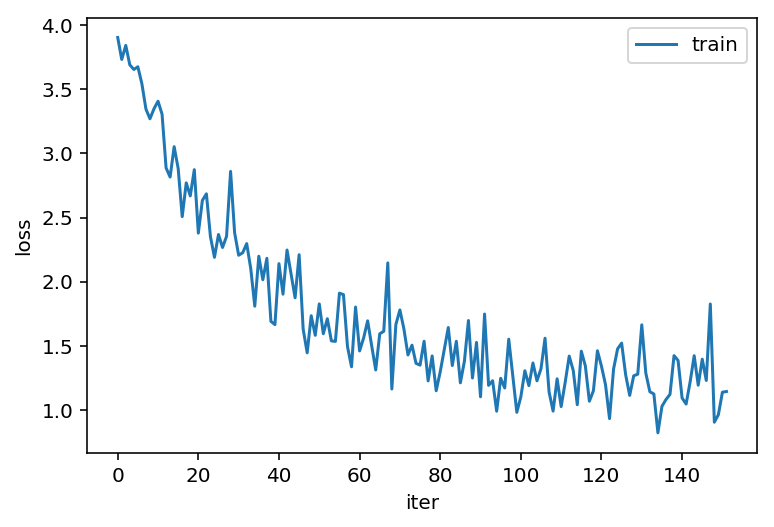

152
Epoch: 152, Iteration: 100, Loss: 1.118775725364685
Epoch: 152, Iteration: 200, Loss: 1.1146018505096436
Epoch: 152, Iteration: 300, Loss: 1.1448774337768555
Epoch: 152, Iteration: 400, Loss: 0.9892822504043579
Epoch: 152, Iteration: 500, Loss: 1.2493385076522827
Epoch: 152, Iteration: 600, Loss: 1.2116374969482422
Epoch: 152, Iteration: 700, Loss: 1.1153169870376587
Epoch: 152, Iteration: 800, Loss: 1.3675076961517334


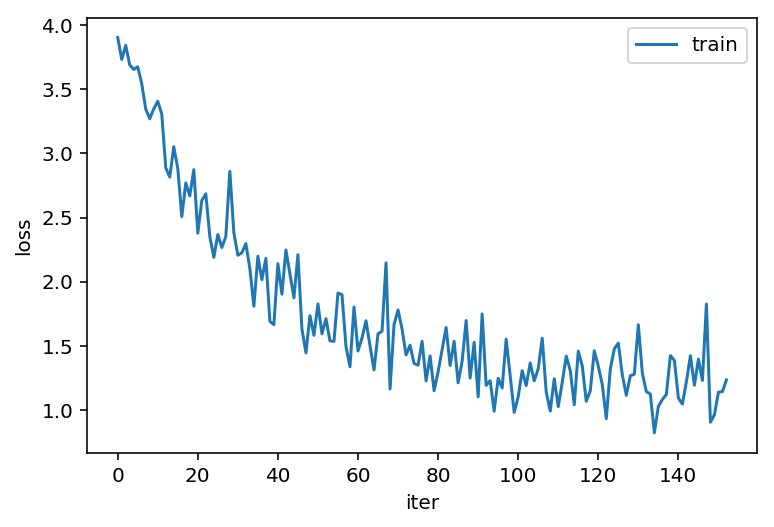

153
Epoch: 153, Iteration: 50, Loss: 1.2585991621017456
Epoch: 153, Iteration: 100, Loss: 1.0402343273162842
Epoch: 153, Iteration: 150, Loss: 1.306840181350708
Epoch: 153, Iteration: 200, Loss: 1.0512065887451172
Epoch: 153, Iteration: 250, Loss: 0.930254340171814
Epoch: 153, Iteration: 300, Loss: 1.2146239280700684
Epoch: 153, Iteration: 350, Loss: 1.3347887992858887
Epoch: 153, Iteration: 400, Loss: 1.1061756610870361
Epoch: 153, Iteration: 450, Loss: 1.0575724840164185
Epoch: 153, Iteration: 500, Loss: 1.1156774759292603
Epoch: 153, Iteration: 550, Loss: 1.3883795738220215
Epoch: 153, Iteration: 600, Loss: 1.3281949758529663
Epoch: 153, Iteration: 650, Loss: 1.2165095806121826
Epoch: 153, Iteration: 700, Loss: 1.0117366313934326
Epoch: 153, Iteration: 750, Loss: 0.8960156440734863
Epoch: 153, Iteration: 800, Loss: 0.876605212688446
Epoch: 153, Iteration: 850, Loss: 1.371401071548462


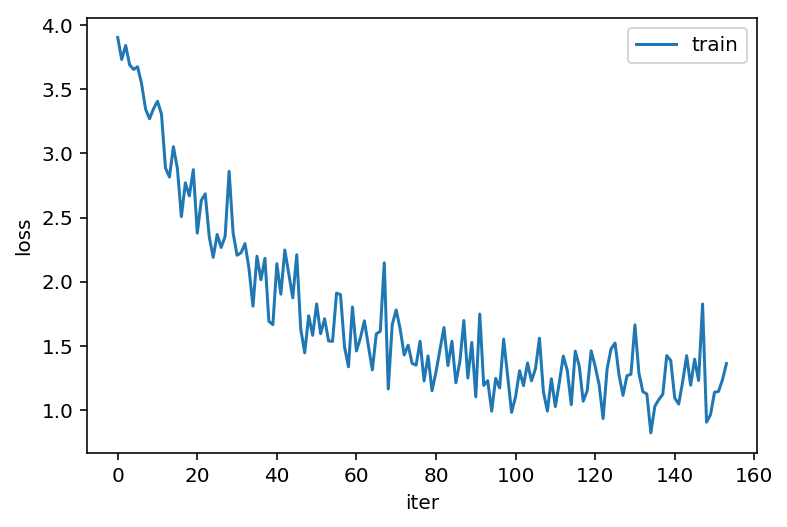

154
Epoch: 154, Iteration: 20, Loss: 1.124036192893982
Epoch: 154, Iteration: 40, Loss: 1.1015640497207642
Epoch: 154, Iteration: 60, Loss: 1.0919164419174194
Epoch: 154, Iteration: 80, Loss: 0.833301305770874
Epoch: 154, Iteration: 100, Loss: 1.1588678359985352
Epoch: 154, Iteration: 120, Loss: 1.17742121219635
Epoch: 154, Iteration: 140, Loss: 1.0539236068725586
Epoch: 154, Iteration: 160, Loss: 1.0736860036849976
Epoch: 154, Iteration: 180, Loss: 1.47956120967865
Epoch: 154, Iteration: 200, Loss: 1.0856499671936035
Epoch: 154, Iteration: 220, Loss: 0.9918022751808167
Epoch: 154, Iteration: 240, Loss: 1.1550137996673584
Epoch: 154, Iteration: 260, Loss: 1.5169198513031006
Epoch: 154, Iteration: 280, Loss: 1.0925134420394897
Epoch: 154, Iteration: 300, Loss: 1.2831165790557861
Epoch: 154, Iteration: 320, Loss: 1.0982604026794434
Epoch: 154, Iteration: 340, Loss: 0.9647430181503296
Epoch: 154, Iteration: 360, Loss: 1.1182736158370972
Epoch: 154, Iteration: 380, Loss: 1.0976601839065552

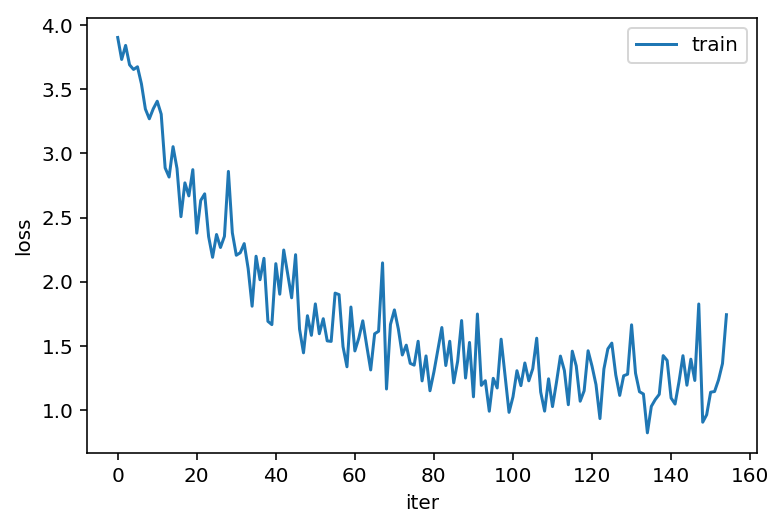

155
Epoch: 155, Iteration: 25, Loss: 1.043262004852295
Epoch: 155, Iteration: 50, Loss: 0.9613125920295715
Epoch: 155, Iteration: 75, Loss: 0.9881319403648376
Epoch: 155, Iteration: 100, Loss: 1.180481195449829
Epoch: 155, Iteration: 125, Loss: 0.9252614974975586
Epoch: 155, Iteration: 150, Loss: 1.392905592918396
Epoch: 155, Iteration: 175, Loss: 1.2860108613967896
Epoch: 155, Iteration: 200, Loss: 1.1657781600952148
Epoch: 155, Iteration: 225, Loss: 1.4403424263000488
Epoch: 155, Iteration: 250, Loss: 1.0310614109039307
Epoch: 155, Iteration: 275, Loss: 1.3413996696472168
Epoch: 155, Iteration: 300, Loss: 1.314083456993103
Epoch: 155, Iteration: 325, Loss: 1.3943061828613281
Epoch: 155, Iteration: 350, Loss: 1.0640140771865845
Epoch: 155, Iteration: 375, Loss: 1.2187278270721436
Epoch: 155, Iteration: 400, Loss: 1.1423643827438354
Epoch: 155, Iteration: 425, Loss: 1.0037692785263062
Epoch: 155, Iteration: 450, Loss: 1.0898810625076294
Epoch: 155, Iteration: 475, Loss: 1.1525139808654

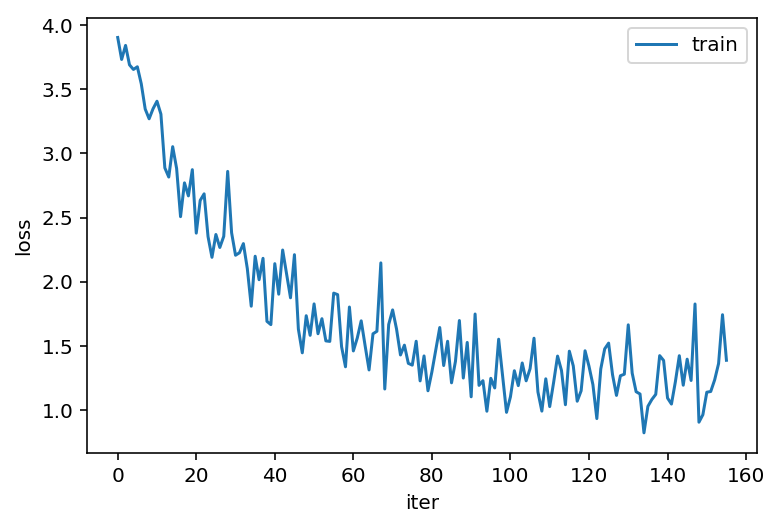

156
Epoch: 156, Iteration: 100, Loss: 1.0093681812286377
Epoch: 156, Iteration: 200, Loss: 0.95759516954422
Epoch: 156, Iteration: 300, Loss: 0.9166092872619629
Epoch: 156, Iteration: 400, Loss: 1.1100586652755737
Epoch: 156, Iteration: 500, Loss: 1.161789894104004
Epoch: 156, Iteration: 600, Loss: 1.0403391122817993
Epoch: 156, Iteration: 700, Loss: 1.2130495309829712
Epoch: 156, Iteration: 800, Loss: 1.0891752243041992


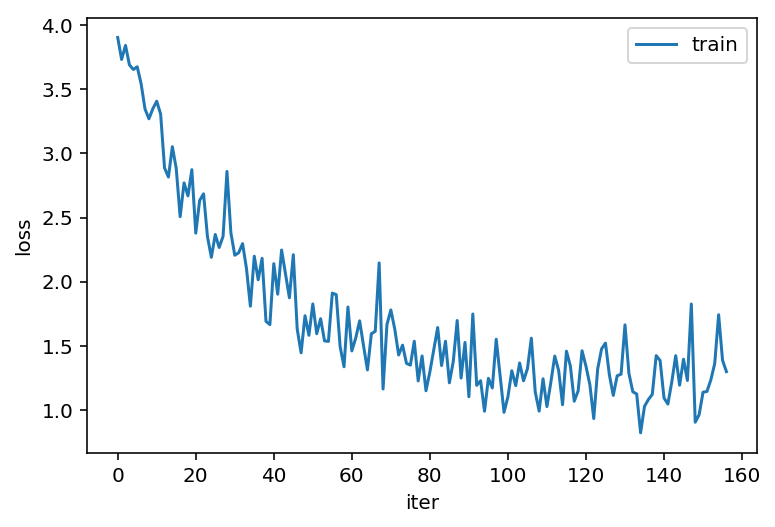

157
Epoch: 157, Iteration: 50, Loss: 1.2158639430999756
Epoch: 157, Iteration: 100, Loss: 1.0015629529953003
Epoch: 157, Iteration: 150, Loss: 1.1723109483718872
Epoch: 157, Iteration: 200, Loss: 1.2785422801971436
Epoch: 157, Iteration: 250, Loss: 1.1485238075256348
Epoch: 157, Iteration: 300, Loss: 1.238969326019287
Epoch: 157, Iteration: 350, Loss: 1.015297293663025
Epoch: 157, Iteration: 400, Loss: 1.3107023239135742
Epoch: 157, Iteration: 450, Loss: 1.2600816488265991
Epoch: 157, Iteration: 500, Loss: 1.03452730178833
Epoch: 157, Iteration: 550, Loss: 1.1692293882369995
Epoch: 157, Iteration: 600, Loss: 1.04814875125885
Epoch: 157, Iteration: 650, Loss: 1.196933627128601
Epoch: 157, Iteration: 700, Loss: 1.242905855178833
Epoch: 157, Iteration: 750, Loss: 1.0346440076828003
Epoch: 157, Iteration: 800, Loss: 1.001408576965332
Epoch: 157, Iteration: 850, Loss: 1.0183773040771484


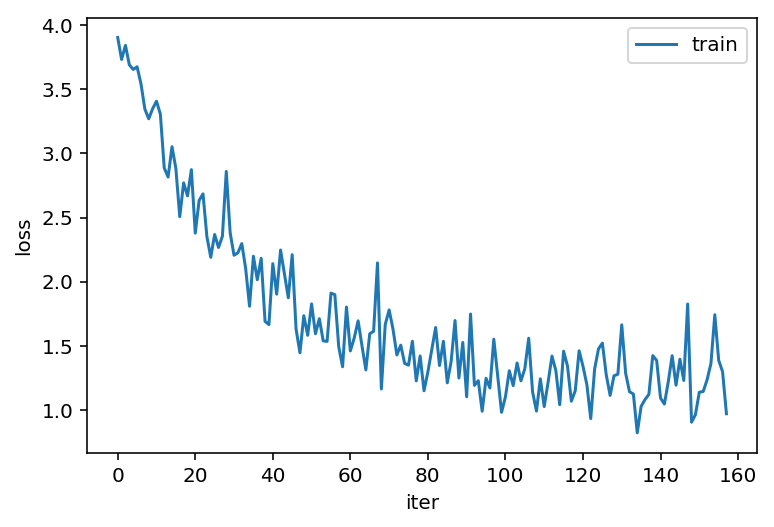

158
Epoch: 158, Iteration: 100, Loss: 1.150736689567566
Epoch: 158, Iteration: 200, Loss: 1.3363603353500366
Epoch: 158, Iteration: 300, Loss: 0.8998931646347046
Epoch: 158, Iteration: 400, Loss: 1.003097414970398
Epoch: 158, Iteration: 500, Loss: 1.278350591659546
Epoch: 158, Iteration: 600, Loss: 1.357199788093567
Epoch: 158, Iteration: 700, Loss: 1.382430076599121
Epoch: 158, Iteration: 800, Loss: 1.1237738132476807


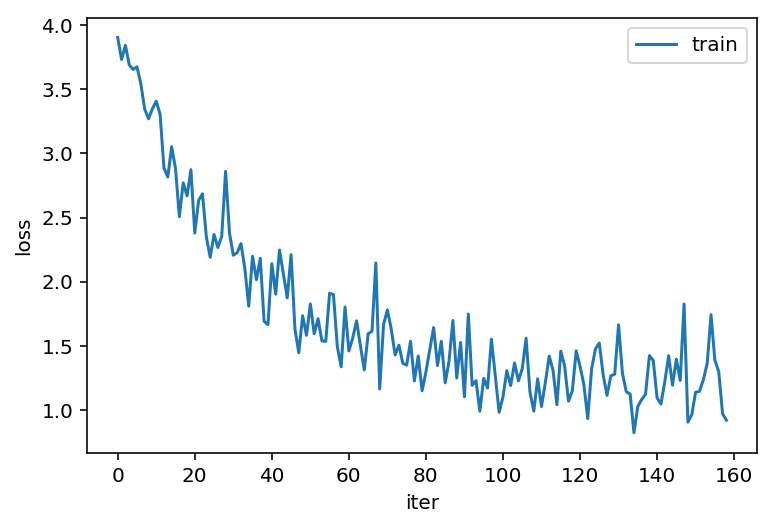

159
Epoch: 159, Iteration: 5, Loss: 1.2311418056488037
Epoch: 159, Iteration: 10, Loss: 0.8924198150634766
Epoch: 159, Iteration: 15, Loss: 1.3677330017089844
Epoch: 159, Iteration: 20, Loss: 1.0419496297836304
Epoch: 159, Iteration: 25, Loss: 1.0411648750305176
Epoch: 159, Iteration: 30, Loss: 1.041269302368164
Epoch: 159, Iteration: 35, Loss: 1.0483996868133545
Epoch: 159, Iteration: 40, Loss: 1.132093071937561
Epoch: 159, Iteration: 45, Loss: 1.058972716331482
Epoch: 159, Iteration: 50, Loss: 1.1736607551574707
Epoch: 159, Iteration: 55, Loss: 1.2205451726913452
Epoch: 159, Iteration: 60, Loss: 0.980177640914917
Epoch: 159, Iteration: 65, Loss: 1.3149524927139282
Epoch: 159, Iteration: 70, Loss: 0.937076210975647
Epoch: 159, Iteration: 75, Loss: 1.3041040897369385
Epoch: 159, Iteration: 80, Loss: 1.0471155643463135
Epoch: 159, Iteration: 85, Loss: 1.4737149477005005
Epoch: 159, Iteration: 90, Loss: 1.064814567565918
Epoch: 159, Iteration: 95, Loss: 1.2324283123016357
Epoch: 159, Ite

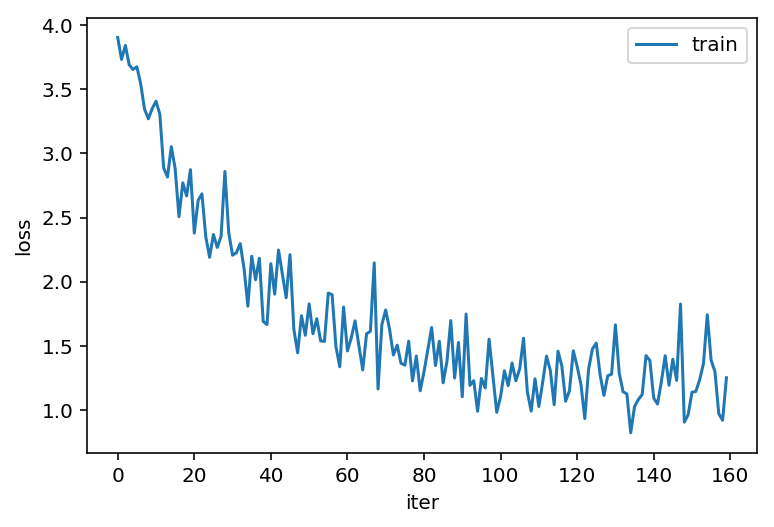

160
Epoch: 160, Iteration: 100, Loss: 0.9167566895484924
Epoch: 160, Iteration: 200, Loss: 1.2693692445755005
Epoch: 160, Iteration: 300, Loss: 0.8004150390625
Epoch: 160, Iteration: 400, Loss: 1.0709748268127441
Epoch: 160, Iteration: 500, Loss: 1.2922157049179077
Epoch: 160, Iteration: 600, Loss: 1.2753868103027344
Epoch: 160, Iteration: 700, Loss: 1.1862719058990479
Epoch: 160, Iteration: 800, Loss: 1.3588321208953857


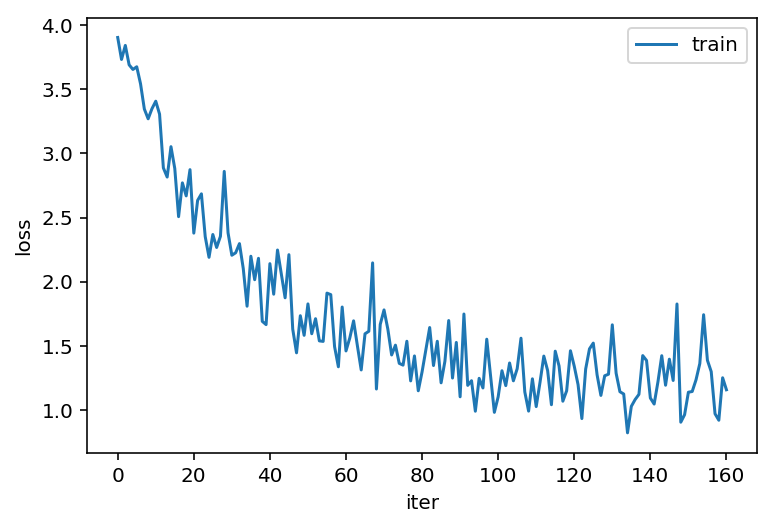

161
Epoch: 161, Iteration: 50, Loss: 1.3605226278305054
Epoch: 161, Iteration: 100, Loss: 1.0387901067733765
Epoch: 161, Iteration: 150, Loss: 1.316330909729004
Epoch: 161, Iteration: 200, Loss: 1.4192122220993042
Epoch: 161, Iteration: 250, Loss: 1.149509310722351
Epoch: 161, Iteration: 300, Loss: 1.1551010608673096
Epoch: 161, Iteration: 350, Loss: 0.9392670392990112
Epoch: 161, Iteration: 400, Loss: 1.0689284801483154
Epoch: 161, Iteration: 450, Loss: 1.4724665880203247
Epoch: 161, Iteration: 500, Loss: 0.9568769335746765
Epoch: 161, Iteration: 550, Loss: 0.9566681981086731
Epoch: 161, Iteration: 600, Loss: 1.1711432933807373
Epoch: 161, Iteration: 650, Loss: 1.1359456777572632
Epoch: 161, Iteration: 700, Loss: 0.969302773475647
Epoch: 161, Iteration: 750, Loss: 1.3056856393814087
Epoch: 161, Iteration: 800, Loss: 1.2498631477355957
Epoch: 161, Iteration: 850, Loss: 1.0569143295288086


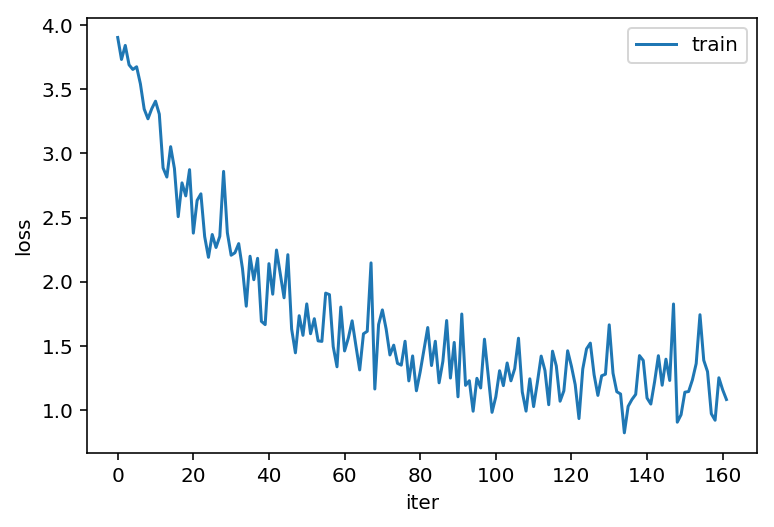

162
Epoch: 162, Iteration: 100, Loss: 1.1296499967575073
Epoch: 162, Iteration: 200, Loss: 1.0645540952682495
Epoch: 162, Iteration: 300, Loss: 0.93337082862854
Epoch: 162, Iteration: 400, Loss: 1.131171464920044
Epoch: 162, Iteration: 500, Loss: 1.336390733718872
Epoch: 162, Iteration: 600, Loss: 1.2592428922653198
Epoch: 162, Iteration: 700, Loss: 1.0541630983352661
Epoch: 162, Iteration: 800, Loss: 1.0680291652679443


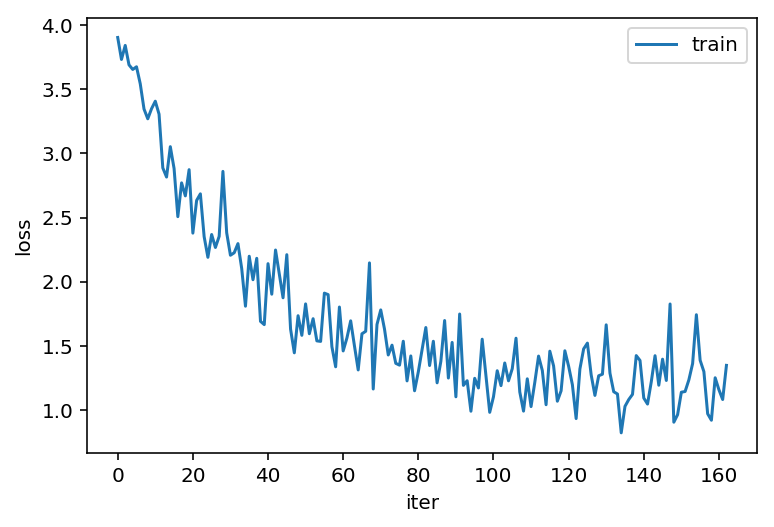

163
Epoch: 163, Iteration: 25, Loss: 1.164226770401001
Epoch: 163, Iteration: 50, Loss: 0.9821269512176514
Epoch: 163, Iteration: 75, Loss: 0.7775831818580627
Epoch: 163, Iteration: 100, Loss: 1.1362935304641724
Epoch: 163, Iteration: 125, Loss: 1.217100977897644
Epoch: 163, Iteration: 150, Loss: 1.1335170269012451
Epoch: 163, Iteration: 175, Loss: 1.7078787088394165
Epoch: 163, Iteration: 200, Loss: 1.1988552808761597
Epoch: 163, Iteration: 225, Loss: 1.3473896980285645
Epoch: 163, Iteration: 250, Loss: 0.8402826189994812
Epoch: 163, Iteration: 275, Loss: 0.7350860834121704
Epoch: 163, Iteration: 300, Loss: 1.4607735872268677
Epoch: 163, Iteration: 325, Loss: 1.3964766263961792
Epoch: 163, Iteration: 350, Loss: 1.151748776435852
Epoch: 163, Iteration: 375, Loss: 1.0179435014724731
Epoch: 163, Iteration: 400, Loss: 1.2602670192718506
Epoch: 163, Iteration: 425, Loss: 1.5420368909835815
Epoch: 163, Iteration: 450, Loss: 1.5032893419265747
Epoch: 163, Iteration: 475, Loss: 1.180270195007

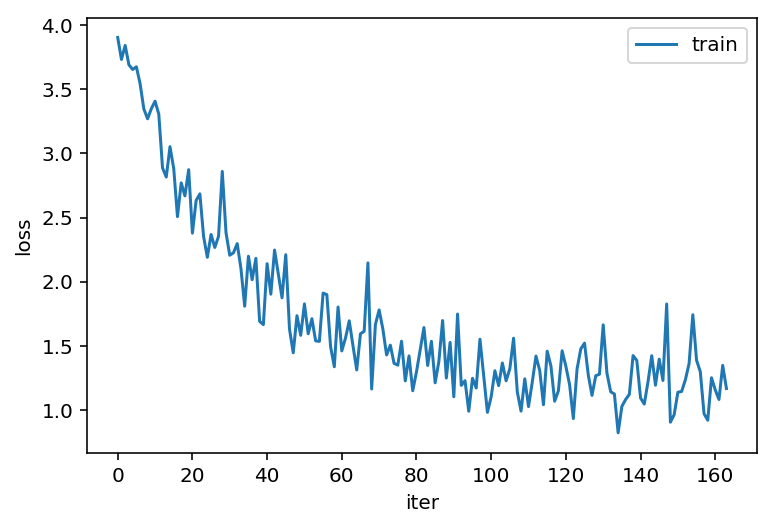

164
Epoch: 164, Iteration: 20, Loss: 1.258237361907959
Epoch: 164, Iteration: 40, Loss: 0.9944257140159607
Epoch: 164, Iteration: 60, Loss: 1.2201582193374634
Epoch: 164, Iteration: 80, Loss: 0.9543392062187195
Epoch: 164, Iteration: 100, Loss: 1.1733309030532837
Epoch: 164, Iteration: 120, Loss: 1.4649841785430908
Epoch: 164, Iteration: 140, Loss: 1.4063184261322021
Epoch: 164, Iteration: 160, Loss: 1.21221125125885
Epoch: 164, Iteration: 180, Loss: 1.3211263418197632
Epoch: 164, Iteration: 200, Loss: 1.1050376892089844
Epoch: 164, Iteration: 220, Loss: 1.061074137687683
Epoch: 164, Iteration: 240, Loss: 1.2771124839782715
Epoch: 164, Iteration: 260, Loss: 0.9670014977455139
Epoch: 164, Iteration: 280, Loss: 1.2087130546569824
Epoch: 164, Iteration: 300, Loss: 1.3604283332824707
Epoch: 164, Iteration: 320, Loss: 0.7783145904541016
Epoch: 164, Iteration: 340, Loss: 1.0152095556259155
Epoch: 164, Iteration: 360, Loss: 1.1705384254455566
Epoch: 164, Iteration: 380, Loss: 1.36922323703765

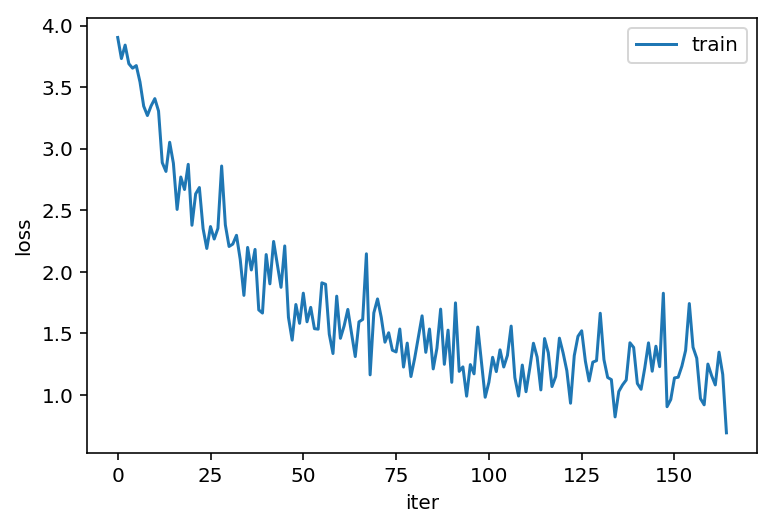

165
Epoch: 165, Iteration: 50, Loss: 0.9558109641075134
Epoch: 165, Iteration: 100, Loss: 1.2935547828674316
Epoch: 165, Iteration: 150, Loss: 1.3901468515396118
Epoch: 165, Iteration: 200, Loss: 1.1703108549118042
Epoch: 165, Iteration: 250, Loss: 1.5231330394744873
Epoch: 165, Iteration: 300, Loss: 1.3147976398468018
Epoch: 165, Iteration: 350, Loss: 1.1055974960327148
Epoch: 165, Iteration: 400, Loss: 1.2086875438690186
Epoch: 165, Iteration: 450, Loss: 1.0948095321655273
Epoch: 165, Iteration: 500, Loss: 1.0928317308425903
Epoch: 165, Iteration: 550, Loss: 1.4339189529418945
Epoch: 165, Iteration: 600, Loss: 1.1540950536727905
Epoch: 165, Iteration: 650, Loss: 1.0268737077713013
Epoch: 165, Iteration: 700, Loss: 0.9525753855705261
Epoch: 165, Iteration: 750, Loss: 1.1439636945724487
Epoch: 165, Iteration: 800, Loss: 1.0761200189590454
Epoch: 165, Iteration: 850, Loss: 1.1880483627319336


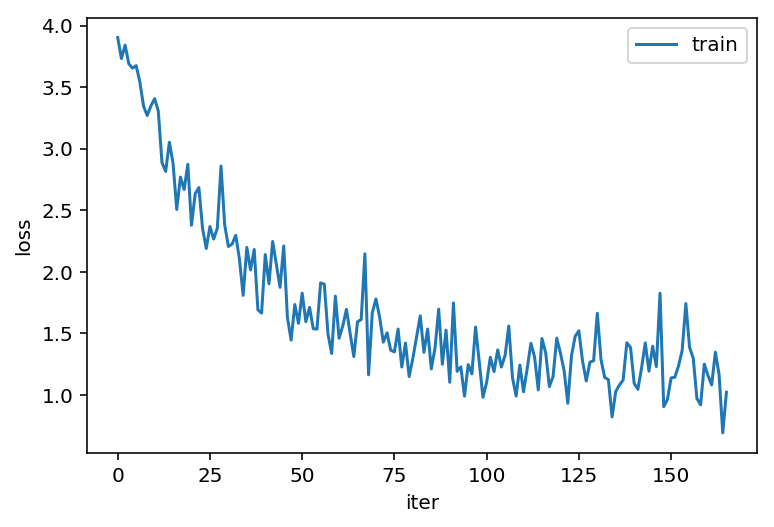

166
Epoch: 166, Iteration: 100, Loss: 1.260643482208252
Epoch: 166, Iteration: 200, Loss: 1.2561349868774414
Epoch: 166, Iteration: 300, Loss: 1.0070617198944092
Epoch: 166, Iteration: 400, Loss: 1.0738122463226318
Epoch: 166, Iteration: 500, Loss: 1.368396282196045
Epoch: 166, Iteration: 600, Loss: 1.500071406364441
Epoch: 166, Iteration: 700, Loss: 1.1840616464614868
Epoch: 166, Iteration: 800, Loss: 0.8348407745361328


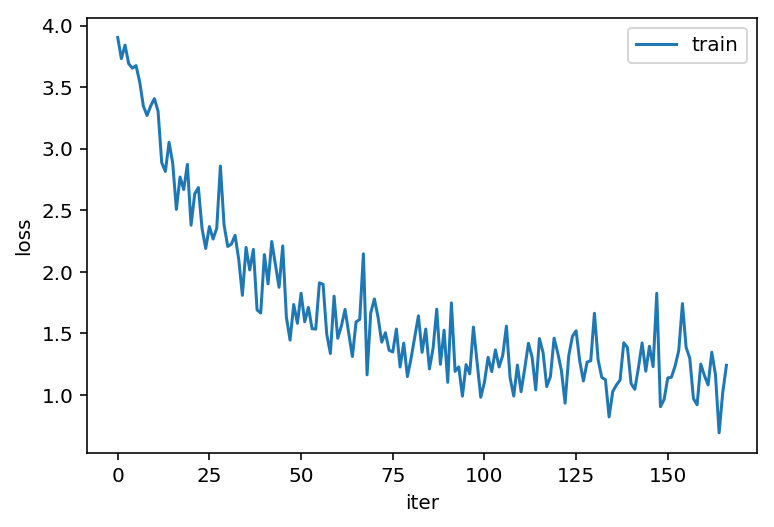

167
Epoch: 167, Iteration: 25, Loss: 1.05364990234375
Epoch: 167, Iteration: 50, Loss: 0.9750089645385742
Epoch: 167, Iteration: 75, Loss: 1.0077470541000366
Epoch: 167, Iteration: 100, Loss: 0.9919134378433228
Epoch: 167, Iteration: 125, Loss: 1.1306796073913574
Epoch: 167, Iteration: 150, Loss: 1.0748718976974487
Epoch: 167, Iteration: 175, Loss: 0.8312141299247742
Epoch: 167, Iteration: 200, Loss: 1.0521708726882935
Epoch: 167, Iteration: 225, Loss: 1.2253763675689697
Epoch: 167, Iteration: 250, Loss: 1.0368683338165283
Epoch: 167, Iteration: 275, Loss: 0.9548584222793579
Epoch: 167, Iteration: 300, Loss: 0.879366934299469
Epoch: 167, Iteration: 325, Loss: 0.9335288405418396
Epoch: 167, Iteration: 350, Loss: 0.8658053278923035
Epoch: 167, Iteration: 375, Loss: 1.1647956371307373
Epoch: 167, Iteration: 400, Loss: 1.0952415466308594
Epoch: 167, Iteration: 425, Loss: 1.2677615880966187
Epoch: 167, Iteration: 450, Loss: 1.2686223983764648
Epoch: 167, Iteration: 475, Loss: 1.382779002189

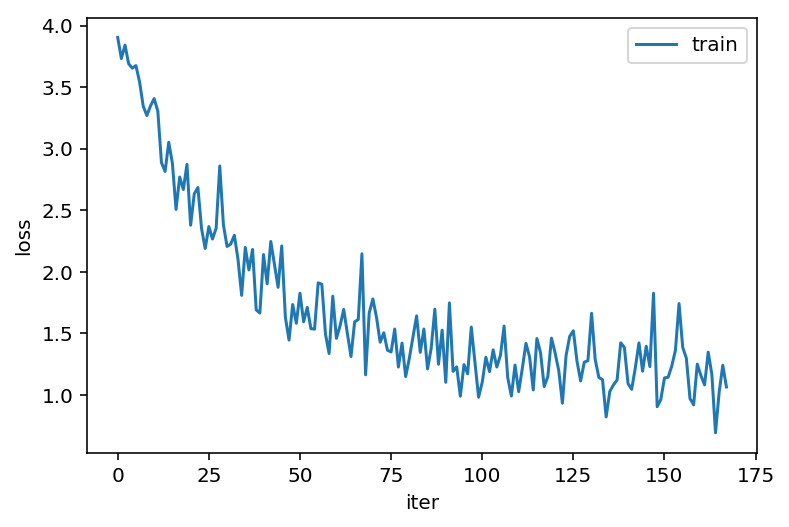

168
Epoch: 168, Iteration: 100, Loss: 1.0795799493789673
Epoch: 168, Iteration: 200, Loss: 0.9637170433998108
Epoch: 168, Iteration: 300, Loss: 1.4673359394073486
Epoch: 168, Iteration: 400, Loss: 1.7985488176345825
Epoch: 168, Iteration: 500, Loss: 1.1284611225128174
Epoch: 168, Iteration: 600, Loss: 1.2560620307922363
Epoch: 168, Iteration: 700, Loss: 1.4639283418655396
Epoch: 168, Iteration: 800, Loss: 1.308638095855713


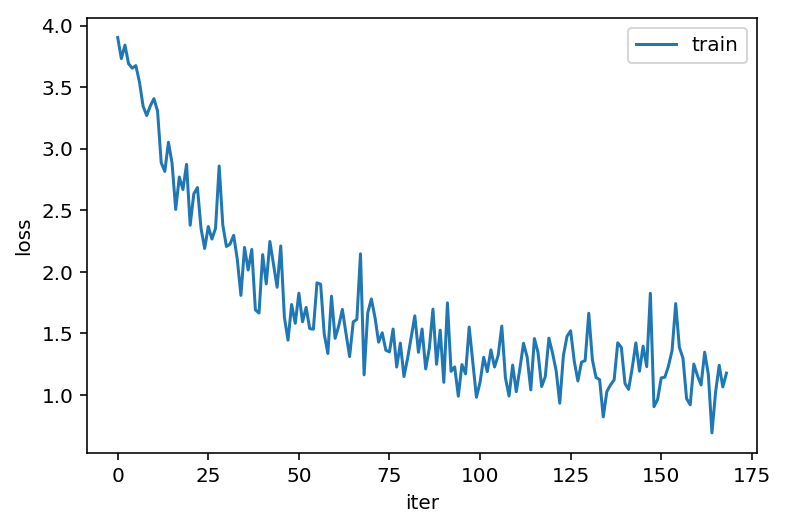

169
Epoch: 169, Iteration: 10, Loss: 1.16497802734375
Epoch: 169, Iteration: 20, Loss: 1.1547043323516846
Epoch: 169, Iteration: 30, Loss: 1.0486643314361572
Epoch: 169, Iteration: 40, Loss: 1.00475013256073
Epoch: 169, Iteration: 50, Loss: 1.104454755783081
Epoch: 169, Iteration: 60, Loss: 1.2657287120819092
Epoch: 169, Iteration: 70, Loss: 1.0782268047332764
Epoch: 169, Iteration: 80, Loss: 1.3663891553878784
Epoch: 169, Iteration: 90, Loss: 1.3230987787246704
Epoch: 169, Iteration: 100, Loss: 0.7894994616508484
Epoch: 169, Iteration: 110, Loss: 1.2436888217926025
Epoch: 169, Iteration: 120, Loss: 1.115584135055542
Epoch: 169, Iteration: 130, Loss: 1.2110495567321777
Epoch: 169, Iteration: 140, Loss: 0.7094933986663818
Epoch: 169, Iteration: 150, Loss: 1.103299856185913
Epoch: 169, Iteration: 160, Loss: 1.1363437175750732
Epoch: 169, Iteration: 170, Loss: 1.213745355606079
Epoch: 169, Iteration: 180, Loss: 1.0321763753890991
Epoch: 169, Iteration: 190, Loss: 1.091748595237732
Epoch: 

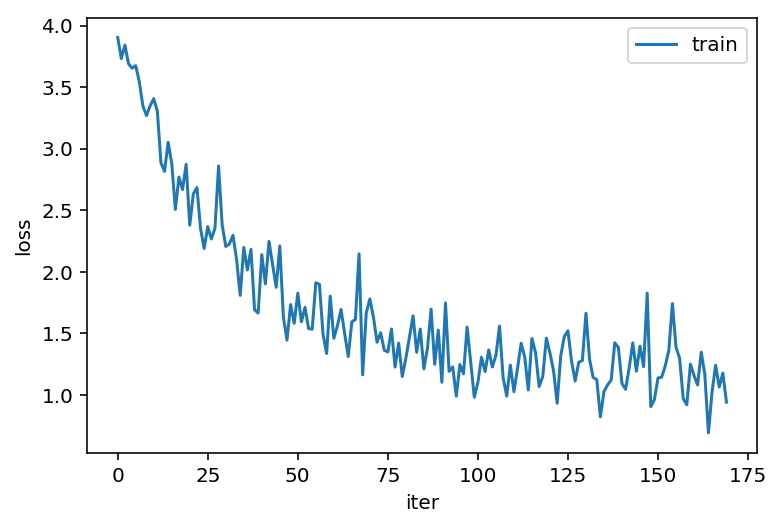

170
Epoch: 170, Iteration: 100, Loss: 0.9283198714256287
Epoch: 170, Iteration: 200, Loss: 1.3086106777191162
Epoch: 170, Iteration: 300, Loss: 1.1656337976455688
Epoch: 170, Iteration: 400, Loss: 1.106490969657898
Epoch: 170, Iteration: 500, Loss: 1.3603692054748535
Epoch: 170, Iteration: 600, Loss: 1.1633270978927612
Epoch: 170, Iteration: 700, Loss: 1.108920931816101
Epoch: 170, Iteration: 800, Loss: 1.165049433708191


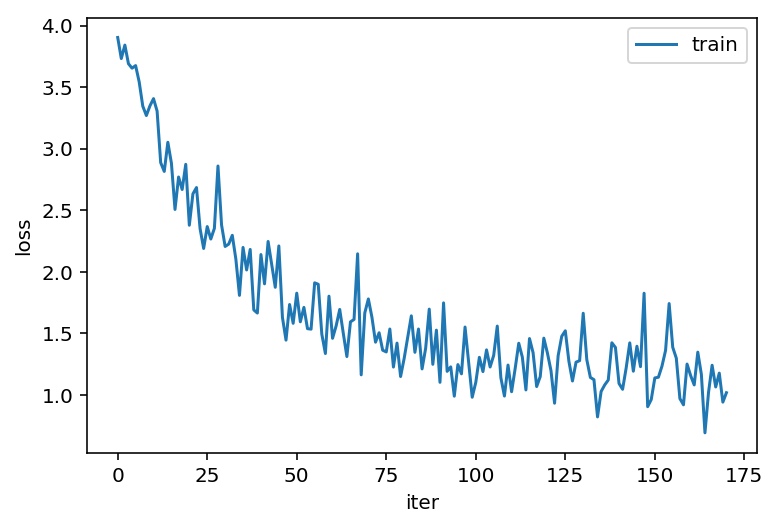

171
Epoch: 171, Iteration: 25, Loss: 1.2214698791503906
Epoch: 171, Iteration: 50, Loss: 1.4444646835327148
Epoch: 171, Iteration: 75, Loss: 1.3543518781661987
Epoch: 171, Iteration: 100, Loss: 1.1181542873382568
Epoch: 171, Iteration: 125, Loss: 1.3679797649383545
Epoch: 171, Iteration: 150, Loss: 0.9763946533203125
Epoch: 171, Iteration: 175, Loss: 1.139254093170166
Epoch: 171, Iteration: 200, Loss: 1.0053586959838867
Epoch: 171, Iteration: 225, Loss: 1.223353624343872
Epoch: 171, Iteration: 250, Loss: 1.4494818449020386
Epoch: 171, Iteration: 275, Loss: 1.1118085384368896
Epoch: 171, Iteration: 300, Loss: 1.2523572444915771
Epoch: 171, Iteration: 325, Loss: 1.0457326173782349
Epoch: 171, Iteration: 350, Loss: 1.0546369552612305
Epoch: 171, Iteration: 375, Loss: 1.2657842636108398
Epoch: 171, Iteration: 400, Loss: 1.259468913078308
Epoch: 171, Iteration: 425, Loss: 0.8619742393493652
Epoch: 171, Iteration: 450, Loss: 1.346867561340332
Epoch: 171, Iteration: 475, Loss: 0.9390660524368

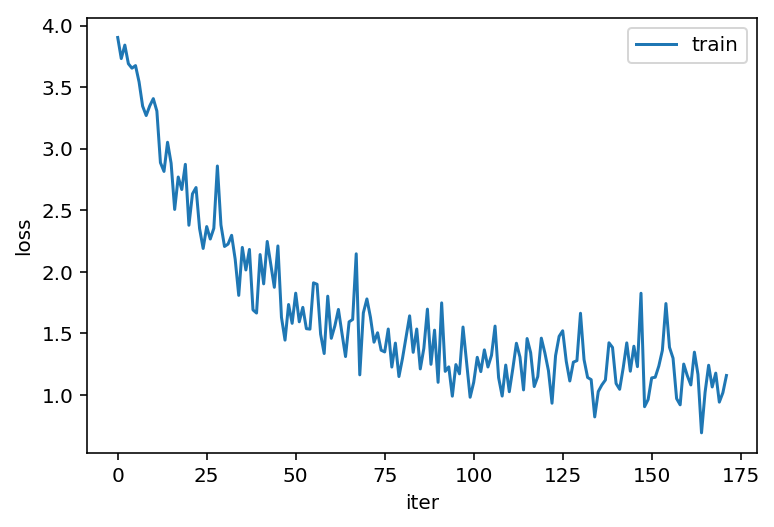

172
Epoch: 172, Iteration: 100, Loss: 1.1355605125427246
Epoch: 172, Iteration: 200, Loss: 1.085729956626892
Epoch: 172, Iteration: 300, Loss: 0.8986706137657166
Epoch: 172, Iteration: 400, Loss: 1.0165151357650757
Epoch: 172, Iteration: 500, Loss: 1.3565505743026733
Epoch: 172, Iteration: 600, Loss: 1.416062593460083
Epoch: 172, Iteration: 700, Loss: 0.9487095475196838
Epoch: 172, Iteration: 800, Loss: 0.8825187683105469


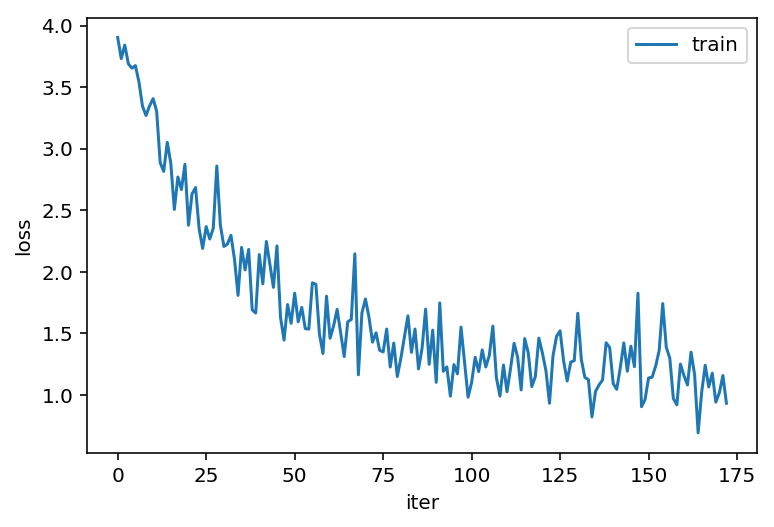

173
Epoch: 173, Iteration: 50, Loss: 0.8993829488754272
Epoch: 173, Iteration: 100, Loss: 1.0922168493270874
Epoch: 173, Iteration: 150, Loss: 0.9709390997886658
Epoch: 173, Iteration: 200, Loss: 1.1045925617218018
Epoch: 173, Iteration: 250, Loss: 1.0825845003128052
Epoch: 173, Iteration: 300, Loss: 0.9117547869682312
Epoch: 173, Iteration: 350, Loss: 0.8960702419281006
Epoch: 173, Iteration: 400, Loss: 1.1703208684921265
Epoch: 173, Iteration: 450, Loss: 1.084013819694519
Epoch: 173, Iteration: 500, Loss: 1.1222072839736938
Epoch: 173, Iteration: 550, Loss: 0.8125077486038208
Epoch: 173, Iteration: 600, Loss: 1.2508225440979004
Epoch: 173, Iteration: 650, Loss: 1.175034761428833
Epoch: 173, Iteration: 700, Loss: 1.1430528163909912
Epoch: 173, Iteration: 750, Loss: 1.2997647523880005
Epoch: 173, Iteration: 800, Loss: 0.9735187292098999
Epoch: 173, Iteration: 850, Loss: 1.5868825912475586


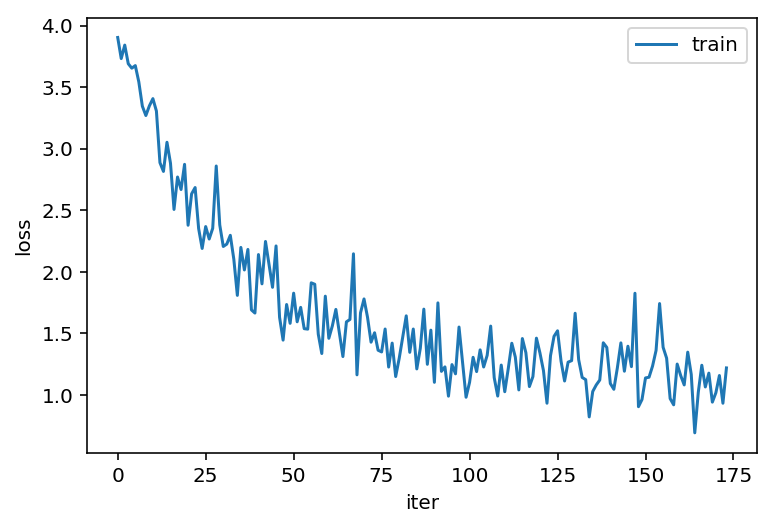

174
Epoch: 174, Iteration: 4, Loss: 1.0743354558944702
Epoch: 174, Iteration: 8, Loss: 1.0798351764678955
Epoch: 174, Iteration: 12, Loss: 1.1112875938415527
Epoch: 174, Iteration: 16, Loss: 0.9812591075897217
Epoch: 174, Iteration: 20, Loss: 0.8201029300689697
Epoch: 174, Iteration: 24, Loss: 1.4499367475509644
Epoch: 174, Iteration: 28, Loss: 1.0976685285568237
Epoch: 174, Iteration: 32, Loss: 0.9938990473747253
Epoch: 174, Iteration: 36, Loss: 0.8883519768714905
Epoch: 174, Iteration: 40, Loss: 1.1713601350784302
Epoch: 174, Iteration: 44, Loss: 1.328749179840088
Epoch: 174, Iteration: 48, Loss: 1.2878059148788452
Epoch: 174, Iteration: 52, Loss: 1.4431666135787964
Epoch: 174, Iteration: 56, Loss: 0.7895680665969849
Epoch: 174, Iteration: 60, Loss: 0.8351383209228516
Epoch: 174, Iteration: 64, Loss: 1.0410537719726562
Epoch: 174, Iteration: 68, Loss: 1.4219098091125488
Epoch: 174, Iteration: 72, Loss: 0.8842733502388
Epoch: 174, Iteration: 76, Loss: 0.9583666920661926
Epoch: 174, It

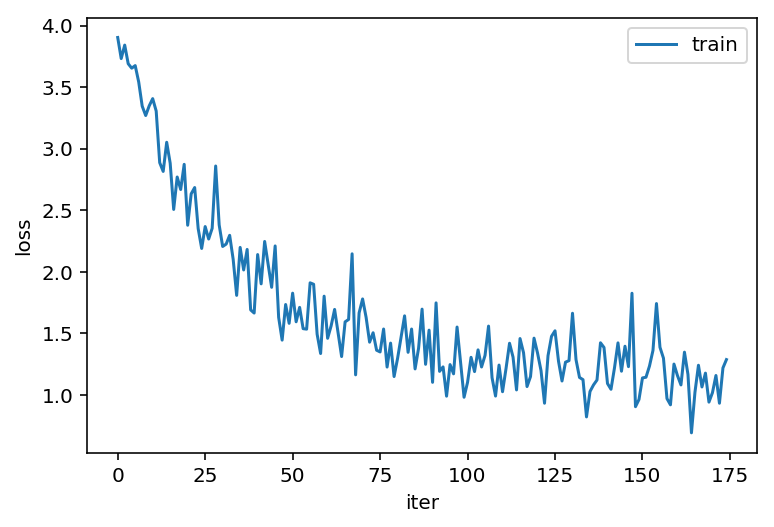

175
Epoch: 175, Iteration: 25, Loss: 1.181766390800476
Epoch: 175, Iteration: 50, Loss: 1.537652850151062
Epoch: 175, Iteration: 75, Loss: 1.2363879680633545
Epoch: 175, Iteration: 100, Loss: 1.1172970533370972
Epoch: 175, Iteration: 125, Loss: 1.2485942840576172
Epoch: 175, Iteration: 150, Loss: 1.5039430856704712
Epoch: 175, Iteration: 175, Loss: 1.1603798866271973
Epoch: 175, Iteration: 200, Loss: 1.4745615720748901
Epoch: 175, Iteration: 225, Loss: 1.346403956413269
Epoch: 175, Iteration: 250, Loss: 1.3423268795013428
Epoch: 175, Iteration: 275, Loss: 0.9416452646255493
Epoch: 175, Iteration: 300, Loss: 1.0845191478729248
Epoch: 175, Iteration: 325, Loss: 0.9256770610809326
Epoch: 175, Iteration: 350, Loss: 1.231382131576538
Epoch: 175, Iteration: 375, Loss: 1.0718715190887451
Epoch: 175, Iteration: 400, Loss: 0.8659471273422241
Epoch: 175, Iteration: 425, Loss: 0.9044963717460632
Epoch: 175, Iteration: 450, Loss: 1.1770892143249512
Epoch: 175, Iteration: 475, Loss: 1.2062952518463

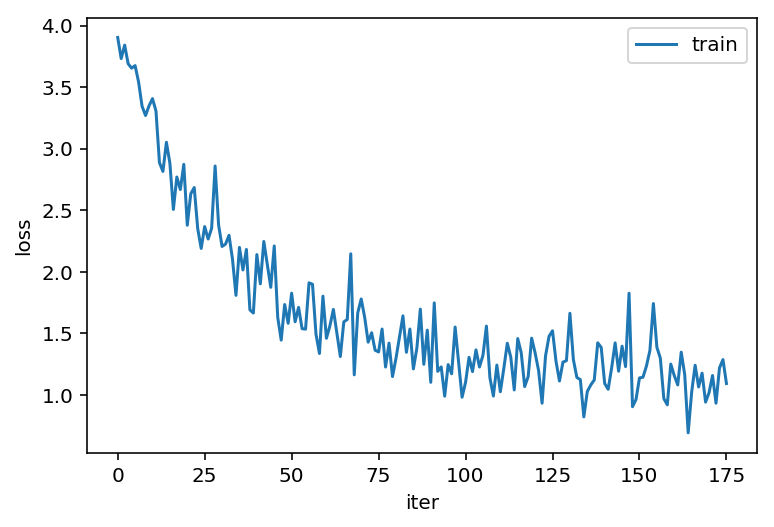

176
Epoch: 176, Iteration: 100, Loss: 1.0551851987838745
Epoch: 176, Iteration: 200, Loss: 1.2345819473266602
Epoch: 176, Iteration: 300, Loss: 1.0218240022659302
Epoch: 176, Iteration: 400, Loss: 1.2234102487564087
Epoch: 176, Iteration: 500, Loss: 1.116885781288147
Epoch: 176, Iteration: 600, Loss: 1.3056620359420776
Epoch: 176, Iteration: 700, Loss: 1.2952203750610352
Epoch: 176, Iteration: 800, Loss: 0.846698522567749


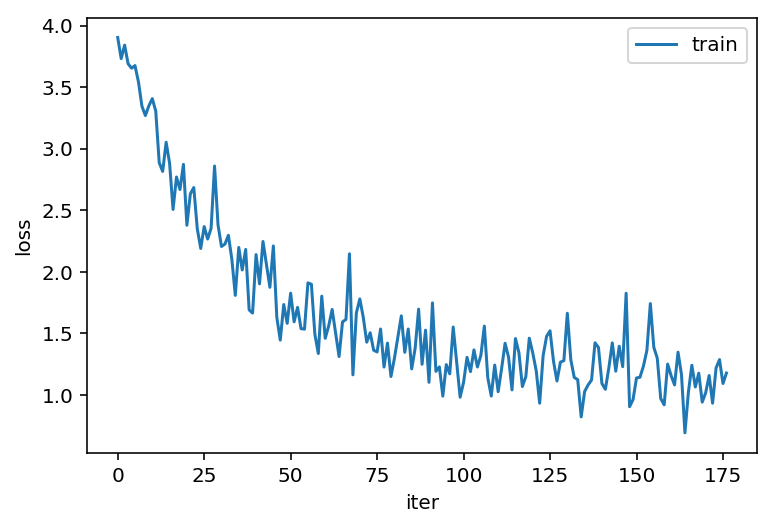

177
Epoch: 177, Iteration: 50, Loss: 1.105161428451538
Epoch: 177, Iteration: 100, Loss: 1.1380536556243896
Epoch: 177, Iteration: 150, Loss: 1.2641953229904175
Epoch: 177, Iteration: 200, Loss: 0.8108708262443542
Epoch: 177, Iteration: 250, Loss: 1.145658254623413
Epoch: 177, Iteration: 300, Loss: 1.3621972799301147
Epoch: 177, Iteration: 350, Loss: 1.2194907665252686
Epoch: 177, Iteration: 400, Loss: 1.1051499843597412
Epoch: 177, Iteration: 450, Loss: 1.2174603939056396
Epoch: 177, Iteration: 500, Loss: 1.3888912200927734
Epoch: 177, Iteration: 550, Loss: 1.1339532136917114
Epoch: 177, Iteration: 600, Loss: 1.378175973892212
Epoch: 177, Iteration: 650, Loss: 0.7616855502128601
Epoch: 177, Iteration: 700, Loss: 1.0175780057907104
Epoch: 177, Iteration: 750, Loss: 1.3113945722579956
Epoch: 177, Iteration: 800, Loss: 1.2362616062164307
Epoch: 177, Iteration: 850, Loss: 1.377384066581726


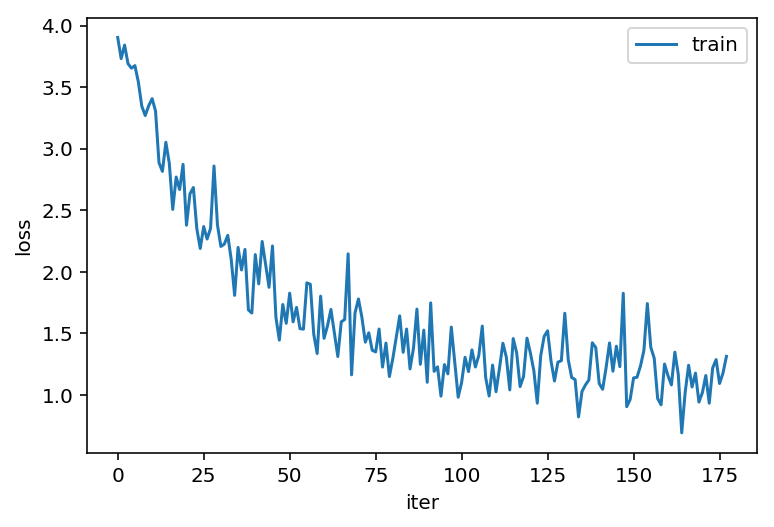

178
Epoch: 178, Iteration: 100, Loss: 0.8422809839248657
Epoch: 178, Iteration: 200, Loss: 1.1758360862731934
Epoch: 178, Iteration: 300, Loss: 0.9146414995193481
Epoch: 178, Iteration: 400, Loss: 1.270949125289917
Epoch: 178, Iteration: 500, Loss: 1.1159179210662842
Epoch: 178, Iteration: 600, Loss: 1.0173593759536743
Epoch: 178, Iteration: 700, Loss: 1.1736657619476318
Epoch: 178, Iteration: 800, Loss: 1.2128841876983643


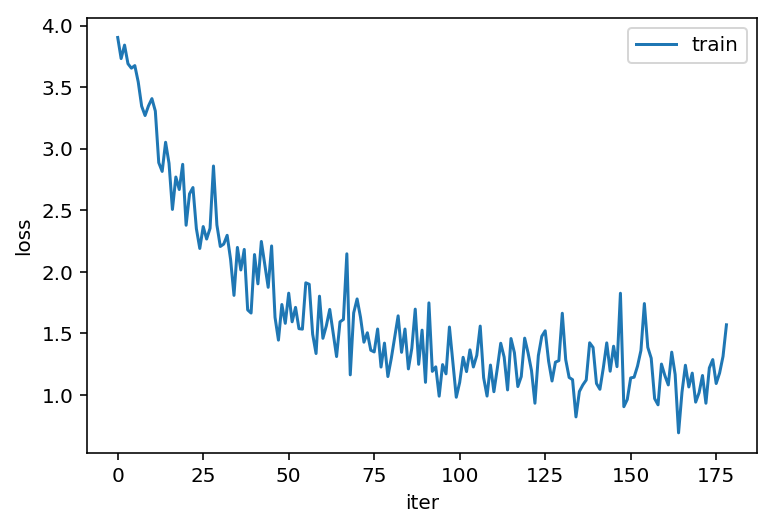

179
Epoch: 179, Iteration: 5, Loss: 1.2063899040222168
Epoch: 179, Iteration: 10, Loss: 1.1712605953216553
Epoch: 179, Iteration: 15, Loss: 0.732487678527832
Epoch: 179, Iteration: 20, Loss: 0.9407710433006287
Epoch: 179, Iteration: 25, Loss: 0.9149118661880493
Epoch: 179, Iteration: 30, Loss: 0.9837348461151123
Epoch: 179, Iteration: 35, Loss: 1.2036421298980713
Epoch: 179, Iteration: 40, Loss: 0.9634906649589539
Epoch: 179, Iteration: 45, Loss: 1.0513694286346436
Epoch: 179, Iteration: 50, Loss: 1.4792745113372803
Epoch: 179, Iteration: 55, Loss: 1.0703411102294922
Epoch: 179, Iteration: 60, Loss: 1.1304700374603271
Epoch: 179, Iteration: 65, Loss: 1.1181985139846802
Epoch: 179, Iteration: 70, Loss: 0.9333901405334473
Epoch: 179, Iteration: 75, Loss: 1.1209598779678345
Epoch: 179, Iteration: 80, Loss: 1.1396623849868774
Epoch: 179, Iteration: 85, Loss: 1.2478128671646118
Epoch: 179, Iteration: 90, Loss: 1.2046791315078735
Epoch: 179, Iteration: 95, Loss: 0.7493323087692261
Epoch: 179

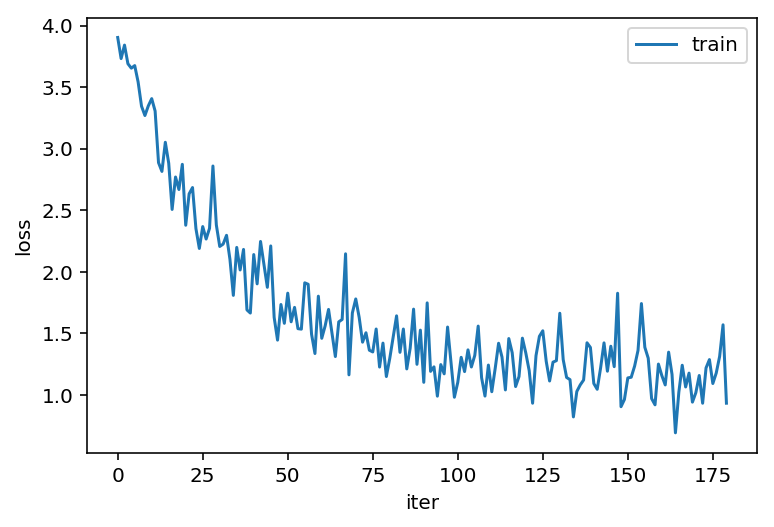

180
Epoch: 180, Iteration: 100, Loss: 1.0065758228302002
Epoch: 180, Iteration: 200, Loss: 1.1591140031814575
Epoch: 180, Iteration: 300, Loss: 1.0327839851379395
Epoch: 180, Iteration: 400, Loss: 1.0782763957977295
Epoch: 180, Iteration: 500, Loss: 1.1929928064346313
Epoch: 180, Iteration: 600, Loss: 0.9721806645393372
Epoch: 180, Iteration: 700, Loss: 1.2313200235366821
Epoch: 180, Iteration: 800, Loss: 1.3255465030670166


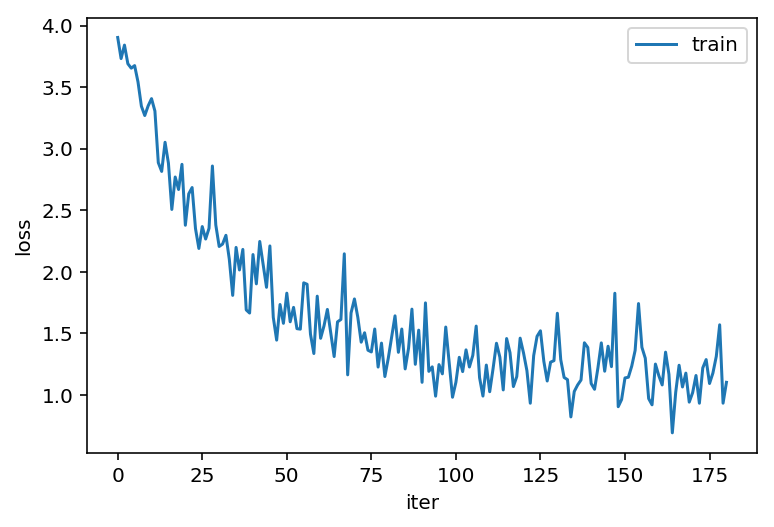

181
Epoch: 181, Iteration: 50, Loss: 1.3417164087295532
Epoch: 181, Iteration: 100, Loss: 1.2419674396514893
Epoch: 181, Iteration: 150, Loss: 1.3036994934082031
Epoch: 181, Iteration: 200, Loss: 0.9554584622383118
Epoch: 181, Iteration: 250, Loss: 1.1285263299942017
Epoch: 181, Iteration: 300, Loss: 1.1481953859329224
Epoch: 181, Iteration: 350, Loss: 0.7368228435516357
Epoch: 181, Iteration: 400, Loss: 1.315735101699829
Epoch: 181, Iteration: 450, Loss: 1.5240094661712646
Epoch: 181, Iteration: 500, Loss: 1.4266468286514282
Epoch: 181, Iteration: 550, Loss: 1.1578539609909058
Epoch: 181, Iteration: 600, Loss: 1.1032997369766235
Epoch: 181, Iteration: 650, Loss: 1.228610634803772
Epoch: 181, Iteration: 700, Loss: 1.324076771736145
Epoch: 181, Iteration: 750, Loss: 1.3422760963439941
Epoch: 181, Iteration: 800, Loss: 1.4619542360305786
Epoch: 181, Iteration: 850, Loss: 1.3359068632125854


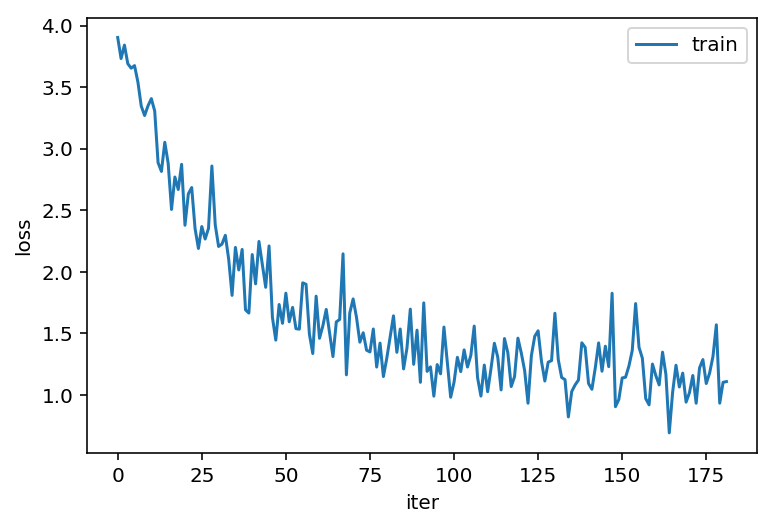

182
Epoch: 182, Iteration: 100, Loss: 1.2656060457229614
Epoch: 182, Iteration: 200, Loss: 1.1780195236206055
Epoch: 182, Iteration: 300, Loss: 0.8333716988563538
Epoch: 182, Iteration: 400, Loss: 1.0682083368301392
Epoch: 182, Iteration: 500, Loss: 1.1867969036102295
Epoch: 182, Iteration: 600, Loss: 1.0070295333862305
Epoch: 182, Iteration: 700, Loss: 1.1800071001052856
Epoch: 182, Iteration: 800, Loss: 0.9010658860206604


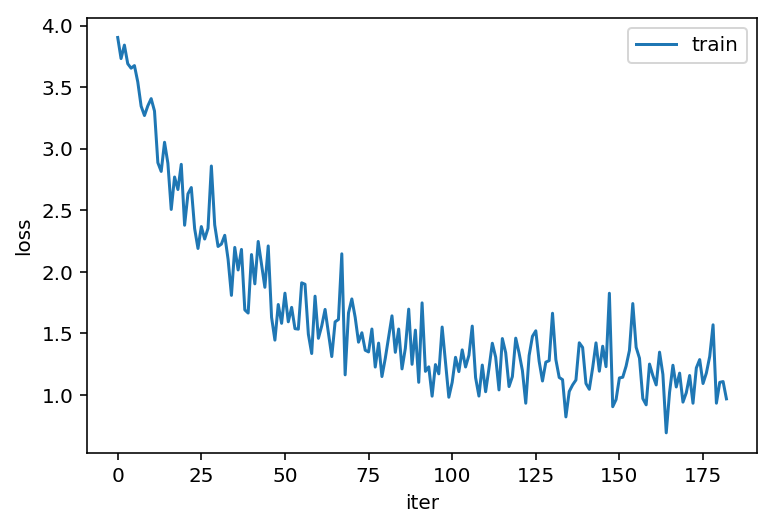

183
Epoch: 183, Iteration: 25, Loss: 0.7930229306221008
Epoch: 183, Iteration: 50, Loss: 0.8611778616905212
Epoch: 183, Iteration: 75, Loss: 1.40193772315979
Epoch: 183, Iteration: 100, Loss: 0.763319730758667
Epoch: 183, Iteration: 125, Loss: 1.190033197402954
Epoch: 183, Iteration: 150, Loss: 1.2161237001419067
Epoch: 183, Iteration: 175, Loss: 1.3292109966278076
Epoch: 183, Iteration: 200, Loss: 1.1557193994522095
Epoch: 183, Iteration: 225, Loss: 1.1445741653442383
Epoch: 183, Iteration: 250, Loss: 1.4500153064727783
Epoch: 183, Iteration: 275, Loss: 0.9450620412826538
Epoch: 183, Iteration: 300, Loss: 1.1101863384246826
Epoch: 183, Iteration: 325, Loss: 1.2738066911697388
Epoch: 183, Iteration: 350, Loss: 0.9528486728668213
Epoch: 183, Iteration: 375, Loss: 1.2812159061431885
Epoch: 183, Iteration: 400, Loss: 1.231270670890808
Epoch: 183, Iteration: 425, Loss: 1.1533656120300293
Epoch: 183, Iteration: 450, Loss: 0.9918723106384277
Epoch: 183, Iteration: 475, Loss: 0.95493483543396

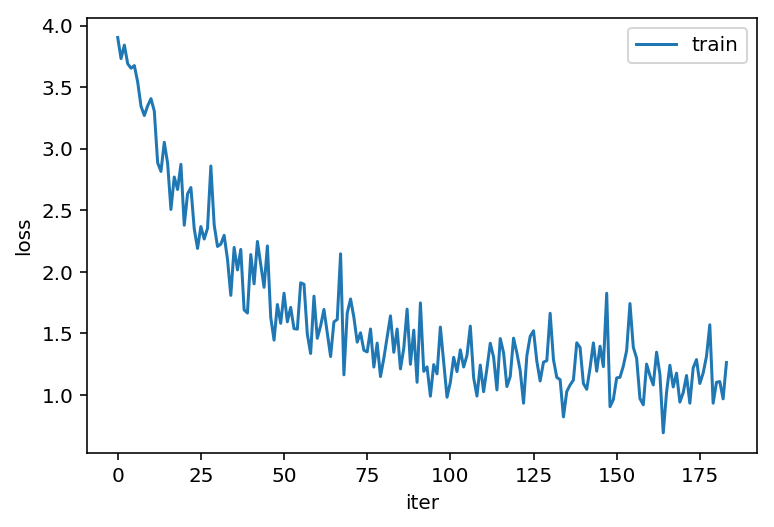

184
Epoch: 184, Iteration: 20, Loss: 1.1060566902160645
Epoch: 184, Iteration: 40, Loss: 0.7680908441543579
Epoch: 184, Iteration: 60, Loss: 0.9722235202789307
Epoch: 184, Iteration: 80, Loss: 1.1969852447509766
Epoch: 184, Iteration: 100, Loss: 1.3346916437149048
Epoch: 184, Iteration: 120, Loss: 1.1573201417922974
Epoch: 184, Iteration: 140, Loss: 1.0500214099884033
Epoch: 184, Iteration: 160, Loss: 1.2732347249984741
Epoch: 184, Iteration: 180, Loss: 0.6401417255401611
Epoch: 184, Iteration: 200, Loss: 1.613782286643982
Epoch: 184, Iteration: 220, Loss: 1.3488909006118774
Epoch: 184, Iteration: 240, Loss: 0.9085661768913269
Epoch: 184, Iteration: 260, Loss: 1.3124414682388306
Epoch: 184, Iteration: 280, Loss: 1.0756115913391113
Epoch: 184, Iteration: 300, Loss: 1.0486366748809814
Epoch: 184, Iteration: 320, Loss: 0.9060793519020081
Epoch: 184, Iteration: 340, Loss: 1.205887794494629
Epoch: 184, Iteration: 360, Loss: 1.1377432346343994
Epoch: 184, Iteration: 380, Loss: 1.173656463623

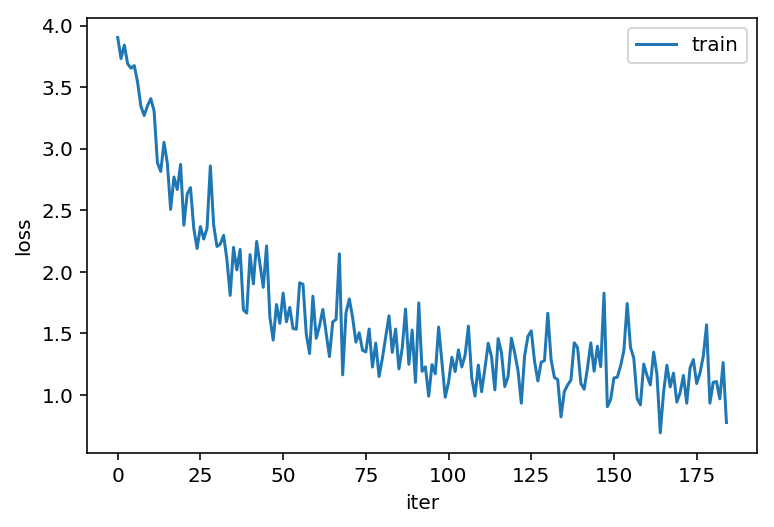

185
Epoch: 185, Iteration: 50, Loss: 1.0541034936904907
Epoch: 185, Iteration: 100, Loss: 0.9975529909133911
Epoch: 185, Iteration: 150, Loss: 0.9965604543685913
Epoch: 185, Iteration: 200, Loss: 1.2312679290771484
Epoch: 185, Iteration: 250, Loss: 1.1481044292449951
Epoch: 185, Iteration: 300, Loss: 1.4290746450424194
Epoch: 185, Iteration: 350, Loss: 1.4091465473175049
Epoch: 185, Iteration: 400, Loss: 0.9863380789756775
Epoch: 185, Iteration: 450, Loss: 1.2733174562454224
Epoch: 185, Iteration: 500, Loss: 0.9535689949989319
Epoch: 185, Iteration: 550, Loss: 0.9047465324401855
Epoch: 185, Iteration: 600, Loss: 1.047818660736084
Epoch: 185, Iteration: 650, Loss: 1.0009762048721313
Epoch: 185, Iteration: 700, Loss: 1.3906701803207397
Epoch: 185, Iteration: 750, Loss: 1.1488933563232422
Epoch: 185, Iteration: 800, Loss: 1.1847152709960938
Epoch: 185, Iteration: 850, Loss: 1.1732044219970703


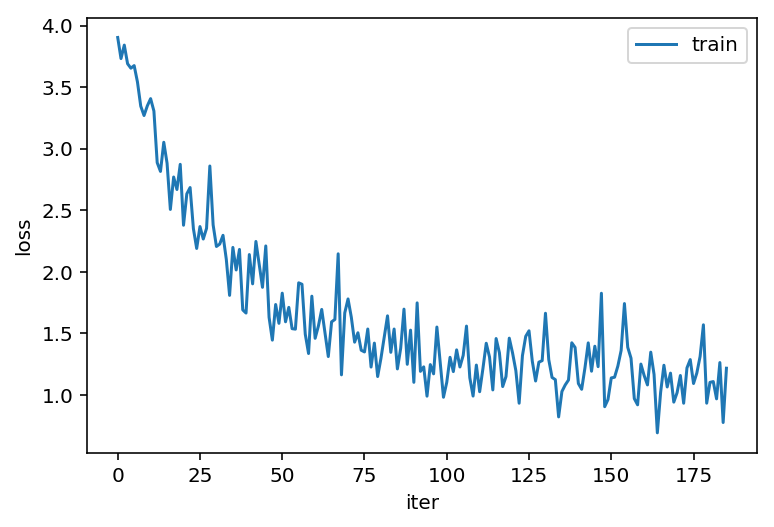

186
Epoch: 186, Iteration: 100, Loss: 1.2685374021530151
Epoch: 186, Iteration: 200, Loss: 1.098915696144104
Epoch: 186, Iteration: 300, Loss: 1.0525832176208496
Epoch: 186, Iteration: 400, Loss: 1.0260217189788818
Epoch: 186, Iteration: 500, Loss: 1.347233772277832
Epoch: 186, Iteration: 600, Loss: 1.2060834169387817
Epoch: 186, Iteration: 700, Loss: 0.9634525179862976
Epoch: 186, Iteration: 800, Loss: 1.3140156269073486


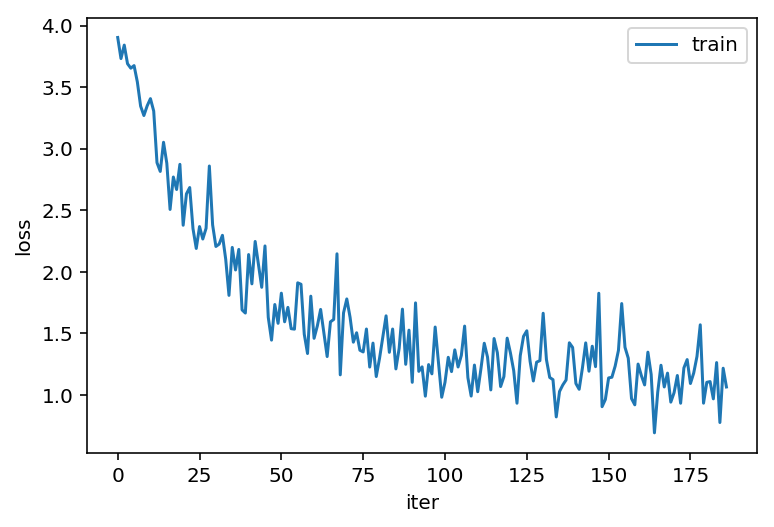

187
Epoch: 187, Iteration: 25, Loss: 0.8540134429931641
Epoch: 187, Iteration: 50, Loss: 1.0774383544921875
Epoch: 187, Iteration: 75, Loss: 1.4212485551834106
Epoch: 187, Iteration: 100, Loss: 1.2502738237380981
Epoch: 187, Iteration: 125, Loss: 1.0124045610427856
Epoch: 187, Iteration: 150, Loss: 1.067819595336914
Epoch: 187, Iteration: 175, Loss: 0.9524911642074585
Epoch: 187, Iteration: 200, Loss: 0.8880515098571777
Epoch: 187, Iteration: 225, Loss: 1.1182432174682617
Epoch: 187, Iteration: 250, Loss: 1.2805119752883911
Epoch: 187, Iteration: 275, Loss: 1.1766197681427002
Epoch: 187, Iteration: 300, Loss: 1.0513858795166016
Epoch: 187, Iteration: 325, Loss: 0.943005383014679
Epoch: 187, Iteration: 350, Loss: 1.0657864809036255
Epoch: 187, Iteration: 375, Loss: 1.3264782428741455
Epoch: 187, Iteration: 400, Loss: 0.8653844594955444
Epoch: 187, Iteration: 425, Loss: 1.2802438735961914
Epoch: 187, Iteration: 450, Loss: 1.0547399520874023
Epoch: 187, Iteration: 475, Loss: 0.93845677375

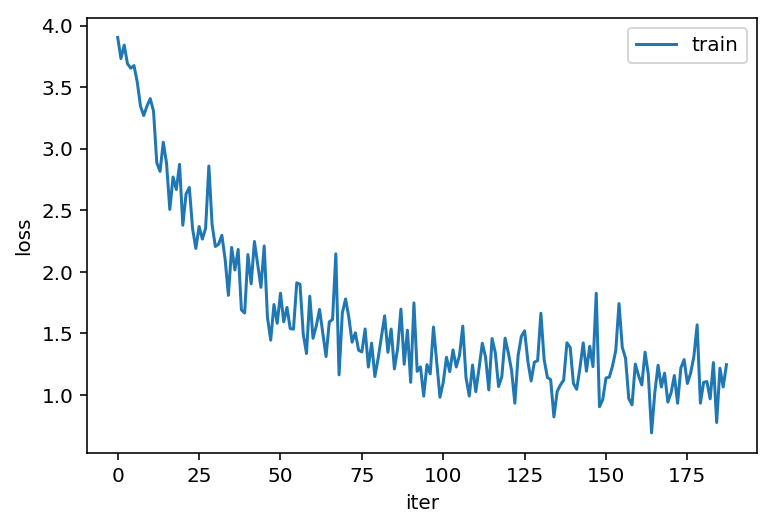

188
Epoch: 188, Iteration: 100, Loss: 1.1189990043640137
Epoch: 188, Iteration: 200, Loss: 0.9911606311798096
Epoch: 188, Iteration: 300, Loss: 1.0237504243850708
Epoch: 188, Iteration: 400, Loss: 0.8816984295845032
Epoch: 188, Iteration: 500, Loss: 1.3739264011383057
Epoch: 188, Iteration: 600, Loss: 1.2432326078414917
Epoch: 188, Iteration: 700, Loss: 1.1343122720718384
Epoch: 188, Iteration: 800, Loss: 0.7946728467941284


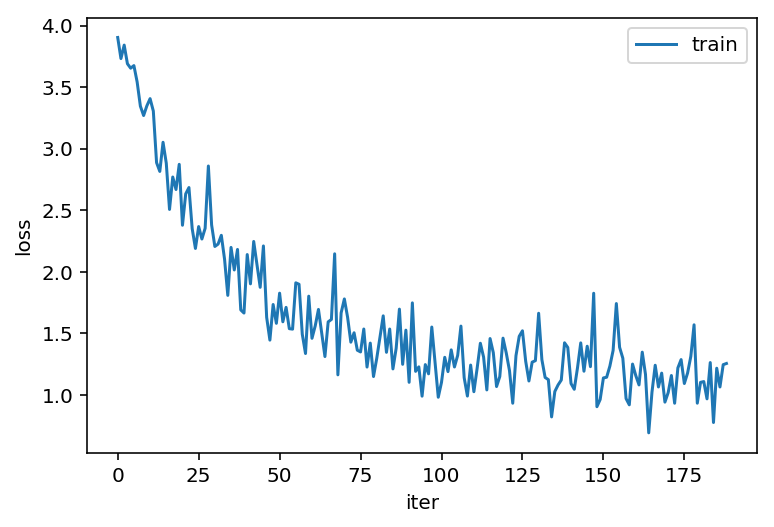

189
Epoch: 189, Iteration: 10, Loss: 1.0261789560317993
Epoch: 189, Iteration: 20, Loss: 0.9821408987045288
Epoch: 189, Iteration: 30, Loss: 0.7672550678253174
Epoch: 189, Iteration: 40, Loss: 0.9488730430603027
Epoch: 189, Iteration: 50, Loss: 1.0654865503311157
Epoch: 189, Iteration: 60, Loss: 1.1687191724777222
Epoch: 189, Iteration: 70, Loss: 1.337066411972046
Epoch: 189, Iteration: 80, Loss: 1.2215492725372314
Epoch: 189, Iteration: 90, Loss: 0.8930366039276123
Epoch: 189, Iteration: 100, Loss: 0.9269154667854309
Epoch: 189, Iteration: 110, Loss: 1.0235629081726074
Epoch: 189, Iteration: 120, Loss: 1.0287328958511353
Epoch: 189, Iteration: 130, Loss: 1.0527278184890747
Epoch: 189, Iteration: 140, Loss: 1.4662822484970093
Epoch: 189, Iteration: 150, Loss: 1.197510838508606
Epoch: 189, Iteration: 160, Loss: 1.0343786478042603
Epoch: 189, Iteration: 170, Loss: 1.0131385326385498
Epoch: 189, Iteration: 180, Loss: 1.0942890644073486
Epoch: 189, Iteration: 190, Loss: 1.28384530544281
Ep

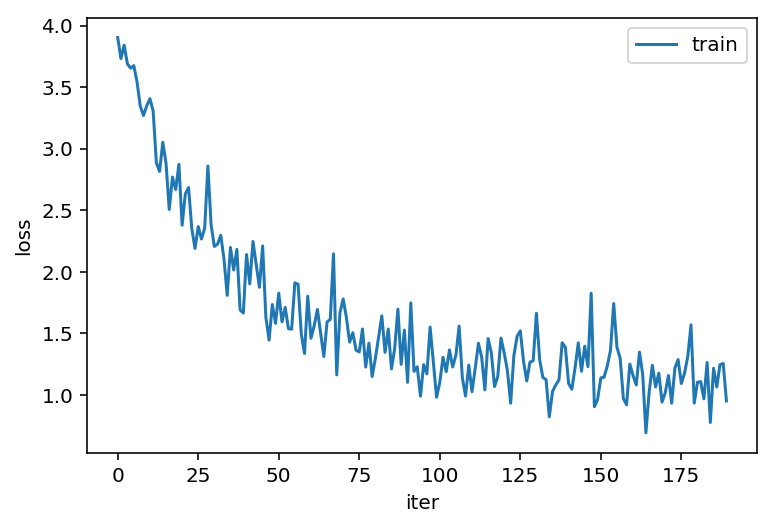

190
Epoch: 190, Iteration: 100, Loss: 1.1428229808807373
Epoch: 190, Iteration: 200, Loss: 0.9171721935272217
Epoch: 190, Iteration: 300, Loss: 1.0887342691421509
Epoch: 190, Iteration: 400, Loss: 0.8826164603233337
Epoch: 190, Iteration: 500, Loss: 1.0145957469940186
Epoch: 190, Iteration: 600, Loss: 1.1419302225112915
Epoch: 190, Iteration: 700, Loss: 0.9256001114845276
Epoch: 190, Iteration: 800, Loss: 1.1763101816177368


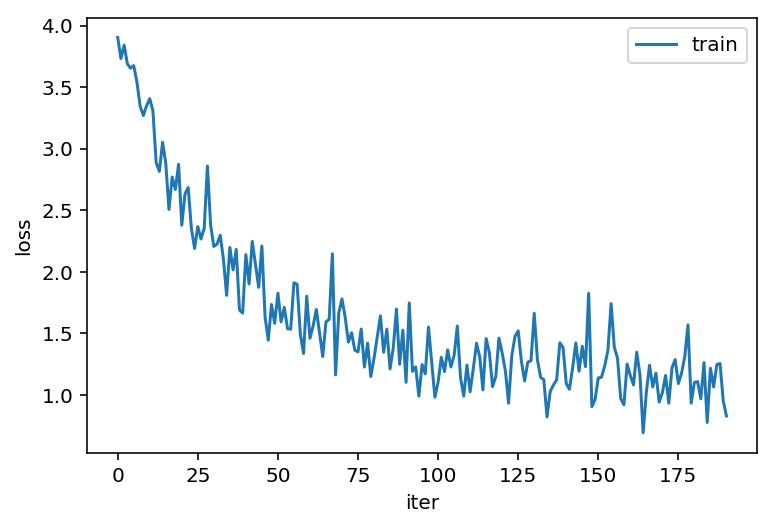

191
Epoch: 191, Iteration: 25, Loss: 1.1776366233825684
Epoch: 191, Iteration: 50, Loss: 1.1145050525665283
Epoch: 191, Iteration: 75, Loss: 0.8758603930473328
Epoch: 191, Iteration: 100, Loss: 1.2683889865875244
Epoch: 191, Iteration: 125, Loss: 1.2693363428115845
Epoch: 191, Iteration: 150, Loss: 1.0417898893356323
Epoch: 191, Iteration: 175, Loss: 1.3249660730361938
Epoch: 191, Iteration: 200, Loss: 1.3144348859786987
Epoch: 191, Iteration: 225, Loss: 1.0307633876800537
Epoch: 191, Iteration: 250, Loss: 1.3187212944030762
Epoch: 191, Iteration: 275, Loss: 1.44842529296875
Epoch: 191, Iteration: 300, Loss: 1.1120381355285645
Epoch: 191, Iteration: 325, Loss: 0.9042123556137085
Epoch: 191, Iteration: 350, Loss: 1.1534805297851562
Epoch: 191, Iteration: 375, Loss: 1.1273754835128784
Epoch: 191, Iteration: 400, Loss: 0.7303333878517151
Epoch: 191, Iteration: 425, Loss: 1.2692930698394775
Epoch: 191, Iteration: 450, Loss: 0.9019780158996582
Epoch: 191, Iteration: 475, Loss: 0.96799343824

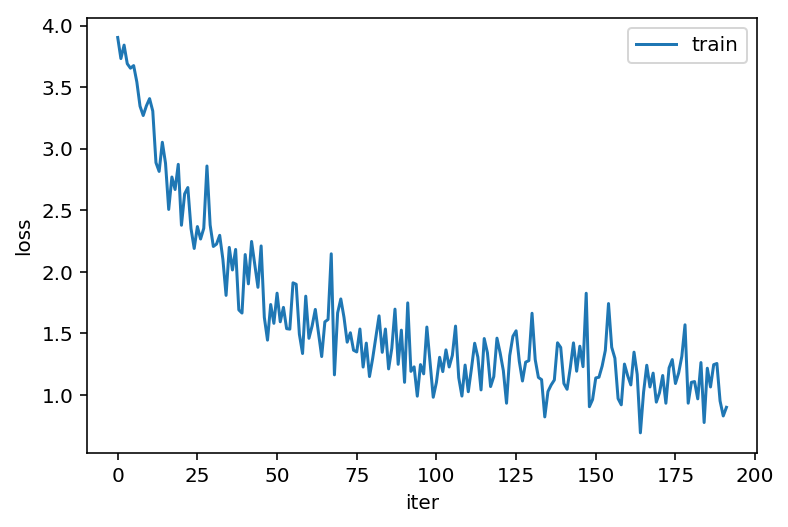

192
Epoch: 192, Iteration: 100, Loss: 1.3138837814331055
Epoch: 192, Iteration: 200, Loss: 0.9289302229881287
Epoch: 192, Iteration: 300, Loss: 0.7411272525787354
Epoch: 192, Iteration: 400, Loss: 0.931502103805542
Epoch: 192, Iteration: 500, Loss: 1.3994760513305664
Epoch: 192, Iteration: 600, Loss: 1.094090223312378
Epoch: 192, Iteration: 700, Loss: 0.8230510950088501
Epoch: 192, Iteration: 800, Loss: 1.6855508089065552


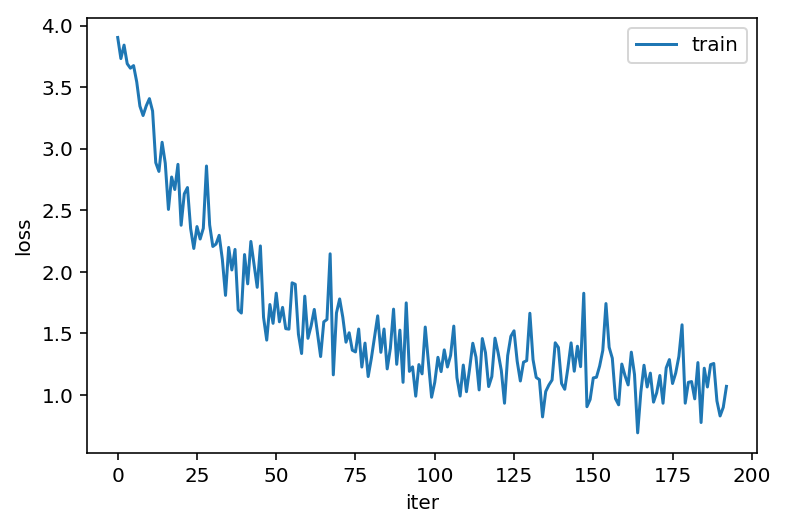

193
Epoch: 193, Iteration: 50, Loss: 0.9352986216545105
Epoch: 193, Iteration: 100, Loss: 1.163154125213623
Epoch: 193, Iteration: 150, Loss: 1.1908403635025024
Epoch: 193, Iteration: 200, Loss: 1.4518553018569946
Epoch: 193, Iteration: 250, Loss: 1.168924331665039
Epoch: 193, Iteration: 300, Loss: 1.4410831928253174
Epoch: 193, Iteration: 350, Loss: 1.154070258140564
Epoch: 193, Iteration: 400, Loss: 1.0568318367004395
Epoch: 193, Iteration: 450, Loss: 1.090603232383728
Epoch: 193, Iteration: 500, Loss: 1.0032144784927368
Epoch: 193, Iteration: 550, Loss: 0.970816969871521
Epoch: 193, Iteration: 600, Loss: 0.9849316477775574
Epoch: 193, Iteration: 650, Loss: 0.9193058013916016
Epoch: 193, Iteration: 700, Loss: 0.7128697037696838
Epoch: 193, Iteration: 750, Loss: 1.3244507312774658
Epoch: 193, Iteration: 800, Loss: 1.0500075817108154
Epoch: 193, Iteration: 850, Loss: 1.0160865783691406


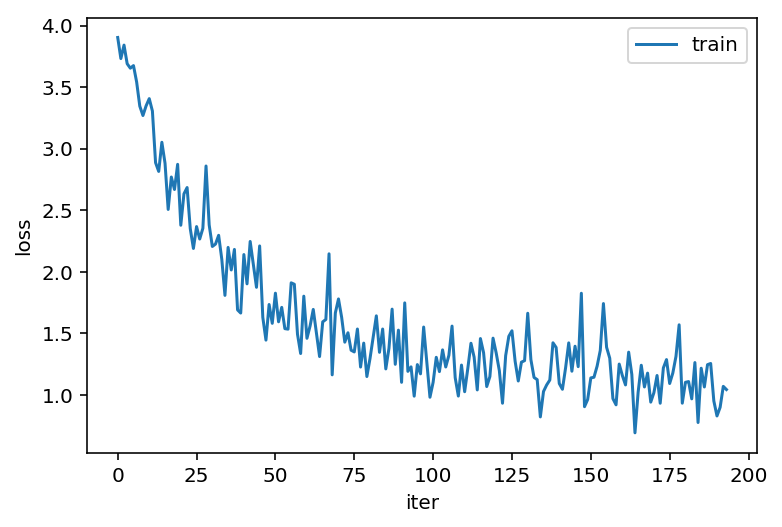

194
Epoch: 194, Iteration: 20, Loss: 1.703630805015564
Epoch: 194, Iteration: 40, Loss: 1.000441551208496
Epoch: 194, Iteration: 60, Loss: 1.3772698640823364
Epoch: 194, Iteration: 80, Loss: 1.3361406326293945
Epoch: 194, Iteration: 100, Loss: 1.4763282537460327
Epoch: 194, Iteration: 120, Loss: 1.1655353307724
Epoch: 194, Iteration: 140, Loss: 1.047994613647461
Epoch: 194, Iteration: 160, Loss: 1.2301323413848877
Epoch: 194, Iteration: 180, Loss: 1.364450216293335
Epoch: 194, Iteration: 200, Loss: 1.029871940612793
Epoch: 194, Iteration: 220, Loss: 0.8639487624168396
Epoch: 194, Iteration: 240, Loss: 1.2808010578155518
Epoch: 194, Iteration: 260, Loss: 0.8724283576011658
Epoch: 194, Iteration: 280, Loss: 1.3409957885742188
Epoch: 194, Iteration: 300, Loss: 1.1585692167282104
Epoch: 194, Iteration: 320, Loss: 1.135528564453125
Epoch: 194, Iteration: 340, Loss: 1.014136791229248
Epoch: 194, Iteration: 360, Loss: 0.9643968343734741
Epoch: 194, Iteration: 380, Loss: 1.06988525390625
Epoch

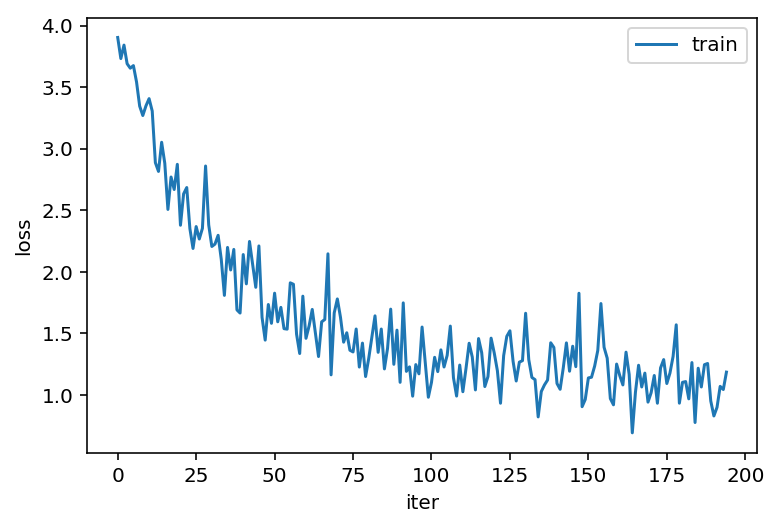

195
Epoch: 195, Iteration: 25, Loss: 1.2613517045974731
Epoch: 195, Iteration: 50, Loss: 1.0564779043197632
Epoch: 195, Iteration: 75, Loss: 1.1763784885406494
Epoch: 195, Iteration: 100, Loss: 1.481306552886963
Epoch: 195, Iteration: 125, Loss: 0.8132011890411377
Epoch: 195, Iteration: 150, Loss: 1.0571404695510864
Epoch: 195, Iteration: 175, Loss: 1.3227472305297852
Epoch: 195, Iteration: 200, Loss: 1.089207649230957
Epoch: 195, Iteration: 225, Loss: 1.074283480644226
Epoch: 195, Iteration: 250, Loss: 0.9219126105308533
Epoch: 195, Iteration: 275, Loss: 0.9308363795280457
Epoch: 195, Iteration: 300, Loss: 1.0567582845687866
Epoch: 195, Iteration: 325, Loss: 1.1467148065567017
Epoch: 195, Iteration: 350, Loss: 1.1072657108306885
Epoch: 195, Iteration: 375, Loss: 1.2017902135849
Epoch: 195, Iteration: 400, Loss: 1.3983640670776367
Epoch: 195, Iteration: 425, Loss: 1.0936102867126465
Epoch: 195, Iteration: 450, Loss: 0.9765669107437134
Epoch: 195, Iteration: 475, Loss: 1.205135941505432

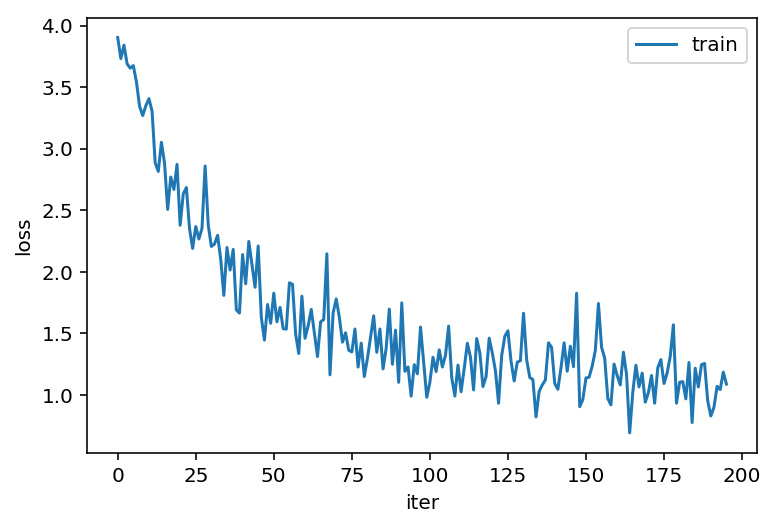

196
Epoch: 196, Iteration: 100, Loss: 1.2116117477416992
Epoch: 196, Iteration: 200, Loss: 0.9853032827377319
Epoch: 196, Iteration: 300, Loss: 1.058462381362915
Epoch: 196, Iteration: 400, Loss: 1.025288701057434
Epoch: 196, Iteration: 500, Loss: 1.111493468284607
Epoch: 196, Iteration: 600, Loss: 1.1107537746429443
Epoch: 196, Iteration: 700, Loss: 0.9772118926048279
Epoch: 196, Iteration: 800, Loss: 1.4440171718597412


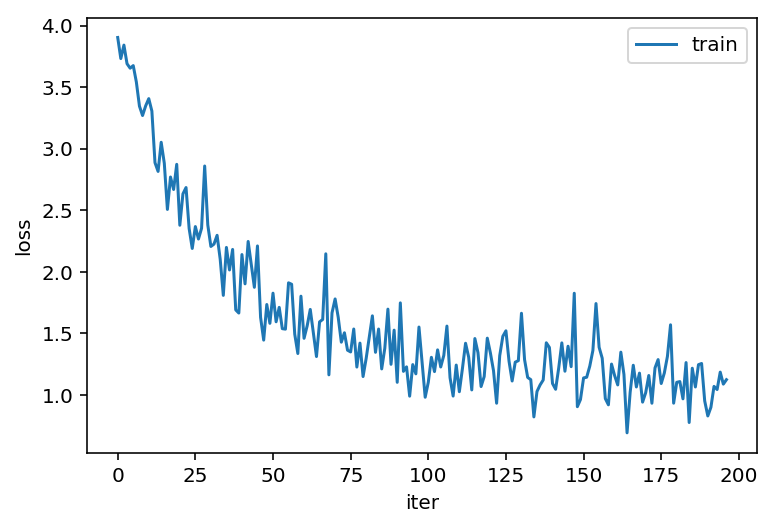

197
Epoch: 197, Iteration: 50, Loss: 0.9410092830657959
Epoch: 197, Iteration: 100, Loss: 1.0010743141174316
Epoch: 197, Iteration: 150, Loss: 0.9789761900901794
Epoch: 197, Iteration: 200, Loss: 0.9612396955490112
Epoch: 197, Iteration: 250, Loss: 0.8233405947685242
Epoch: 197, Iteration: 300, Loss: 0.9905534386634827
Epoch: 197, Iteration: 350, Loss: 1.1794425249099731
Epoch: 197, Iteration: 400, Loss: 1.2241556644439697
Epoch: 197, Iteration: 450, Loss: 1.3881971836090088
Epoch: 197, Iteration: 500, Loss: 0.9677441716194153
Epoch: 197, Iteration: 550, Loss: 0.8785640001296997
Epoch: 197, Iteration: 600, Loss: 1.1787830591201782
Epoch: 197, Iteration: 650, Loss: 0.8004521131515503
Epoch: 197, Iteration: 700, Loss: 1.2994742393493652
Epoch: 197, Iteration: 750, Loss: 0.8892379403114319
Epoch: 197, Iteration: 800, Loss: 1.1528533697128296
Epoch: 197, Iteration: 850, Loss: 1.1722381114959717


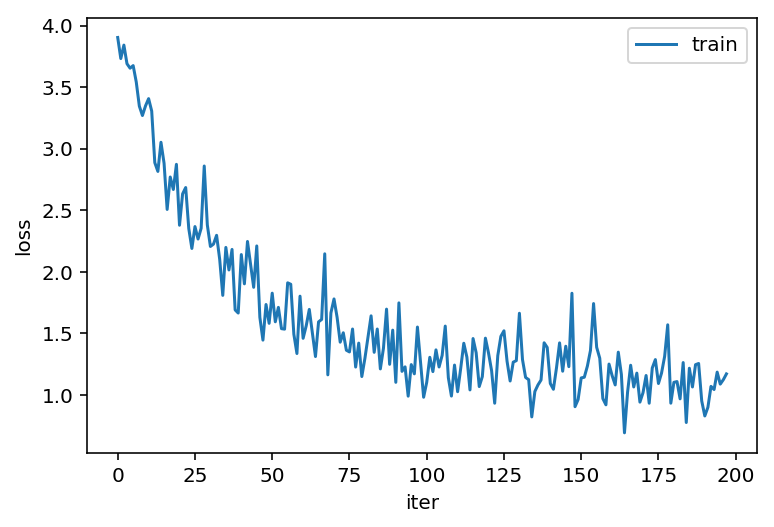

198
Epoch: 198, Iteration: 100, Loss: 0.8933303356170654
Epoch: 198, Iteration: 200, Loss: 1.0796843767166138
Epoch: 198, Iteration: 300, Loss: 1.2825251817703247
Epoch: 198, Iteration: 400, Loss: 1.3482117652893066
Epoch: 198, Iteration: 500, Loss: 0.9857574105262756
Epoch: 198, Iteration: 600, Loss: 1.2001514434814453
Epoch: 198, Iteration: 700, Loss: 0.7626917362213135
Epoch: 198, Iteration: 800, Loss: 1.0910866260528564


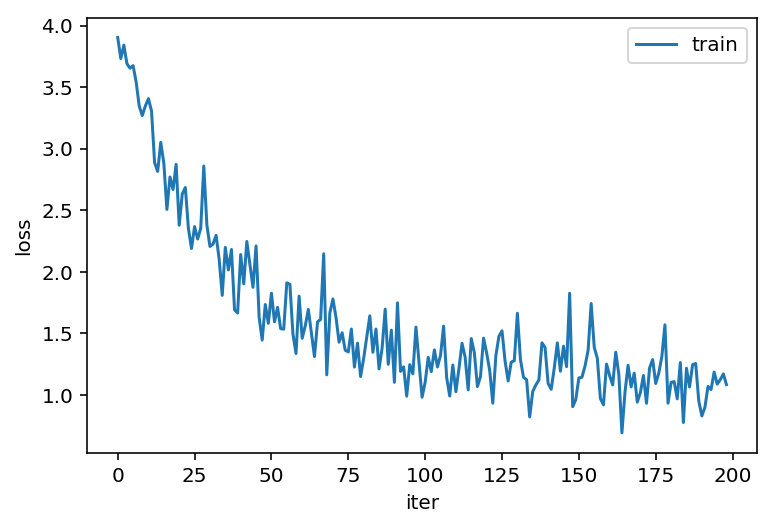

199
Epoch: 199, Iteration: 1, Loss: 0.8175017833709717
Epoch: 199, Iteration: 2, Loss: 1.0553827285766602
Epoch: 199, Iteration: 3, Loss: 0.6168452501296997
Epoch: 199, Iteration: 4, Loss: 1.4505126476287842
Epoch: 199, Iteration: 5, Loss: 0.9517940282821655
Epoch: 199, Iteration: 6, Loss: 1.0763627290725708
Epoch: 199, Iteration: 7, Loss: 1.4666781425476074
Epoch: 199, Iteration: 8, Loss: 0.9839484095573425
Epoch: 199, Iteration: 9, Loss: 1.0993473529815674
Epoch: 199, Iteration: 10, Loss: 0.9142900705337524
Epoch: 199, Iteration: 11, Loss: 1.1043586730957031
Epoch: 199, Iteration: 12, Loss: 0.907485842704773
Epoch: 199, Iteration: 13, Loss: 1.0196399688720703
Epoch: 199, Iteration: 14, Loss: 0.9807582497596741
Epoch: 199, Iteration: 15, Loss: 0.7800425291061401
Epoch: 199, Iteration: 16, Loss: 1.1688436269760132
Epoch: 199, Iteration: 17, Loss: 1.0657076835632324
Epoch: 199, Iteration: 18, Loss: 1.1534193754196167
Epoch: 199, Iteration: 19, Loss: 1.1355901956558228
Epoch: 199, Iterat

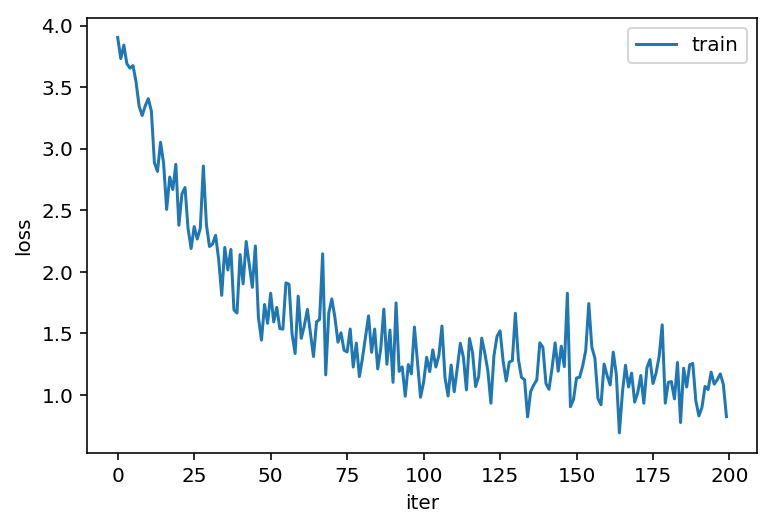

In [21]:
%matplotlib inline
import time
#seq len
input_dim = network_input.shape[1]

model = LSTMGenerator(input_dim, 512,n_vocab, batch_size=64)
model.apply(init_weights)
model.to(device)
loss_function = nn.NLLLoss()
optimizer = optim.RMSprop(model.parameters(), lr=0.001)
loss_logger = []
loss_logger_val = []
# fig = plt.figure()
# ax = fig.add_subplot(1, 1, 1)
# ax.set_xlabel("epochs")
# ax.set_ylabel("loss")
for epoch in range(200):
  print(epoch)
  model.train()
  loss_epoch = []
#   model.zero_grad()
#   model.first_hidden_layer = model.init_hidden()
#   model.second_hidden_layer = model.init_hidden()
  for i, (batch_in, batch_gt) in enumerate(seqs_t_batch(datasets1["train"], 64, True)):
    optimizer.zero_grad()
    model.first_hidden_layer = model.init_hidden()
    model.second_hidden_layer = model.init_hidden()
    
    #prob for the batch
    prediction = model(batch_in.view(batch_in.shape[-1], batch_in.shape[0], -1).float())
    
    log_loss = loss_function(prediction.view(prediction.shape[1], prediction.shape[2]), batch_gt)
#     loss = np.exp(log_loss.item())
    loss = log_loss.item()
    
    if (i * (epoch + 1)) % 100 == 0 and i > 0:
      print("Epoch: {}, Iteration: {}, Loss: {}".format(epoch, i, loss))
      loss_epoch.append(loss)
    log_loss.backward()
    optimizer.step()
    

#   avg_epoch_loss = np.mean(loss_epoch)
  loss_logger.append(loss)
  with open('models/model_{time}_{epoch}_{loss}.pickle'.format(time=time.time(), epoch=epoch,loss=np.mean(loss_epoch)), 'wb') as f:
    pickle.dump(model, f)
#   
#   ax.plot(range(len(loss_logger)), loss_logger)
  plt.plot(range(len(loss_logger)), loss_logger)
  plt.xlabel("iter")
  plt.ylabel("loss")
#   plt.plot(range(len(loss_logger_val)), loss_logger_val)
  plt.legend(['train'])
  plt.show()
#     if i%100 == 0 and i > 0:
#       print("Epoch: {}, Iteration: {}, Loss: {}".format(epoch, i, loss))
#       with torch.no_grad():
#         print(np.argmax(prediction[0][0].cpu().numpy()), batch_gt.cpu()[0].item())
#       loss_epoch.append(loss)
#     log_loss.backward()
#     optimizer.step()
#   avg_epoch_loss = np.mean(loss_epoch)
#   loss_logger.append(avg_epoch_loss)
# #   ax.plot(range(len(loss_logger)), loss_logger)
#   plt.plot(range(len(loss_logger)), loss_logger)
#   plt.show()
#   model.eval()
#   for batch_in,batch_gt in seq_t_b(datasets1["val"], 1):
    
    

In [87]:
""" Generate notes from the neural network based on a sequence of notes """
# pick a random sequence from the input as a starting point for the prediction
test_model = LSTMGenerator(sequence_length, 512, n_vocab, 64)
with open("models/model_1552141957.1376085_198_1.0804298594594002.pickle", 'rb') as model_f:
    m = pickle.load(model_f)
test_model.load_state_dict(m.state_dict())
test_model.to(device)
# start = numpy.random.randint(0, len(network_input)-1)
start = numpy.random.random((1, 64, sequence_length))
int_to_note = dict((number, note) for number, note in enumerate(pitchnames))
# pattern = network_input[start]
pattern = start
print(pattern.shape)
prediction_output = []
# generate 500 notes
test_model.eval()
for i,note_index in enumerate(range(500)):
  prediction_input = np.reshape(pattern, (1, 64, sequence_length))
  prediction_input = torch.Tensor(prediction_input).to(device).float()
  prediction = test_model(prediction_input)
  index = torch.argmax(torch.exp(prediction[0][0])).item()
  result = int_to_note[index]
  print('\r', 'Predicted ', i, " ",result, end='')
  prediction_output.append(result)
  pattern[:-1] = pattern[1:]
  pattern[-1] = index
#   pattern.append(index)
#   pattern = pattern[1:len(pattern)]

(1, 64, 100)
 Predicted  499   7.9

In [99]:
offset = 0
output_notes = []

# create note and chord objects based on the values generated by the model

for pattern in prediction_output:
    # pattern is a chord
    if ('.' in pattern) or pattern.isdigit():
        notes_in_chord = pattern.split('.')
        notes = []
        for current_note in notes_in_chord:
            new_note = note.Note(int(current_note))
            new_note.storedInstrument = instrument.Piano()
            notes.append(new_note)
        new_chord = chord.Chord(notes)
        new_chord.offset = offset
        output_notes.append(new_chord)
    # pattern is a note
    else:
        new_note = note.Note(pattern)
        new_note.offset = offset
        new_note.storedInstrument = instrument.Piano()
        output_notes.append(new_note)

    # increase offset each iteration so that notes do not stack
    offset += 0.5

In [100]:
midi_stream = stream.Stream(output_notes)

midi_stream.write('midi', fp='test_output.mid')

'test_output.mid'

In [96]:
output_notes[2].offset

1.0